In [2]:
import cv2
import numpy as np
import pandas as pd
from matplotlib import pyplot as plt

from mpl_toolkits.mplot3d import Axes3D
from matplotlib import cm
from matplotlib import colors
from skimage import transform

import random
import splitfolders  # or import split_folders
from PIL import Image
import os
import glob

In [2]:
from platform import python_version

print(python_version())

3.9.12


# Data Exploratory for Original Dataset

In [21]:
Path_ori = 'D:/lecture notes/lecture notes/Degree/Year 3/FYP/chosen/processed_new_leaf'
diseases = os.listdir(Path_ori)

In [22]:
print("Total disease classes are: {}".format(len(diseases)))

Total disease classes are: 20


In [23]:
# Number of images for each disease
nums = {}
for disease in diseases:
    nums[disease] = len(os.listdir(Path_ori + '/' + disease))
    
# converting the nums dictionary to pandas dataframe passing index as plant name and number of images as column

img_per_class = pd.DataFrame(nums.values(), index=nums.keys(), columns=["no. of images"])
img_per_class

,no. of images
Cherry_(including_sour)___Powdery_mildew,1051
Corn_(maize)___Common_rust_,1191
Corn_(maize)___Northern_Leaf_Blight,984
Grape___Black_rot,1174
Grape___Esca_(Black_Measles),1382
Grape___Leaf_blight_(Isariopsis_Leaf_Spot),1075
Peach___Bacterial_spot,2296
Pepper_bell___Bacterial_spot,996
Potato___Early_blight,995
Potato___Late_blight,999


In [24]:
n_img = 0
for value in nums.values():
    n_img += value
print(f"There are {n_img} images in total")

There are 31261 images in total


In [25]:
plants = []
u_diseases = []
NumberOfDiseases = 0
diseases = diseases
for plant in diseases:
    if plant.split('___')[0] not in plants:
        plants.append(plant.split('___')[0])
    if plant.split('___')[1] != 'healthy':
        NumberOfDiseases += 1
        u_diseases.append(plant.split('___')[1])

print(f"Unique Diseases: {len(u_diseases)}")
for i in u_diseases:
    print(" ".join(i.split("_")).lower())

Unique Diseases: 20
powdery mildew
common rust 
northern leaf blight
black rot
esca (black measles)
leaf blight (isariopsis leaf spot)
bacterial spot
bacterial spot
early blight
late blight
powdery mildew
leaf scorch
bacterial spot
early blight
late blight
leaf mold
septoria leaf spot
spider mites two-spotted spider mite
target spot
tomato yellow leaf curl virus


In [26]:
print(f"Unique Plants are: \n" + '\n'.join(plants))

Unique Plants are: 
Cherry_(including_sour)
Corn_(maize)
Grape
Peach
Pepper_bell
Potato
Squash
Strawberry
Tomato


In [27]:
# number of unique plants
print("Number of plants: {}".format(len(plants)))

Number of plants: 9


Text(0.5, 1.0, 'Images per each class of plant disease')

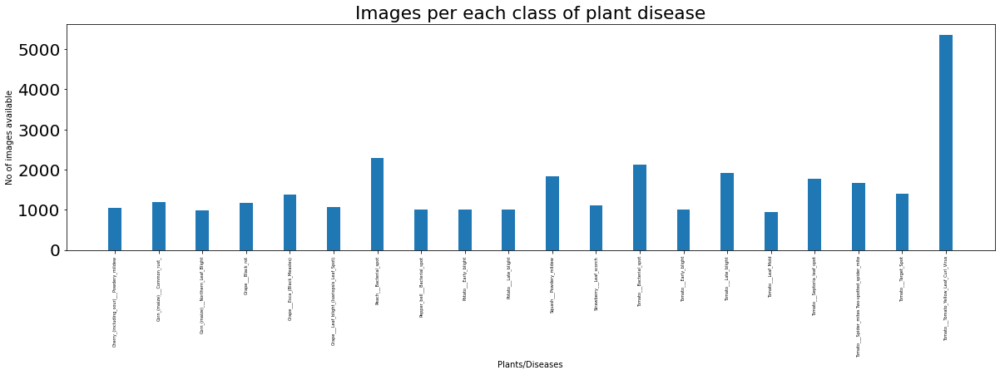

In [43]:
# plotting number of images available for each disease
index = [n for n in range(20)]
plt.figure(figsize=(20, 5))
plt.bar(index, [n for n in nums.values()], width=0.3)
plt.xlabel('Plants/Diseases', fontsize=10)
plt.ylabel('No of images available', fontsize=10)
plt.xticks(index, diseases, fontsize=5, rotation=90)
plt.title('Images per each class of plant disease')

# Data Exploratory for Selected Dataset

In [44]:
#Path = 'D:/lecture notes/lecture notes/Degree/Year 3/FYP/chosen/splitted_new_leaf/train'
Path = 'D:/lecture notes/lecture notes/Degree/Year 3/FYP/chosen/PREPROCESS/Finaru/train'
filelist = os.listdir(Path)

In [45]:
print(filelist)

['Cherry_(including_sour)___Powdery_mildew', 'Corn_(maize)___Common_rust_', 'Corn_(maize)___Northern_Leaf_Blight', 'Grape___Black_rot', 'Grape___Esca_(Black_Measles)', 'Grape___Leaf_blight_(Isariopsis_Leaf_Spot)', 'Peach___Bacterial_spot', 'Pepper_bell___Bacterial_spot', 'Potato___Early_blight', 'Potato___Late_blight', 'Squash___Powdery_mildew', 'Strawberry___Leaf_scorch', 'Tomato___Bacterial_spot', 'Tomato___Early_blight', 'Tomato___Late_blight', 'Tomato___Leaf_Mold', 'Tomato___Septoria_leaf_spot', 'Tomato___Spider_mites Two-spotted_spider_mite', 'Tomato___Target_Spot', 'Tomato___Tomato_Yellow_Leaf_Curl_Virus']


In [46]:
# Create New Folder
# python program to check if a directory exists
"""path = "raw_augment/"
for x in filelist:
    # Check whether the specified path exists or not
    isExist = os.path.exists(path+x)
    if not isExist:
        os.makedirs(path+x)"""
print()

In [47]:
plants = []
u_diseases = []
NumberOfDiseases = 0
diseases = filelist
for plant in diseases:
    if plant.split('___')[0] not in plants:
        plants.append(plant.split('___')[0])
    if plant.split('___')[1] != 'healthy':
        NumberOfDiseases += 1
        u_diseases.append(plant.split('___')[1])

print(f"Unique Diseases: {len(u_diseases)}")
for i in u_diseases:
    print(" ".join(i.split("_")).lower())

Unique Diseases: 20
powdery mildew
common rust 
northern leaf blight
black rot
esca (black measles)
leaf blight (isariopsis leaf spot)
bacterial spot
bacterial spot
early blight
late blight
powdery mildew
leaf scorch
bacterial spot
early blight
late blight
leaf mold
septoria leaf spot
spider mites two-spotted spider mite
target spot
tomato yellow leaf curl virus


In [49]:
# Number of images for each disease
nums = {}
for disease in diseases:
    nums[disease] = len(os.listdir("PREPROCESS/Finaru/train/" + disease))
    #nums[disease] = len(os.listdir("processed_new_leaf/" + disease))
    
    
# converting the nums dictionary to pandas dataframe passing index as plant name and number of images as column

img_per_class = pd.DataFrame(nums.values(), index=nums.keys(), columns=["no. of images"])
img_per_class

,no. of images
Cherry_(including_sour)___Powdery_mildew,1878
Corn_(maize)___Common_rust_,1862
Corn_(maize)___Northern_Leaf_Blight,1829
Grape___Black_rot,1856
Grape___Esca_(Black_Measles),1859
Grape___Leaf_blight_(Isariopsis_Leaf_Spot),1822
Peach___Bacterial_spot,1807
Pepper_bell___Bacterial_spot,1853
Potato___Early_blight,1820
Potato___Late_blight,1804


Text(0.5, 1.0, 'Images per each class of plant disease')

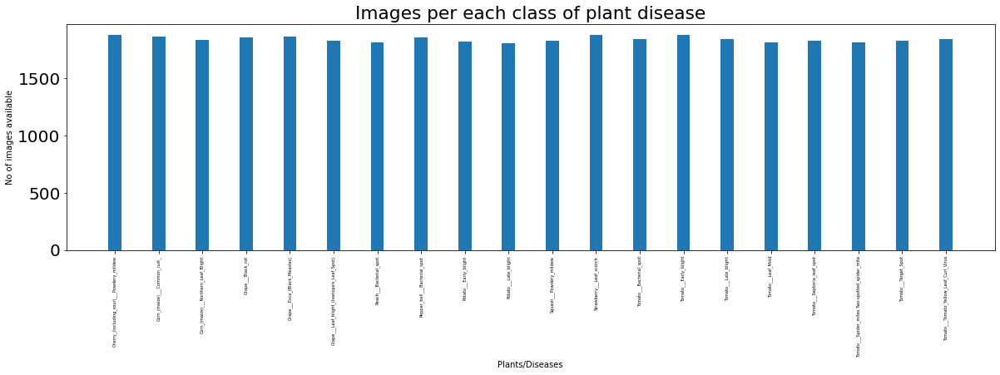

In [50]:
index = [n for n in range(20)]
plt.figure(figsize=(20, 5))
plt.bar(index, [n for n in nums.values()], width=0.3)
plt.xlabel('Plants/Diseases', fontsize=10)
plt.ylabel('No of images available', fontsize=10)
plt.xticks(index, diseases, fontsize=5, rotation=90)
plt.title('Images per each class of plant disease')

# Segmentation + Image-processing

In [202]:
## Segmentation + Image-processing
path = "No_segment/"
#a1 = 80
#b1 = 30
#a2 = 230
#b2 = 200

"""def stretchContrast(p,a1,a2,b1,b2):
    if (0 <= p and p <= a1): # if pixel less than a1
        return (b1 / a1)*p
    elif (a1 < p and p <= a2): # if pixel more than a1, less than a2
        return ((b2 - b1)/(a2 - a1)) * (p - a1) + b1
    else: # if pixel more than a2, less than 255
        return ((255 - b2)/(255 - a2)) * (p - a2) + b2"""
    
for x in filelist:
    print(x)
    img_number = 1
    for file in glob.glob(path+x+"/"+"*.*"):
        print(file)     #just stop here to see all file names printed
        img = cv2.imread(file)  #now, we can read each file since we have the full path
        imgRGB = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
        
        ## Segmentation
        imgHSV = cv2.cvtColor(imgRGB, cv2.COLOR_RGB2HSV)
        # find the green color 
        mask_green = cv2.inRange(imgHSV, (36,15,0), (95,255,255))
        # find the brown color
        mask_brown = cv2.inRange(imgHSV, (8, 60, 20), (30, 255, 200))
        # find the yellow color in the leaf
        mask_yellow = cv2.inRange(imgHSV, (21, 39, 64), (40, 255, 255))

        # find any of the three colors(green or brown or yellow) in the image
        mask = cv2.bitwise_or(mask_green, mask_brown)
        mask = cv2.bitwise_or(mask, mask_yellow)
        
        # Morphology Closing 
        kernel = cv2.getStructuringElement(cv2.MORPH_ELLIPSE,(10,10))

        res = cv2.morphologyEx(mask,cv2.MORPH_CLOSE,kernel)
        
        # Fill hole
        des = res
        contour,hier = cv2.findContours(des,cv2.RETR_CCOMP,cv2.CHAIN_APPROX_SIMPLE)

        for cnt in contour:
            cv2.drawContours(des,[cnt],0,255,-1)

        gray = des
        
        # Segmented 
        segmented = cv2.bitwise_and(imgRGB, imgRGB, mask=gray)
        """img_lab = cv2.cvtColor(img, cv2.COLOR_BGR2LAB)
        
        L = img_lab[:, :, 0]
        a = img_lab[:, :, 1]
        b = img_lab[:, :, 2]
        
        pixel_vals = b.flatten()
        pixel_vals = np.float32(pixel_vals)
        criteria = (cv2.TERM_CRITERIA_EPS + cv2.TERM_CRITERIA_MAX_ITER, 10, 1.0)
        # Since we are interested in only actual leaf pixels, we choose 2 clusters
        # one cluster for actual leaf pixels and other for unwanted background pixels.
        K = 2
        retval, labels, centers = cv2.kmeans(pixel_vals, K, None, criteria, 10, cv2.KMEANS_RANDOM_CENTERS)
        centers = np.uint8(centers)
        segmented_data = centers[labels.flatten()]
        segmented_image = segmented_data.reshape((b.shape))
        pixel_labels = labels.reshape(img_lab.shape[0], img_lab.shape[1])

        segmented_image[segmented_image == segmented_image.min()] = 0
        segmented_image[segmented_image == segmented_image.max()] = 255
        kernel = cv2.getStructuringElement(cv2.MORPH_ELLIPSE,(10,10))

        res = cv2.morphologyEx(segmented_image,cv2.MORPH_CLOSE,kernel)

        des = res.copy()
        contour,hier = cv2.findContours(des,cv2.RETR_CCOMP,cv2.CHAIN_APPROX_SIMPLE)

        for cnt in contour:
            cv2.drawContours(des,[cnt],0,255,-1)

        gray = des

        segmented = cv2.bitwise_and(imgRGB, imgRGB, mask=gray)
        
        ## Pre-processing
        # Image sharpening
        img_conv = imgRGB.astype('float32')

        sm = cv2.blur(img_conv,(11,11))
        #sm = cv2.medianBlur(img_conv,5)

        details = img_conv - sm;
        shp = img_conv + details;
        shp = np.clip(np.float32(shp),0,255)
        shp = shp.astype('uint8')
        
        # Contrast enhancing
        ##stretchContrast_vec = np.vectorize(stretchContrast)

        ##contrast_stretched = stretchContrast_vec(shp, a1, a2, b1, b2)
        ##img_contrast = contrast_stretched.astype('uint8')
        imgg = cv2.cvtColor(shp, cv2.COLOR_RGB2BGR)  
        # converting to LAB color space
        lab= cv2.cvtColor(imgg, cv2.COLOR_RGB2LAB)
        l_channel, a, b = cv2.split(lab)

        # Applying CLAHE to L-channel
        # feel free to try different values for the limit and grid size:
        clahe = cv2.createCLAHE(clipLimit=1.5, tileGridSize=(8,8))
        cl = clahe.apply(l_channel)

        # merge the CLAHE enhanced L-channel with the a and b channel
        limg = cv2.merge((cl,a,b))

        # Converting image from LAB Color model to BGR color spcae
        img_contrast = cv2.cvtColor(limg, cv2.COLOR_LAB2BGR)
        
        #blur = cv2.GaussianBlur(img_contrast,(5,5),cv2.BORDER_DEFAULT)
        blur = cv2.blur(img_contrast,(3,3))"""
        
        # Resizing
        resized = cv2.resize(segmented, (256,256), interpolation = cv2.INTER_AREA)
        
        cv2.imwrite("segmented/" + x + "/" + x + str(img_number) + ".jpg", cv2.cvtColor(resized, cv2.COLOR_RGB2BGR) )
        img_number += 1  

Cherry_(including_sour)___Powdery_mildew
No_segment/Cherry_(including_sour)___Powdery_mildew\00b7df55-c789-43d6-a02e-a579ac9d07e6___FREC_Pwd.M 4748.JPG
No_segment/Cherry_(including_sour)___Powdery_mildew\00e0a4ab-ecbd-4560-a71c-b19d86bb087c___FREC_Pwd.M 4917.JPG
No_segment/Cherry_(including_sour)___Powdery_mildew\00f8611c-0f2c-4f24-8241-d1748c8bb48f___FREC_Pwd.M 0479.JPG
No_segment/Cherry_(including_sour)___Powdery_mildew\012b55cf-de7a-483a-9118-0fd8ff012185___FREC_Pwd.M 0423.JPG
No_segment/Cherry_(including_sour)___Powdery_mildew\02a749ab-890a-4165-9f17-c1e30a56ef41___FREC_Pwd.M 4868.JPG
No_segment/Cherry_(including_sour)___Powdery_mildew\02d6722b-1f47-4f11-b831-be4bba26b158___FREC_Pwd.M 4593.JPG
No_segment/Cherry_(including_sour)___Powdery_mildew\02d6c81a-c5dc-4b29-848a-7a0b8c42e5ed___FREC_Pwd.M 4699.JPG
No_segment/Cherry_(including_sour)___Powdery_mildew\02ecd449-7b27-44d7-b59e-7e31813f0c18___FREC_Pwd.M 0450.JPG
No_segment/Cherry_(including_sour)___Powdery_mildew\03c5abe8-66c5-44d7-

No_segment/Cherry_(including_sour)___Powdery_mildew\1ca9be51-dea4-4075-8907-e583f85254b2___FREC_Pwd.M 4850.JPG
No_segment/Cherry_(including_sour)___Powdery_mildew\1cc8262f-97fa-4259-9c87-d2abd7b284a2___FREC_Pwd.M 0443.JPG
No_segment/Cherry_(including_sour)___Powdery_mildew\1cfdbaaf-526b-45df-a078-758fd4f5c1f3___FREC_Pwd.M 4943.JPG
No_segment/Cherry_(including_sour)___Powdery_mildew\1d792544-0c6e-4d7c-b61f-a4a9e034e630___FREC_Pwd.M 0358.JPG
No_segment/Cherry_(including_sour)___Powdery_mildew\1d8075d8-202f-44a6-821d-a596eb480c5c___FREC_Pwd.M 4576.JPG
No_segment/Cherry_(including_sour)___Powdery_mildew\1d9a02a1-60f6-430f-aef2-5db080ad7f32___FREC_Pwd.M 4993.JPG
No_segment/Cherry_(including_sour)___Powdery_mildew\1e223698-b6c1-4c4d-8762-240c0435ce09___FREC_Pwd.M 5100.JPG
No_segment/Cherry_(including_sour)___Powdery_mildew\1e41d6af-63c2-47c2-8a71-f41e558eadbf___FREC_Pwd.M 4557.JPG
No_segment/Cherry_(including_sour)___Powdery_mildew\1e5a88c6-d50c-4e12-8e9a-93c69595143e___FREC_Pwd.M 4858.JPG
N

No_segment/Cherry_(including_sour)___Powdery_mildew\3578c9a5-57d9-4ed9-bfec-d9f889742827___FREC_Pwd.M 4635.JPG
No_segment/Cherry_(including_sour)___Powdery_mildew\35a85e44-5398-4e77-928f-f268246c62f4___FREC_Pwd.M 4788.JPG
No_segment/Cherry_(including_sour)___Powdery_mildew\35b90fdd-38f4-44b5-ad59-16812595024e___FREC_Pwd.M 4575.JPG
No_segment/Cherry_(including_sour)___Powdery_mildew\35d6c68e-d0c0-49d7-80c5-b3cb2618f933___FREC_Pwd.M 4686.JPG
No_segment/Cherry_(including_sour)___Powdery_mildew\3632065f-bc6e-486c-9f86-c0d37edbb762___FREC_Pwd.M 4487.JPG
No_segment/Cherry_(including_sour)___Powdery_mildew\36875378-8b7e-484f-a557-f1a2d2a9b308___FREC_Pwd.M 4582.JPG
No_segment/Cherry_(including_sour)___Powdery_mildew\36999b1a-e562-4120-bfb6-5acf1988ebc0___FREC_Pwd.M 0477.JPG
No_segment/Cherry_(including_sour)___Powdery_mildew\36ac8741-4a25-4c69-9158-93ec279974fa___FREC_Pwd.M 4528.JPG
No_segment/Cherry_(including_sour)___Powdery_mildew\37d9fccc-2d35-48c0-be73-f56b5a1e7665___FREC_Pwd.M 0303.JPG
N

No_segment/Cherry_(including_sour)___Powdery_mildew\523bfb48-39b8-4267-ade3-b457a91fbe46___FREC_Pwd.M 5088.JPG
No_segment/Cherry_(including_sour)___Powdery_mildew\525e0e62-573a-4a9c-9955-bd2f4ae39bad___FREC_Pwd.M 4531.JPG
No_segment/Cherry_(including_sour)___Powdery_mildew\525ea422-bb9d-47fd-b3e5-cfabf3e989fd___FREC_Pwd.M 4704.JPG
No_segment/Cherry_(including_sour)___Powdery_mildew\52acb15f-d454-40b0-97c9-70078a6f86a1___FREC_Pwd.M 4739.JPG
No_segment/Cherry_(including_sour)___Powdery_mildew\52aea538-85d0-461c-8956-25af2d74a1ac___FREC_Pwd.M 0426.JPG
No_segment/Cherry_(including_sour)___Powdery_mildew\52ecce7d-bcd4-4d36-b455-b0948eb02371___FREC_Pwd.M 4724.JPG
No_segment/Cherry_(including_sour)___Powdery_mildew\52fdca01-c6e8-4903-a8ff-c9825071e6d2___FREC_Pwd.M 0283.JPG
No_segment/Cherry_(including_sour)___Powdery_mildew\535f0fec-14f2-4222-a44a-1e4f52d2ab0c___FREC_Pwd.M 0259.JPG
No_segment/Cherry_(including_sour)___Powdery_mildew\53e65c04-8e61-4867-864d-ba917f0aa939___FREC_Pwd.M 0396.JPG
N

No_segment/Cherry_(including_sour)___Powdery_mildew\6c02f514-7059-4071-8752-4e970ccb4f2e___FREC_Pwd.M 4878.JPG
No_segment/Cherry_(including_sour)___Powdery_mildew\6c194f25-d1cb-48b1-908e-e6a66a0f6ed2___FREC_Pwd.M 5008.JPG
No_segment/Cherry_(including_sour)___Powdery_mildew\6c2861d5-bc13-4296-aa71-1225c3bad7df___FREC_Pwd.M 4804.JPG
No_segment/Cherry_(including_sour)___Powdery_mildew\6c4ba807-3b6f-4041-bc17-c268b52bc05f___FREC_Pwd.M 4623.JPG
No_segment/Cherry_(including_sour)___Powdery_mildew\6ca92452-78c5-422b-bec6-afe04e862a62___FREC_Pwd.M 0341.JPG
No_segment/Cherry_(including_sour)___Powdery_mildew\6cbf80f1-614a-4212-bb74-a926405d3898___FREC_Pwd.M 0286.JPG
No_segment/Cherry_(including_sour)___Powdery_mildew\6ce047de-2793-46c0-8013-beb2e67b468c___FREC_Pwd.M 4765.JPG
No_segment/Cherry_(including_sour)___Powdery_mildew\6d4ccc3a-c410-4d67-8858-e411ad1c4486___FREC_Pwd.M 5007.JPG
No_segment/Cherry_(including_sour)___Powdery_mildew\6d700706-12f6-40a3-b293-699aabce7ba0___FREC_Pwd.M 0288.JPG
N

No_segment/Cherry_(including_sour)___Powdery_mildew\886e024a-ae28-4692-96dd-f8c7a5c38c19___FREC_Pwd.M 4759.JPG
No_segment/Cherry_(including_sour)___Powdery_mildew\890379a9-f446-4f14-af25-bbf4a3544473___FREC_Pwd.M 0391.JPG
No_segment/Cherry_(including_sour)___Powdery_mildew\89735f9b-c046-4689-afee-4633fa0707f3___FREC_Pwd.M 0480.JPG
No_segment/Cherry_(including_sour)___Powdery_mildew\898a840a-b4a5-4f12-830b-434e07538b2e___FREC_Pwd.M 4649.JPG
No_segment/Cherry_(including_sour)___Powdery_mildew\898cc60e-bae8-41c9-9695-cfafff82bce6___FREC_Pwd.M 5091.JPG
No_segment/Cherry_(including_sour)___Powdery_mildew\8a07cd65-72a0-4b6f-a393-7e2d3e3274d0___FREC_Pwd.M 4737.JPG
No_segment/Cherry_(including_sour)___Powdery_mildew\8a3e2835-651b-4e81-8f39-60ac46db2962___FREC_Pwd.M 4897.JPG
No_segment/Cherry_(including_sour)___Powdery_mildew\8a433d5d-7f92-4c12-b8fb-9993de59732f___FREC_Pwd.M 4637.JPG
No_segment/Cherry_(including_sour)___Powdery_mildew\8ad6e23a-7ad5-47a7-a2e3-55655ef64ccd___FREC_Pwd.M 4461.JPG
N

No_segment/Cherry_(including_sour)___Powdery_mildew\a8532f9d-c6c3-44e4-9278-c7350c4adb09___FREC_Pwd.M 0526.JPG
No_segment/Cherry_(including_sour)___Powdery_mildew\a8b20f6d-d2d2-4a5c-aa4e-90b2ed20da0c___FREC_Pwd.M 0540.JPG
No_segment/Cherry_(including_sour)___Powdery_mildew\a90c7766-8136-4a31-b5b3-c20ef2927196___FREC_Pwd.M 4977.JPG
No_segment/Cherry_(including_sour)___Powdery_mildew\a9235bc4-a3f3-4b9e-8e28-d7b2e18bca51___FREC_Pwd.M 0462.JPG
No_segment/Cherry_(including_sour)___Powdery_mildew\a928b766-fc8f-4329-89ab-3c2d3d57a5bd___FREC_Pwd.M 4751.JPG
No_segment/Cherry_(including_sour)___Powdery_mildew\a92ff182-8a3f-486f-81dd-8c866b28e0a6___FREC_Pwd.M 4902.JPG
No_segment/Cherry_(including_sour)___Powdery_mildew\a97ab660-879e-4cc5-a1ff-ae98e0c794e4___FREC_Pwd.M 0488.JPG
No_segment/Cherry_(including_sour)___Powdery_mildew\a98ed458-0abe-4218-bb5f-c5d8c5953aaa___FREC_Pwd.M 5053.JPG
No_segment/Cherry_(including_sour)___Powdery_mildew\a993dae5-7b74-4416-87eb-2eea9f3609c4___FREC_Pwd.M 4499.JPG
N

No_segment/Cherry_(including_sour)___Powdery_mildew\c79bd6b7-b4a6-4d95-a9b6-46e7c89953b6___FREC_Pwd.M 4690.JPG
No_segment/Cherry_(including_sour)___Powdery_mildew\c7a8f6b2-2721-4c65-81ea-fc87fc8f3a27___FREC_Pwd.M 0445.JPG
No_segment/Cherry_(including_sour)___Powdery_mildew\c7cb523b-78cc-4c1b-baaf-8de4bb43aa0b___FREC_Pwd.M 4946.JPG
No_segment/Cherry_(including_sour)___Powdery_mildew\c7f47cac-6806-4522-8e64-b633250cedfc___FREC_Pwd.M 5164.JPG
No_segment/Cherry_(including_sour)___Powdery_mildew\c82e8bfd-a4d6-448f-9c6c-1da54df1e12f___FREC_Pwd.M 4547.JPG
No_segment/Cherry_(including_sour)___Powdery_mildew\c86a51cc-d1a2-4fb2-b6b5-2866331631e9___FREC_Pwd.M 5089.JPG
No_segment/Cherry_(including_sour)___Powdery_mildew\c871d4ee-1726-4873-9e5c-ffe67de425fb___FREC_Pwd.M 4705.JPG
No_segment/Cherry_(including_sour)___Powdery_mildew\c8c3b247-8cec-4103-8acb-0ae5d6655cee___FREC_Pwd.M 4659.JPG
No_segment/Cherry_(including_sour)___Powdery_mildew\c984c421-82d1-443e-9a92-ee39009ce2b2___FREC_Pwd.M 4681.JPG
N

No_segment/Cherry_(including_sour)___Powdery_mildew\e351c2d8-2fad-49af-9994-7d4f95cbf1e2___FREC_Pwd.M 5033.JPG
No_segment/Cherry_(including_sour)___Powdery_mildew\e3812313-eba4-4456-8ee8-d9d35af975e8___FREC_Pwd.M 4828.JPG
No_segment/Cherry_(including_sour)___Powdery_mildew\e3b59f01-3677-4616-af6c-d026b9e0e6cf___FREC_Pwd.M 0398.JPG
No_segment/Cherry_(including_sour)___Powdery_mildew\e3d4af8b-baa3-48bd-86ad-6d98e821c4e0___FREC_Pwd.M 4983.JPG
No_segment/Cherry_(including_sour)___Powdery_mildew\e3d5a32d-3567-44f4-8ea2-79b413214a6d___FREC_Pwd.M 5144.JPG
No_segment/Cherry_(including_sour)___Powdery_mildew\e3e0ee86-1cf9-449c-8cba-7ad0b0cd4488___FREC_Pwd.M 0460.JPG
No_segment/Cherry_(including_sour)___Powdery_mildew\e3e163b5-48e0-4820-8140-6353bf6ab71d___FREC_Pwd.M 0270.JPG
No_segment/Cherry_(including_sour)___Powdery_mildew\e567184a-cee1-4eb4-be59-429da00b17d8___FREC_Pwd.M 4465.JPG
No_segment/Cherry_(including_sour)___Powdery_mildew\e57a51c0-d0c0-46a1-a298-4c9cfd0337e2___FREC_Pwd.M 4778.JPG
N

No_segment/Cherry_(including_sour)___Powdery_mildew\fd16a9a9-e8d6-4122-b393-a31e787b9d28___FREC_Pwd.M 4762.JPG
No_segment/Cherry_(including_sour)___Powdery_mildew\fd437fb9-f319-4f40-9142-b8800bccd21e___FREC_Pwd.M 5142.JPG
No_segment/Cherry_(including_sour)___Powdery_mildew\fd7fbe5c-d234-4c16-b587-faed3407e2dd___FREC_Pwd.M 0474.JPG
No_segment/Cherry_(including_sour)___Powdery_mildew\fd8d4072-e0b3-4936-95c2-e2d6dc6d22b0___FREC_Pwd.M 0250.JPG
No_segment/Cherry_(including_sour)___Powdery_mildew\fded10e6-0668-43d4-be77-e091cafc25fd___FREC_Pwd.M 0538.JPG
No_segment/Cherry_(including_sour)___Powdery_mildew\fdfada36-240c-4274-afd3-fc159f236d36___FREC_Pwd.M 4831.JPG
No_segment/Cherry_(including_sour)___Powdery_mildew\fe4079cc-20c7-4c71-bd2f-a07e97c8e392___FREC_Pwd.M 4511.JPG
No_segment/Cherry_(including_sour)___Powdery_mildew\fe410980-15d4-472d-b8e6-4fece7d302ee___FREC_Pwd.M 4949.JPG
No_segment/Cherry_(including_sour)___Powdery_mildew\ff2a06ae-9fc1-4436-bfcd-346a18dd5bfb___FREC_Pwd.M 4840.JPG
N

No_segment/Corn_(maize)___Common_rust_\RS_Rust 1693.JPG
No_segment/Corn_(maize)___Common_rust_\RS_Rust 1694.JPG
No_segment/Corn_(maize)___Common_rust_\RS_Rust 1695.JPG
No_segment/Corn_(maize)___Common_rust_\RS_Rust 1696.JPG
No_segment/Corn_(maize)___Common_rust_\RS_Rust 1697.JPG
No_segment/Corn_(maize)___Common_rust_\RS_Rust 1698.JPG
No_segment/Corn_(maize)___Common_rust_\RS_Rust 1699.JPG
No_segment/Corn_(maize)___Common_rust_\RS_Rust 1700.JPG
No_segment/Corn_(maize)___Common_rust_\RS_Rust 1701.JPG
No_segment/Corn_(maize)___Common_rust_\RS_Rust 1702.JPG
No_segment/Corn_(maize)___Common_rust_\RS_Rust 1703.JPG
No_segment/Corn_(maize)___Common_rust_\RS_Rust 1704.JPG
No_segment/Corn_(maize)___Common_rust_\RS_Rust 1705.JPG
No_segment/Corn_(maize)___Common_rust_\RS_Rust 1706.JPG
No_segment/Corn_(maize)___Common_rust_\RS_Rust 1707.JPG
No_segment/Corn_(maize)___Common_rust_\RS_Rust 1708.JPG
No_segment/Corn_(maize)___Common_rust_\RS_Rust 1709.JPG
No_segment/Corn_(maize)___Common_rust_\RS_Rust 1

No_segment/Corn_(maize)___Common_rust_\RS_Rust 1879.JPG
No_segment/Corn_(maize)___Common_rust_\RS_Rust 1880.JPG
No_segment/Corn_(maize)___Common_rust_\RS_Rust 1881.JPG
No_segment/Corn_(maize)___Common_rust_\RS_Rust 1882.JPG
No_segment/Corn_(maize)___Common_rust_\RS_Rust 1883.JPG
No_segment/Corn_(maize)___Common_rust_\RS_Rust 1884.JPG
No_segment/Corn_(maize)___Common_rust_\RS_Rust 1885.JPG
No_segment/Corn_(maize)___Common_rust_\RS_Rust 1886.JPG
No_segment/Corn_(maize)___Common_rust_\RS_Rust 1887.JPG
No_segment/Corn_(maize)___Common_rust_\RS_Rust 1888.JPG
No_segment/Corn_(maize)___Common_rust_\RS_Rust 1889.JPG
No_segment/Corn_(maize)___Common_rust_\RS_Rust 1890.JPG
No_segment/Corn_(maize)___Common_rust_\RS_Rust 1891.JPG
No_segment/Corn_(maize)___Common_rust_\RS_Rust 1892.JPG
No_segment/Corn_(maize)___Common_rust_\RS_Rust 1893.JPG
No_segment/Corn_(maize)___Common_rust_\RS_Rust 1894.JPG
No_segment/Corn_(maize)___Common_rust_\RS_Rust 1895.JPG
No_segment/Corn_(maize)___Common_rust_\RS_Rust 1

No_segment/Corn_(maize)___Common_rust_\RS_Rust 2045.JPG
No_segment/Corn_(maize)___Common_rust_\RS_Rust 2046.JPG
No_segment/Corn_(maize)___Common_rust_\RS_Rust 2047.JPG
No_segment/Corn_(maize)___Common_rust_\RS_Rust 2048.JPG
No_segment/Corn_(maize)___Common_rust_\RS_Rust 2049.JPG
No_segment/Corn_(maize)___Common_rust_\RS_Rust 2050.JPG
No_segment/Corn_(maize)___Common_rust_\RS_Rust 2051.JPG
No_segment/Corn_(maize)___Common_rust_\RS_Rust 2052.JPG
No_segment/Corn_(maize)___Common_rust_\RS_Rust 2053.JPG
No_segment/Corn_(maize)___Common_rust_\RS_Rust 2054.JPG
No_segment/Corn_(maize)___Common_rust_\RS_Rust 2055.JPG
No_segment/Corn_(maize)___Common_rust_\RS_Rust 2056.JPG
No_segment/Corn_(maize)___Common_rust_\RS_Rust 2057.JPG
No_segment/Corn_(maize)___Common_rust_\RS_Rust 2058.JPG
No_segment/Corn_(maize)___Common_rust_\RS_Rust 2059.JPG
No_segment/Corn_(maize)___Common_rust_\RS_Rust 2060.JPG
No_segment/Corn_(maize)___Common_rust_\RS_Rust 2061.JPG
No_segment/Corn_(maize)___Common_rust_\RS_Rust 2

No_segment/Corn_(maize)___Common_rust_\RS_Rust 2235.JPG
No_segment/Corn_(maize)___Common_rust_\RS_Rust 2236.JPG
No_segment/Corn_(maize)___Common_rust_\RS_Rust 2237.JPG
No_segment/Corn_(maize)___Common_rust_\RS_Rust 2238.JPG
No_segment/Corn_(maize)___Common_rust_\RS_Rust 2239.JPG
No_segment/Corn_(maize)___Common_rust_\RS_Rust 2240.JPG
No_segment/Corn_(maize)___Common_rust_\RS_Rust 2241.JPG
No_segment/Corn_(maize)___Common_rust_\RS_Rust 2242.JPG
No_segment/Corn_(maize)___Common_rust_\RS_Rust 2243.JPG
No_segment/Corn_(maize)___Common_rust_\RS_Rust 2244.JPG
No_segment/Corn_(maize)___Common_rust_\RS_Rust 2245.JPG
No_segment/Corn_(maize)___Common_rust_\RS_Rust 2246.JPG
No_segment/Corn_(maize)___Common_rust_\RS_Rust 2247.JPG
No_segment/Corn_(maize)___Common_rust_\RS_Rust 2248.JPG
No_segment/Corn_(maize)___Common_rust_\RS_Rust 2249.JPG
No_segment/Corn_(maize)___Common_rust_\RS_Rust 2250.JPG
No_segment/Corn_(maize)___Common_rust_\RS_Rust 2251.JPG
No_segment/Corn_(maize)___Common_rust_\RS_Rust 2

No_segment/Corn_(maize)___Common_rust_\RS_Rust 2384.JPG
No_segment/Corn_(maize)___Common_rust_\RS_Rust 2385.JPG
No_segment/Corn_(maize)___Common_rust_\RS_Rust 2386.JPG
No_segment/Corn_(maize)___Common_rust_\RS_Rust 2389.JPG
No_segment/Corn_(maize)___Common_rust_\RS_Rust 2390.JPG
No_segment/Corn_(maize)___Common_rust_\RS_Rust 2391.JPG
No_segment/Corn_(maize)___Common_rust_\RS_Rust 2392.JPG
No_segment/Corn_(maize)___Common_rust_\RS_Rust 2393.JPG
No_segment/Corn_(maize)___Common_rust_\RS_Rust 2394.JPG
No_segment/Corn_(maize)___Common_rust_\RS_Rust 2395.JPG
No_segment/Corn_(maize)___Common_rust_\RS_Rust 2396.JPG
No_segment/Corn_(maize)___Common_rust_\RS_Rust 2398.JPG
No_segment/Corn_(maize)___Common_rust_\RS_Rust 2399.JPG
No_segment/Corn_(maize)___Common_rust_\RS_Rust 2400.JPG
No_segment/Corn_(maize)___Common_rust_\RS_Rust 2401.JPG
No_segment/Corn_(maize)___Common_rust_\RS_Rust 2402.JPG
No_segment/Corn_(maize)___Common_rust_\RS_Rust 2403.JPG
No_segment/Corn_(maize)___Common_rust_\RS_Rust 2

No_segment/Corn_(maize)___Common_rust_\RS_Rust 2576.JPG
No_segment/Corn_(maize)___Common_rust_\RS_Rust 2577.JPG
No_segment/Corn_(maize)___Common_rust_\RS_Rust 2578.JPG
No_segment/Corn_(maize)___Common_rust_\RS_Rust 2579.JPG
No_segment/Corn_(maize)___Common_rust_\RS_Rust 2580.JPG
No_segment/Corn_(maize)___Common_rust_\RS_Rust 2581.JPG
No_segment/Corn_(maize)___Common_rust_\RS_Rust 2582.JPG
No_segment/Corn_(maize)___Common_rust_\RS_Rust 2583.JPG
No_segment/Corn_(maize)___Common_rust_\RS_Rust 2584.JPG
No_segment/Corn_(maize)___Common_rust_\RS_Rust 2585.JPG
No_segment/Corn_(maize)___Common_rust_\RS_Rust 2586.JPG
No_segment/Corn_(maize)___Common_rust_\RS_Rust 2587.JPG
No_segment/Corn_(maize)___Common_rust_\RS_Rust 2588.JPG
No_segment/Corn_(maize)___Common_rust_\RS_Rust 2589.JPG
No_segment/Corn_(maize)___Common_rust_\RS_Rust 2590.JPG
No_segment/Corn_(maize)___Common_rust_\RS_Rust 2591.JPG
No_segment/Corn_(maize)___Common_rust_\RS_Rust 2592.JPG
No_segment/Corn_(maize)___Common_rust_\RS_Rust 2

No_segment/Corn_(maize)___Common_rust_\RS_Rust 2729.JPG
No_segment/Corn_(maize)___Common_rust_\RS_Rust 2730.JPG
No_segment/Corn_(maize)___Common_rust_\RS_Rust 2731.JPG
No_segment/Corn_(maize)___Common_rust_\RS_Rust 2732.JPG
No_segment/Corn_(maize)___Common_rust_\RS_Rust 2733.JPG
No_segment/Corn_(maize)___Common_rust_\RS_Rust 2734.JPG
No_segment/Corn_(maize)___Common_rust_\RS_Rust 2735.JPG
No_segment/Corn_(maize)___Common_rust_\RS_Rust 2736.JPG
No_segment/Corn_(maize)___Common_rust_\RS_Rust 2737.JPG
No_segment/Corn_(maize)___Common_rust_\RS_Rust 2738.JPG
No_segment/Corn_(maize)___Common_rust_\RS_Rust 2739.JPG
No_segment/Corn_(maize)___Common_rust_\RS_Rust 2740.JPG
No_segment/Corn_(maize)___Common_rust_\RS_Rust 2741.JPG
No_segment/Corn_(maize)___Common_rust_\RS_Rust 2742.JPG
No_segment/Corn_(maize)___Common_rust_\RS_Rust 2743.JPG
No_segment/Corn_(maize)___Common_rust_\RS_Rust 2744.JPG
No_segment/Corn_(maize)___Common_rust_\RS_Rust 2745.JPG
No_segment/Corn_(maize)___Common_rust_\RS_Rust 2

No_segment/Corn_(maize)___Northern_Leaf_Blight\162b2f34-0fa5-49ca-8996-ef495e8ef6c6___RS_NLB 3484.JPG
No_segment/Corn_(maize)___Northern_Leaf_Blight\17cc72b5-9af2-4988-8b4d-f79a4054e26d___RS_NLB 3968.JPG
No_segment/Corn_(maize)___Northern_Leaf_Blight\180b911a-5c9f-4c76-972a-999e81d3b772___RS_NLB 3710.JPG
No_segment/Corn_(maize)___Northern_Leaf_Blight\18bfb36b-a816-43b4-8338-fe8793d91f04___RS_NLB 3665.JPG
No_segment/Corn_(maize)___Northern_Leaf_Blight\18c8ef79-bb1f-4021-aef3-1604fca63949___RS_NLB 3495.JPG
No_segment/Corn_(maize)___Northern_Leaf_Blight\1955cc33-ecd0-4853-9743-3620d815bbfd___RS_NLB 3577.JPG
No_segment/Corn_(maize)___Northern_Leaf_Blight\1987a377-5cf3-4b21-85af-a738b76cd0ee___RS_NLB 3886.JPG
No_segment/Corn_(maize)___Northern_Leaf_Blight\19b752b4-9c83-48ab-96dc-d6756644680a___RS_NLB 3581.JPG
No_segment/Corn_(maize)___Northern_Leaf_Blight\19d09715-275b-473b-a1e5-4febed1421db___RS_NLB 3703.JPG
No_segment/Corn_(maize)___Northern_Leaf_Blight\1a11d38d-9be6-425c-bc0a-c0f158d6f5d

No_segment/Corn_(maize)___Northern_Leaf_Blight\311621c2-ce96-4e4d-ae49-b303619e1f9f___RS_NLB 3632.JPG
No_segment/Corn_(maize)___Northern_Leaf_Blight\3138c754-7a79-4d77-8556-edbbf78184d4___RS_NLB 4084.JPG
No_segment/Corn_(maize)___Northern_Leaf_Blight\3146b6fc-7fe8-4b26-bc9f-faf642acc8b5___RS_NLB 3829.JPG
No_segment/Corn_(maize)___Northern_Leaf_Blight\3146c9fd-b7eb-4e06-b063-6d9de01a645f___RS_NLB 4222.JPG
No_segment/Corn_(maize)___Northern_Leaf_Blight\315d38b6-f633-4d3f-b85f-69fc6999daa8___RS_NLB 4212.JPG
No_segment/Corn_(maize)___Northern_Leaf_Blight\3164b99c-5a51-4a73-8716-8e2f6548bf8b___RS_NLB 3541.JPG
No_segment/Corn_(maize)___Northern_Leaf_Blight\31a49b40-0f0a-496d-a3bc-cf566bbbe845___RS_NLB 3568.JPG
No_segment/Corn_(maize)___Northern_Leaf_Blight\31a6d935-89b5-4feb-8fc6-44300ab3639e___RS_NLB 3640.JPG
No_segment/Corn_(maize)___Northern_Leaf_Blight\320dcbe6-2ac8-47bb-a5ac-06c966674732___RS_NLB 4281.JPG
No_segment/Corn_(maize)___Northern_Leaf_Blight\3276b41a-3a52-4c98-9e4e-66eb6be6a43

No_segment/Corn_(maize)___Northern_Leaf_Blight\4fb94993-2201-4b0f-bd6f-864b76774df8___RS_NLB 3835.JPG
No_segment/Corn_(maize)___Northern_Leaf_Blight\4fbae838-e991-4294-9126-7ab7d7838349___RS_NLB 4046.JPG
No_segment/Corn_(maize)___Northern_Leaf_Blight\4fd7db79-097d-4344-a4fa-3657421fe654___RS_NLB 0800.JPG
No_segment/Corn_(maize)___Northern_Leaf_Blight\4feaacb9-a17f-4b39-85d5-85e5fb9997a3___RS_NLB 3575.JPG
No_segment/Corn_(maize)___Northern_Leaf_Blight\505ce513-98a9-4100-b7a0-f0767eb598c8___RS_NLB 4206.JPG
No_segment/Corn_(maize)___Northern_Leaf_Blight\506d1785-00e5-476a-94e1-a3e96dd22cb5___RS_NLB 3739.JPG
No_segment/Corn_(maize)___Northern_Leaf_Blight\50f917f3-8a84-4379-adc3-ee0501043f4c___RS_NLB 3718.JPG
No_segment/Corn_(maize)___Northern_Leaf_Blight\516ebf4e-2572-4ba9-aefe-4d11fbb374b5___RS_NLB 4082.JPG
No_segment/Corn_(maize)___Northern_Leaf_Blight\520410b0-012a-4c6e-af78-a6971ddfb612___RS_NLB 3835 copy 2.jpg
No_segment/Corn_(maize)___Northern_Leaf_Blight\528ff748-bf1c-4b75-99ac-643c

No_segment/Corn_(maize)___Northern_Leaf_Blight\6868de8b-1a90-448d-93e8-265f2fa401dd___RS_NLB 3929.JPG
No_segment/Corn_(maize)___Northern_Leaf_Blight\6880b763-1f12-4d80-9aa8-a2b8eecaed1a___RS_NLB 3543.JPG
No_segment/Corn_(maize)___Northern_Leaf_Blight\699bf6c9-fe54-4f33-84c2-559329820008___RS_NLB 4083.JPG
No_segment/Corn_(maize)___Northern_Leaf_Blight\699c9da1-1968-469b-aab5-35b9856c04b4___RS_NLB 3776.JPG
No_segment/Corn_(maize)___Northern_Leaf_Blight\69ac9833-5f27-4fd4-b117-8ca2de2a2db3___RS_NLB 3482.JPG
No_segment/Corn_(maize)___Northern_Leaf_Blight\69ba838d-6ea2-4845-8d69-53d9a437d56e___RS_NLB 4171.JPG
No_segment/Corn_(maize)___Northern_Leaf_Blight\69ebacf6-aff4-40d5-82de-95624c131503___RS_NLB 3526.JPG
No_segment/Corn_(maize)___Northern_Leaf_Blight\6a43e0eb-5366-4170-9782-12c16a853d04___RS_NLB 3519.JPG
No_segment/Corn_(maize)___Northern_Leaf_Blight\6a721f5c-1637-4926-b19c-43a82b064100___RS_NLB 4274.JPG
No_segment/Corn_(maize)___Northern_Leaf_Blight\6a72d38e-1bde-4d45-892d-891574de8ca

No_segment/Corn_(maize)___Northern_Leaf_Blight\7d5fedec-591d-4f0c-a759-1984b5366e1c___RS_NLB 4691.JPG
No_segment/Corn_(maize)___Northern_Leaf_Blight\7dcf62d0-3500-4902-bfe8-e5eab0dcdcaa___RS_NLB 4119.JPG
No_segment/Corn_(maize)___Northern_Leaf_Blight\7df4e119-8ef5-43db-a3dd-7e9a0303eff7___RS_NLB 0799.JPG
No_segment/Corn_(maize)___Northern_Leaf_Blight\7e166c87-7c2a-4469-bd43-b5782f740700___RS_NLB 3837.JPG
No_segment/Corn_(maize)___Northern_Leaf_Blight\7e4e9a08-b9c5-46ec-b92b-ebd0cade32e3___RS_NLB 3942.JPG
No_segment/Corn_(maize)___Northern_Leaf_Blight\7f308111-9ef3-4ee0-b820-0af9743f8040___RS_NLB 3547 copy.jpg
No_segment/Corn_(maize)___Northern_Leaf_Blight\7f52f749-dad1-4042-8c73-52fc7e3ac99e___RS_NLB 3778.JPG
No_segment/Corn_(maize)___Northern_Leaf_Blight\7f5a02de-b04a-4476-8bfe-dc0980913892___RS_NLB 0804.JPG
No_segment/Corn_(maize)___Northern_Leaf_Blight\7f6ca3f9-1023-45f1-9f1c-bd530355367f___RS_NLB 4175.JPG
No_segment/Corn_(maize)___Northern_Leaf_Blight\7f79300d-eb62-4e8d-8eeb-6c6097

No_segment/Corn_(maize)___Northern_Leaf_Blight\9986cb1f-ac94-4f95-b9a1-3815296b66cb___RS_NLB 3806 copy 2.jpg
No_segment/Corn_(maize)___Northern_Leaf_Blight\99ee381f-c18c-4cf4-b62a-af315af69d5d___RS_NLB 3493.JPG
No_segment/Corn_(maize)___Northern_Leaf_Blight\99f77104-ed40-46c6-aed2-91c58cc3ffa7___RS_NLB 4246.JPG
No_segment/Corn_(maize)___Northern_Leaf_Blight\99ff5228-10ed-433b-bb50-1a1c7869a58d___RS_NLB 4253.JPG
No_segment/Corn_(maize)___Northern_Leaf_Blight\9a16ff5e-7227-4739-8e42-f1bc3e478acf___RS_NLB 3699.JPG
No_segment/Corn_(maize)___Northern_Leaf_Blight\9a4feadf-4940-4c42-9dd8-18f0e98c4c58___RS_NLB 3539.JPG
No_segment/Corn_(maize)___Northern_Leaf_Blight\9b49dc45-f159-4d0e-af91-daa06f792e8b___RS_NLB 0797.JPG
No_segment/Corn_(maize)___Northern_Leaf_Blight\9b687075-05f7-43ad-86f3-3c0a784743ab___RS_NLB 3909.JPG
No_segment/Corn_(maize)___Northern_Leaf_Blight\9bc5549b-6193-4d07-961c-e9a3a3f639ba___RS_NLB 0788.JPG
No_segment/Corn_(maize)___Northern_Leaf_Blight\9c75d1f3-9a11-4b76-90cc-ade6

No_segment/Corn_(maize)___Northern_Leaf_Blight\b68a6a63-8711-4f14-a5c6-ddcd8a2cae3e___RS_NLB 3847.JPG
No_segment/Corn_(maize)___Northern_Leaf_Blight\b7006121-2aa1-4f79-a5e2-e731a1c1eb60___RS_NLB 4093.JPG
No_segment/Corn_(maize)___Northern_Leaf_Blight\b7494cf3-21b0-4673-9df9-18841854c3af___RS_NLB 3930.JPG
No_segment/Corn_(maize)___Northern_Leaf_Blight\b761537f-f90f-43a6-a816-6d515dfa0e26___RS_NLB 3797.JPG
No_segment/Corn_(maize)___Northern_Leaf_Blight\b7cbd856-9fad-43a3-9b98-64b7b31c0f76___RS_NLB 4065.JPG
No_segment/Corn_(maize)___Northern_Leaf_Blight\b7cc5fb5-a617-4137-bd5f-2236413ec4bc___RS_NLB 3794.JPG
No_segment/Corn_(maize)___Northern_Leaf_Blight\b7ec2193-2a49-43b9-9962-7a13d472e668___RS_NLB 4044.JPG
No_segment/Corn_(maize)___Northern_Leaf_Blight\b7fc574e-e12e-4dc5-94c2-698892884e66___RS_NLB 0817.JPG
No_segment/Corn_(maize)___Northern_Leaf_Blight\b8313909-4b3a-4d5e-9d9b-616e5749bf3d___RS_NLB 4086.JPG
No_segment/Corn_(maize)___Northern_Leaf_Blight\b84feecb-e6b0-44e2-a1eb-7be061ac28b

No_segment/Corn_(maize)___Northern_Leaf_Blight\cc16b64e-a394-4485-a7b6-9236d5601e2c___RS_NLB 3781.JPG
No_segment/Corn_(maize)___Northern_Leaf_Blight\cc3c5678-ed5a-43f6-bf74-5c13e9ee71ee___RS_NLB 3651.JPG
No_segment/Corn_(maize)___Northern_Leaf_Blight\cc76de91-e4bf-4d71-a74f-0f2a28ce7f9b___RS_NLB 4013.JPG
No_segment/Corn_(maize)___Northern_Leaf_Blight\cc926ea7-7824-4f6d-8c2b-837771ffdbee___RS_NLB 4142.JPG
No_segment/Corn_(maize)___Northern_Leaf_Blight\ccb8b8c4-840f-44b4-9a6e-43109f828b8c___RS_NLB 4091.JPG
No_segment/Corn_(maize)___Northern_Leaf_Blight\cce27cf2-5ec0-4418-bbc1-493c1f899a38___RS_NLB 4204.JPG
No_segment/Corn_(maize)___Northern_Leaf_Blight\cd0b6059-1250-4230-bdd6-488f75143df6___RS_NLB 3596.JPG
No_segment/Corn_(maize)___Northern_Leaf_Blight\cd2c4993-7fe9-42dc-a96e-7a8892f4b2d8___RS_NLB 3834 copy 2.jpg
No_segment/Corn_(maize)___Northern_Leaf_Blight\cd8e6562-3a13-4c9c-9fdb-55df3e8f578a___RS_NLB 3854.JPG
No_segment/Corn_(maize)___Northern_Leaf_Blight\ce1af083-ea99-4aeb-9f66-c3bd

No_segment/Corn_(maize)___Northern_Leaf_Blight\dda73df7-96ed-453c-8d53-21549a980bc7___RS_NLB 4182.JPG
No_segment/Corn_(maize)___Northern_Leaf_Blight\ddd3bb1b-ef88-4426-a7bb-2b61422df6e2___RS_NLB 4057 copy3.jpg
No_segment/Corn_(maize)___Northern_Leaf_Blight\de023021-3b7a-4b88-bb83-7bcb09f80b6a___RS_NLB 4666 copy.jpg
No_segment/Corn_(maize)___Northern_Leaf_Blight\de06fdbb-04cf-4e7b-9e1d-6162f11b3dea___RS_NLB 3481.JPG
No_segment/Corn_(maize)___Northern_Leaf_Blight\dee1d236-d052-475e-a34e-dfdc75d12412___RS_NLB 4223.JPG
No_segment/Corn_(maize)___Northern_Leaf_Blight\def2064a-8470-447e-bfb2-f76ecb3006cd___RS_NLB 0789.JPG
No_segment/Corn_(maize)___Northern_Leaf_Blight\df1c48d9-2413-4d2d-8a0a-b60a708d32f2___RS_NLB 3955.JPG
No_segment/Corn_(maize)___Northern_Leaf_Blight\e0246bcb-949d-4ea8-b517-f6dfb7e7526d___RS_NLB 4107.JPG
No_segment/Corn_(maize)___Northern_Leaf_Blight\e04b792b-62d1-4447-b9e2-cf3b8f565883___RS_NLB 3879.JPG
No_segment/Corn_(maize)___Northern_Leaf_Blight\e09f88c6-ca04-4f63-bc86-

No_segment/Corn_(maize)___Northern_Leaf_Blight\f13d43cb-e365-4df6-aac8-746e4d6d7dab___RS_NLB 3528.JPG
No_segment/Corn_(maize)___Northern_Leaf_Blight\f23ac0bb-a341-45d3-9e3d-8180658ddc96___RS_NLB 4230.JPG
No_segment/Corn_(maize)___Northern_Leaf_Blight\f2486598-1ee4-4fde-9d9a-5684f2cbdae3___RS_NLB 3784.JPG
No_segment/Corn_(maize)___Northern_Leaf_Blight\f24a6c41-64fd-42c1-a0ea-501441fcbf64___RS_NLB 3805 copy 2.jpg
No_segment/Corn_(maize)___Northern_Leaf_Blight\f25476a1-6701-4519-a20e-075643e5359e___RS_NLB 0815.JPG
No_segment/Corn_(maize)___Northern_Leaf_Blight\f283c7ad-19cf-4e5f-a2cb-d1123610b077___RS_NLB 3573.JPG
No_segment/Corn_(maize)___Northern_Leaf_Blight\f291f62a-d6f6-4f1e-92af-d6177b154263___RS_NLB 3662.JPG
No_segment/Corn_(maize)___Northern_Leaf_Blight\f301b26e-ec9c-4d03-94fa-28a2a8fe617a___RS_NLB 4254.JPG
No_segment/Corn_(maize)___Northern_Leaf_Blight\f3141371-5c55-4cf4-988a-6c322de0c6ec___RS_NLB 3486 copy 2.jpg
No_segment/Corn_(maize)___Northern_Leaf_Blight\f339c8f8-0de3-427f-86

No_segment/Grape___Black_rot\0a06c482-c94a-44d8-a895-be6fe17b8c06___FAM_B.Rot 5019.JPG
No_segment/Grape___Black_rot\0a274d5f-9705-445d-a580-a887447ec353___FAM_B.Rot 3147.JPG
No_segment/Grape___Black_rot\0a31549c-8adb-4acc-bab2-a0954f063054___FAM_B.Rot 0687.JPG
No_segment/Grape___Black_rot\0abb363c-2365-4816-a6c4-ce4bac6ffc38___FAM_B.Rot 3122.JPG
No_segment/Grape___Black_rot\0aec6325-48be-4373-886d-fff5aeea6d26___FAM_B.Rot 3465.JPG
No_segment/Grape___Black_rot\0aff8add-93ad-4099-97ae-23515744e620___FAM_B.Rot 0748.JPG
No_segment/Grape___Black_rot\0b11ac6a-9e24-4d9c-bbe9-e180eb81ff38___FAM_B.Rot 0581.JPG
No_segment/Grape___Black_rot\0b9d95bb-51c7-40f1-8a4b-f9838becb418___FAM_B.Rot 0493.JPG
No_segment/Grape___Black_rot\0baabe1e-b188-4c55-8f61-0f484f90c73b___FAM_B.Rot 3532.JPG
No_segment/Grape___Black_rot\0bc6da94-2f94-4e4f-8858-b1a855dffbdf___FAM_B.Rot 3420.JPG
No_segment/Grape___Black_rot\0bfeae5e-878a-45ac-b62c-fbdfa9577874___FAM_B.Rot 0501.JPG
No_segment/Grape___Black_rot\0c7369b1-b8f1-

No_segment/Grape___Black_rot\2860c88f-4efe-4925-910a-a8b6cea599f7___FAM_B.Rot 3209.JPG
No_segment/Grape___Black_rot\287d7355-de96-49aa-8835-2ddaa01395ba___FAM_B.Rot 3032.JPG
No_segment/Grape___Black_rot\288b8171-727a-49c5-ac1a-bda4698a284f___FAM_B.Rot 3580.JPG
No_segment/Grape___Black_rot\28e1d198-a1d1-4a3a-90e9-91b783c4c40a___FAM_B.Rot 3061.JPG
No_segment/Grape___Black_rot\2908ec8f-e731-4b36-8d87-22076e0bf01d___FAM_B.Rot 3556.JPG
No_segment/Grape___Black_rot\2937853b-b9b5-4bb1-8dcc-913403781965___FAM_B.Rot 3565.JPG
No_segment/Grape___Black_rot\29603fff-11e8-4e0a-ae1f-4a65612b25fd___FAM_B.Rot 3233.JPG
No_segment/Grape___Black_rot\2967ce16-10d0-4a61-90af-4d5092c1538e___FAM_B.Rot 3054.JPG
No_segment/Grape___Black_rot\29a79416-7d6b-45b9-b48e-c40ca10bde21___FAM_B.Rot 0617.JPG
No_segment/Grape___Black_rot\2a0ee669-62f0-4f4a-8edc-c37e2bbe461d___FAM_B.Rot 3578.JPG
No_segment/Grape___Black_rot\2a23e141-e983-44b0-8898-5c65edf9d44e___FAM_B.Rot 0604.JPG
No_segment/Grape___Black_rot\2aaa0d89-c8cd-

No_segment/Grape___Black_rot\489488d6-c257-4644-aefd-37ca4eb8b615___FAM_B.Rot 3496.JPG
No_segment/Grape___Black_rot\48b865b5-e7c6-45f1-994a-b2b1adc2cff5___FAM_B.Rot 3379.JPG
No_segment/Grape___Black_rot\49133104-ac26-4ee4-ae4f-5901eff03cfb___FAM_B.Rot 0586.JPG
No_segment/Grape___Black_rot\493fb6d4-ab6e-4e65-b365-d9c37c817e0b___FAM_B.Rot 3516.JPG
No_segment/Grape___Black_rot\4a0e8241-b8c4-4e01-ab1b-7b8ff77f4b6f___FAM_B.Rot 3118.JPG
No_segment/Grape___Black_rot\4a73015b-dbd0-417f-98b3-2016561c9bae___FAM_B.Rot 3577.JPG
No_segment/Grape___Black_rot\4b052d59-caee-4a85-9ebb-27bf987e54b6___FAM_B.Rot 3016.JPG
No_segment/Grape___Black_rot\4b0efd47-1736-40e8-844f-077a0cf12294___FAM_B.Rot 5104.JPG
No_segment/Grape___Black_rot\4b4c5485-62c7-4b05-89e7-2b200788337d___FAM_B.Rot 3519.JPG
No_segment/Grape___Black_rot\4b58bd4b-a23c-4677-b52e-5301a120c981___FAM_B.Rot 3150.JPG
No_segment/Grape___Black_rot\4b7b10cb-99f2-4688-b5c8-b820c3214845___FAM_B.Rot 3489.JPG
No_segment/Grape___Black_rot\4b91056f-d3f6-

No_segment/Grape___Black_rot\6477cd76-093e-47e5-a3e8-5792a075e846___FAM_B.Rot 3085.JPG
No_segment/Grape___Black_rot\6488bb78-31c7-4836-b562-54ef77da753f___FAM_B.Rot 5073.JPG
No_segment/Grape___Black_rot\64b72059-d3f9-4378-8ee5-e18f352e9784___FAM_B.Rot 3543.JPG
No_segment/Grape___Black_rot\64e0f03c-56e7-409e-8e0c-77d3e4bbb7ee___FAM_B.Rot 5064.JPG
No_segment/Grape___Black_rot\65d7b3e2-5835-45fe-ba18-da9f7a01eff0___FAM_B.Rot 0470.JPG
No_segment/Grape___Black_rot\65fb7d1a-293a-4580-ab2b-405a1a9dfe1a___FAM_B.Rot 0733.JPG
No_segment/Grape___Black_rot\6639a881-3f47-489b-a2d9-3d55b1556c36___FAM_B.Rot 3451.JPG
No_segment/Grape___Black_rot\669168c0-ff03-4708-a10a-153d5cd1e10f___FAM_B.Rot 3481.JPG
No_segment/Grape___Black_rot\66f6bb0c-ff8d-42a4-a3cd-e0a23ab02761___FAM_B.Rot 0405.JPG
No_segment/Grape___Black_rot\671c5fce-9cae-430f-b798-d7ff4a859773___FAM_B.Rot 3125.JPG
No_segment/Grape___Black_rot\674d1b13-c042-4b8d-8df3-406ba1ea6c9f___FAM_B.Rot 0736.JPG
No_segment/Grape___Black_rot\67dccc3a-0d41-

No_segment/Grape___Black_rot\7ca1b9bb-321d-4a9a-a6e7-78e31af1dbe1___FAM_B.Rot 3297.JPG
No_segment/Grape___Black_rot\7d017e99-20e2-4440-ab0b-3ad9ed320934___FAM_B.Rot 0688.JPG
No_segment/Grape___Black_rot\7d2ddc15-ef09-49e7-95c7-c94d99bfa511___FAM_B.Rot 0437.JPG
No_segment/Grape___Black_rot\7d8c7eed-ab84-4864-aa8d-a0b0621e7dcd___FAM_B.Rot 3529.JPG
No_segment/Grape___Black_rot\7dbf6452-5732-4074-b567-1148f17c772c___FAM_B.Rot 3403.JPG
No_segment/Grape___Black_rot\7dc3c7a2-d088-410c-91d5-cb1de4698cc7___FAM_B.Rot 0331.JPG
No_segment/Grape___Black_rot\7df2a430-5b23-4c2c-9268-a0de52733c39___FAM_B.Rot 0356.JPG
No_segment/Grape___Black_rot\7e623a79-a7da-48b1-afeb-09e9962d2813___FAM_B.Rot 0365.JPG
No_segment/Grape___Black_rot\7e73eb9f-9480-439e-a336-aa75a338f0de___FAM_B.Rot 3094.JPG
No_segment/Grape___Black_rot\7e991204-ece6-4749-af0e-1fc0432c5d51___FAM_B.Rot 2996.JPG
No_segment/Grape___Black_rot\7e9bf6fd-382c-4a45-b419-dc91d9fbcb7d___FAM_B.Rot 3177.JPG
No_segment/Grape___Black_rot\7ea77255-d587-

No_segment/Grape___Black_rot\90ee69bc-ea88-447b-b124-799aa13473b5___FAM_B.Rot 3181.JPG
No_segment/Grape___Black_rot\90ef5d0f-2546-415e-aef4-daf452fec1be___FAM_B.Rot 3387.JPG
No_segment/Grape___Black_rot\90fcfd87-aef9-458d-a15b-8385f40ea076___FAM_B.Rot 5075.JPG
No_segment/Grape___Black_rot\9107adf6-cf65-4071-822b-e68850cfcb52___FAM_B.Rot 0481.JPG
No_segment/Grape___Black_rot\9142e7d3-183b-4c3f-a255-5fff2e6c208a___FAM_B.Rot 0382.JPG
No_segment/Grape___Black_rot\914632e9-3cfb-4879-bafc-9e66849706d8___FAM_B.Rot 0443.JPG
No_segment/Grape___Black_rot\916a177a-421c-4db0-9cff-22583bf4fbf7___FAM_B.Rot 3224.JPG
No_segment/Grape___Black_rot\91bc5e98-a8c6-4307-9c1b-28f02d9514b8___FAM_B.Rot 0596.JPG
No_segment/Grape___Black_rot\91c76a12-447c-42f8-b0a8-33c4b9a2eb83___FAM_B.Rot 0600.JPG
No_segment/Grape___Black_rot\91d6b325-610c-4a72-952f-f996581f7809___FAM_B.Rot 0391.JPG
No_segment/Grape___Black_rot\91fb3a23-97c3-4f92-ab25-ccb57f1b131d___FAM_B.Rot 3029.JPG
No_segment/Grape___Black_rot\9236977d-9d74-

No_segment/Grape___Black_rot\a7274e97-1a7e-4446-a127-7f0f3f961bd5___FAM_B.Rot 3248.JPG
No_segment/Grape___Black_rot\a729f8d8-c001-490e-a057-bd6083b00ed6___FAM_B.Rot 3106.JPG
No_segment/Grape___Black_rot\a73330a5-8233-4a6d-a3d8-794d5aa1109a___FAM_B.Rot 0538.JPG
No_segment/Grape___Black_rot\a752d2ff-e53d-426f-8f7b-47a987fc0e99___FAM_B.Rot 3357.JPG
No_segment/Grape___Black_rot\a76a46f8-8949-4e76-9f88-10b088cc45fd___FAM_B.Rot 3021.JPG
No_segment/Grape___Black_rot\a7b2215c-8b70-48ac-8155-89177a4ae26a___FAM_B.Rot 3255.JPG
No_segment/Grape___Black_rot\a7ceb34f-c330-4239-a235-bfff8d2a12ac___FAM_B.Rot 3345.JPG
No_segment/Grape___Black_rot\a7e9a357-5dbd-437a-8e25-b3a2cd0c6ef9___FAM_B.Rot 0662.JPG
No_segment/Grape___Black_rot\a7eaf8bd-2271-443d-b558-e13a7d52276a___FAM_B.Rot 0452.JPG
No_segment/Grape___Black_rot\a8297426-4f59-4df0-94e0-c41cbaa63383___FAM_B.Rot 3302.JPG
No_segment/Grape___Black_rot\a878bcb3-65e4-44ee-88bf-b2a8be8cc360___FAM_B.Rot 3199.JPG
No_segment/Grape___Black_rot\a8b944fa-8a9a-

No_segment/Grape___Black_rot\b8b61796-7482-4057-996a-af8e54ab9761___FAM_B.Rot 5060.JPG
No_segment/Grape___Black_rot\b90e9742-8e01-4e22-9ab4-ca8425090118___FAM_B.Rot 0393.JPG
No_segment/Grape___Black_rot\b93745e7-4ef3-4709-b337-fc72ccf645f1___FAM_B.Rot 3270.JPG
No_segment/Grape___Black_rot\b9398504-6e6b-4cc3-8d7c-8b66e90192f0___FAM_B.Rot 0568.JPG
No_segment/Grape___Black_rot\b9583e41-c022-4796-918f-7b481103dc4e___FAM_B.Rot 0532.JPG
No_segment/Grape___Black_rot\b9e51868-f2c0-436a-aed5-9f8360b86479___FAM_B.Rot 0417.JPG
No_segment/Grape___Black_rot\b9eaae15-de88-4dff-9c57-7cfc1cb9ee38___FAM_B.Rot 0619.JPG
No_segment/Grape___Black_rot\ba8af5e5-aadb-41f5-b08d-6d8c8cdce302___FAM_B.Rot 0513.JPG
No_segment/Grape___Black_rot\baa8b8e1-c4fc-4eb0-9375-98774afaf7f7___FAM_B.Rot 3304.JPG
No_segment/Grape___Black_rot\bab6b786-44ed-4471-bf33-aa7b611e0591___FAM_B.Rot 3381.JPG
No_segment/Grape___Black_rot\bacb1da3-6758-47a9-920f-274b227c0944___FAM_B.Rot 0474.JPG
No_segment/Grape___Black_rot\bacc041a-df0e-

No_segment/Grape___Black_rot\ce1af49f-0e30-4a80-b4a6-8f84495fd083___FAM_B.Rot 3609.JPG
No_segment/Grape___Black_rot\ce36ca23-3907-4d87-abf7-ed79a8714865___FAM_B.Rot 3080.JPG
No_segment/Grape___Black_rot\ce59abc7-726e-4fdf-93ca-58d815ba7ee4___FAM_B.Rot 3109.JPG
No_segment/Grape___Black_rot\ce984202-f9d5-45c3-9112-2b9366e28b14___FAM_B.Rot 3011.JPG
No_segment/Grape___Black_rot\cf01898b-cac1-425f-b9e3-482b8f3e82b9___FAM_B.Rot 3176.JPG
No_segment/Grape___Black_rot\cf1f331a-313d-4fa5-9397-ea99a0cd2a59___FAM_B.Rot 3139.JPG
No_segment/Grape___Black_rot\cf5a818a-e917-472c-b162-e6d5a6c791dd___FAM_B.Rot 5040.JPG
No_segment/Grape___Black_rot\cfb7389c-5d0d-4820-974b-22997add4365___FAM_B.Rot 3382.JPG
No_segment/Grape___Black_rot\cfc3910b-fa97-46b3-9561-011ee6d1b164___FAM_B.Rot 0558.JPG
No_segment/Grape___Black_rot\d01f7d62-fa36-499d-9876-914ae1a8827a___FAM_B.Rot 0475.JPG
No_segment/Grape___Black_rot\d045079f-ca24-4e40-b203-7c70608c9d02___FAM_B.Rot 0665.JPG
No_segment/Grape___Black_rot\d048fcf4-7c92-

No_segment/Grape___Black_rot\e98c6a46-badc-44af-992e-1493f70cf6f5___FAM_B.Rot 3138.JPG
No_segment/Grape___Black_rot\e9ffb2b5-89f7-4bdd-9404-1797d9d4bbb3___FAM_B.Rot 0379.JPG
No_segment/Grape___Black_rot\ea77b2fd-c62b-43d4-8807-595e5b57d21a___FAM_B.Rot 3228.JPG
No_segment/Grape___Black_rot\eb651328-cf60-4e40-b61d-0a624cdc21aa___FAM_B.Rot 0366.JPG
No_segment/Grape___Black_rot\ec615758-021e-4ab2-9c11-c622e020ed99___FAM_B.Rot 0624.JPG
No_segment/Grape___Black_rot\ec735567-6db2-4d2e-ab35-d416a6ff0f25___FAM_B.Rot 3183.JPG
No_segment/Grape___Black_rot\ed40b1ed-928e-4435-b192-8c7b68e1349e___FAM_B.Rot 3131.JPG
No_segment/Grape___Black_rot\ed534915-4d99-4f6b-927d-2ebc57650d9d___FAM_B.Rot 0450.JPG
No_segment/Grape___Black_rot\ed597021-7eeb-4a4f-9328-c99f7c21e9f0___FAM_B.Rot 3426.JPG
No_segment/Grape___Black_rot\ed9d7946-b257-4d2f-a42e-9ef02d623985___FAM_B.Rot 0404.JPG
No_segment/Grape___Black_rot\edd4a96a-0194-4e62-b9e5-091c066a004b___FAM_B.Rot 3162.JPG
No_segment/Grape___Black_rot\ee301b2c-ea9d-

No_segment/Grape___Esca_(Black_Measles)\0ac1749b-6c4a-4a60-92d4-f4e957cfa4b4___FAM_B.Msls 0887.JPG
No_segment/Grape___Esca_(Black_Measles)\0ac7f7a3-2748-4f58-ae8d-426cdc5113f4___FAM_B.Msls 4432.JPG
No_segment/Grape___Esca_(Black_Measles)\0ad02171-f9d0-4d0f-bdbd-36ac7674fafc___FAM_B.Msls 4356.JPG
No_segment/Grape___Esca_(Black_Measles)\0b2d8af7-af0b-4192-b60c-5a355b762c65___FAM_B.Msls 4201.JPG
No_segment/Grape___Esca_(Black_Measles)\0b351ad3-5a0c-4a62-b803-9f17fed7d3ea___FAM_B.Msls 1106.JPG
No_segment/Grape___Esca_(Black_Measles)\0b7270e2-a05c-45ea-9803-b4d3aa31ab18___FAM_B.Msls 1292.JPG
No_segment/Grape___Esca_(Black_Measles)\0b924439-fc64-42d3-9bf3-74a593a30b2b___FAM_B.Msls 3873.JPG
No_segment/Grape___Esca_(Black_Measles)\0bf809ec-841e-4668-b875-adeb73d60de0___FAM_B.Msls 4057.JPG
No_segment/Grape___Esca_(Black_Measles)\0c0064e9-f2f4-4264-95a2-58e6e795d1a7___FAM_B.Msls 1328.JPG
No_segment/Grape___Esca_(Black_Measles)\0ca3b914-f951-485e-897d-ed75dc3c423f___FAM_B.Msls 3844.JPG
No_segment

No_segment/Grape___Esca_(Black_Measles)\1a477ab0-0649-48d4-bbbf-fa3600d9ec03___FAM_B.Msls 1347.JPG
No_segment/Grape___Esca_(Black_Measles)\1a550a2d-aafb-44c7-9358-aa8fceeb183a___FAM_B.Msls 1773.JPG
No_segment/Grape___Esca_(Black_Measles)\1a56bd56-1e8b-4d61-8469-2df3a74c1c10___FAM_B.Msls 4059.JPG
No_segment/Grape___Esca_(Black_Measles)\1a605788-78ec-4d62-9f87-3ad62309d58f___FAM_B.Msls 4371.JPG
No_segment/Grape___Esca_(Black_Measles)\1a860168-80da-45d8-aa29-7b03c04d95de___FAM_B.Msls 1259.JPG
No_segment/Grape___Esca_(Black_Measles)\1a93f5a0-49ce-4ec1-b47b-13bb1da34a35___FAM_B.Msls 1751.JPG
No_segment/Grape___Esca_(Black_Measles)\1ab73b8a-ab8f-499b-a38a-ba59c21f8802___FAM_B.Msls 3871.JPG
No_segment/Grape___Esca_(Black_Measles)\1abf6a06-12f2-4266-97db-01b6291fc71d___FAM_B.Msls 3905.JPG
No_segment/Grape___Esca_(Black_Measles)\1aeac161-7472-4d64-bd17-da030db1fdcb___FAM_B.Msls 1137.JPG
No_segment/Grape___Esca_(Black_Measles)\1b3c8d82-8471-4b90-955e-69a487f135ae___FAM_B.Msls 0835.JPG
No_segment

No_segment/Grape___Esca_(Black_Measles)\2896413d-f3dc-4265-9773-2873b8c5c931___FAM_B.Msls 4357.JPG
No_segment/Grape___Esca_(Black_Measles)\28a93822-184d-4d73-9fd1-1c3ebf1e72fc___FAM_B.Msls 0861.JPG
No_segment/Grape___Esca_(Black_Measles)\28cbd838-ab4c-4f3c-b78f-1dd064d0482b___FAM_B.Msls 4010.JPG
No_segment/Grape___Esca_(Black_Measles)\28cf6340-9243-42d0-933e-c8afccb91b46___FAM_B.Msls 3970.JPG
No_segment/Grape___Esca_(Black_Measles)\28db1d81-876f-466f-97ac-c009bae14501___FAM_B.Msls 3929.JPG
No_segment/Grape___Esca_(Black_Measles)\290a5fb5-12ae-4f0c-befb-39b83b09524a___FAM_B.Msls 1170.JPG
No_segment/Grape___Esca_(Black_Measles)\29337b4f-17eb-43a9-bd11-ce43ebc48f86___FAM_B.Msls 0919.JPG
No_segment/Grape___Esca_(Black_Measles)\2969871a-ffcf-4322-b038-844fc3321445___FAM_B.Msls 1147.JPG
No_segment/Grape___Esca_(Black_Measles)\29aa9647-37c9-4f10-8afd-1d06168d871c___FAM_B.Msls 4482.JPG
No_segment/Grape___Esca_(Black_Measles)\29c45ec7-f6eb-4c97-8052-ab3f4a062f41___FAM_B.Msls 4389.JPG
No_segment

No_segment/Grape___Esca_(Black_Measles)\3ace2ae4-54f3-44b1-90b1-0395184f2580___FAM_B.Msls 4247.JPG
No_segment/Grape___Esca_(Black_Measles)\3b09c324-b9f6-44ed-ab62-1477bf41a5b6___FAM_B.Msls 3912.JPG
No_segment/Grape___Esca_(Black_Measles)\3b59178b-44f9-4f9d-8a8b-f40af75021ee___FAM_B.Msls 4473.JPG
No_segment/Grape___Esca_(Black_Measles)\3b707c93-48d6-44e8-8057-128e0b6dcee4___FAM_B.Msls 3996.JPG
No_segment/Grape___Esca_(Black_Measles)\3b8e11af-9cd3-43c7-b8d3-ace6c0642d1e___FAM_B.Msls 1125.JPG
No_segment/Grape___Esca_(Black_Measles)\3b8f1006-2bc9-429e-8120-d697632c6642___FAM_B.Msls 3960.JPG
No_segment/Grape___Esca_(Black_Measles)\3c00670f-de7b-40d1-b871-49dfd5b84a41___FAM_B.Msls 1290.JPG
No_segment/Grape___Esca_(Black_Measles)\3c4c6822-92f2-44cf-b1bc-503ec376213d___FAM_B.Msls 4385.JPG
No_segment/Grape___Esca_(Black_Measles)\3c7cac7d-a1f3-4534-854c-7ae924ac4a88___FAM_B.Msls 1043.JPG
No_segment/Grape___Esca_(Black_Measles)\3c80b795-c607-4557-bc54-ac5a7ee27809___FAM_B.Msls 0878.JPG
No_segment

No_segment/Grape___Esca_(Black_Measles)\4a534102-3e9e-4f82-b2c9-c6e8471f35e0___FAM_B.Msls 4300.JPG
No_segment/Grape___Esca_(Black_Measles)\4a57c7fc-4ff0-49d6-936e-02cacb1c8263___FAM_B.Msls 0927.JPG
No_segment/Grape___Esca_(Black_Measles)\4a5a155b-7cb5-4f7e-be10-3a6e1f3d6957___FAM_B.Msls 3978.JPG
No_segment/Grape___Esca_(Black_Measles)\4a9e0672-58be-4d50-986c-478344da7c82___FAM_B.Msls 4045.JPG
No_segment/Grape___Esca_(Black_Measles)\4aaf91ba-6ac8-4286-880b-39c856fcb8f2___FAM_B.Msls 4431.JPG
No_segment/Grape___Esca_(Black_Measles)\4ae398eb-6e5a-4526-83a6-c0c55a942055___FAM_B.Msls 4265.JPG
No_segment/Grape___Esca_(Black_Measles)\4b1f2354-fd30-4a68-84df-c6efc783b65a___FAM_B.Msls 1158.JPG
No_segment/Grape___Esca_(Black_Measles)\4bb7b4c2-5ce8-484c-9983-4a4f296a85f9___FAM_B.Msls 4100.JPG
No_segment/Grape___Esca_(Black_Measles)\4bc6a75f-b83a-4ad2-87a9-9d4ec70e60b4___FAM_B.Msls 4160.JPG
No_segment/Grape___Esca_(Black_Measles)\4bd7f32b-f97d-44dd-8bbe-8be2cc8b9fdc___FAM_B.Msls 4118.JPG
No_segment

No_segment/Grape___Esca_(Black_Measles)\5d4e73de-dec1-4b86-bf84-30d4389a14ce___FAM_B.Msls 0836.JPG
No_segment/Grape___Esca_(Black_Measles)\5d67369a-2e23-415f-abb2-a4d0bdbc1bdc___FAM_B.Msls 1273.JPG
No_segment/Grape___Esca_(Black_Measles)\5d690c72-9380-4dd9-990b-81fdc705b65d___FAM_B.Msls 1844.JPG
No_segment/Grape___Esca_(Black_Measles)\5d6ab00e-8d19-464e-b8fa-720307aebff0___FAM_B.Msls 0855.JPG
No_segment/Grape___Esca_(Black_Measles)\5dee0443-d7d9-4c83-ba8d-31311663c790___FAM_B.Msls 3898.JPG
No_segment/Grape___Esca_(Black_Measles)\5e734970-c5ec-4900-a040-af25c7ae5754___FAM_B.Msls 0949.JPG
No_segment/Grape___Esca_(Black_Measles)\5e830cd6-1314-46bf-81e0-962026fbcc62___FAM_B.Msls 0838.JPG
No_segment/Grape___Esca_(Black_Measles)\5eb7e1eb-97cc-45fc-97b0-bfefdc8ef353___FAM_B.Msls 1230.JPG
No_segment/Grape___Esca_(Black_Measles)\5f144fe1-e189-4fbb-b978-e2b19b4bca81___FAM_B.Msls 3914.JPG
No_segment/Grape___Esca_(Black_Measles)\5f163db4-9723-4e48-b69f-db637feea54e___FAM_B.Msls 4202.JPG
No_segment

No_segment/Grape___Esca_(Black_Measles)\75dc7357-a936-4f3b-b099-eaec6ad03527___FAM_B.Msls 1761.JPG
No_segment/Grape___Esca_(Black_Measles)\75ed4810-ffcd-4a23-aa60-3865cc2af70f___FAM_B.Msls 4340.JPG
No_segment/Grape___Esca_(Black_Measles)\76861df0-8ad1-439c-a2a7-8f58dbd54a37___FAM_B.Msls 1108.JPG
No_segment/Grape___Esca_(Black_Measles)\76d695c1-b75a-417b-8072-084500a836dc___FAM_B.Msls 1066.JPG
No_segment/Grape___Esca_(Black_Measles)\77488f24-bbc5-4c70-b70b-cfa1b5f2c3af___FAM_B.Msls 1104.JPG
No_segment/Grape___Esca_(Black_Measles)\775214e1-969d-4116-ba62-67ac9365edd7___FAM_B.Msls 0914.JPG
No_segment/Grape___Esca_(Black_Measles)\775225fd-1aa2-4791-b0e1-c4173c1ec949___FAM_B.Msls 3802.JPG
No_segment/Grape___Esca_(Black_Measles)\775a8448-88ae-40df-9c82-fca13792ecd3___FAM_B.Msls 4022.JPG
No_segment/Grape___Esca_(Black_Measles)\7772b9d9-34d8-46e5-9048-ce418540bfd8___FAM_B.Msls 1323.JPG
No_segment/Grape___Esca_(Black_Measles)\778fedf7-fa75-49f7-a555-7adcf844a6b6___FAM_B.Msls 1065.JPG
No_segment

No_segment/Grape___Esca_(Black_Measles)\86cb82ff-f6d9-40c7-9d4e-3434e8061af1___FAM_B.Msls 4109.JPG
No_segment/Grape___Esca_(Black_Measles)\86dc1164-1a35-40ac-acbf-bf89cab0a4cf___FAM_B.Msls 0852.JPG
No_segment/Grape___Esca_(Black_Measles)\86f1bcc5-91e4-493c-8bf5-b04fbd722fda___FAM_B.Msls 4111.JPG
No_segment/Grape___Esca_(Black_Measles)\86fcf2a5-6964-4caa-aecf-9b42f14b75dc___FAM_B.Msls 3989.JPG
No_segment/Grape___Esca_(Black_Measles)\86ff07ed-71df-47b7-8af8-c625511935d1___FAM_B.Msls 1265.JPG
No_segment/Grape___Esca_(Black_Measles)\87764f31-69bd-4744-87f9-a1889f50e186___FAM_B.Msls 1286.JPG
No_segment/Grape___Esca_(Black_Measles)\87893340-2bb9-4980-8b3b-746ef641312b___FAM_B.Msls 3974.JPG
No_segment/Grape___Esca_(Black_Measles)\87e0af25-97f8-4065-9f31-661f57b894ce___FAM_B.Msls 4092.JPG
No_segment/Grape___Esca_(Black_Measles)\88291acf-e5ec-4682-a50c-648becde68ab___FAM_B.Msls 1000.JPG
No_segment/Grape___Esca_(Black_Measles)\88521b5a-1f1a-4214-8286-aed4483b11c9___FAM_B.Msls 4011.JPG
No_segment

No_segment/Grape___Esca_(Black_Measles)\9bc0682c-ff36-41c8-a524-76cdac8f2ee2___FAM_B.Msls 3892.JPG
No_segment/Grape___Esca_(Black_Measles)\9c00d316-686b-4904-9496-ef0d3802f516___FAM_B.Msls 1823.JPG
No_segment/Grape___Esca_(Black_Measles)\9c34300b-7772-491b-b99e-4b6f1a99ed5d___FAM_B.Msls 4037.JPG
No_segment/Grape___Esca_(Black_Measles)\9c4e94f8-7f24-441c-a429-f0f068565cfb___FAM_B.Msls 4158.JPG
No_segment/Grape___Esca_(Black_Measles)\9cc753d0-835b-4ff1-8b91-24598b6a39df___FAM_B.Msls 1046.JPG
No_segment/Grape___Esca_(Black_Measles)\9d100764-3b74-4a3c-977a-818461717449___FAM_B.Msls 1128.JPG
No_segment/Grape___Esca_(Black_Measles)\9d13bf06-8290-40f6-aaf1-8194537fef98___FAM_B.Msls 0963.JPG
No_segment/Grape___Esca_(Black_Measles)\9d5d94a5-3cc3-4422-90d5-e7a845ce878f___FAM_B.Msls 0955.JPG
No_segment/Grape___Esca_(Black_Measles)\9d643ae5-1e5f-48ea-9e9f-a2de9d8463cb___FAM_B.Msls 1815.JPG
No_segment/Grape___Esca_(Black_Measles)\9d8968d6-ca31-4fe6-9173-2c058e8e6afd___FAM_B.Msls 1337.JPG
No_segment

No_segment/Grape___Esca_(Black_Measles)\ae79d5f9-7980-43a3-807e-ec967d36b574___FAM_B.Msls 3930.JPG
No_segment/Grape___Esca_(Black_Measles)\ae8da35b-167a-4121-a2b6-6eac31019a32___FAM_B.Msls 3972.JPG
No_segment/Grape___Esca_(Black_Measles)\ae9eae88-91a7-4762-8a7e-8edf3c73768d___FAM_B.Msls 1001.JPG
No_segment/Grape___Esca_(Black_Measles)\aed46aae-df6a-4707-9597-23c6871ccc2c___FAM_B.Msls 1352.JPG
No_segment/Grape___Esca_(Black_Measles)\af1eee47-4735-4fe5-b310-e9fce8770288___FAM_B.Msls 1039.JPG
No_segment/Grape___Esca_(Black_Measles)\af5b6bad-2b57-4337-83de-b1efb21f0282___FAM_B.Msls 4272.JPG
No_segment/Grape___Esca_(Black_Measles)\af874436-214a-4670-9244-3cbf9036a035___FAM_B.Msls 4076.JPG
No_segment/Grape___Esca_(Black_Measles)\afbec0b7-d8e5-40dd-b4c4-f602a94a336d___FAM_B.Msls 1332.JPG
No_segment/Grape___Esca_(Black_Measles)\afca0404-11b1-4b5f-8e10-92d578903ef4___FAM_B.Msls 1119.JPG
No_segment/Grape___Esca_(Black_Measles)\afd64a5c-0f05-4494-a5a2-0be0a12339cb___FAM_B.Msls 1763.JPG
No_segment

No_segment/Grape___Esca_(Black_Measles)\c0752c2c-b32e-4103-b0d7-6b68b91d319e___FAM_B.Msls 4020.JPG
No_segment/Grape___Esca_(Black_Measles)\c075ebc9-00b0-4d55-bb7c-e990f66c1ca8___FAM_B.Msls 3963.JPG
No_segment/Grape___Esca_(Black_Measles)\c0b12076-e186-40ce-b438-05506d37590e___FAM_B.Msls 1770.JPG
No_segment/Grape___Esca_(Black_Measles)\c0b7f3ad-b2b0-4e2d-95ed-4087902ab0ba___FAM_B.Msls 4054.JPG
No_segment/Grape___Esca_(Black_Measles)\c0c571cc-b3b1-4973-b454-bb28b2668a49___FAM_B.Msls 4290.JPG
No_segment/Grape___Esca_(Black_Measles)\c0ebc0c5-a66a-4395-8d7f-e28793137660___FAM_B.Msls 1113.JPG
No_segment/Grape___Esca_(Black_Measles)\c0f5d565-c0a7-4f1c-be61-d1c004a7faa2___FAM_B.Msls 4342.JPG
No_segment/Grape___Esca_(Black_Measles)\c1015ba9-4629-43eb-90a2-accfed27b787___FAM_B.Msls 1830.JPG
No_segment/Grape___Esca_(Black_Measles)\c10673eb-614d-4de2-855d-5da995a2d69b___FAM_B.Msls 1103.JPG
No_segment/Grape___Esca_(Black_Measles)\c1143d3d-ac10-4bae-a9d0-b86b9bdd0564___FAM_B.Msls 3888.JPG
No_segment

No_segment/Grape___Esca_(Black_Measles)\cfe4f42f-cc00-4c0a-b36f-733bc43cc3e9___FAM_B.Msls 4476.JPG
No_segment/Grape___Esca_(Black_Measles)\d06da1d8-67c0-44d5-b34d-ee74a4602138___FAM_B.Msls 1868.JPG
No_segment/Grape___Esca_(Black_Measles)\d0a76afe-5785-45f1-a789-c1de64d343c1___FAM_B.Msls 3832.JPG
No_segment/Grape___Esca_(Black_Measles)\d0c1b69d-19fd-4e4a-9201-303e8b2fe39e___FAM_B.Msls 1271.JPG
No_segment/Grape___Esca_(Black_Measles)\d0ece967-f1da-4666-8a0e-5a857bf906f7___FAM_B.Msls 1021.JPG
No_segment/Grape___Esca_(Black_Measles)\d0f85383-4cd9-4562-9978-206cbbf7d22a___FAM_B.Msls 1876.JPG
No_segment/Grape___Esca_(Black_Measles)\d1867d3e-ddbb-4d52-8aa1-1ce40181cb67___FAM_B.Msls 3810.JPG
No_segment/Grape___Esca_(Black_Measles)\d1a800a5-1bf5-43b8-ae8d-8b43b9b3c3a5___FAM_B.Msls 1182.JPG
No_segment/Grape___Esca_(Black_Measles)\d1c14c9d-d5d7-466d-9b86-d7603b981c08___FAM_B.Msls 4123.JPG
No_segment/Grape___Esca_(Black_Measles)\d207a1c7-2680-4684-8334-73e67346ee68___FAM_B.Msls 4495.JPG
No_segment

No_segment/Grape___Esca_(Black_Measles)\decd47b1-34d6-40f8-94d3-2fcaba5ea7d2___FAM_B.Msls 4388.JPG
No_segment/Grape___Esca_(Black_Measles)\df11f62e-738e-4879-b37c-8f6ba65cde0c___FAM_B.Msls 1129.JPG
No_segment/Grape___Esca_(Black_Measles)\df2f4155-6e6e-46e3-8cef-2d3ab795e32f___FAM_B.Msls 4157.JPG
No_segment/Grape___Esca_(Black_Measles)\df33332e-be7b-4217-b6d3-bc986ece79c9___FAM_B.Msls 4441.JPG
No_segment/Grape___Esca_(Black_Measles)\df5215b9-85f0-4476-a0a7-45753599f41a___FAM_B.Msls 1768.JPG
No_segment/Grape___Esca_(Black_Measles)\df659847-9ed4-446b-af40-c01e4a1701f5___FAM_B.Msls 1213.JPG
No_segment/Grape___Esca_(Black_Measles)\df75bc32-3794-4a39-992e-d4840e5b8a72___FAM_B.Msls 1322.JPG
No_segment/Grape___Esca_(Black_Measles)\dfccf859-9e06-4331-9bf0-0c5a51dfe5ec___FAM_B.Msls 1293.JPG
No_segment/Grape___Esca_(Black_Measles)\e0046f15-bb8d-412d-a1f9-8daecfd88cbb___FAM_B.Msls 1812.JPG
No_segment/Grape___Esca_(Black_Measles)\e035c953-379e-4070-a74f-526a6b9c8027___FAM_B.Msls 0873.JPG
No_segment

No_segment/Grape___Esca_(Black_Measles)\f10ec576-aad3-4976-a572-40c555487f0c___FAM_B.Msls 1850.JPG
No_segment/Grape___Esca_(Black_Measles)\f13208de-4dd0-4e5d-916d-1ffd7548927a___FAM_B.Msls 4246.JPG
No_segment/Grape___Esca_(Black_Measles)\f14f2685-988b-4f16-bb93-b6ba0bf511d4___FAM_B.Msls 1107.JPG
No_segment/Grape___Esca_(Black_Measles)\f161a964-b3a9-45d7-a9b7-124dc3224438___FAM_B.Msls 4084.JPG
No_segment/Grape___Esca_(Black_Measles)\f16c2e0b-32ff-4cf3-aefc-a3f71b13cd05___FAM_B.Msls 4002.JPG
No_segment/Grape___Esca_(Black_Measles)\f16c6e21-179e-4c4f-b23e-e7c7bd31815e___FAM_B.Msls 1301.JPG
No_segment/Grape___Esca_(Black_Measles)\f1714153-3c89-4109-9a89-e813c975ba9e___FAM_B.Msls 3942.JPG
No_segment/Grape___Esca_(Black_Measles)\f17a309c-7c2c-4af2-9241-554535e7f857___FAM_B.Msls 4217.JPG
No_segment/Grape___Esca_(Black_Measles)\f18ca6c7-365a-49a7-bea2-4b1928c1fedd___FAM_B.Msls 4470.JPG
No_segment/Grape___Esca_(Black_Measles)\f1f2742f-8047-41b1-b852-55ccae76e034___FAM_B.Msls 4373.JPG
No_segment

No_segment/Grape___Leaf_blight_(Isariopsis_Leaf_Spot)\05699682-f68a-4d9e-b773-9f886ca4f374___FAM_L.Blight 1386.JPG
No_segment/Grape___Leaf_blight_(Isariopsis_Leaf_Spot)\05f01a30-6f7e-4056-bd8a-ecc9998821a9___FAM_L.Blight 4694.JPG
No_segment/Grape___Leaf_blight_(Isariopsis_Leaf_Spot)\06175772-4b28-4cf5-b973-f4a593772024___FAM_L.Blight 4531.JPG
No_segment/Grape___Leaf_blight_(Isariopsis_Leaf_Spot)\06c943c3-7c61-46ec-a6ce-5c8f0536d2b4___FAM_L.Blight 1459.JPG
No_segment/Grape___Leaf_blight_(Isariopsis_Leaf_Spot)\076780bc-7b12-4905-901b-71fc23880c84___FAM_L.Blight 3748.JPG
No_segment/Grape___Leaf_blight_(Isariopsis_Leaf_Spot)\0771072b-cb0a-4ce9-b18a-cb9c654355e5___FAM_L.Blight 3752.JPG
No_segment/Grape___Leaf_blight_(Isariopsis_Leaf_Spot)\080bc705-65e6-4dbb-82b7-61925c2cd917___FAM_L.Blight 1416.JPG
No_segment/Grape___Leaf_blight_(Isariopsis_Leaf_Spot)\0812e969-504f-47b8-b303-ba1b80d7d104___FAM_L.Blight 4855.JPG
No_segment/Grape___Leaf_blight_(Isariopsis_Leaf_Spot)\08ffc7d1-b618-41eb-a633-f7

No_segment/Grape___Leaf_blight_(Isariopsis_Leaf_Spot)\1ef3043c-a33f-492e-b873-9eacc52fa9c3___FAM_L.Blight 4594.JPG
No_segment/Grape___Leaf_blight_(Isariopsis_Leaf_Spot)\1f1bdf2c-e908-413f-ac30-9ac372b46764___FAM_L.Blight 4830.JPG
No_segment/Grape___Leaf_blight_(Isariopsis_Leaf_Spot)\1f3e89cb-5cb3-4538-b473-f701eccb6b6c___FAM_L.Blight 3672.JPG
No_segment/Grape___Leaf_blight_(Isariopsis_Leaf_Spot)\1ff7813b-922e-4ef4-988a-85b3f0c76759___FAM_L.Blight 4891.JPG
No_segment/Grape___Leaf_blight_(Isariopsis_Leaf_Spot)\200b0ce7-899b-4cfe-b36b-1202ad34bc50___FAM_L.Blight 1617.JPG
No_segment/Grape___Leaf_blight_(Isariopsis_Leaf_Spot)\20cec8eb-c67c-40fd-a979-57a7eded83d2___FAM_L.Blight 4880.JPG
No_segment/Grape___Leaf_blight_(Isariopsis_Leaf_Spot)\20f4f346-c804-4459-af12-d9e89c35a716___FAM_L.Blight 1426.JPG
No_segment/Grape___Leaf_blight_(Isariopsis_Leaf_Spot)\215c2541-d7b7-4358-b10d-0eacf448995a___FAM_L.Blight 1646.JPG
No_segment/Grape___Leaf_blight_(Isariopsis_Leaf_Spot)\2185c832-4efd-49e0-8848-87

No_segment/Grape___Leaf_blight_(Isariopsis_Leaf_Spot)\35d01fef-46ec-4a5e-ba92-f2a6c0485fda___FAM_L.Blight 1625.JPG
No_segment/Grape___Leaf_blight_(Isariopsis_Leaf_Spot)\360196de-4cd9-458b-967f-fc2b955969b1___FAM_L.Blight 3685.JPG
No_segment/Grape___Leaf_blight_(Isariopsis_Leaf_Spot)\360d6480-02f1-4ca2-b1ce-a2d2a6eaf595___FAM_L.Blight 1633.JPG
No_segment/Grape___Leaf_blight_(Isariopsis_Leaf_Spot)\3639e4e9-8913-4701-a512-730ae73cdbfe___FAM_L.Blight 1439.JPG
No_segment/Grape___Leaf_blight_(Isariopsis_Leaf_Spot)\36d3ac8c-2b8e-4084-b97a-7d34d22dfb58___FAM_L.Blight 4845.JPG
No_segment/Grape___Leaf_blight_(Isariopsis_Leaf_Spot)\37223a0a-c8d1-4e21-af9a-6bc5a768bd64___FAM_L.Blight 1476.JPG
No_segment/Grape___Leaf_blight_(Isariopsis_Leaf_Spot)\375a9558-432c-4bdd-90b2-96a1d533f93d___FAM_L.Blight 0771.JPG
No_segment/Grape___Leaf_blight_(Isariopsis_Leaf_Spot)\3765ad24-832a-44c6-8155-58a0f20b1b2c___FAM_L.Blight 3782.JPG
No_segment/Grape___Leaf_blight_(Isariopsis_Leaf_Spot)\3779f089-e4c0-4818-9248-e4

No_segment/Grape___Leaf_blight_(Isariopsis_Leaf_Spot)\4597e55d-b339-4598-b1d0-63f001748aab___FAM_L.Blight 1693.JPG
No_segment/Grape___Leaf_blight_(Isariopsis_Leaf_Spot)\46c36268-2523-4c8c-bf43-77eb11c4f5e1___FAM_L.Blight 0785.JPG
No_segment/Grape___Leaf_blight_(Isariopsis_Leaf_Spot)\4706c8b9-5878-47ac-938f-b88800382fad___FAM_L.Blight 4859.JPG
No_segment/Grape___Leaf_blight_(Isariopsis_Leaf_Spot)\4757fad6-0a2a-4672-9db4-23411111939a___FAM_L.Blight 3657.JPG
No_segment/Grape___Leaf_blight_(Isariopsis_Leaf_Spot)\476e2e2e-eb50-46bb-920e-69cf9a86e7c9___FAM_L.Blight 1674.JPG
No_segment/Grape___Leaf_blight_(Isariopsis_Leaf_Spot)\48470e3f-9bf0-4d77-86a2-68e312cd8263___FAM_L.Blight 4947.JPG
No_segment/Grape___Leaf_blight_(Isariopsis_Leaf_Spot)\48f4f71b-951f-4fbf-b693-0791b55d9a76___FAM_L.Blight 1453.JPG
No_segment/Grape___Leaf_blight_(Isariopsis_Leaf_Spot)\48f89d78-f5e2-4b1d-9014-0bd7b16e17c1___FAM_L.Blight 4910.JPG
No_segment/Grape___Leaf_blight_(Isariopsis_Leaf_Spot)\496717b3-b411-4bb8-a5ae-94

No_segment/Grape___Leaf_blight_(Isariopsis_Leaf_Spot)\5aa99110-2021-4c1c-ab61-a8a5201cffb7___FAM_L.Blight 4688.JPG
No_segment/Grape___Leaf_blight_(Isariopsis_Leaf_Spot)\5acd6847-c005-4bf8-a676-80c93e802f87___FAM_L.Blight 0810.JPG
No_segment/Grape___Leaf_blight_(Isariopsis_Leaf_Spot)\5ae558a8-4305-415c-9b99-3e3062011d1b___FAM_L.Blight 4904.JPG
No_segment/Grape___Leaf_blight_(Isariopsis_Leaf_Spot)\5bd0e244-f305-4348-a7c0-af603bc12c9f___FAM_L.Blight 4797.JPG
No_segment/Grape___Leaf_blight_(Isariopsis_Leaf_Spot)\5cbd0712-c049-45a1-83ca-f4ff93f45e17___FAM_L.Blight 3683.JPG
No_segment/Grape___Leaf_blight_(Isariopsis_Leaf_Spot)\5d261e2e-5541-4b94-b3d4-bce65bd7e12d___FAM_L.Blight 1679.JPG
No_segment/Grape___Leaf_blight_(Isariopsis_Leaf_Spot)\5d5a1426-79f8-485e-af96-2ca05b3a51c0___FAM_L.Blight 4848.JPG
No_segment/Grape___Leaf_blight_(Isariopsis_Leaf_Spot)\5d672d08-811f-4d58-a39e-8a49e17c921b___FAM_L.Blight 4816.JPG
No_segment/Grape___Leaf_blight_(Isariopsis_Leaf_Spot)\5e7f9bb4-3617-4506-8176-dd

No_segment/Grape___Leaf_blight_(Isariopsis_Leaf_Spot)\722e95b0-7a99-4562-92a3-c8440dd5534c___FAM_L.Blight 1590.JPG
No_segment/Grape___Leaf_blight_(Isariopsis_Leaf_Spot)\7231252d-783a-4fd9-87d1-f1867b5f74c7___FAM_L.Blight 1443.JPG
No_segment/Grape___Leaf_blight_(Isariopsis_Leaf_Spot)\72d6322a-1eaa-4469-bf0a-a608773d77da___FAM_L.Blight 3674.JPG
No_segment/Grape___Leaf_blight_(Isariopsis_Leaf_Spot)\72e28260-7f19-43cb-9972-6f4d0025b340___FAM_L.Blight 4706.JPG
No_segment/Grape___Leaf_blight_(Isariopsis_Leaf_Spot)\7303586d-6de8-489d-9b78-a26d1497ce59___FAM_L.Blight 4735.JPG
No_segment/Grape___Leaf_blight_(Isariopsis_Leaf_Spot)\7324704d-d384-4940-910d-55bbcfe55941___FAM_L.Blight 4759.JPG
No_segment/Grape___Leaf_blight_(Isariopsis_Leaf_Spot)\735a324d-b956-410d-9f23-ad68fbd56b21___FAM_L.Blight 1550.JPG
No_segment/Grape___Leaf_blight_(Isariopsis_Leaf_Spot)\73ca9d32-c59f-4acc-8adf-f61282dd6afa___FAM_L.Blight 1368.JPG
No_segment/Grape___Leaf_blight_(Isariopsis_Leaf_Spot)\74290c7b-f998-46b0-9681-ea

No_segment/Grape___Leaf_blight_(Isariopsis_Leaf_Spot)\8e8345ab-248b-4e37-a21b-c1e9291a6951___FAM_L.Blight 1390.JPG
No_segment/Grape___Leaf_blight_(Isariopsis_Leaf_Spot)\8ec33d2f-9a5e-45a8-93f3-0eed57944d7b___FAM_L.Blight 1377.JPG
No_segment/Grape___Leaf_blight_(Isariopsis_Leaf_Spot)\8ed09c19-b193-4134-94df-b1491c5f2daf___FAM_L.Blight 4721.JPG
No_segment/Grape___Leaf_blight_(Isariopsis_Leaf_Spot)\8ef47bf0-a5e6-417b-aeee-8258c743b892___FAM_L.Blight 4938.JPG
No_segment/Grape___Leaf_blight_(Isariopsis_Leaf_Spot)\8f1e9cf4-1383-45ef-9c75-514e77d6b2e3___FAM_L.Blight 1469.JPG
No_segment/Grape___Leaf_blight_(Isariopsis_Leaf_Spot)\8f3acce3-b8d5-432c-a10b-46087a03fe9a___FAM_L.Blight 4536.JPG
No_segment/Grape___Leaf_blight_(Isariopsis_Leaf_Spot)\8fa8ac17-605c-4477-9876-5b94d10b9d92___FAM_L.Blight 4965.JPG
No_segment/Grape___Leaf_blight_(Isariopsis_Leaf_Spot)\8fd792b0-1686-4ff1-bf38-a43beaae157b___FAM_L.Blight 1475.JPG
No_segment/Grape___Leaf_blight_(Isariopsis_Leaf_Spot)\90499e5e-a06d-4a58-8aa0-f3

No_segment/Grape___Leaf_blight_(Isariopsis_Leaf_Spot)\aa0f9d43-fb0a-4802-8ad5-7905cb653ecd___FAM_L.Blight 4600.JPG
No_segment/Grape___Leaf_blight_(Isariopsis_Leaf_Spot)\aa11694d-d464-421b-a5d5-2835100ee413___FAM_L.Blight 4554.JPG
No_segment/Grape___Leaf_blight_(Isariopsis_Leaf_Spot)\aa1b7a19-aa96-4b62-9db3-b55ec47f9bac___FAM_L.Blight 1666.JPG
No_segment/Grape___Leaf_blight_(Isariopsis_Leaf_Spot)\aab4c649-9921-407e-9946-cadb00ac95bf___FAM_L.Blight 4592.JPG
No_segment/Grape___Leaf_blight_(Isariopsis_Leaf_Spot)\aabfd287-1fb1-4002-b193-8bcc729e1c07___FAM_L.Blight 1526.JPG
No_segment/Grape___Leaf_blight_(Isariopsis_Leaf_Spot)\aae5ff25-df76-4516-b5c4-8f9232eaeaed___FAM_L.Blight 4955.JPG
No_segment/Grape___Leaf_blight_(Isariopsis_Leaf_Spot)\ab0d3eec-a4fa-49ad-a1b3-d7a76ad280a1___FAM_L.Blight 1718.JPG
No_segment/Grape___Leaf_blight_(Isariopsis_Leaf_Spot)\ab266d06-4dce-4857-b0b6-6df6905f7323___FAM_L.Blight 4590.JPG
No_segment/Grape___Leaf_blight_(Isariopsis_Leaf_Spot)\abc17dae-01ec-4161-84f0-6e

No_segment/Grape___Leaf_blight_(Isariopsis_Leaf_Spot)\c401c3e8-2510-4d06-846f-49024877898b___FAM_L.Blight 3721.JPG
No_segment/Grape___Leaf_blight_(Isariopsis_Leaf_Spot)\c40605b6-9ceb-4a9b-b86d-bd211ab0baed___FAM_L.Blight 4617.JPG
No_segment/Grape___Leaf_blight_(Isariopsis_Leaf_Spot)\c4456b3d-20aa-4a42-bcfc-409891f57068___FAM_L.Blight 5007.JPG
No_segment/Grape___Leaf_blight_(Isariopsis_Leaf_Spot)\c4551049-65cf-4da7-820d-e773ffa54ead___FAM_L.Blight 1607.JPG
No_segment/Grape___Leaf_blight_(Isariopsis_Leaf_Spot)\c4633d82-335e-4616-9610-9ec96e10ccbb___FAM_L.Blight 1530.JPG
No_segment/Grape___Leaf_blight_(Isariopsis_Leaf_Spot)\c468be0f-2fa1-4254-aa26-64510b0da2c8___FAM_L.Blight 4922.JPG
No_segment/Grape___Leaf_blight_(Isariopsis_Leaf_Spot)\c49b0b04-635d-4499-a85b-6d95efb2d89a___FAM_L.Blight 3765.JPG
No_segment/Grape___Leaf_blight_(Isariopsis_Leaf_Spot)\c4cb351b-6350-48eb-ae21-82cbc0af75db___FAM_L.Blight 3668.JPG
No_segment/Grape___Leaf_blight_(Isariopsis_Leaf_Spot)\c4d2c087-d73d-4e0e-9dd6-6b

No_segment/Grape___Leaf_blight_(Isariopsis_Leaf_Spot)\da864f35-52f6-44da-8da0-b739e99f4c44___FAM_L.Blight 3770.JPG
No_segment/Grape___Leaf_blight_(Isariopsis_Leaf_Spot)\dadd9301-137b-4845-a38b-bade89aef516___FAM_L.Blight 4953.JPG
No_segment/Grape___Leaf_blight_(Isariopsis_Leaf_Spot)\db2e4d72-f81d-45c0-9eb7-8e8b56cffb60___FAM_L.Blight 1565.JPG
No_segment/Grape___Leaf_blight_(Isariopsis_Leaf_Spot)\db362849-929c-40c2-aff2-8a48d39b0ff3___FAM_L.Blight 4750.JPG
No_segment/Grape___Leaf_blight_(Isariopsis_Leaf_Spot)\dbceb85e-e02d-4620-9492-3d6db44de662___FAM_L.Blight 4574.JPG
No_segment/Grape___Leaf_blight_(Isariopsis_Leaf_Spot)\dc106b61-2b27-4d6c-8172-f3c9ff528d6e___FAM_L.Blight 1532.JPG
No_segment/Grape___Leaf_blight_(Isariopsis_Leaf_Spot)\dcbfecfd-0883-474f-876e-c7e591168ce8___FAM_L.Blight 1571.JPG
No_segment/Grape___Leaf_blight_(Isariopsis_Leaf_Spot)\dce1cf0a-8d16-4f47-be9b-4d93c3dfd170___FAM_L.Blight 1596.JPG
No_segment/Grape___Leaf_blight_(Isariopsis_Leaf_Spot)\dcea25a7-6835-42f9-9232-1c

No_segment/Grape___Leaf_blight_(Isariopsis_Leaf_Spot)\f013402b-5de4-43a1-b5e3-f04d1ce11e4d___FAM_L.Blight 1726.JPG
No_segment/Grape___Leaf_blight_(Isariopsis_Leaf_Spot)\f04bae42-91ed-4336-8734-98afcf1dfbf4___FAM_L.Blight 4751.JPG
No_segment/Grape___Leaf_blight_(Isariopsis_Leaf_Spot)\f05c0a7d-3330-4c78-b13f-f89b9929009f___FAM_L.Blight 1651.JPG
No_segment/Grape___Leaf_blight_(Isariopsis_Leaf_Spot)\f0816349-c4aa-4151-8874-059f6590973f___FAM_L.Blight 0801.JPG
No_segment/Grape___Leaf_blight_(Isariopsis_Leaf_Spot)\f098ebaa-7545-4674-adbf-a6c6756029a1___FAM_L.Blight 0781.JPG
No_segment/Grape___Leaf_blight_(Isariopsis_Leaf_Spot)\f0cad73c-3d93-4274-bede-c8045d596a9d___FAM_L.Blight 4730.JPG
No_segment/Grape___Leaf_blight_(Isariopsis_Leaf_Spot)\f0d2a426-89a7-4d63-856e-c84996307af8___FAM_L.Blight 1600.JPG
No_segment/Grape___Leaf_blight_(Isariopsis_Leaf_Spot)\f0e644ee-aa1f-416c-a308-d2b9170986da___FAM_L.Blight 1624.JPG
No_segment/Grape___Leaf_blight_(Isariopsis_Leaf_Spot)\f141c493-3b53-4dd8-b2ff-a6

No_segment/Peach___Bacterial_spot\036150ff-c7e6-4b15-99d1-2f606d78fb5e___Rutg._Bact.S 2290.JPG
No_segment/Peach___Bacterial_spot\039f605b-6a83-45e7-a08c-99ef9fff5758___Rutg._Bact.S 2001.JPG
No_segment/Peach___Bacterial_spot\03af86e0-1988-4f99-9e5f-0d7920fc974c___Rutg._Bact.S 1494.JPG
No_segment/Peach___Bacterial_spot\03c471c6-2d00-4315-ba13-a547e125866a___Rut._Bact.S 0857.JPG
No_segment/Peach___Bacterial_spot\03c6b83e-8e58-4139-8b19-c6cffac4bb93___Rut._Bact.S 1496.JPG
No_segment/Peach___Bacterial_spot\03cf604c-e3d4-43e0-aa1d-8630af4f6bd3___Rut._Bact.S 1136.JPG
No_segment/Peach___Bacterial_spot\03dcaf93-d233-4726-a973-1ce1453a0ed1___Rutg._Bact.S 2281.JPG
No_segment/Peach___Bacterial_spot\03eb7f6a-6a2f-4584-b6e1-03e765b863d1___Rut._Bact.S 1449.JPG
No_segment/Peach___Bacterial_spot\03ec8ee1-54a8-4c60-8231-a8ed7b357ca0___Rut._Bact.S 0968.JPG
No_segment/Peach___Bacterial_spot\03f6da80-18ec-4e2a-ab3e-dfa20cd2cb2f___Rutg._Bact.S 1274.JPG
No_segment/Peach___Bacterial_spot\04158c05-5a58-4b81-97

No_segment/Peach___Bacterial_spot\0f4cbe89-a1f8-467c-989d-6617f3d61f9f___Rut._Bact.S 0965.JPG
No_segment/Peach___Bacterial_spot\0fa4f280-116d-4aa9-a11f-5246b0d3d657___Rut._Bact.S 3466.JPG
No_segment/Peach___Bacterial_spot\0fc36665-c550-403e-a467-2371d388f065___Rut._Bact.S 0858.JPG
No_segment/Peach___Bacterial_spot\0fd49ba9-e787-49b4-9545-8779827d34b5___Rutg._Bact.S 2248.JPG
No_segment/Peach___Bacterial_spot\0fd9e444-ff39-4714-9d04-5220dc0c0754___Rut._Bact.S 1289.JPG
No_segment/Peach___Bacterial_spot\1008c408-e2ce-43b7-bc2b-2daa4bd31487___Rutg._Bact.S 1576.JPG
No_segment/Peach___Bacterial_spot\103767b1-7184-4e4d-83bd-94189d712730___Rutg._Bact.S 1505.JPG
No_segment/Peach___Bacterial_spot\10387b54-27c0-4792-a7ec-69f08553fe20___Rutg._Bact.S 1621.JPG
No_segment/Peach___Bacterial_spot\103c80d3-6c1e-418d-b8fb-311c6eaad32b___Rutg._Bact.S 1447.JPG
No_segment/Peach___Bacterial_spot\1058fda1-5402-4b47-b711-27c4adddf10f___Rut._Bact.S 1310.JPG
No_segment/Peach___Bacterial_spot\1082dee7-dc34-426e-94

No_segment/Peach___Bacterial_spot\1cdc961e-a591-470e-b36a-b6c681646560___Rutg._Bact.S 2275.JPG
No_segment/Peach___Bacterial_spot\1ce188c3-20c3-41f7-b567-97b78f1c7c95___Rut._Bact.S 0845.JPG
No_segment/Peach___Bacterial_spot\1ce9347a-31ad-47fb-acec-e4271797e883___Rutg._Bact.S 1644.JPG
No_segment/Peach___Bacterial_spot\1ce95fc0-f6dc-4097-baf3-9a0ae9a187a7___Rut._Bact.S 1546.JPG
No_segment/Peach___Bacterial_spot\1d1cf3ca-938e-497e-9828-3d888d7ee63a___Rutg._Bact.S 1602.JPG
No_segment/Peach___Bacterial_spot\1d3369df-832e-48da-bc7f-99435378ba48___Rutg._Bact.S 1896.JPG
No_segment/Peach___Bacterial_spot\1d73d58f-c8a0-45e3-9b18-e95fcffc6033___Rutg._Bact.S 1135.JPG
No_segment/Peach___Bacterial_spot\1d910253-b8d8-4af4-93f9-cf4a76db36a0___Rutg._Bact.S 1235.JPG
No_segment/Peach___Bacterial_spot\1d97669b-b6a5-4239-a709-2b2c9de4d2d5___Rut._Bact.S 3449.JPG
No_segment/Peach___Bacterial_spot\1dc17e0d-a9cf-491b-ad20-26f2062f44e7___Rutg._Bact.S 1354.JPG
No_segment/Peach___Bacterial_spot\1dd2959f-e04c-45b1-

No_segment/Peach___Bacterial_spot\2add02b7-31bd-4565-a585-49ae4a288d54___Rut._Bact.S 1504.JPG
No_segment/Peach___Bacterial_spot\2aee9d93-e544-4827-be5c-72fd733579d9___Rut._Bact.S 1226.JPG
No_segment/Peach___Bacterial_spot\2b6388d2-c12f-4f0b-b7b7-0775d5cbf855___Rut._Bact.S 3462.JPG
No_segment/Peach___Bacterial_spot\2b666e05-7b29-4814-837e-1e9b3cc4e7dc___Rut._Bact.S 3484.JPG
No_segment/Peach___Bacterial_spot\2b6bb683-41fa-46c4-81a0-3a4853f4dd98___Rutg._Bact.S 1293.JPG
No_segment/Peach___Bacterial_spot\2b7b701a-8e42-4112-9aef-681857760c43___Rut._Bact.S 1231.JPG
No_segment/Peach___Bacterial_spot\2b8b38c4-d4cd-49f2-8de2-0ead700a7120___Rutg._Bact.S 1884.JPG
No_segment/Peach___Bacterial_spot\2b9591f6-9be1-4dce-a77d-9ead360f8a2f___Rutg._Bact.S 1589.JPG
No_segment/Peach___Bacterial_spot\2bab9e1e-45b1-40f3-96c6-1c0b832c174e___Rutg._Bact.S 1571.JPG
No_segment/Peach___Bacterial_spot\2bcd1e4f-1b3b-47c6-8845-6687a225d79c___Rutg._Bact.S 1417.JPG
No_segment/Peach___Bacterial_spot\2c01a56b-08a7-4a8c-ae

No_segment/Peach___Bacterial_spot\32faaa6b-a893-49fc-9669-d197298a9f97___Rut._Bact.S 1465.JPG
No_segment/Peach___Bacterial_spot\331d990c-d223-47ba-a252-4ce1d482f57f___Rutg._Bact.S 2213.JPG
No_segment/Peach___Bacterial_spot\334f6311-2235-4330-9b89-8bf6d559dabf___Rutg._Bact.S 2348.JPG
No_segment/Peach___Bacterial_spot\3382cb3d-6e67-4504-b547-d812e56e78fa___Rut._Bact.S 1418.JPG
No_segment/Peach___Bacterial_spot\33b013fd-0c6b-49e4-9784-36a68fbec3a2___Rutg._Bact.S 2171.JPG
No_segment/Peach___Bacterial_spot\34118acb-3f27-409e-aca2-8b18c27e4fe2___Rutg._Bact.S 1126.JPG
No_segment/Peach___Bacterial_spot\34160640-2790-4f6b-bb4e-36195a3c2dcb___Rut._Bact.S 1141.JPG
No_segment/Peach___Bacterial_spot\341644d9-e265-4646-a690-81a4f3ad7bc7___Rut._Bact.S 3432.JPG
No_segment/Peach___Bacterial_spot\34253dfa-b017-4438-8dd9-dccea32a56a2___Rutg._Bact.S 1876.JPG
No_segment/Peach___Bacterial_spot\3434bb37-24a3-4468-86ab-3c3e6ad8b4ac___Rut._Bact.S 1477.JPG
No_segment/Peach___Bacterial_spot\343cdcb1-d26e-4c4f-88

No_segment/Peach___Bacterial_spot\402ae5d4-a8b8-4c19-8f33-b28eb9af0088___Rut._Bact.S 1471.JPG
No_segment/Peach___Bacterial_spot\4039ba07-3157-4192-9a77-876b3a0f2e55___Rutg._Bact.S 1192.JPG
No_segment/Peach___Bacterial_spot\403d2b55-e608-434e-b5af-9b941301c772___Rutg._Bact.S 1348.JPG
No_segment/Peach___Bacterial_spot\407c85e2-1e48-494a-b1ca-d65c1d92524b___Rutg._Bact.S 1694.JPG
No_segment/Peach___Bacterial_spot\4085c7b5-7891-414f-856c-873c63607779___Rutg._Bact.S 1460.JPG
No_segment/Peach___Bacterial_spot\40c4c3e6-eb7a-422e-9c1e-bdfb2ff52150___Rut._Bact.S 1083.JPG
No_segment/Peach___Bacterial_spot\40d65554-365d-4d20-a2f5-3fa435a3447a___Rutg._Bact.S 1220.JPG
No_segment/Peach___Bacterial_spot\40fd8901-7190-4124-8816-42a57362a583___Rut._Bact.S 0795.JPG
No_segment/Peach___Bacterial_spot\410c36dd-9e13-4159-89c1-61e2caaab006___Rutg._Bact.S 1634.JPG
No_segment/Peach___Bacterial_spot\413ac1e6-a5f1-411c-b610-81b8290bbed2___Rutg._Bact.S 1849.JPG
No_segment/Peach___Bacterial_spot\41797a1b-7683-476e-

No_segment/Peach___Bacterial_spot\4cc4cc8c-b9fe-4b9c-979a-7ec9bd2adbca___Rut._Bact.S 0815.JPG
No_segment/Peach___Bacterial_spot\4d3da774-29ff-479a-a6a3-fff095012dff___Rut._Bact.S 3492.JPG
No_segment/Peach___Bacterial_spot\4d79abf2-28e5-4756-ae2d-9486f3967523___Rutg._Bact.S 2093.JPG
No_segment/Peach___Bacterial_spot\4d97c81e-05b6-42cb-9552-c55f5b8c7f61___Rutg._Bact.S 1933.JPG
No_segment/Peach___Bacterial_spot\4dc34dc2-b0bb-4f3c-965c-0189d357b9fe___Rutg._Bact.S 1257.JPG
No_segment/Peach___Bacterial_spot\4dd5f8b1-0b86-4eb5-a90f-655641827647___Rutg._Bact.S 2339.JPG
No_segment/Peach___Bacterial_spot\4dfe4612-e087-47ce-acbb-4c57bf62f10f___Rutg._Bact.S 1980.JPG
No_segment/Peach___Bacterial_spot\4e02bd0b-d6c5-4177-a274-eb3ffa5f30ab___Rutg._Bact.S 1891.JPG
No_segment/Peach___Bacterial_spot\4e2ea284-b90b-4814-b4ca-198878c98d78___Rut._Bact.S 1502.JPG
No_segment/Peach___Bacterial_spot\4e3a6751-03c7-4888-b0e3-475dc6fbacfa___Rut._Bact.S 0888.JPG
No_segment/Peach___Bacterial_spot\4e4aab50-1087-4be6-9

No_segment/Peach___Bacterial_spot\59d7892e-cd7b-4dc9-b1f3-f19da9b863d7___Rut._Bact.S 3347.JPG
No_segment/Peach___Bacterial_spot\59de7146-9e54-476d-9483-5904929b2452___Rutg._Bact.S 1454.JPG
No_segment/Peach___Bacterial_spot\59e2ca2e-29d3-4ea2-bb06-159c6cddb0a6___Rutg._Bact.S 2298.JPG
No_segment/Peach___Bacterial_spot\59ecc768-0dc8-4b03-a0c4-9b9232a820a7___Rutg._Bact.S 1523.JPG
No_segment/Peach___Bacterial_spot\59f3a3f4-b1dd-4559-97e2-df510252c93d___Rutg._Bact.S 2237.JPG
No_segment/Peach___Bacterial_spot\5a0a13f3-a4d5-47f3-8c69-ebc32d5e3e91___Rutg._Bact.S 2061.JPG
No_segment/Peach___Bacterial_spot\5a422352-eb16-4889-8bb0-06fea03d7b94___Rutg._Bact.S 1090.JPG
No_segment/Peach___Bacterial_spot\5acc19d6-40bf-4972-8943-a3826e3d3a9c___Rutg._Bact.S 2100.JPG
No_segment/Peach___Bacterial_spot\5ad7d603-892d-4f7c-a50b-4914df24c94f___Rut._Bact.S 3423.JPG
No_segment/Peach___Bacterial_spot\5b00d194-cb8a-4fe9-bce8-f10adf38b59a___Rut._Bact.S 1273.JPG
No_segment/Peach___Bacterial_spot\5b248a9d-f2e7-4f22-

No_segment/Peach___Bacterial_spot\673948d8-0f92-4986-87d2-8198d8fd1524___Rut._Bact.S 1087.JPG
No_segment/Peach___Bacterial_spot\675d6b71-d537-4595-ab4c-be2d7173dea1___Rut._Bact.S 1149.JPG
No_segment/Peach___Bacterial_spot\6787d73a-01cf-47b9-88f1-31cc04059590___Rut._Bact.S 1415.JPG
No_segment/Peach___Bacterial_spot\6789791e-7cb5-4704-9dd8-0233624409bd___Rut._Bact.S 3481.JPG
No_segment/Peach___Bacterial_spot\67b2c7ac-1956-4078-8f66-b256210f301a___Rut._Bact.S 1180.JPG
No_segment/Peach___Bacterial_spot\67bb2817-bb8a-4990-9183-18581df3a1c4___Rutg._Bact.S 1100.JPG
No_segment/Peach___Bacterial_spot\67c0d89a-b963-457b-9a53-90656a53876c___Rut._Bact.S 1535.JPG
No_segment/Peach___Bacterial_spot\67c7d9c9-4822-4761-b636-00308f2f08a3___Rut._Bact.S 1401.JPG
No_segment/Peach___Bacterial_spot\67cf9f86-f793-4dcc-a817-aabc0a7ab782___Rutg._Bact.S 1372.JPG
No_segment/Peach___Bacterial_spot\67d743c7-6a0d-4942-bc38-b2252bc8445c___Rutg._Bact.S 1592.JPG
No_segment/Peach___Bacterial_spot\67d88b23-7591-4649-8689

No_segment/Peach___Bacterial_spot\728d3b82-1429-4471-93c4-3829e75234c7___Rut._Bact.S 1211.JPG
No_segment/Peach___Bacterial_spot\72946abf-536e-4f9d-bc14-15c99053f3a5___Rutg._Bact.S 1874.JPG
No_segment/Peach___Bacterial_spot\7297b79a-0b2c-418f-9d8f-34ee8ab87c7a___Rutg._Bact.S 1498.JPG
No_segment/Peach___Bacterial_spot\72ce1fc6-497c-4107-ac90-c05c72e1b85a___Rut._Bact.S 3413.JPG
No_segment/Peach___Bacterial_spot\72f5763d-76f5-4ef1-86f7-3fbe44555105___Rut._Bact.S 1147.JPG
No_segment/Peach___Bacterial_spot\72fe1b9e-6128-4cf0-ad51-0396cbd8522b___Rutg._Bact.S 1120.JPG
No_segment/Peach___Bacterial_spot\73048961-c90f-4620-b2be-97c120d1fc08___Rutg._Bact.S 2186.JPG
No_segment/Peach___Bacterial_spot\730d4575-52ea-4a42-a3af-d720d26cf3d9___Rutg._Bact.S 2368.JPG
No_segment/Peach___Bacterial_spot\73110c4c-83bf-4df8-b3fe-4d451b6d984a___Rut._Bact.S 1101.JPG
No_segment/Peach___Bacterial_spot\73bde5e9-d94e-4550-8113-b59ef1c1a001___Rutg._Bact.S 1697.JPG
No_segment/Peach___Bacterial_spot\73d11663-9e0b-4056-a

No_segment/Peach___Bacterial_spot\80a0ec73-b4ec-4859-b7eb-21a5854ab520___Rut._Bact.S 1359.JPG
No_segment/Peach___Bacterial_spot\80d6ae13-e0d2-4ad6-9b7f-ffac72bafbfe___Rut._Bact.S 3464.JPG
No_segment/Peach___Bacterial_spot\80ee1ba0-600c-40a1-bff7-0e9aded851a6___Rutg._Bact.S 1936.JPG
No_segment/Peach___Bacterial_spot\80f6f414-48af-4080-a426-c66eca0eed09___Rut._Bact.S 0818.JPG
No_segment/Peach___Bacterial_spot\80f81408-da00-4290-8450-03e6093a72fe___Rutg._Bact.S 1603.JPG
No_segment/Peach___Bacterial_spot\81020371-a3d7-421e-94fc-f44cf46be444___Rut._Bact.S 1337.JPG
No_segment/Peach___Bacterial_spot\810a3211-f2d6-4e0e-86e6-b241946a5c69___Rutg._Bact.S 1206.JPG
No_segment/Peach___Bacterial_spot\810f50b4-3625-4354-9b8e-e30b39e83db2___Rutg._Bact.S 1530.JPG
No_segment/Peach___Bacterial_spot\81213cee-3b4c-444a-aba3-0dca93fa7235___Rut._Bact.S 1008.JPG
No_segment/Peach___Bacterial_spot\81283062-51eb-49c8-bd14-1fcc4af05290___Rutg._Bact.S 1801.JPG
No_segment/Peach___Bacterial_spot\81341289-157a-492f-ac

No_segment/Peach___Bacterial_spot\8ccc8585-46dc-4165-b062-6d6aa50b9ada___Rut._Bact.S 1560.JPG
No_segment/Peach___Bacterial_spot\8cdc8825-e242-4a8c-9743-7439157c0dd9___Rutg._Bact.S 1862.JPG
No_segment/Peach___Bacterial_spot\8d1daba1-b929-4ffc-bafb-7ca1de1e48e2___Rutg._Bact.S 2143.JPG
No_segment/Peach___Bacterial_spot\8d251b39-0648-433a-93a1-809aa0871f12___Rutg._Bact.S 1890.JPG
No_segment/Peach___Bacterial_spot\8d284a8b-24ba-4735-a4e7-6faf2d6b3579___Rutg._Bact.S 1121.JPG
No_segment/Peach___Bacterial_spot\8d3a1ec2-ce5a-4b97-8a07-3fc883e28d46___Rut._Bact.S 0920.JPG
No_segment/Peach___Bacterial_spot\8d6edb00-2be6-4273-b192-500cf3b1a611___Rut._Bact.S 3388.JPG
No_segment/Peach___Bacterial_spot\8d714555-b1cb-4177-9b1b-9c37e83465c2___Rutg._Bact.S 1591.JPG
No_segment/Peach___Bacterial_spot\8d85aa68-72f9-4fa1-bb6e-d9affee0dab1___Rut._Bact.S 0861.JPG
No_segment/Peach___Bacterial_spot\8de90fa4-c983-44b3-bf33-495269a26cb1___Rutg._Bact.S 1362.JPG
No_segment/Peach___Bacterial_spot\8de99878-45e9-4a0d-8

No_segment/Peach___Bacterial_spot\9720fde1-63f2-4324-bae2-f36fcbb78d68___Rutg._Bact.S 1789.JPG
No_segment/Peach___Bacterial_spot\972805d8-46eb-4a15-b2db-e36052bcaac0___Rutg._Bact.S 1680.JPG
No_segment/Peach___Bacterial_spot\9766a771-bf96-457b-a4d6-15d34677ffe7___Rutg._Bact.S 1908.JPG
No_segment/Peach___Bacterial_spot\977b1857-59fa-4f65-8d32-c1f859dad6d7___Rutg._Bact.S 1537.JPG
No_segment/Peach___Bacterial_spot\97a1acd2-dd7d-425e-a5d3-10d5cd154ed7___Rutg._Bact.S 1414.JPG
No_segment/Peach___Bacterial_spot\97b8814f-6c77-493e-87ce-8816ffe4abae___Rutg._Bact.S 1263.JPG
No_segment/Peach___Bacterial_spot\97ea92c7-69f3-4417-adea-733a30b630a3___Rut._Bact.S 1487.JPG
No_segment/Peach___Bacterial_spot\97f8d8e1-7626-4ca6-b82f-2cbf2e31204c___Rut._Bact.S 3494.JPG
No_segment/Peach___Bacterial_spot\98183a48-add3-4b6f-b771-dde3b5150c42___Rut._Bact.S 1238.JPG
No_segment/Peach___Bacterial_spot\981ae62b-3487-406e-b5df-573ff0416d93___Rut._Bact.S 1004.JPG
No_segment/Peach___Bacterial_spot\9831e9ae-3e3e-4a44-9

No_segment/Peach___Bacterial_spot\a32fd511-41c1-4629-babd-e967de80480b___Rutg._Bact.S 1566.JPG
No_segment/Peach___Bacterial_spot\a33d80eb-59e1-4eb2-9e5e-a322ab14502f___Rutg._Bact.S 1504.JPG
No_segment/Peach___Bacterial_spot\a3a9ec12-5545-4a0b-a636-405660fc3fe2___Rutg._Bact.S 1657.JPG
No_segment/Peach___Bacterial_spot\a3b4a6e5-1c8f-4ba2-81a5-5ce59d40ded2___Rutg._Bact.S 2045.JPG
No_segment/Peach___Bacterial_spot\a3dbb18c-5daf-4c76-a899-b8c2377a253b___Rutg._Bact.S 2105.JPG
No_segment/Peach___Bacterial_spot\a3df7f8f-f431-4667-a7f0-6f3995990ff6___Rut._Bact.S 1315.JPG
No_segment/Peach___Bacterial_spot\a401561d-e4f3-453b-a4eb-21aa0ff12811___Rutg._Bact.S 2205.JPG
No_segment/Peach___Bacterial_spot\a42da9b3-76df-4fc8-83d0-a47bd8ec3c6e___Rutg._Bact.S 1371.JPG
No_segment/Peach___Bacterial_spot\a42f9989-da90-42cc-a7e3-bc38405ce004___Rut._Bact.S 1254.JPG
No_segment/Peach___Bacterial_spot\a462459d-35a2-4d21-bd50-65bbdab7b6e4___Rut._Bact.S 1476.JPG
No_segment/Peach___Bacterial_spot\a467df79-8bf7-4c48-

No_segment/Peach___Bacterial_spot\b0f42a52-3157-4fbf-b1ef-d45cd8675b40___Rutg._Bact.S 2334.JPG
No_segment/Peach___Bacterial_spot\b1091fe1-58a8-4b7e-a379-6dad6c43433e___Rutg._Bact.S 1331.JPG
No_segment/Peach___Bacterial_spot\b10cfc75-cc9b-4692-99b5-be3dd36098d5___Rutg._Bact.S 2116.JPG
No_segment/Peach___Bacterial_spot\b11482db-2932-4ede-85eb-a42340d847dc___Rut._Bact.S 1366.JPG
No_segment/Peach___Bacterial_spot\b114ac02-1825-450d-97c7-c33a91df6a61___Rut._Bact.S 3412.JPG
No_segment/Peach___Bacterial_spot\b118248a-2548-4171-a790-9d0b1d154d30___Rut._Bact.S 1407.JPG
No_segment/Peach___Bacterial_spot\b11cb8de-a569-41b1-9ea9-80aa39c17c2e___Rut._Bact.S 1324.JPG
No_segment/Peach___Bacterial_spot\b1397bd8-d448-4497-a624-b4e760affcf3___Rutg._Bact.S 2010.JPG
No_segment/Peach___Bacterial_spot\b17ba963-4453-45d8-948c-930c90c00317___Rutg._Bact.S 1753.JPG
No_segment/Peach___Bacterial_spot\b1c46097-2a41-40f4-ac6c-c8aa5997ec7e___Rutg._Bact.S 1176.JPG
No_segment/Peach___Bacterial_spot\b1ca3cb6-f85d-4055-9

No_segment/Peach___Bacterial_spot\ba635cb4-2834-4741-a042-df706038af7a___Rutg._Bact.S 2297.JPG
No_segment/Peach___Bacterial_spot\baa42996-dd9a-4f3c-a697-b45079b65753___Rut._Bact.S 1023.JPG
No_segment/Peach___Bacterial_spot\baa9a3ef-56bc-468d-9b09-e6d1d2c6f6d4___Rutg._Bact.S 2189.JPG
No_segment/Peach___Bacterial_spot\babb3501-d377-44c4-bd5c-3de72f585094___Rutg._Bact.S 1682.JPG
No_segment/Peach___Bacterial_spot\babc3102-6316-478b-b9d6-e0367791f123___Rut._Bact.S 1393.JPG
No_segment/Peach___Bacterial_spot\bb0de2ae-5c44-4b50-89af-fddd0b420775___Rutg._Bact.S 1898.JPG
No_segment/Peach___Bacterial_spot\bb1af53a-607f-4220-a8e8-f779309bbc41___Rut._Bact.S 1440.JPG
No_segment/Peach___Bacterial_spot\bb335004-d041-402d-af05-be884e67da5c___Rutg._Bact.S 2233.JPG
No_segment/Peach___Bacterial_spot\bb5bee9b-03cd-45d9-8248-641190d5480c___Rutg._Bact.S 2172.JPG
No_segment/Peach___Bacterial_spot\bb5cede0-8d54-4681-bf38-b53adce5d4d9___Rut._Bact.S 1214.JPG
No_segment/Peach___Bacterial_spot\bb9e1278-f8c0-4614-9

No_segment/Peach___Bacterial_spot\c3a01e69-bd52-4db2-8f1f-513c01933680___Rutg._Bact.S 2112.JPG
No_segment/Peach___Bacterial_spot\c3c13e42-c79c-4ddb-8e7d-f9e40b136697___Rut._Bact.S 0865.JPG
No_segment/Peach___Bacterial_spot\c3f18a97-3f04-41e0-bd28-4563f17ec7a3___Rut._Bact.S 1203.JPG
No_segment/Peach___Bacterial_spot\c3f4d3c8-cc82-49f7-9fa7-682d381b6a11___Rut._Bact.S 3478.JPG
No_segment/Peach___Bacterial_spot\c4214b30-7e7e-4786-b112-f106749afa91___Rutg._Bact.S 1289.JPG
No_segment/Peach___Bacterial_spot\c4220a68-5ea4-4b39-a434-55ea339bc25b___Rutg._Bact.S 1405.JPG
No_segment/Peach___Bacterial_spot\c42a1e41-47e6-435a-a53f-8ad6a1255592___Rutg._Bact.S 2163.JPG
No_segment/Peach___Bacterial_spot\c43aae89-7683-4ec3-bcc3-f8ef14f0f2fe___Rutg._Bact.S 1617.JPG
No_segment/Peach___Bacterial_spot\c4559dc4-5fed-48d8-8dd0-5c3a65b31eb6___Rut._Bact.S 1015.JPG
No_segment/Peach___Bacterial_spot\c466702c-36ce-4143-8917-b49938e42f35___Rutg._Bact.S 1439.JPG
No_segment/Peach___Bacterial_spot\c46b4233-ccfe-4054-b

No_segment/Peach___Bacterial_spot\ccc34f0c-c5ed-479d-89b3-0b621e84b34a___Rutg._Bact.S 1502.JPG
No_segment/Peach___Bacterial_spot\ccd15168-727d-4259-95a6-b874537ba190___Rutg._Bact.S 2364.JPG
No_segment/Peach___Bacterial_spot\ccf0668d-5972-46c7-8e1f-5e9c438d9e5e___Rutg._Bact.S 1800.JPG
No_segment/Peach___Bacterial_spot\cd1c849b-56a1-4ed6-bf7b-60b4bcd45c68___Rutg._Bact.S 2151.JPG
No_segment/Peach___Bacterial_spot\cd56164a-0b26-4286-83b0-5dfd2a96c43e___Rut._Bact.S 1236.JPG
No_segment/Peach___Bacterial_spot\cd79df9b-e5ec-46b8-9114-6564eed45f96___Rut._Bact.S 1058.JPG
No_segment/Peach___Bacterial_spot\cda8c388-1575-4272-80ea-6b6eef622efa___Rutg._Bact.S 2181.JPG
No_segment/Peach___Bacterial_spot\cde1624d-7727-495d-81ff-ef8216b1a3f9___Rutg._Bact.S 2154.JPG
No_segment/Peach___Bacterial_spot\cde1e8df-f40e-4980-a46b-523c033f4381___Rutg._Bact.S 1245.JPG
No_segment/Peach___Bacterial_spot\cdf47d8a-0751-4a9d-a032-9e769d6d17bf___Rut._Bact.S 1280.JPG
No_segment/Peach___Bacterial_spot\ce02a5f7-e669-422f-

No_segment/Peach___Bacterial_spot\dacc9275-d7b4-4f3e-b5a7-01404dd9dd66___Rutg._Bact.S 1308.JPG
No_segment/Peach___Bacterial_spot\daede075-58ae-418d-80dc-0433bb58af84___Rut._Bact.S 0880.JPG
No_segment/Peach___Bacterial_spot\db52bbd8-579f-4f1a-b346-d1e16b224172___Rut._Bact.S 3501.JPG
No_segment/Peach___Bacterial_spot\db638f20-bdc8-489f-a67c-bb6e75cefe9d___Rut._Bact.S 1555.JPG
No_segment/Peach___Bacterial_spot\dba846ad-67ee-4a38-be9f-f4d76532a350___Rut._Bact.S 1041.JPG
No_segment/Peach___Bacterial_spot\dbb0bb4a-c47e-4866-95d6-aae8d2e2f6f2___Rutg._Bact.S 2261.JPG
No_segment/Peach___Bacterial_spot\dbc488d3-60b8-4bef-bdd5-11c87a1ad2b2___Rutg._Bact.S 1832.JPG
No_segment/Peach___Bacterial_spot\dbc5b1bf-87ab-454c-8166-28d2158138f4___Rut._Bact.S 1441.JPG
No_segment/Peach___Bacterial_spot\dbcb3a31-6bd8-4bd3-99d9-7650edfb2eef___Rutg._Bact.S 1544.JPG
No_segment/Peach___Bacterial_spot\dc154558-7441-47ed-b38e-69f02a3e9901___Rutg._Bact.S 2180.JPG
No_segment/Peach___Bacterial_spot\dc230968-10e5-4ff6-a5

No_segment/Peach___Bacterial_spot\e5cbc86f-c6fa-4326-9ec2-594dbe1666be___Rutg._Bact.S 1098.JPG
No_segment/Peach___Bacterial_spot\e5d80862-b7b6-4b2d-919a-b993f56d234e___Rutg._Bact.S 1497.JPG
No_segment/Peach___Bacterial_spot\e60739aa-75c1-4cbf-b0dd-e29a3d9609b7___Rutg._Bact.S 1619.JPG
No_segment/Peach___Bacterial_spot\e61baaa7-1edb-4d0d-9a4b-19c6eb9a9be7___Rutg._Bact.S 1542.JPG
No_segment/Peach___Bacterial_spot\e621ed1d-5fb1-4ab1-848e-15ef569c1dd0___Rutg._Bact.S 1851.JPG
No_segment/Peach___Bacterial_spot\e6233e12-7ca6-4fb1-941f-804b5f48f389___Rutg._Bact.S 2335.JPG
No_segment/Peach___Bacterial_spot\e62ccaa7-7105-44ea-a246-cc3d24ca2a50___Rutg._Bact.S 1106.JPG
No_segment/Peach___Bacterial_spot\e65000ba-60d7-4e25-91cf-15df5afe8c46___Rutg._Bact.S 1813.JPG
No_segment/Peach___Bacterial_spot\e6ded811-b184-43f9-a7fa-4024b7fbdb04___Rutg._Bact.S 1686.JPG
No_segment/Peach___Bacterial_spot\e6f25dd1-e108-4ce8-b3bb-30bf1c910b9e___Rutg._Bact.S 1353.JPG
No_segment/Peach___Bacterial_spot\e7339a04-313e-4a

No_segment/Peach___Bacterial_spot\f2526464-3f90-487d-bb84-33c978286bf1___Rut._Bact.S 0887.JPG
No_segment/Peach___Bacterial_spot\f265f491-f6b0-4142-a68b-97fd52d06d70___Rut._Bact.S 0993.JPG
No_segment/Peach___Bacterial_spot\f28cd148-362f-4267-940d-782af66692bf___Rut._Bact.S 0924.JPG
No_segment/Peach___Bacterial_spot\f30e6960-ecf4-4ac8-9fe0-138dc83cfd4d___Rutg._Bact.S 1942.JPG
No_segment/Peach___Bacterial_spot\f337b720-18ef-430d-a90c-37e43d3431d2___Rutg._Bact.S 1734.JPG
No_segment/Peach___Bacterial_spot\f33cd3cc-5958-44d7-bf13-a3901262a260___Rutg._Bact.S 1127.JPG
No_segment/Peach___Bacterial_spot\f3454293-5c3e-43a9-9f69-e67d9a429fa4___Rut._Bact.S 0978.JPG
No_segment/Peach___Bacterial_spot\f381edd5-6389-4da5-8dc4-213580772ad8___Rutg._Bact.S 1924.JPG
No_segment/Peach___Bacterial_spot\f388c5ee-4174-4c32-b37b-4cf0bb732a26___Rut._Bact.S 1278.JPG
No_segment/Peach___Bacterial_spot\f3d0206e-bc56-4995-a9a9-179f1d1423e9___Rutg._Bact.S 1501.JPG
No_segment/Peach___Bacterial_spot\f3d8c57b-a904-4a1f-82

No_segment/Peach___Bacterial_spot\ff4e79ea-886b-4670-b273-39263103bf0a___Rut._Bact.S 1205.JPG
No_segment/Peach___Bacterial_spot\ff66ea4f-22c1-4e37-a1b5-24ddc9179f7a___Rutg._Bact.S 1976.JPG
No_segment/Peach___Bacterial_spot\ff7372a7-88ce-4687-b2a0-df7593e43d7e___Rut._Bact.S 3359.JPG
No_segment/Peach___Bacterial_spot\ff74cdaf-0674-435f-abe2-70562a96e605___Rut._Bact.S 1314.JPG
No_segment/Peach___Bacterial_spot\ff953b99-4615-4788-9dcd-54d082740aac___Rut._Bact.S 1000.JPG
No_segment/Peach___Bacterial_spot\ff997ef8-ae82-422b-8745-fa0d45ce9ada___Rutg._Bact.S 2000.JPG
No_segment/Peach___Bacterial_spot\ffa8a63e-99e8-4654-9ec8-fa79f62c420c___Rut._Bact.S 1080.JPG
No_segment/Peach___Bacterial_spot\ffba86a4-413d-4bf2-a154-66cf592aee48___Rut._Bact.S 1386.JPG
No_segment/Peach___Bacterial_spot\ffbd5dbc-880d-43d0-b422-e86a2e5ac1c5___Rut._Bact.S 0994.JPG
No_segment/Peach___Bacterial_spot\ffdeca09-dde6-4c75-8e99-8af8fda7faee___Rut._Bact.S 1319.JPG
No_segment/Peach___Bacterial_spot\ffe8da6f-f0bb-4337-9776-

No_segment/Pepper_bell___Bacterial_spot\14c4fd88-6d2a-4701-94ce-ab9e4b277f57___JR_B.Spot 8875.JPG
No_segment/Pepper_bell___Bacterial_spot\14fa67ae-6059-40e9-9eca-2c5000c1d9cd___NREC_B.Spot 9225.JPG
No_segment/Pepper_bell___Bacterial_spot\15b7cf0f-46ea-4390-a902-375b5b68e3fd___JR_B.Spot 3320.JPG
No_segment/Pepper_bell___Bacterial_spot\15f3b9e4-9127-4404-904b-173dbe878fd6___JR_B.Spot 3226.JPG
No_segment/Pepper_bell___Bacterial_spot\162a3375-31e6-48f4-9b78-ab35054fb86c___JR_B.Spot 3397.JPG
No_segment/Pepper_bell___Bacterial_spot\162f0add-8d7d-477f-a724-cdfc2cc7de77___NREC_B.Spot 9154.JPG
No_segment/Pepper_bell___Bacterial_spot\168a11c9-159b-468c-a6d9-07d0b61c42c9___JR_B.Spot 3193.JPG
No_segment/Pepper_bell___Bacterial_spot\1694ae00-3c5f-488c-9402-e65c70c73cf2___JR_B.Spot 3179.JPG
No_segment/Pepper_bell___Bacterial_spot\16e558e3-0aa4-472b-b393-eae1fb4fd62e___NREC_B.Spot 1875.JPG
No_segment/Pepper_bell___Bacterial_spot\17000d8e-8095-4f00-b704-b94b1c531d8d___JR_B.Spot 3384.JPG
No_segment/Pep

No_segment/Pepper_bell___Bacterial_spot\2c13c040-2ce6-47c5-899c-8146cd774f79___NREC_B.Spot 1976.JPG
No_segment/Pepper_bell___Bacterial_spot\2c4a898a-9812-423b-bd8a-419a09699270___JR_B.Spot 8853.JPG
No_segment/Pepper_bell___Bacterial_spot\2c8e565d-14be-4cbe-8873-2aa25a86b98c___JR_B.Spot 8903.JPG
No_segment/Pepper_bell___Bacterial_spot\2ca511f9-951d-4f34-89af-25fd1a609584___NREC_B.Spot 9138.JPG
No_segment/Pepper_bell___Bacterial_spot\2cdea224-6f10-4a3d-a3f1-1debd1a42640___JR_B.Spot 8926.JPG
No_segment/Pepper_bell___Bacterial_spot\2d553272-2101-4d56-9819-9f08de938418___NREC_B.Spot 9087.JPG
No_segment/Pepper_bell___Bacterial_spot\2d5def2a-c79d-444e-88be-a5961c9107d0___JR_B.Spot 3249.JPG
No_segment/Pepper_bell___Bacterial_spot\2d7488fa-f033-4c1c-bc1f-b70f86406127___NREC_B.Spot 1800.JPG
No_segment/Pepper_bell___Bacterial_spot\2d9f1bf4-6409-488c-8992-92b2909822bd___JR_B.Spot 3342.JPG
No_segment/Pepper_bell___Bacterial_spot\2def1cb7-36cf-4aed-a8e5-ad7864721a44___JR_B.Spot 8915.JPG
No_segment/P

No_segment/Pepper_bell___Bacterial_spot\41b580cc-85f0-42c5-aafc-d640ab727081___JR_B.Spot 8950.JPG
No_segment/Pepper_bell___Bacterial_spot\41b84d9f-07b5-49a9-b928-b9be65ea5e3d___JR_B.Spot 3153.JPG
No_segment/Pepper_bell___Bacterial_spot\41c041c0-d17a-4be1-b2b8-a46a816fbda5___NREC_B.Spot 9192.JPG
No_segment/Pepper_bell___Bacterial_spot\41da62b7-c3af-4604-aaa5-c457356e04bd___JR_B.Spot 9034.JPG
No_segment/Pepper_bell___Bacterial_spot\41f3e9be-44a8-42b1-9654-8e7127bfc57e___JR_B.Spot 9048.JPG
No_segment/Pepper_bell___Bacterial_spot\41fed9b9-d409-4b56-a9d6-3e98f31a4e3a___JR_B.Spot 3275.JPG
No_segment/Pepper_bell___Bacterial_spot\42268507-28e9-4fb2-bd74-a2afdb3eebfa___JR_B.Spot 3240.JPG
No_segment/Pepper_bell___Bacterial_spot\423247c0-70c3-4d41-b22f-33071ee36a7a___JR_B.Spot 3246.JPG
No_segment/Pepper_bell___Bacterial_spot\424602ec-36eb-425c-8bd9-73be3e544cf2___NREC_B.Spot 9251.JPG
No_segment/Pepper_bell___Bacterial_spot\42b527a8-b3a7-47ae-981b-91727cd2f7e5___JR_B.Spot 3306.JPG
No_segment/Peppe

No_segment/Pepper_bell___Bacterial_spot\560d432a-7524-4482-8b49-1e64767da58b___JR_B.Spot 8831.JPG
No_segment/Pepper_bell___Bacterial_spot\5640520e-087c-41ae-b462-c30d8aa51aab___JR_B.Spot 8914.JPG
No_segment/Pepper_bell___Bacterial_spot\56a3748f-881d-4adb-ab0a-85b5cc6883a9___NREC_B.Spot 9180.JPG
No_segment/Pepper_bell___Bacterial_spot\56c2ec78-14d2-4445-be5d-77a8db483e2a___NREC_B.Spot 1803.JPG
No_segment/Pepper_bell___Bacterial_spot\56d81c17-6145-4887-af27-ea9c6dd64b33___NREC_B.Spot 9068.JPG
No_segment/Pepper_bell___Bacterial_spot\5724817a-2d5d-4664-9388-d208c21bc09e___NREC_B.Spot 1953.JPG
No_segment/Pepper_bell___Bacterial_spot\57337b7c-f7b3-4ed0-a249-921df1351cf1___JR_B.Spot 3243.JPG
No_segment/Pepper_bell___Bacterial_spot\57d9d6f1-8f81-4b5b-8985-c82b136a6c4c___JR_B.Spot 8846.JPG
No_segment/Pepper_bell___Bacterial_spot\57ff0455-861f-4f25-9598-c2954ca44027___JR_B.Spot 3115.JPG
No_segment/Pepper_bell___Bacterial_spot\58797902-c466-4226-b913-dcd09c9e026f___NREC_B.Spot 1844.JPG
No_segment

No_segment/Pepper_bell___Bacterial_spot\72fb0734-1e8c-4bdb-a355-959d1ce12cd0___NREC_B.Spot 9066.JPG
No_segment/Pepper_bell___Bacterial_spot\731d3112-8dfa-4ce0-b27e-6a0cdb661a6d___NREC_B.Spot 9232.JPG
No_segment/Pepper_bell___Bacterial_spot\7342a0fb-dccd-40c6-875a-0fcf3986f112___NREC_B.Spot 1824.JPG
No_segment/Pepper_bell___Bacterial_spot\73ef1d83-6ac0-4955-938a-fca94432814b___JR_B.Spot 3148.JPG
No_segment/Pepper_bell___Bacterial_spot\740389fb-026a-45f3-ab93-716987328da0___JR_B.Spot 8905.JPG
No_segment/Pepper_bell___Bacterial_spot\74d34f82-c2f1-4a60-8463-3c45717aac22___NREC_B.Spot 1904.JPG
No_segment/Pepper_bell___Bacterial_spot\75a64b98-63dd-4ef1-907f-09bdeb3a89dc___JR_B.Spot 3228.JPG
No_segment/Pepper_bell___Bacterial_spot\75faa1f4-e20f-4bb2-811f-9cbd757c652c___JR_B.Spot 9006.JPG
No_segment/Pepper_bell___Bacterial_spot\7642e377-d6af-4092-ae84-a1fa10a7f1e1___NREC_B.Spot 1914.JPG
No_segment/Pepper_bell___Bacterial_spot\77025edb-ef4e-4a72-a8d8-f4c12d43d91c___NREC_B.Spot 9083.JPG
No_segme

No_segment/Pepper_bell___Bacterial_spot\8e0378a5-e4c7-406a-bc7d-b3844a7b8811___JR_B.Spot 8868.JPG
No_segment/Pepper_bell___Bacterial_spot\8e049c5d-6a3b-4972-94e3-057e6cbe3892___NREC_B.Spot 1901.JPG
No_segment/Pepper_bell___Bacterial_spot\8e142609-2257-448f-84e0-b20a6e85dcba___NREC_B.Spot 9160.JPG
No_segment/Pepper_bell___Bacterial_spot\8ea79527-9b03-44c1-a686-db2ab4b87623___JR_B.Spot 3335.JPG
No_segment/Pepper_bell___Bacterial_spot\8ebada57-3ce3-455d-ab53-c4a79d4f0b58___JR_B.Spot 3201.JPG
No_segment/Pepper_bell___Bacterial_spot\8efc7a6c-216f-4c32-99a1-43335c3385a8___JR_B.Spot 3213.JPG
No_segment/Pepper_bell___Bacterial_spot\8f9dedbd-e4c2-4bbb-b9c4-efb8d61bddc2___NREC_B.Spot 1882.JPG
No_segment/Pepper_bell___Bacterial_spot\9023d324-f287-41ab-801b-27cc9a4ee9d5___JR_B.Spot 8981.JPG
No_segment/Pepper_bell___Bacterial_spot\9029703b-db1b-4227-bd29-ab05cc53b7ba___NREC_B.Spot 1802.JPG
No_segment/Pepper_bell___Bacterial_spot\9184edd2-6056-4da1-aaeb-bc9dc92d5247___NREC_B.Spot 9155.JPG
No_segment

No_segment/Pepper_bell___Bacterial_spot\a9237458-1c43-42da-8a5a-a3ed8d76a12b___NREC_B.Spot 9093.JPG
No_segment/Pepper_bell___Bacterial_spot\a9465bdb-c2fe-4b3a-8617-84ca453cd782___NREC_B.Spot 9110.JPG
No_segment/Pepper_bell___Bacterial_spot\a96f3eaa-2532-4595-b8b4-8f6d7a6a4e47___JR_B.Spot 3182.JPG
No_segment/Pepper_bell___Bacterial_spot\a9770664-3c9c-46ed-808d-5aa7a87a5c1b___NREC_B.Spot 9065.JPG
No_segment/Pepper_bell___Bacterial_spot\a9c4f5b6-dd12-492d-bdd3-b2a593916add___JR_B.Spot 8871.JPG
No_segment/Pepper_bell___Bacterial_spot\aa74582c-f87a-46cb-9be9-83fcb11a94b6___JR_B.Spot 3315.JPG
No_segment/Pepper_bell___Bacterial_spot\aad5f483-16a2-4208-ab0b-00bd4df4a03b___JR_B.Spot 3326.JPG
No_segment/Pepper_bell___Bacterial_spot\ab10eb3c-cf6e-49bf-a220-2a7d3ffdb717___NREC_B.Spot 1961.JPG
No_segment/Pepper_bell___Bacterial_spot\ab5f2fed-0c46-46ad-b63a-86760db73e6a___JR_B.Spot 3354.JPG
No_segment/Pepper_bell___Bacterial_spot\abc52078-90cf-426a-8ed8-602a35243d3e___NREC_B.Spot 9221.JPG
No_segment

No_segment/Pepper_bell___Bacterial_spot\c4f483a6-1b89-4158-9782-e77c649e5a65___JR_B.Spot 3367.JPG
No_segment/Pepper_bell___Bacterial_spot\c58bfb5a-ed87-4ff7-85f6-b262cd2e77fc___JR_B.Spot 3224.JPG
No_segment/Pepper_bell___Bacterial_spot\c5a3ed0e-ea2d-499a-a78c-53cc073cbc9e___JR_B.Spot 3241.JPG
No_segment/Pepper_bell___Bacterial_spot\c5ae280d-bbc4-4ef5-8c09-38a241b8c00d___NREC_B.Spot 9199.JPG
No_segment/Pepper_bell___Bacterial_spot\c5e7ba98-d953-45ab-a4b7-edd047e70c58___JR_B.Spot 3121.JPG
No_segment/Pepper_bell___Bacterial_spot\c66fe682-9e42-4343-a4d4-add4d6244859___NREC_B.Spot 9131.JPG
No_segment/Pepper_bell___Bacterial_spot\c6d30da5-b07b-4d8c-a5cd-92aff95c08ff___JR_B.Spot 8992.JPG
No_segment/Pepper_bell___Bacterial_spot\c6fce723-0700-4184-9444-b570dd4263f5___NREC_B.Spot 1837.JPG
No_segment/Pepper_bell___Bacterial_spot\c784712e-b6ae-4d22-8c18-5c5a2d2d2f0e___JR_B.Spot 9098.JPG
No_segment/Pepper_bell___Bacterial_spot\c7960681-a0d4-428c-a9c7-a12a6d7ea973___JR_B.Spot 8924.JPG
No_segment/Pep

No_segment/Pepper_bell___Bacterial_spot\db2c9432-9f29-4867-a07f-b6e78aa946a4___JR_B.Spot 3138.JPG
No_segment/Pepper_bell___Bacterial_spot\db56c75b-22ed-473b-91ce-814d78d38574___JR_B.Spot 3325.JPG
No_segment/Pepper_bell___Bacterial_spot\dbc3b845-7e0f-4097-85b9-0593b3a222b8___NREC_B.Spot 1981.JPG
No_segment/Pepper_bell___Bacterial_spot\dc3080c3-d1c6-47d1-a301-191598ebb4f8___JR_B.Spot 3210.JPG
No_segment/Pepper_bell___Bacterial_spot\dd1be385-6753-4a84-ab24-bf4b9ede3950___NREC_B.Spot 9198.JPG
No_segment/Pepper_bell___Bacterial_spot\dd2bf52d-685d-4feb-ac7e-846cbd29d9c3___JR_B.Spot 8891.JPG
No_segment/Pepper_bell___Bacterial_spot\dd84d6d6-9bd9-4abe-b838-076c4af45b37___JR_B.Spot 8882.JPG
No_segment/Pepper_bell___Bacterial_spot\de583596-e89f-4a21-be43-a6629318bd6e___NREC_B.Spot 1840.JPG
No_segment/Pepper_bell___Bacterial_spot\debfee6b-a167-480c-88dc-2b02279d7e93___JR_B.Spot 3158.JPG
No_segment/Pepper_bell___Bacterial_spot\dec101b9-596c-420a-b3d9-112ee8cbf72f___JR_B.Spot 3105.JPG
No_segment/Pep

No_segment/Pepper_bell___Bacterial_spot\fd733c73-855b-49df-87cd-628bcd5e87a7___NREC_B.Spot 9240.JPG
No_segment/Pepper_bell___Bacterial_spot\fdaea662-b23a-41cf-803c-ca33cf492455___NREC_B.Spot 9069.JPG
No_segment/Pepper_bell___Bacterial_spot\fde20c63-cca2-4edb-9e6c-77b3a7f95cbd___JR_B.Spot 3400.JPG
No_segment/Pepper_bell___Bacterial_spot\fe079adb-1a16-4c71-822d-bbb25a21314f___JR_B.Spot 3276.JPG
No_segment/Pepper_bell___Bacterial_spot\fe0f9f93-fb79-45fa-a195-6b85141ad2aa___NREC_B.Spot 9227.JPG
No_segment/Pepper_bell___Bacterial_spot\ff7d08df-7fca-4a2e-a2f4-b196a19e6442___JR_B.Spot 3237.JPG
No_segment/Pepper_bell___Bacterial_spot\ff81e22a-09bf-49bd-b45a-c75606cd113b___NREC_B.Spot 1811.JPG
No_segment/Pepper_bell___Bacterial_spot\ffa3b1df-49c6-4fd2-9ec5-1ca5eb175797___JR_B.Spot 3254.JPG
Potato___Early_blight
No_segment/Potato___Early_blight\001187a0-57ab-4329-baff-e7246a9edeb0___RS_Early.B 8178.JPG
No_segment/Potato___Early_blight\002a55fb-7a3d-4a3a-aca8-ce2d5ebc6925___RS_Early.B 8170.JPG
No

No_segment/Potato___Early_blight\1ee04a42-fa1c-4f6b-a88b-4cf583b188ea___RS_Early.B 8494.JPG
No_segment/Potato___Early_blight\1f56ef5b-9a3b-4731-bf82-b08aeb84fcb5___RS_Early.B 9032.JPG
No_segment/Potato___Early_blight\1f80f111-6a3e-4dfc-8456-0f3e9a19ae10___RS_Early.B 6879.JPG
No_segment/Potato___Early_blight\1f830d02-1fc6-41d6-99c6-851e0d2af4ad___RS_Early.B 9182.JPG
No_segment/Potato___Early_blight\1ff86a73-9f36-45c5-8012-c5d90445b7ac___RS_Early.B 8563.JPG
No_segment/Potato___Early_blight\201fed44-8dde-4ece-9e76-3706b8afdf46___RS_Early.B 8259.JPG
No_segment/Potato___Early_blight\203357f4-1deb-42b2-99ed-32df34aa166c___RS_Early.B 6780.JPG
No_segment/Potato___Early_blight\20421747-c083-48a1-aed5-b1097ae50491___RS_Early.B 8203.JPG
No_segment/Potato___Early_blight\20978e65-f4d0-419a-bab9-f6042ab2d318___RS_Early.B 6868.JPG
No_segment/Potato___Early_blight\20e451e3-74a4-4a5b-b11c-257506f13a8f___RS_Early.B 6984.JPG
No_segment/Potato___Early_blight\211094c5-4983-49ff-a92e-b992039bd048___RS_Early

No_segment/Potato___Early_blight\432f1b02-9493-4cf1-8ef7-a40f817e43ff___RS_Early.B 8497.JPG
No_segment/Potato___Early_blight\434ccb1f-7a21-47f4-96b5-3e87bf5fe2a2___RS_Early.B 6760.JPG
No_segment/Potato___Early_blight\438176fc-2e4a-45d1-9014-3eb2391c5832___RS_Early.B 8147.JPG
No_segment/Potato___Early_blight\43af6366-6c6a-408c-a10d-a4bad9428a19___RS_Early.B 7595.JPG
No_segment/Potato___Early_blight\43ddad18-d70a-49d3-97d6-9a5f82ddeecd___RS_Early.B 9069.JPG
No_segment/Potato___Early_blight\450b4a32-39ae-4daa-aeb6-87559afb0b42___RS_Early.B 9202.JPG
No_segment/Potato___Early_blight\454203b9-0376-4db3-92ed-047545daa7c6___RS_Early.B 6953.JPG
No_segment/Potato___Early_blight\45ecd7ac-7db9-49bf-b34d-ccd2e83123b0___RS_Early.B 6883.JPG
No_segment/Potato___Early_blight\467991cb-4b55-4b00-9b18-7ff5efdd7adf___RS_Early.B 7290.JPG
No_segment/Potato___Early_blight\46819687-0705-4628-8748-9cb356587f30___RS_Early.B 8421.JPG
No_segment/Potato___Early_blight\4699d1d8-f931-4b1c-8fd4-03a58350a86d___RS_Early

No_segment/Potato___Early_blight\5deee0ba-6bbb-450e-a107-102063e2f93b___RS_Early.B 7429.JPG
No_segment/Potato___Early_blight\5dfcdf05-e64e-4992-84b8-a9fc9c49ce3c___RS_Early.B 6711.JPG
No_segment/Potato___Early_blight\5f209b64-4a3c-4fd4-9151-83db4125e7fc___RS_Early.B 7284.JPG
No_segment/Potato___Early_blight\5fa695b2-89f6-4c5e-b62f-2be61e2ad23a___RS_Early.B 7232.JPG
No_segment/Potato___Early_blight\5fbff81d-eeaf-430f-ba94-df6a92c7b8e2___RS_Early.B 6816.JPG
No_segment/Potato___Early_blight\5fd6c76a-1e89-4991-9991-2b61670d5175___RS_Early.B 8208.JPG
No_segment/Potato___Early_blight\60096f66-1bf2-4d8d-8137-ac2358ab71d0___RS_Early.B 6978.JPG
No_segment/Potato___Early_blight\60418916-8278-448a-af45-21ee8ef60a95___RS_Early.B 7957.JPG
No_segment/Potato___Early_blight\606e216d-f0b8-4ef3-9bf1-2bee85a13361___RS_Early.B 7094.JPG
No_segment/Potato___Early_blight\610d8d2d-c28d-4d99-9f37-a6a79148b529___RS_Early.B 8023.JPG
No_segment/Potato___Early_blight\610fd102-fd1b-45c3-978b-68c65d432382___RS_Early

No_segment/Potato___Early_blight\7a04081f-dd48-4a84-b7c1-611a50ae7886___RS_Early.B 8019.JPG
No_segment/Potato___Early_blight\7a3630ed-a43c-4957-a604-1de05e8e7f32___RS_Early.B 6795.JPG
No_segment/Potato___Early_blight\7a7ff9ee-1d6f-4ca8-a393-9c56ca74d7bb___RS_Early.B 8158.JPG
No_segment/Potato___Early_blight\7a84da2c-6c10-483f-9994-69aeedc21a57___RS_Early.B 7534.JPG
No_segment/Potato___Early_blight\7a8f295d-dc08-4a25-ba7a-28995729b6b6___RS_Early.B 8243.JPG
No_segment/Potato___Early_blight\7ace85c1-a488-4df2-8162-b73c17032099___RS_Early.B 7541.JPG
No_segment/Potato___Early_blight\7b95c3ad-d550-4cc8-96e0-549ec04c7dea___RS_Early.B 7342.JPG
No_segment/Potato___Early_blight\7ba072ea-9bb3-4b5e-8fff-82758ff3f722___RS_Early.B 8262.JPG
No_segment/Potato___Early_blight\7c0e4eed-d8e2-410f-a7bf-9f5a1c4a566d___RS_Early.B 8042.JPG
No_segment/Potato___Early_blight\7c9b2deb-6f9f-4671-bdcd-56481d8f0a35___RS_Early.B 8608.JPG
No_segment/Potato___Early_blight\7cc0cb45-7fae-4d55-8dce-aa5e4484b7d9___RS_Early

No_segment/Potato___Early_blight\90efe2c3-3e9b-4c76-9ab9-b74b2b2ecf36___RS_Early.B 7582.JPG
No_segment/Potato___Early_blight\91008080-0b15-41f0-ab72-5b6a3582239d___RS_Early.B 6954.JPG
No_segment/Potato___Early_blight\911b9166-40ba-4dc8-974e-c916e6866142___RS_Early.B 9089.JPG
No_segment/Potato___Early_blight\9125d133-5b86-4363-8fbe-79c813ac8795___RS_Early.B 6748.JPG
No_segment/Potato___Early_blight\9141a8b4-6144-446d-b71d-925bcd432840___RS_Early.B 8648.JPG
No_segment/Potato___Early_blight\91721448-8786-49f6-a66d-d410fe714676___RS_Early.B 7725.JPG
No_segment/Potato___Early_blight\91a21acf-c95a-4ffc-90f2-8c64456f4032___RS_Early.B 7139.JPG
No_segment/Potato___Early_blight\91d11576-f040-43ab-8e08-e7ef4926707a___RS_Early.B 8054.JPG
No_segment/Potato___Early_blight\92757a8e-b68a-45b3-9d70-0281c8ea90ca___RS_Early.B 7199.JPG
No_segment/Potato___Early_blight\92a30efc-6b2f-4e17-8688-e477e5d39bd9___RS_Early.B 7343.JPG
No_segment/Potato___Early_blight\93701beb-c734-41ea-a5ef-9e5ca4728dfc___RS_Early

No_segment/Potato___Early_blight\acff9d5e-4b38-4817-a239-93c115a0b3ff___RS_Early.B 8993.JPG
No_segment/Potato___Early_blight\ad8c76f3-16b3-4d7f-a9e9-cbec8c398d34___RS_Early.B 6694.JPG
No_segment/Potato___Early_blight\adc573cd-bbf3-4742-9bd5-1e3e6f27319a___RS_Early.B 8685.JPG
No_segment/Potato___Early_blight\ae25f262-234e-4ee1-96ad-3e47ddfbea9d___RS_Early.B 6670.JPG
No_segment/Potato___Early_blight\ae38f458-d36e-43ce-95a5-45b775692d8d___RS_Early.B 8644.JPG
No_segment/Potato___Early_blight\ae5a9be8-5bd6-4542-8766-6c7bb8c61ded___RS_Early.B 8182.JPG
No_segment/Potato___Early_blight\aed93c24-f226-4dd4-b5fb-b1f2d1202c63___RS_Early.B 8363.JPG
No_segment/Potato___Early_blight\af0ee942-50f5-43a7-a9fe-486ba1f5f989___RS_Early.B 7700.JPG
No_segment/Potato___Early_blight\af3bb3a3-e022-45f3-b209-6b3b53f13a47___RS_Early.B 7333.JPG
No_segment/Potato___Early_blight\af79e762-c2f7-4e37-926b-ce27dbc52fc4___RS_Early.B 6858.JPG
No_segment/Potato___Early_blight\b05850b8-bfb9-487d-b0ba-8f406eba933e___RS_Early

No_segment/Potato___Early_blight\c53d85d7-bddb-422b-955c-6842cce9a927___RS_Early.B 7253.JPG
No_segment/Potato___Early_blight\c53efbea-fddd-481d-aec5-14fd3c3e1723___RS_Early.B 7796.JPG
No_segment/Potato___Early_blight\c5464947-d6f8-4d5e-9cad-009db19adf67___RS_Early.B 7181.JPG
No_segment/Potato___Early_blight\c59f2dde-4805-4f63-b47a-79fe9cd9364b___RS_Early.B 7510.JPG
No_segment/Potato___Early_blight\c5a12e34-99ea-443e-a67e-3f2651508773___RS_Early.B 7647.JPG
No_segment/Potato___Early_blight\c5b121ff-fc3c-406a-8127-2a7e413a0903___RS_Early.B 9006.JPG
No_segment/Potato___Early_blight\c5c57ff6-cff1-4be6-a2fd-324efc139881___RS_Early.B 7450.JPG
No_segment/Potato___Early_blight\c5cb3e89-f00f-4032-80ca-eb39bead0796___RS_Early.B 8645.JPG
No_segment/Potato___Early_blight\c5dc57d8-9a0d-4046-9eb4-b9db2f720a47___RS_Early.B 7047.JPG
No_segment/Potato___Early_blight\c630212c-205f-469d-bb8d-9a143f65ab03___RS_Early.B 9000.JPG
No_segment/Potato___Early_blight\c653b79e-4f42-4a9e-8c5c-7a85483a3c29___RS_Early

No_segment/Potato___Early_blight\d998c614-017c-4f90-8e39-f8c500d21218___RS_Early.B 8292.JPG
No_segment/Potato___Early_blight\d9a1cd5f-e2f2-49f7-b5f1-22cf02eb5ba4___RS_Early.B 8891.JPG
No_segment/Potato___Early_blight\d9b34eaa-9d54-41fe-9ea2-335fe0b572ee___RS_Early.B 7735.JPG
No_segment/Potato___Early_blight\d9ebe6a0-d46e-47fe-950e-938f7ce83afb___RS_Early.B 7419.JPG
No_segment/Potato___Early_blight\da3115aa-a34b-42b2-97a9-9a1922770c8d___RS_Early.B 6708.JPG
No_segment/Potato___Early_blight\da412bf6-6bee-4dfb-8bc7-b6e9f80971ff___RS_Early.B 6808.JPG
No_segment/Potato___Early_blight\da4c4f0f-ea7b-489a-8ac1-f8c63ff59bc4___RS_Early.B 8818.JPG
No_segment/Potato___Early_blight\daa35c03-7307-4e2e-8b15-f33bfff5a12d___RS_Early.B 7712.JPG
No_segment/Potato___Early_blight\db4dbc48-209d-4615-95cd-1d7ee7f1d7e0___RS_Early.B 7545.JPG
No_segment/Potato___Early_blight\db5d0f5f-a722-4f12-96bf-c9608e5c7f2a___RS_Early.B 8945.JPG
No_segment/Potato___Early_blight\db60c4cf-30f1-460c-a345-3045f192f725___RS_Early

No_segment/Potato___Early_blight\efd49e70-b8d6-493f-9099-b3d9d534f365___RS_Early.B 7854.JPG
No_segment/Potato___Early_blight\f069744b-375b-4fee-b1f9-23963195e936___RS_Early.B 6837.JPG
No_segment/Potato___Early_blight\f0a1af30-47b5-430b-b563-ef9a32a55dc7___RS_Early.B 6781.JPG
No_segment/Potato___Early_blight\f0b444a4-ddd7-4286-8a80-423f7e71c526___RS_Early.B 8753.JPG
No_segment/Potato___Early_blight\f0cdbf74-8401-48d1-b1cc-94862e1a4452___RS_Early.B 7447.JPG
No_segment/Potato___Early_blight\f0f41a0d-7679-4e56-85df-44934fe0cb3b___RS_Early.B 7054.JPG
No_segment/Potato___Early_blight\f12d7916-b4f0-46f7-91bd-8dc097743149___RS_Early.B 8963.JPG
No_segment/Potato___Early_blight\f15637d3-829d-46f9-b45e-1e1768d6b8c9___RS_Early.B 7635.JPG
No_segment/Potato___Early_blight\f164ce92-d109-47ca-9f75-380a7f16155a___RS_Early.B 7104.JPG
No_segment/Potato___Early_blight\f188a6c1-fbed-4941-a5a7-e11a6b4ddcfb___RS_Early.B 6910.JPG
No_segment/Potato___Early_blight\f194debe-e829-4bfb-af09-681e50358f50___RS_Early

No_segment/Potato___Late_blight\0acdc2b2-0dde-4073-8542-6fca275ab974___RS_LB 4857.JPG
No_segment/Potato___Late_blight\0b092cda-db8c-489d-8c46-23ac3835310d___RS_LB 4480.JPG
No_segment/Potato___Late_blight\0b2bdc8e-90fd-4bb4-bedb-485502fe8a96___RS_LB 4906.JPG
No_segment/Potato___Late_blight\0c2628d4-8d64-48a9-a157-19a9c902e304___RS_LB 4590.JPG
No_segment/Potato___Late_blight\0c83302d-4233-4e98-8ecf-755a970495bb___RS_LB 4904.JPG
No_segment/Potato___Late_blight\0d8346e1-4624-4979-84e6-1353ca59007a___RS_LB 4079.JPG
No_segment/Potato___Late_blight\0e068694-63b7-4edf-a93d-f2e9f28efaa6___RS_LB 3923.JPG
No_segment/Potato___Late_blight\0e7f0484-16eb-4183-b702-0a5b4f94d015___RS_LB 4000.JPG
No_segment/Potato___Late_blight\0eb24a67-a174-43db-86c7-cca8795942a2___RS_LB 4722.JPG
No_segment/Potato___Late_blight\0eb28ea9-c9e4-4999-9de2-835682241e53___RS_LB 2708.JPG
No_segment/Potato___Late_blight\0f1fb568-1b12-45ef-ad99-c59fa9075693___RS_LB 3242.JPG
No_segment/Potato___Late_blight\0f243024-b1fa-4f96-ac7

No_segment/Potato___Late_blight\2addf5f2-acc5-448c-88a1-fe357d9aa9ac___RS_LB 4736.JPG
No_segment/Potato___Late_blight\2af683b8-ad55-450d-9047-630b85a2d128___RS_LB 4614.JPG
No_segment/Potato___Late_blight\2b064606-e6e2-46e0-9788-d1049f0e4fed___RS_LB 4246.JPG
No_segment/Potato___Late_blight\2b7f92a9-9bd8-4461-9588-ab98abf54be0___RS_LB 2575.JPG
No_segment/Potato___Late_blight\2b974785-090d-4dae-81a2-ce3ebc2a1c68___RS_LB 4634.JPG
No_segment/Potato___Late_blight\2c1218c8-eaea-4f5a-be4b-34e34a705063___RS_LB 2530.JPG
No_segment/Potato___Late_blight\2c2b39ed-75f9-49f6-a28e-36a2cb608297___RS_LB 2794.JPG
No_segment/Potato___Late_blight\2c33381e-78d8-47fc-8cea-1459164f46d6___RS_LB 4115.JPG
No_segment/Potato___Late_blight\2c3eddb8-f475-42ce-af72-81271630ba07___RS_LB 4991.JPG
No_segment/Potato___Late_blight\2d736aa6-79a6-42b0-9e92-d859bcd72824___RS_LB 5244.JPG
No_segment/Potato___Late_blight\2d8cbe58-280e-4c93-9b06-26f4279eb4d8___RS_LB 2855.JPG
No_segment/Potato___Late_blight\2e18248f-e251-44c0-b9a

No_segment/Potato___Late_blight\4d085c80-4d57-4377-8fb3-eab3a25e5f5c___RS_LB 3060.JPG
No_segment/Potato___Late_blight\4d213f48-e73a-45bf-badd-ead51dda60b4___RS_LB 2981.JPG
No_segment/Potato___Late_blight\4d56ef9d-bc69-489c-92de-d2fad01d762d___RS_LB 3890.JPG
No_segment/Potato___Late_blight\4d96b41e-8e2e-4a0d-b9a2-0ab8456e4074___RS_LB 3893.JPG
No_segment/Potato___Late_blight\4eaf1f96-f7f4-4a92-ba67-0147de20ab72___RS_LB 4830.JPG
No_segment/Potato___Late_blight\4f138229-2f00-4374-9c16-3732660bf011___RS_LB 4105.JPG
No_segment/Potato___Late_blight\4f249e3b-92a0-43e5-a70d-fe3045630437___RS_LB 3913.JPG
No_segment/Potato___Late_blight\4f41de6a-c118-4296-a753-963d1427323c___RS_LB 4561.JPG
No_segment/Potato___Late_blight\4fbe268d-dabb-4a25-8283-7968fd91fcdb___RS_LB 4819.JPG
No_segment/Potato___Late_blight\50abdfe1-411f-4afe-8f78-1ffb7816792f___RS_LB 2694.JPG
No_segment/Potato___Late_blight\516099d5-5399-4d6e-916d-014a84a02a18___RS_LB 4118.JPG
No_segment/Potato___Late_blight\51a85617-5433-4a07-b82

No_segment/Potato___Late_blight\6fc1834e-7909-4177-9480-6cd9f23109b4___RS_LB 4023.JPG
No_segment/Potato___Late_blight\6fea732f-0819-4ba1-922a-8cbb1a94baff___RS_LB 3336.JPG
No_segment/Potato___Late_blight\7050bb1d-af0d-47c4-8f35-23b9561b8024___RS_LB 3313.JPG
No_segment/Potato___Late_blight\709bddcf-5c54-4fad-8a22-890c00e839a4___RS_LB 4732.JPG
No_segment/Potato___Late_blight\70b8c0ad-be72-4f3f-84ba-7439f83b089b___RS_LB 4446.JPG
No_segment/Potato___Late_blight\7153262e-7692-441e-9677-056a349d62b8___RS_LB 4813.JPG
No_segment/Potato___Late_blight\716325d9-fca6-46b4-8f5a-f6729c211200___RS_LB 3958.JPG
No_segment/Potato___Late_blight\718aefec-0eba-48fe-9798-f45d3d24fade___RS_LB 4119.JPG
No_segment/Potato___Late_blight\71cbb155-74cd-42f9-97ac-abca4a10ad79___RS_LB 4456.JPG
No_segment/Potato___Late_blight\71f6c664-3b77-45ef-a1de-e00685c78add___RS_LB 4441.JPG
No_segment/Potato___Late_blight\7220e643-be85-4361-8c34-f647ebed5dd8___RS_LB 3027.JPG
No_segment/Potato___Late_blight\72485a02-60b9-424a-ba1

No_segment/Potato___Late_blight\8f8e338a-b6ac-4ca7-b3f3-596dc15eb140___RS_LB 3970.JPG
No_segment/Potato___Late_blight\8f93f47b-2ee7-482b-9e18-20af5eb98d79___RS_LB 4889.JPG
No_segment/Potato___Late_blight\9001b18c-b659-4c56-9dfb-0d0bf64a7b4a___RS_LB 4987.JPG
No_segment/Potato___Late_blight\9009c86e-1205-4694-b0bb-ef7cf78dd104___RS_LB 3995.JPG
No_segment/Potato___Late_blight\90302aa5-644e-4857-b60f-92f6aed488fa___RS_LB 3246.JPG
No_segment/Potato___Late_blight\9032d569-294e-4b8b-a70f-ecff949e43e2___RS_LB 3998.JPG
No_segment/Potato___Late_blight\90596f7b-1efa-4595-8d57-bcbd4c48253f___RS_LB 4753.JPG
No_segment/Potato___Late_blight\908546cd-34b8-4502-ab09-0c5bb7c1d87b___RS_LB 4912.JPG
No_segment/Potato___Late_blight\90c2a92c-9e38-49a3-aefe-e1805fe64537___RS_LB 3016.JPG
No_segment/Potato___Late_blight\910139a3-cd42-4adc-a24b-3602fd4de7d3___RS_LB 4415.JPG
No_segment/Potato___Late_blight\9157168d-8377-4a75-8dc2-d7c951efeb55___RS_LB 4978.JPG
No_segment/Potato___Late_blight\919150bd-372b-44e0-a70

No_segment/Potato___Late_blight\b4adb8c4-2cea-4027-b0fd-528406b14c86___RS_LB 4066.JPG
No_segment/Potato___Late_blight\b4e52186-de58-4c06-bbd2-2fb3dbeda13e___RS_LB 2655.JPG
No_segment/Potato___Late_blight\b5190917-8638-44bf-b16a-8004d2b6a58f___RS_LB 5241.JPG
No_segment/Potato___Late_blight\b5442887-db0b-4b94-a6f1-18505731a599___RS_LB 4969.JPG
No_segment/Potato___Late_blight\b574ad16-1c07-4f70-bf1d-e2314d2dd81f___RS_LB 2849.JPG
No_segment/Potato___Late_blight\b57c6336-3be6-4021-b240-8547da86d218___RS_LB 5007.JPG
No_segment/Potato___Late_blight\b598f9a7-b582-4fef-9c3d-cc985f2f9c03___RS_LB 3294.JPG
No_segment/Potato___Late_blight\b59e4b5d-4ef0-4b8f-a111-ee745e3d0334___RS_LB 4891.JPG
No_segment/Potato___Late_blight\b5f127d1-1b1a-4baa-9158-58cf4b679990___RS_LB 4488.JPG
No_segment/Potato___Late_blight\b64e4518-147a-4a75-9f9b-33db8902aa12___RS_LB 3202.JPG
No_segment/Potato___Late_blight\b65fddcf-cc40-4632-a0c4-70fff2f68009___RS_LB 4481.JPG
No_segment/Potato___Late_blight\b69f17e7-b4e1-4911-91e

No_segment/Potato___Late_blight\d0262161-b887-4357-b707-cde01cf5726d___RS_LB 3044.JPG
No_segment/Potato___Late_blight\d105e6d5-4268-4b21-8709-24b894196454___RS_LB 3282.JPG
No_segment/Potato___Late_blight\d1a28228-aae8-4348-b7a1-545dcf72d842___RS_LB 3875.JPG
No_segment/Potato___Late_blight\d1ae329b-19bc-40c3-afb1-404ecf3c98ee___RS_LB 2613.JPG
No_segment/Potato___Late_blight\d20fef22-7016-4115-9930-a66b32c718c6___RS_LB 4417.JPG
No_segment/Potato___Late_blight\d2d8eb78-d267-4c37-a18c-b39a0bb11d82___RS_LB 3147.JPG
No_segment/Potato___Late_blight\d2f57448-1770-46dc-97e3-40247d37094b___RS_LB 4455.JPG
No_segment/Potato___Late_blight\d2ff230f-99a5-4dc5-968c-246d772788af___RS_LB 3279.JPG
No_segment/Potato___Late_blight\d30021ba-fbbd-451b-b257-1fc5c6ac54d4___RS_LB 4466.JPG
No_segment/Potato___Late_blight\d30d25f1-74ca-42d3-804d-c31b06720c46___RS_LB 2817.JPG
No_segment/Potato___Late_blight\d36e9212-7594-4e4d-9062-0a98bc689729___RS_LB 5055.JPG
No_segment/Potato___Late_blight\d378a0c5-d275-44a4-9f0

No_segment/Potato___Late_blight\ecfc161f-11f6-449f-80c1-1b0254f5179a___RS_LB 4279.JPG
No_segment/Potato___Late_blight\ed2d2803-3b9b-4c3c-ab8a-9aea2bf76ffd___RS_LB 5190.JPG
No_segment/Potato___Late_blight\ede8e8be-6d71-466e-918e-44afa1403e30___RS_LB 5455.JPG
No_segment/Potato___Late_blight\ee09546f-d7cd-4af9-9445-41745638c9c3___RS_LB 4471.JPG
No_segment/Potato___Late_blight\ee1e965f-2bee-4a7a-8356-1118c9e41cd3___RS_LB 4120.JPG
No_segment/Potato___Late_blight\ef48ec23-0655-43d7-9475-8e73086033a2___RS_LB 5219.JPG
No_segment/Potato___Late_blight\ef49abc4-4b8e-4438-88a9-b3acfdb52014___RS_LB 2623.JPG
No_segment/Potato___Late_blight\f07f6548-70d6-4f8c-81e6-d8193c19061b___RS_LB 4984.JPG
No_segment/Potato___Late_blight\f083d357-23f8-45e6-9fac-87e5d0ab9cac___RS_LB 3317.JPG
No_segment/Potato___Late_blight\f14f54ba-3706-4f6e-8152-01226e55c86e___RS_LB 4237.JPG
No_segment/Potato___Late_blight\f1764cd0-d391-4214-93db-20299d62e853___RS_LB 3012.JPG
No_segment/Potato___Late_blight\f18c34fd-e43a-4338-b3f

No_segment/Squash___Powdery_mildew\08ad41b3-3a04-4ac3-91dd-81d6ac678aab___MD_Powd.M 0181.JPG
No_segment/Squash___Powdery_mildew\08c08e0b-b204-4f98-ac46-fe3762228e61___MD_Powd.M 0070.JPG
No_segment/Squash___Powdery_mildew\08c4b390-ab5d-416f-ab3e-3b59dfe4aaa3___MD_Powd.M 0193.JPG
No_segment/Squash___Powdery_mildew\090864ad-c401-49a3-9529-5abbe4a0ff2e___UMD_Powd.M 0667.JPG
No_segment/Squash___Powdery_mildew\0958dccb-0469-49e2-b410-e7e84a8dcaca___MD_Powd.M 1026.JPG
No_segment/Squash___Powdery_mildew\09b4d950-dfc8-4bb5-b820-0bf635a72ef7___UMD_Powd.M 9995.JPG
No_segment/Squash___Powdery_mildew\09cecc63-e467-4506-8161-c285016cda19___UMD_Powd.M 0423.JPG
No_segment/Squash___Powdery_mildew\09d44daa-8161-467c-8e7a-7e1f41cfae05___UMD_Powd.M 9721.JPG
No_segment/Squash___Powdery_mildew\0a079a5d-f0f2-41f5-b2aa-9bbc86203bae___UMD_Powd.M 0307.JPG
No_segment/Squash___Powdery_mildew\0a42f1ea-8c85-458b-bc8f-c17621515a66___MD_Powd.M 0098.JPG
No_segment/Squash___Powdery_mildew\0a7d6d43-676a-4e5c-98d3-c18432

No_segment/Squash___Powdery_mildew\185e7c4d-22f4-4f34-8d8a-c3c9a653c630___UMD_Powd.M 0656.JPG
No_segment/Squash___Powdery_mildew\189a6803-d51e-434e-9211-d72224de4c1b___MD_Powd.M 0943.JPG
No_segment/Squash___Powdery_mildew\18b45cec-9cde-4ac9-bc7b-01f22c3ba5f3___MD_Powd.M 0892.JPG
No_segment/Squash___Powdery_mildew\18b5914a-90e9-4070-8e9b-00c7eb1984ed___MD_Powd.M 0237.JPG
No_segment/Squash___Powdery_mildew\18db8ba8-a689-4074-b2e4-33449357c416___UMD_Powd.M 9969.JPG
No_segment/Squash___Powdery_mildew\18ddfc71-1d5b-43f2-937e-2e6c1e3bc8d4___UMD_Powd.M 0212.JPG
No_segment/Squash___Powdery_mildew\18e9c6da-b719-4ae6-afc8-bf6601c5f63a___UMD_Powd.M 9629.JPG
No_segment/Squash___Powdery_mildew\18ff0f9e-9e42-421a-ac09-33b42a708ba3___MD_Powd.M 9985.JPG
No_segment/Squash___Powdery_mildew\196885f6-d1fa-4cdb-a466-bfe87817c0de___UMD_Powd.M 0644.JPG
No_segment/Squash___Powdery_mildew\196af359-f86e-4741-8b4e-ef44de2e8ee8___UMD_Powd.M 9630.JPG
No_segment/Squash___Powdery_mildew\19ba7276-1f19-422e-90ae-5c45a

No_segment/Squash___Powdery_mildew\26b44fd1-6c98-4909-95c0-7c031ec7bd0f___MD_Powd.M 0712.JPG
No_segment/Squash___Powdery_mildew\26f04478-870f-40ec-8821-bf531b90948c___UMD_Powd.M 0087.JPG
No_segment/Squash___Powdery_mildew\270a3969-19cb-4a70-936c-7511f8448a2b___UMD_Powd.M 0395.JPG
No_segment/Squash___Powdery_mildew\2768d421-bb85-4398-90c4-f882b6b4866a___UMD_Powd.M 0402.JPG
No_segment/Squash___Powdery_mildew\2783ca9c-275c-43bf-b41f-e38b7763b976___MD_Powd.M 0571.JPG
No_segment/Squash___Powdery_mildew\27922892-c59e-4cb5-afae-7206d5949d05___MD_Powd.M 0802.JPG
No_segment/Squash___Powdery_mildew\27a8a678-6a6b-4d26-9f3d-d410aa806256___UMD_Powd.M 9888 copy.jpg
No_segment/Squash___Powdery_mildew\27ba4c19-a314-4dac-a280-de55cd88c24b___MD_Powd.M 0685.JPG
No_segment/Squash___Powdery_mildew\27d9264b-d2cc-45aa-9aa5-3b483b8212f8___MD_Powd.M 0388.JPG
No_segment/Squash___Powdery_mildew\284d48a5-c4fc-486a-85f9-8ba599bf1ecf___UMD_Powd.M 0633.JPG
No_segment/Squash___Powdery_mildew\289bb891-4d64-4870-94a0-4

No_segment/Squash___Powdery_mildew\35cc1b56-4c97-496d-9f2c-bf1ce6892f59___UMD_Powd.M 0239.JPG
No_segment/Squash___Powdery_mildew\35e03972-eaf4-47f6-86ea-4d3297d5f9c8___UMD_Powd.M 0372.JPG
No_segment/Squash___Powdery_mildew\3628254e-5942-4664-8faa-29bb8891ca25___MD_Powd.M 9904.JPG
No_segment/Squash___Powdery_mildew\365298b9-b45f-474c-a589-f87c545de710___MD_Powd.M 0618.JPG
No_segment/Squash___Powdery_mildew\3670698a-c8fc-494f-b771-886f28724711___MD_Powd.M 0885.JPG
No_segment/Squash___Powdery_mildew\3675ba85-eac0-40fa-9ab0-3da8932c4e9a___MD_Powd.M 0549.JPG
No_segment/Squash___Powdery_mildew\36a53c19-2dd2-4dc7-885d-ca336d3249fb___MD_Powd.M 0944.JPG
No_segment/Squash___Powdery_mildew\36b568da-048f-43b1-82d4-be409305a0b2___MD_Powd.M 0674.JPG
No_segment/Squash___Powdery_mildew\36b9492e-eca7-4627-891a-e2296dfcc1f9___MD_Powd.M 0900.JPG
No_segment/Squash___Powdery_mildew\36b9c66b-943b-458d-ab51-fc036c6f0c34___UMD_Powd.M 0428.JPG
No_segment/Squash___Powdery_mildew\36c4a878-3013-4177-b500-78cf078b

No_segment/Squash___Powdery_mildew\42c1e862-8f8b-4e41-b091-7e0a4ed25d2e___MD_Powd.M 0086.JPG
No_segment/Squash___Powdery_mildew\42c32e41-2010-4f6e-bb6a-191245dff323___MD_Powd.M 0557.JPG
No_segment/Squash___Powdery_mildew\42d14d71-192d-4370-b5c1-a21d6b23a1ca___MD_Powd.M 0152.JPG
No_segment/Squash___Powdery_mildew\42dce6c4-a9da-442b-8849-79eef36fdae5___MD_Powd.M 9894.JPG
No_segment/Squash___Powdery_mildew\4336f698-4aa8-43ad-9d40-a428f86f7be6___UMD_Powd.M 9621.JPG
No_segment/Squash___Powdery_mildew\4348728d-ace4-4c62-937f-e0b168428cca___UMD_Powd.M 0341.JPG
No_segment/Squash___Powdery_mildew\43904d80-099f-41ba-b698-cf56dda09a29___UMD_Powd.M 0411.JPG
No_segment/Squash___Powdery_mildew\43c9250b-bf76-4154-b155-c0f05e7b142d___MD_Powd.M 0617.JPG
No_segment/Squash___Powdery_mildew\43dfb853-6b3b-4dc5-bb7d-39388939de4f___UMD_Powd.M 9762.JPG
No_segment/Squash___Powdery_mildew\43f8fa54-4511-4e56-ae48-2ffcf0e34654___MD_Powd.M 1057.JPG
No_segment/Squash___Powdery_mildew\4411a3fc-ebed-4189-bc61-87a7d5f

No_segment/Squash___Powdery_mildew\506e82e2-287b-4a22-99c1-2cc2c6b9ad4f___MD_Powd.M 0986.JPG
No_segment/Squash___Powdery_mildew\50707b10-ae7d-433b-bab3-8ef8b30a15b6___UMD_Powd.M 0610.JPG
No_segment/Squash___Powdery_mildew\509b5f91-0ed2-438d-b59d-523d17483c02___UMD_Powd.M 9936.JPG
No_segment/Squash___Powdery_mildew\50aa255a-dca4-46f8-9d5e-3dc1f55c3265___UMD_Powd.M 9954.JPG
No_segment/Squash___Powdery_mildew\50b41bd4-f8b8-4def-a24e-2f955c434c08___MD_Powd.M 0320.JPG
No_segment/Squash___Powdery_mildew\50eec3b6-a539-456c-93c6-1f604503a03f___UMD_Powd.M 9883.JPG
No_segment/Squash___Powdery_mildew\50f51e66-317d-41dd-a516-82e079897174___MD_Powd.M 0351.JPG
No_segment/Squash___Powdery_mildew\50fd0706-d009-415f-af6a-e5210fd3654d___UMD_Powd.M 0321.JPG
No_segment/Squash___Powdery_mildew\510443c8-2c48-4540-b97b-25823be745ca___MD_Powd.M 0719.JPG
No_segment/Squash___Powdery_mildew\51059904-77d6-410e-9d6c-95341db02ab3___MD_Powd.M 0507.JPG
No_segment/Squash___Powdery_mildew\51070328-1700-4fe3-b4a8-b45607

No_segment/Squash___Powdery_mildew\6190f918-0568-4de1-b7d9-fa30cce541f6___MD_Powd.M 0407.JPG
No_segment/Squash___Powdery_mildew\61ea25c2-c499-434a-b98e-3820a3a54a4c___MD_Powd.M 0536.JPG
No_segment/Squash___Powdery_mildew\620e7480-6325-4136-ac70-344ab3042112___UMD_Powd.M 0299.JPG
No_segment/Squash___Powdery_mildew\6239d0de-b7ad-463d-b08a-97e58a41f821___UMD_Powd.M 0346.JPG
No_segment/Squash___Powdery_mildew\62a55a45-66e5-4039-8520-bdd40572d761___UMD_Powd.M 0174.JPG
No_segment/Squash___Powdery_mildew\62b0096f-065c-44e4-a760-44712adfa767___UMD_Powd.M 0082.JPG
No_segment/Squash___Powdery_mildew\62c8dd10-0edd-4a7b-9054-57b4b38bd36a___MD_Powd.M 0482.JPG
No_segment/Squash___Powdery_mildew\62e6b01c-663b-4524-8eab-45076ff45a44___UMD_Powd.M 9852.JPG
No_segment/Squash___Powdery_mildew\63009f74-d5af-4c9c-b5c6-d08db037979b___UMD_Powd.M 0728.JPG
No_segment/Squash___Powdery_mildew\6338484a-a0da-441e-a79c-a088de6b2615___UMD_Powd.M 0500.JPG
No_segment/Squash___Powdery_mildew\634ba67a-8aa1-4f12-b66b-aa09

No_segment/Squash___Powdery_mildew\70003a83-77c6-40ac-9013-c7865c40ca33___MD_Powd.M 0907.JPG
No_segment/Squash___Powdery_mildew\70214639-d14d-497b-abbd-e873d4050774___UMD_Powd.M 0684.JPG
No_segment/Squash___Powdery_mildew\7058da21-7668-4f92-8130-22161d7366a9___UMD_Powd.M 0293.JPG
No_segment/Squash___Powdery_mildew\707f3392-dd8f-4c8f-9214-a475b6736cc0___MD_Powd.M 0153 copy.jpg
No_segment/Squash___Powdery_mildew\70eea90e-c88d-4c7b-80cd-cf77a5773978___MD_Powd.M 0129.JPG
No_segment/Squash___Powdery_mildew\711292f8-8d78-4a4f-b092-1ebe7dcad3da___UMD_Powd.M 9749.JPG
No_segment/Squash___Powdery_mildew\71297a13-ec3d-46c9-b0b4-660ad210eaa6___UMD_Powd.M 0156.JPG
No_segment/Squash___Powdery_mildew\715ec7b4-7fd2-4e5a-a41b-313ad7801641___MD_Powd.M 0497.JPG
No_segment/Squash___Powdery_mildew\716b0663-4782-4ad4-8828-be6aa1bfde5a___MD_Powd.M 0939.JPG
No_segment/Squash___Powdery_mildew\7177a2ac-3718-4b93-b1df-05e36d71bea4___MD_Powd.M 0217.JPG
No_segment/Squash___Powdery_mildew\7179b598-682f-42f9-9447-b5

No_segment/Squash___Powdery_mildew\7ec1c171-ada5-43ac-ac69-71c23863c5fe___MD_Powd.M 9970.JPG
No_segment/Squash___Powdery_mildew\7ecaff39-26f7-4c93-ad14-d8d820f9dcd1___MD_Powd.M 0287.JPG
No_segment/Squash___Powdery_mildew\7ef62ec7-069c-4d1a-9f96-e6840cf39eb4___UMD_Powd.M 0039.JPG
No_segment/Squash___Powdery_mildew\7f404132-e36b-45c5-9aff-4136cccaf5c6___UMD_Powd.M 9832.JPG
No_segment/Squash___Powdery_mildew\7f4f4012-f87b-4e08-9ebb-0514590238c7___UMD_Powd.M 0492.JPG
No_segment/Squash___Powdery_mildew\7f5d5f91-c05f-4e6b-8b5e-2b8d3fee0f0e___UMD_Powd.M 0242.JPG
No_segment/Squash___Powdery_mildew\7f870f59-f04d-45e9-bf1c-e07155ee6730___UMD_Powd.M 0331.JPG
No_segment/Squash___Powdery_mildew\7facae74-b1bb-4970-8b4b-0ea7469ba9be___MD_Powd.M 0138 copy.jpg
No_segment/Squash___Powdery_mildew\7fd65632-41ca-442e-b992-d9f9c9c053a7___MD_Powd.M 9915.JPG
No_segment/Squash___Powdery_mildew\7fed7979-93b1-4ebb-8a7a-5e269ae7063c___MD_Powd.M 0088.JPG
No_segment/Squash___Powdery_mildew\80413ee6-5560-4a03-90ad-9

No_segment/Squash___Powdery_mildew\8d757a3a-df94-4be2-9971-345fd2be86a0___UMD_Powd.M 0263.JPG
No_segment/Squash___Powdery_mildew\8d9a8ace-ff4c-4c92-84e9-1ad37bcb50d5___MD_Powd.M 0640.JPG
No_segment/Squash___Powdery_mildew\8dd7222d-567e-4cdf-9738-65aaf0dcd468___MD_Powd.M 0598.JPG
No_segment/Squash___Powdery_mildew\8e8a02c9-e706-4056-8d23-c3f8bb452f28___MD_Powd.M 0740.JPG
No_segment/Squash___Powdery_mildew\8e8b2876-be29-485b-a781-9848f2679ca7___MD_Powd.M 0696.JPG
No_segment/Squash___Powdery_mildew\8ecd57da-0346-42ba-93db-1fd89fe8dfc7___MD_Powd.M 0847.JPG
No_segment/Squash___Powdery_mildew\8edaae36-4099-42a1-8634-0cb79c8eac1b___MD_Powd.M 0460.JPG
No_segment/Squash___Powdery_mildew\8eea6dce-6004-42fa-8122-5b0cf15e11b1___MD_Powd.M 0629.JPG
No_segment/Squash___Powdery_mildew\8f120d6b-7575-4dfc-8652-57454974e05e___UMD_Powd.M 0166.JPG
No_segment/Squash___Powdery_mildew\8f1c8aca-cffd-4db6-ab17-6c541750557c___UMD_Powd.M 0564.JPG
No_segment/Squash___Powdery_mildew\8f1dc66e-da4d-4076-9782-1fa50724

No_segment/Squash___Powdery_mildew\9b66fa6a-750e-44c9-ad57-a76b5d79ce7f___MD_Powd.M 0491.JPG
No_segment/Squash___Powdery_mildew\9bdf5c04-b4c7-4b76-b57a-1570662229d5___UMD_Powd.M 0503.JPG
No_segment/Squash___Powdery_mildew\9bfd8f6f-d11f-425d-b9d6-883d4562ec72___UMD_Powd.M 0485.JPG
No_segment/Squash___Powdery_mildew\9c0927ce-9a5c-49b3-8561-40c1d215c015___MD_Powd.M 9940.JPG
No_segment/Squash___Powdery_mildew\9c257a24-1404-4895-9bdf-46272d01edee___MD_Powd.M 9957.JPG
No_segment/Squash___Powdery_mildew\9c5347c1-3875-412b-9f3f-c230757622a6___UMD_Powd.M 0262.JPG
No_segment/Squash___Powdery_mildew\9c57b2cf-35b7-425f-bff0-d746e21a406c___UMD_Powd.M 0719.JPG
No_segment/Squash___Powdery_mildew\9c5c186c-81d9-46a9-b08c-d5a2489adc75___MD_Powd.M 0692.JPG
No_segment/Squash___Powdery_mildew\9c6be34c-30bc-4098-9380-298baa8a0b7b___MD_Powd.M 1050.JPG
No_segment/Squash___Powdery_mildew\9c8c3689-c6d5-4fe7-8b68-804654276875___MD_Powd.M 1043.JPG
No_segment/Squash___Powdery_mildew\9cce7bb7-88a9-4fc7-ae3e-d9bbe31

No_segment/Squash___Powdery_mildew\ac439cc9-fa14-4a26-8b60-edbb65291218___UMD_Powd.M 9908.JPG
No_segment/Squash___Powdery_mildew\ac6a2115-1ee1-424c-9fec-029669cb0194___UMD_Powd.M 0122.JPG
No_segment/Squash___Powdery_mildew\ac82d9b4-0a81-44d3-bbfe-7e53960a7cc0___MD_Powd.M 0779.JPG
No_segment/Squash___Powdery_mildew\ac98b1be-3c9d-4479-a8b5-9335d25434fc___MD_Powd.M 0080.JPG
No_segment/Squash___Powdery_mildew\acad0796-cdba-4bd7-a385-67ee4b4347ef___MD_Powd.M 0605.JPG
No_segment/Squash___Powdery_mildew\ad16f96f-eed3-45bc-a0b6-0e07f1a82026___UMD_Powd.M 9968.JPG
No_segment/Squash___Powdery_mildew\ad323f3d-6d89-4c90-aee5-97f33a73f825___UMD_Powd.M 9888.JPG
No_segment/Squash___Powdery_mildew\ad4bda5e-d620-4ed1-9d6b-4b62322ca193___MD_Powd.M 0487.JPG
No_segment/Squash___Powdery_mildew\ad501d2e-15a8-45b7-aceb-c5b0c9b8fcd0___UMD_Powd.M 0544.JPG
No_segment/Squash___Powdery_mildew\ad50b68f-64ad-4eb6-aa98-a0be7aad8152___MD_Powd.M 0298.JPG
No_segment/Squash___Powdery_mildew\ad512d9c-754d-41a9-aff9-72cf9a

No_segment/Squash___Powdery_mildew\bc4942ef-78f4-4acb-bcf0-3a797b1a6057___MD_Powd.M 1021.JPG
No_segment/Squash___Powdery_mildew\bc6565f8-175d-47e2-b812-7ca0c635d03a___UMD_Powd.M 0702.JPG
No_segment/Squash___Powdery_mildew\bc9857a8-c362-4a72-aaed-eeab648cf68d___UMD_Powd.M 0491.JPG
No_segment/Squash___Powdery_mildew\bd7e67b9-5e8e-420b-8fef-379a3a773421___MD_Powd.M 9923.JPG
No_segment/Squash___Powdery_mildew\bd868548-eeec-44bf-b2a2-a2fadd89c9df___UMD_Powd.M 0202.JPG
No_segment/Squash___Powdery_mildew\bd952241-a3a9-4425-90fe-c83762adefa1___UMD_Powd.M 0364.JPG
No_segment/Squash___Powdery_mildew\bdb8706d-39b7-4f22-b93d-6192df6810cb___MD_Powd.M 0406.JPG
No_segment/Squash___Powdery_mildew\be1b72ef-e169-4ffb-b872-05e89ef420a7___UMD_Powd.M 0277.JPG
No_segment/Squash___Powdery_mildew\be21819b-7c93-449f-a8cb-d73664c163f9___MD_Powd.M 9942.JPG
No_segment/Squash___Powdery_mildew\be2ac1df-f267-4147-b0f5-1c2686debe69___UMD_Powd.M 9929.JPG
No_segment/Squash___Powdery_mildew\be4cc708-a9f4-4420-b235-ebde8

No_segment/Squash___Powdery_mildew\caa217cb-3170-4847-b096-a599c836538a___UMD_Powd.M 0477.JPG
No_segment/Squash___Powdery_mildew\cadaae88-3a58-47a6-8c23-c9b482777d5d___MD_Powd.M 1079.JPG
No_segment/Squash___Powdery_mildew\cafbbac7-4849-4663-8c3e-282d354fa500___MD_Powd.M 1029.JPG
No_segment/Squash___Powdery_mildew\cb02ba1e-486f-4f29-b30f-d07f3f6a1326___MD_Powd.M 0756.JPG
No_segment/Squash___Powdery_mildew\cb124cbe-00b2-421c-94c4-ac3357d2d5f5___MD_Powd.M 9900.JPG
No_segment/Squash___Powdery_mildew\cb23dafd-8fae-47fb-b192-ba9c7adc2f5f___MD_Powd.M 0889.JPG
No_segment/Squash___Powdery_mildew\cb4875ca-9fc5-4fde-a2d0-7fbd69998eb8___UMD_Powd.M 9791.JPG
No_segment/Squash___Powdery_mildew\cb4c3fff-8174-473b-8f33-2a8215201f5e___UMD_Powd.M 0303.JPG
No_segment/Squash___Powdery_mildew\cb755560-eb37-48a1-aa4a-679f8b9dd073___MD_Powd.M 0829.JPG
No_segment/Squash___Powdery_mildew\cb7cf571-1dbe-4a20-9bae-9d6cfb5c08bd___MD_Powd.M 0958.JPG
No_segment/Squash___Powdery_mildew\cbda95e0-1a50-44c2-8f4b-3d3adef9

No_segment/Squash___Powdery_mildew\d6dcfcab-5ed3-461d-acd1-ea439e685958___UMD_Powd.M 9806.JPG
No_segment/Squash___Powdery_mildew\d6ed345c-6ae8-45c4-b26c-69410c6a00d0___MD_Powd.M 0169.JPG
No_segment/Squash___Powdery_mildew\d71c3735-1512-4d60-b544-c249687c9cf6___UMD_Powd.M 0125.JPG
No_segment/Squash___Powdery_mildew\d747043c-a18a-49cb-b9b3-6608c041182f___UMD_Powd.M 0580.JPG
No_segment/Squash___Powdery_mildew\d75e92b3-00c3-43c4-9a82-c1c02bd518e9___MD_Powd.M 0971.JPG
No_segment/Squash___Powdery_mildew\d77e4c46-64a9-4c32-9962-d998c48359aa___MD_Powd.M 0026.JPG
No_segment/Squash___Powdery_mildew\d7d51cff-7946-4552-853f-d9ee2c7cb932___MD_Powd.M 0423.JPG
No_segment/Squash___Powdery_mildew\d7e3b78a-329a-49cc-a5fa-3f226fd0b291___MD_Powd.M 0983.JPG
No_segment/Squash___Powdery_mildew\d7ecfa20-4a36-4197-8bed-58703aeb3c62___UMD_Powd.M 0253.JPG
No_segment/Squash___Powdery_mildew\d801ca0d-3058-4d1d-94b7-f0d552720503___UMD_Powd.M 0194.JPG
No_segment/Squash___Powdery_mildew\d8135722-a079-400f-a234-1e76ca

No_segment/Squash___Powdery_mildew\e4daa484-273c-4574-98a3-ed55568e1098___UMD_Powd.M 9878.JPG
No_segment/Squash___Powdery_mildew\e50b3739-e452-482f-9338-570dcf850300___MD_Powd.M 0277.JPG
No_segment/Squash___Powdery_mildew\e545bb43-8d04-4f2b-ba4b-83e9ff175cd0___MD_Powd.M 0768.JPG
No_segment/Squash___Powdery_mildew\e549aa4b-ab3b-44c4-8fa8-8e317a55c1a2___MD_Powd.M 0146.JPG
No_segment/Squash___Powdery_mildew\e54b457d-3f1b-4a78-bfb6-cd1a9cbac540___MD_Powd.M 0141 copy.jpg
No_segment/Squash___Powdery_mildew\e5508a15-3f45-4ad2-ae51-19ccf272397c___MD_Powd.M 0850.JPG
No_segment/Squash___Powdery_mildew\e5589f8a-92ce-4568-aa54-72c12887dfb6___MD_Powd.M 0535.JPG
No_segment/Squash___Powdery_mildew\e58255b5-f214-4462-a220-24968499fb14___UMD_Powd.M 0227.JPG
No_segment/Squash___Powdery_mildew\e58b4083-ee6c-4796-9037-cd871ab246aa___MD_Powd.M 0037.JPG
No_segment/Squash___Powdery_mildew\e58bd3b9-1ef1-4d68-93a9-a8eb1be4c043___MD_Powd.M 9912.JPG
No_segment/Squash___Powdery_mildew\e58e1a96-dd97-4724-8e5c-626a

No_segment/Squash___Powdery_mildew\f10e8b76-5183-4a02-a6fd-c18c803cf5aa___MD_Powd.M 0855.JPG
No_segment/Squash___Powdery_mildew\f135b484-5720-4ad3-90f1-810b76306f6c___MD_Powd.M 0443.JPG
No_segment/Squash___Powdery_mildew\f14e2cb0-e910-445c-9282-0469086c9fd4___UMD_Powd.M 9876.JPG
No_segment/Squash___Powdery_mildew\f16ea70b-5c1b-4728-a162-91bfc39c2acb___MD_Powd.M 1044.JPG
No_segment/Squash___Powdery_mildew\f1b945c0-189d-401c-a28f-013132a3a023___MD_Powd.M 0727.JPG
No_segment/Squash___Powdery_mildew\f1d067c1-b51d-4cde-a0b8-2828d2f08123___MD_Powd.M 0149.JPG
No_segment/Squash___Powdery_mildew\f1de71ec-c4ad-45e1-bdaa-a9a898181782___MD_Powd.M 0148.JPG
No_segment/Squash___Powdery_mildew\f1f04450-8ad7-423d-8261-a1916f066bcb___UMD_Powd.M 9988.JPG
No_segment/Squash___Powdery_mildew\f1ff82a8-d397-4ce2-b961-cbecc68ed3f8___MD_Powd.M 9916.JPG
No_segment/Squash___Powdery_mildew\f2066f03-0870-4264-91cb-cee479fe3fde___MD_Powd.M 1066.JPG
No_segment/Squash___Powdery_mildew\f21c0a75-6e46-4120-9838-58d71af52

No_segment/Squash___Powdery_mildew\fe6b4ff9-0909-4e03-a145-f84f510d0096___UMD_Powd.M 9951.JPG
No_segment/Squash___Powdery_mildew\fe6bed61-1a82-46bc-8d1a-6b4720bf9b79___MD_Powd.M 0609.JPG
No_segment/Squash___Powdery_mildew\fe71e347-c30e-44fc-8bfa-7c3ebcda75a7___UMD_Powd.M 9809.JPG
No_segment/Squash___Powdery_mildew\fe723a2a-b942-4af8-90f7-0443a671b5f4___MD_Powd.M 0710.JPG
No_segment/Squash___Powdery_mildew\feb40981-bbc6-491e-8f5c-7d4ea6f3325e___MD_Powd.M 0831.JPG
No_segment/Squash___Powdery_mildew\feda3608-d554-44a9-828e-730863ae6aa4___MD_Powd.M 0795.JPG
No_segment/Squash___Powdery_mildew\fee4209a-4c0c-43f5-968b-a9fe567ba979___MD_Powd.M 0085.JPG
No_segment/Squash___Powdery_mildew\fef6e2b6-9963-45a0-a598-6048f81f5f24___MD_Powd.M 0974.JPG
No_segment/Squash___Powdery_mildew\ff0aa609-e2fc-46ab-8a11-c40307664a01___UMD_Powd.M 9840.JPG
No_segment/Squash___Powdery_mildew\ff76d228-2237-424b-8739-fbb9515db85f___MD_Powd.M 0656.JPG
No_segment/Squash___Powdery_mildew\ffb37a55-364e-49a9-bad9-122f3afa

No_segment/Strawberry___Leaf_scorch\167092ad-3447-4720-8c84-1f7fd5b25e7e___RS_L.Scorch 1269.JPG
No_segment/Strawberry___Leaf_scorch\1672eb34-46ef-4987-a45b-7dd6e0d6a31d___RS_L.Scorch 0003.JPG
No_segment/Strawberry___Leaf_scorch\16a6c8ff-9ab8-465d-9990-9a205e761b8c___RS_L.Scorch 0911.JPG
No_segment/Strawberry___Leaf_scorch\16dda8cd-ee04-426b-9bc7-b60d1520e614___RS_L.Scorch 0104.JPG
No_segment/Strawberry___Leaf_scorch\1733ec78-998c-4af9-81b3-d2ad994710ef___RS_L.Scorch 1528.JPG
No_segment/Strawberry___Leaf_scorch\1740c9dc-3dd7-4053-b77c-41dff00a0d59___RS_L.Scorch 0053.JPG
No_segment/Strawberry___Leaf_scorch\180382a7-d391-458f-ad59-6005358334eb___RS_L.Scorch 0105.JPG
No_segment/Strawberry___Leaf_scorch\1813404e-1833-498c-a939-b6a43baeb7df___RS_L.Scorch 0801.JPG
No_segment/Strawberry___Leaf_scorch\1852f6bd-fe20-4b33-8f30-d6678465e8f2___RS_L.Scorch 1390.JPG
No_segment/Strawberry___Leaf_scorch\18c449e2-790e-4a6d-b745-a0d09b4e8910___RS_L.Scorch 1446.JPG
No_segment/Strawberry___Leaf_scorch\18e5

No_segment/Strawberry___Leaf_scorch\2a927bf6-6787-45fd-a4c1-f44aa9a32460___RS_L.Scorch 0171.JPG
No_segment/Strawberry___Leaf_scorch\2a986b90-e7a3-4cc3-be5f-a11808071417___RS_L.Scorch 0942.JPG
No_segment/Strawberry___Leaf_scorch\2b6c0bc1-c844-440f-b145-89e85250307c___RS_L.Scorch 1180.JPG
No_segment/Strawberry___Leaf_scorch\2b78f984-c7b8-45ad-a96b-d790de14b369___RS_L.Scorch 0797.JPG
No_segment/Strawberry___Leaf_scorch\2bdc3e10-2225-46b7-9808-ff6d9553901a___RS_L.Scorch 1543.JPG
No_segment/Strawberry___Leaf_scorch\2c20ad16-5d7c-48dd-9c50-f504caf993d2___RS_L.Scorch 1197.JPG
No_segment/Strawberry___Leaf_scorch\2ca86722-3dd1-41ae-adcd-cc7b7c62f7b3___RS_L.Scorch 0043.JPG
No_segment/Strawberry___Leaf_scorch\2cc638a0-2dbd-4287-b9bb-35402baf0f4b___RS_L.Scorch 1493.JPG
No_segment/Strawberry___Leaf_scorch\2ccd8529-b99b-4ada-81c8-f9ae6e25cf3e___RS_L.Scorch 1014.JPG
No_segment/Strawberry___Leaf_scorch\2ce66a24-6c21-433c-a6ff-be65597b7bed___RS_L.Scorch 0140.JPG
No_segment/Strawberry___Leaf_scorch\2cec

No_segment/Strawberry___Leaf_scorch\4398c59e-dc1d-4778-8218-15804ac8f2b6___RS_L.Scorch 1606.JPG
No_segment/Strawberry___Leaf_scorch\439e38f4-c857-4270-9559-9d44af5aaa5c___RS_L.Scorch 1335.JPG
No_segment/Strawberry___Leaf_scorch\43c14761-a95f-4732-b5cd-5c2d4d4940de___RS_L.Scorch 9900.JPG
No_segment/Strawberry___Leaf_scorch\43ca3d0d-6eb5-4994-9132-6b5d21fc4870___RS_L.Scorch 1181.JPG
No_segment/Strawberry___Leaf_scorch\43e3bd88-9fb5-4a9d-bec4-6d80f7898b8c___RS_L.Scorch 0068.JPG
No_segment/Strawberry___Leaf_scorch\43ef6ba3-ebde-4656-92dd-1906ee79ddce___RS_L.Scorch 1564.JPG
No_segment/Strawberry___Leaf_scorch\4434fd5c-8f45-40c4-9dfc-2e50a78c8a7b___RS_L.Scorch 0889.JPG
No_segment/Strawberry___Leaf_scorch\443c9ee2-4656-4752-bab8-650c4cd03d0a___RS_L.Scorch 1087.JPG
No_segment/Strawberry___Leaf_scorch\4472ba1a-5f6d-4f78-86ec-cd81564616e4___RS_L.Scorch 1524.JPG
No_segment/Strawberry___Leaf_scorch\44c71e0e-8fc0-4f72-a073-7bed968b9e87___RS_L.Scorch 1482.JPG
No_segment/Strawberry___Leaf_scorch\4533

No_segment/Strawberry___Leaf_scorch\5c4a4cfa-2bf4-498a-91cc-864125da237c___RS_L.Scorch 1430.JPG
No_segment/Strawberry___Leaf_scorch\5c52d886-ca5e-4e3c-82f9-6d4b7a1d2bc8___RS_L.Scorch 1212.JPG
No_segment/Strawberry___Leaf_scorch\5c55f23a-1b75-460a-a0ea-7491dcb32eec___RS_L.Scorch 9983.JPG
No_segment/Strawberry___Leaf_scorch\5c79ec25-2ba6-44e6-b1ad-f0c6d5a875cb___RS_L.Scorch 0097.JPG
No_segment/Strawberry___Leaf_scorch\5ca7d8ee-eb8c-4e0a-933f-82a16c03c868___RS_L.Scorch 1240.JPG
No_segment/Strawberry___Leaf_scorch\5cae7329-07e1-4f26-818e-754a2c17b0f2___RS_L.Scorch 1496.JPG
No_segment/Strawberry___Leaf_scorch\5cf747a2-76b2-4949-83eb-e25812327d41___RS_L.Scorch 1427.JPG
No_segment/Strawberry___Leaf_scorch\5d1b08e5-92d8-4d4d-9a1b-ba8b92fc1d9a___RS_L.Scorch 0826.JPG
No_segment/Strawberry___Leaf_scorch\5d366aa2-9d88-407b-924a-5ec727a325d2___RS_L.Scorch 0129.JPG
No_segment/Strawberry___Leaf_scorch\5ddbd472-b511-408e-b1cc-8ea77ce93c8c___RS_L.Scorch 1077.JPG
No_segment/Strawberry___Leaf_scorch\5e36

No_segment/Strawberry___Leaf_scorch\78db8a6a-c93e-4552-a6e8-682f9336c26f___RS_L.Scorch 0922.JPG
No_segment/Strawberry___Leaf_scorch\78f0cfb0-e3c5-4359-9d97-0aaf9620f510___RS_L.Scorch 1504.JPG
No_segment/Strawberry___Leaf_scorch\792efdf2-3814-48e7-a8db-16b63394176e___RS_L.Scorch 1082.JPG
No_segment/Strawberry___Leaf_scorch\796d0728-f68f-42c4-8b06-277b9ba2fd78___RS_L.Scorch 1265.JPG
No_segment/Strawberry___Leaf_scorch\79c2506c-98e7-4e81-8daa-cc30fcc19436___RS_L.Scorch 9925.JPG
No_segment/Strawberry___Leaf_scorch\79d1eb82-6017-447a-b43f-3c477c26bd42___RS_L.Scorch 9995.JPG
No_segment/Strawberry___Leaf_scorch\79e0bffd-64f8-4197-953e-4b22e46aeb2c___RS_L.Scorch 1298.JPG
No_segment/Strawberry___Leaf_scorch\7a07e435-5c05-491b-8c1f-b322d3e603d0___RS_L.Scorch 1079.JPG
No_segment/Strawberry___Leaf_scorch\7a0d3bb1-3b92-484a-b63c-07418451a42a___RS_L.Scorch 1422.JPG
No_segment/Strawberry___Leaf_scorch\7a178f96-d94b-481a-98be-4eb73672f864___RS_L.Scorch 1278.JPG
No_segment/Strawberry___Leaf_scorch\7ac5

No_segment/Strawberry___Leaf_scorch\91c73b17-a216-460c-ac71-dee84c83406d___RS_L.Scorch 0018.JPG
No_segment/Strawberry___Leaf_scorch\91f549dd-815c-436d-840e-30ef630b0ce3___RS_L.Scorch 1073.JPG
No_segment/Strawberry___Leaf_scorch\923d8467-ed9a-488d-b5b6-9cd0468ef321___RS_L.Scorch 0971.JPG
No_segment/Strawberry___Leaf_scorch\925f7c20-9861-451c-a6fb-b165fc4b4aae___RS_L.Scorch 0802.JPG
No_segment/Strawberry___Leaf_scorch\928fd5a7-5b1f-4fc0-af9f-4e159c4eee4a___RS_L.Scorch 1094.JPG
No_segment/Strawberry___Leaf_scorch\92ce3b48-8ed9-4faf-8cea-646c54570991___RS_L.Scorch 0990.JPG
No_segment/Strawberry___Leaf_scorch\9325f598-aa0c-4531-9351-27764db5aae3___RS_L.Scorch 1191.JPG
No_segment/Strawberry___Leaf_scorch\93418610-b995-4e5d-9102-e44d8bc2afcc___RS_L.Scorch 1608.JPG
No_segment/Strawberry___Leaf_scorch\9376ef24-0403-42bb-910d-60c3eda976ec___RS_L.Scorch 1105.JPG
No_segment/Strawberry___Leaf_scorch\93cd996b-dca9-47b3-85f4-e63f35857e9f___RS_L.Scorch 1000.JPG
No_segment/Strawberry___Leaf_scorch\93e0

No_segment/Strawberry___Leaf_scorch\b235939a-9e69-40d3-ae58-b6fb77913613___RS_L.Scorch 1028.JPG
No_segment/Strawberry___Leaf_scorch\b2f174f5-6ab4-46db-adbc-a392bebe3f1f___RS_L.Scorch 0926.JPG
No_segment/Strawberry___Leaf_scorch\b357a25b-7f80-45e4-93b5-1c68c593e0f4___RS_L.Scorch 1029.JPG
No_segment/Strawberry___Leaf_scorch\b361ca03-5d66-483b-b8ee-562ddc5a403f___RS_L.Scorch 0928.JPG
No_segment/Strawberry___Leaf_scorch\b39b1fbc-038c-4bc8-8154-3c6ea168af62___RS_L.Scorch 9905.JPG
No_segment/Strawberry___Leaf_scorch\b3eb2228-f38e-4472-a39e-3e39917bac3d___RS_L.Scorch 9982.JPG
No_segment/Strawberry___Leaf_scorch\b4087a7d-dc29-482f-9be0-ccb61e885577___RS_L.Scorch 1412.JPG
No_segment/Strawberry___Leaf_scorch\b416fc67-2647-4074-9984-4779265ceec7___RS_L.Scorch 1299.JPG
No_segment/Strawberry___Leaf_scorch\b41e624c-f0f2-480e-921a-126300ae4d35___RS_L.Scorch 0098.JPG
No_segment/Strawberry___Leaf_scorch\b492f881-f7dd-4d77-ad1b-e46a9b0b9b2c___RS_L.Scorch 1399.JPG
No_segment/Strawberry___Leaf_scorch\b4cd

No_segment/Strawberry___Leaf_scorch\c5aa66d1-22cf-48af-a622-a9fbbd0d2c00___RS_L.Scorch 1499.JPG
No_segment/Strawberry___Leaf_scorch\c626dd6f-33c3-4b39-8c25-d8954db4ae11___RS_L.Scorch 0850.JPG
No_segment/Strawberry___Leaf_scorch\c632b029-5bf6-4c07-b57d-e32e78bf270b___RS_L.Scorch 1518.JPG
No_segment/Strawberry___Leaf_scorch\c66c93d1-4223-4ddd-83e0-8257e1191399___RS_L.Scorch 0135.JPG
No_segment/Strawberry___Leaf_scorch\c6920663-efcc-433d-a429-d6ac89f686e9___RS_L.Scorch 1050.JPG
No_segment/Strawberry___Leaf_scorch\c76aba29-28a3-43d4-949f-ea8b75f9c8f3___RS_L.Scorch 0087.JPG
No_segment/Strawberry___Leaf_scorch\c7712210-979f-4de2-9c4f-7067831286be___RS_L.Scorch 9991.JPG
No_segment/Strawberry___Leaf_scorch\c7da2f97-d7de-4518-be0a-7ebcb1f448f3___RS_L.Scorch 1284.JPG
No_segment/Strawberry___Leaf_scorch\c80f3d44-57ae-46ce-8f0e-f3ef5afe6eeb___RS_L.Scorch 0915.JPG
No_segment/Strawberry___Leaf_scorch\c813028f-add4-4591-832c-72163c6ff701___RS_L.Scorch 9962.JPG
No_segment/Strawberry___Leaf_scorch\c829

No_segment/Strawberry___Leaf_scorch\e1d610a4-f47f-43e1-8a8d-e8514121b8c8___RS_L.Scorch 1210.JPG
No_segment/Strawberry___Leaf_scorch\e1f777c9-fdd5-42f2-b7b2-e598b47f9e38___RS_L.Scorch 1362.JPG
No_segment/Strawberry___Leaf_scorch\e208828b-bb26-4eb6-a49d-7f0280f443d3___RS_L.Scorch 0955.JPG
No_segment/Strawberry___Leaf_scorch\e243d9af-803f-4694-8eca-96c8295b6e82___RS_L.Scorch 0062.JPG
No_segment/Strawberry___Leaf_scorch\e285ffe0-4b24-4651-950e-014f82aa4df3___RS_L.Scorch 9931.JPG
No_segment/Strawberry___Leaf_scorch\e2a23277-7bc0-47cf-9a90-8459d2c3f70d___RS_L.Scorch 0037.JPG
No_segment/Strawberry___Leaf_scorch\e32af66d-5145-4b2c-8fb9-246fcca3a299___RS_L.Scorch 1154.JPG
No_segment/Strawberry___Leaf_scorch\e33a0518-4ca3-4ac9-b37e-0a2df961334a___RS_L.Scorch 1036.JPG
No_segment/Strawberry___Leaf_scorch\e33da012-5f19-4c40-895f-69b379ad9aed___RS_L.Scorch 0099.JPG
No_segment/Strawberry___Leaf_scorch\e35b3fba-967b-45dd-b9cd-db6c066c772c___RS_L.Scorch 0005.JPG
No_segment/Strawberry___Leaf_scorch\e35b

No_segment/Strawberry___Leaf_scorch\f56f16d2-9ed0-4cbf-9518-2e64091141cb___RS_L.Scorch 1508.JPG
No_segment/Strawberry___Leaf_scorch\f631beb6-d7fd-452b-8581-8a1f51bd0fce___RS_L.Scorch 1186.JPG
No_segment/Strawberry___Leaf_scorch\f6ac1f23-5c02-47ae-bbec-cda1e962d181___RS_L.Scorch 1581.JPG
No_segment/Strawberry___Leaf_scorch\f6b3a819-04dd-41d8-9cac-042f857d009a___RS_L.Scorch 0791.JPG
No_segment/Strawberry___Leaf_scorch\f72c3e45-ee30-480d-8682-1c216866cdae___RS_L.Scorch 0948.JPG
No_segment/Strawberry___Leaf_scorch\f740e529-abd0-44e1-898e-92ee5afa16f1___RS_L.Scorch 1421.JPG
No_segment/Strawberry___Leaf_scorch\f77fb02a-c6fe-42dc-a43c-fd7fa3340fb8___RS_L.Scorch 9936.JPG
No_segment/Strawberry___Leaf_scorch\f7840195-f040-49fe-a2d7-ddfcf0583df3___RS_L.Scorch 1039.JPG
No_segment/Strawberry___Leaf_scorch\f78cfb53-cacc-4c0d-bccd-5ab3914e6351___RS_L.Scorch 9929.JPG
No_segment/Strawberry___Leaf_scorch\f7d50599-f99b-4b36-ada8-712428030a2e___RS_L.Scorch 0945.JPG
No_segment/Strawberry___Leaf_scorch\f7e3

No_segment/Tomato___Bacterial_spot\062e43fa-d640-4e2a-b57f-6d819632235f___UF.GRC_BS_Lab Leaf 8853.JPG
No_segment/Tomato___Bacterial_spot\06ac210d-bdb1-4224-9053-c218cb14fa60___GCREC_Bact.Sp 3220.JPG
No_segment/Tomato___Bacterial_spot\06c56818-dc01-4603-b93c-1be193f95178___GCREC_Bact.Sp 5831.JPG
No_segment/Tomato___Bacterial_spot\06d98f32-c416-4a79-81df-8e64f8bb7779___GCREC_Bact.Sp 3083.JPG
No_segment/Tomato___Bacterial_spot\06d99389-13fd-4fd1-8734-eb82ea657ce3___UF.GRC_BS_Lab Leaf 8896.JPG
No_segment/Tomato___Bacterial_spot\06f23987-e01b-40dc-98ef-a5b33e86bc90___UF.GRC_BS_Lab Leaf 0308.JPG
No_segment/Tomato___Bacterial_spot\070228e2-ba4e-4de8-813b-074e51ed6f5a___UF.GRC_BS_Lab Leaf 0661.JPG
No_segment/Tomato___Bacterial_spot\07238109-52ed-4369-b16c-6f5844858b81___UF.GRC_BS_Lab Leaf 0447.JPG
No_segment/Tomato___Bacterial_spot\07246956-b38c-4d28-acec-85d032ba989e___UF.GRC_BS_Lab Leaf 0278.JPG
No_segment/Tomato___Bacterial_spot\072f9c7d-c296-49d9-a432-6ec9448cab2a___GCREC_Bact.Sp 3558.JPG


No_segment/Tomato___Bacterial_spot\129f7d8d-d261-4aa6-b6ef-55a37851ac3e___UF.GRC_BS_Lab Leaf 0380.JPG
No_segment/Tomato___Bacterial_spot\12cb9794-7459-488f-820e-f86a3d6b8a3a___GCREC_Bact.Sp 3119.JPG
No_segment/Tomato___Bacterial_spot\12e9560a-01a5-4d97-a911-409c11cd0301___GCREC_Bact.Sp 3117.JPG
No_segment/Tomato___Bacterial_spot\12eda6e1-d42f-4e52-b04f-ff4f4d932783___GCREC_Bact.Sp 6275.JPG
No_segment/Tomato___Bacterial_spot\12f5fc61-6113-4baa-b1d4-c619bc895323___GCREC_Bact.Sp 3262.JPG
No_segment/Tomato___Bacterial_spot\132e8a85-470e-4a7d-8535-c97ffcff7b0b___GCREC_Bact.Sp 3239.JPG
No_segment/Tomato___Bacterial_spot\1347d766-5747-4d71-b05f-0211e79930b4___GCREC_Bact.Sp 6227.JPG
No_segment/Tomato___Bacterial_spot\1359bde0-60d2-497b-8a90-d59f9efb5fc1___GCREC_Bact.Sp 3278.JPG
No_segment/Tomato___Bacterial_spot\1371d8ed-b95f-4dd0-834c-9f3a944ca8dd___GCREC_Bact.Sp 3463.JPG
No_segment/Tomato___Bacterial_spot\137ffef0-7f3d-4610-82f5-f59f9826b926___UF.GRC_BS_Lab Leaf 9109.JPG
No_segment/Tomato___

No_segment/Tomato___Bacterial_spot\1ec8d580-f7b5-481f-85af-f2370a29a330___GCREC_Bact.Sp 5620.JPG
No_segment/Tomato___Bacterial_spot\1eca836c-208e-40a8-a69c-fb7232d92368___GCREC_Bact.Sp 6110.JPG
No_segment/Tomato___Bacterial_spot\1ed14327-868e-43e3-a060-a3fb155494a9___GCREC_Bact.Sp 3082.JPG
No_segment/Tomato___Bacterial_spot\1ee0cf88-307d-4c0c-af30-6031c2cbd256___GCREC_Bact.Sp 5840.JPG
No_segment/Tomato___Bacterial_spot\1ef34abf-812a-43c0-99e6-c29fb38f730d___GCREC_Bact.Sp 5594.JPG
No_segment/Tomato___Bacterial_spot\1f20e293-16a2-4910-aa0a-b77268ff20a0___GCREC_Bact.Sp 3073.JPG
No_segment/Tomato___Bacterial_spot\1f6a4e82-1d08-48d0-a488-1a787c854484___GCREC_Bact.Sp 5905.JPG
No_segment/Tomato___Bacterial_spot\1f8c98e1-b5ff-48eb-b676-7c51e99a1329___GCREC_Bact.Sp 5919.JPG
No_segment/Tomato___Bacterial_spot\1f96aa30-b5fd-4730-a758-ca586cbcf59f___GCREC_Bact.Sp 3688.JPG
No_segment/Tomato___Bacterial_spot\1fbc778e-9d12-4813-bba5-75a7275ab525___GCREC_Bact.Sp 5983.JPG
No_segment/Tomato___Bacterial_

No_segment/Tomato___Bacterial_spot\2a377230-f904-4646-95da-76e242051242___GCREC_Bact.Sp 3085.JPG
No_segment/Tomato___Bacterial_spot\2a43c0fa-a3dc-4f6d-a9e9-cb4274ae019f___GCREC_Bact.Sp 3621.JPG
No_segment/Tomato___Bacterial_spot\2a4a8942-9d1d-4989-a58b-a02f1cc2256a___GCREC_Bact.Sp 2970.JPG
No_segment/Tomato___Bacterial_spot\2a7b80f9-bd15-42cf-aab5-699232ee1506___GCREC_Bact.Sp 6317.JPG
No_segment/Tomato___Bacterial_spot\2a9c6104-6e28-444a-aa97-027020004409___GCREC_Bact.Sp 3605.JPG
No_segment/Tomato___Bacterial_spot\2b011bd3-107c-4a83-b961-eb7131d2a76a___UF.GRC_BS_Lab Leaf 0281.JPG
No_segment/Tomato___Bacterial_spot\2b1247ef-594a-4ada-9377-1f46af51859c___GCREC_Bact.Sp 3095.JPG
No_segment/Tomato___Bacterial_spot\2b2d8d17-9ce4-467b-986d-adab29aab3e2___GCREC_Bact.Sp 5908.JPG
No_segment/Tomato___Bacterial_spot\2b6acf2e-3476-48a4-baa4-51aa62278537___GCREC_Bact.Sp 2977.JPG
No_segment/Tomato___Bacterial_spot\2b77473d-c669-4e5e-bf26-c1d32c800001___GCREC_Bact.Sp 3005.JPG
No_segment/Tomato___Bacte

No_segment/Tomato___Bacterial_spot\360c7149-e544-48d4-bed2-2b03a10cbfe4___GCREC_Bact.Sp 2988.JPG
No_segment/Tomato___Bacterial_spot\365b9e42-fc7d-4805-8737-dd51f26a2468___GCREC_Bact.Sp 3256.JPG
No_segment/Tomato___Bacterial_spot\367ef1cf-9ddd-40ba-9809-4652b3c2acd2___GCREC_Bact.Sp 2953.JPG
No_segment/Tomato___Bacterial_spot\369f1de1-1e18-435f-87f1-67b5ed852a0a___UF.GRC_BS_Lab Leaf 9030.JPG
No_segment/Tomato___Bacterial_spot\371929a8-17b8-4077-94f4-cfb6963d9285___UF.GRC_BS_Lab Leaf 8624.JPG
No_segment/Tomato___Bacterial_spot\372d40b5-aac9-43d3-b9e7-08d52467622c___GCREC_Bact.Sp 6215.JPG
No_segment/Tomato___Bacterial_spot\373f5689-ca40-4b44-836d-c9a343d984f5___UF.GRC_BS_Lab Leaf 9295.JPG
No_segment/Tomato___Bacterial_spot\3753bf15-16bd-4bbf-a9f8-55382f0f6ee5___GCREC_Bact.Sp 5685.JPG
No_segment/Tomato___Bacterial_spot\37592d17-06d6-492a-a469-3726396ad71b___GCREC_Bact.Sp 5560.JPG
No_segment/Tomato___Bacterial_spot\37b32099-fdba-4c48-8bef-1904cd580737___GCREC_Bact.Sp 5897.JPG
No_segment/Toma

No_segment/Tomato___Bacterial_spot\4552e196-00f9-4de7-9a47-605de7a9ecd0___UF.GRC_BS_Lab Leaf 9296.JPG
No_segment/Tomato___Bacterial_spot\456afc9b-bdae-4506-a04f-aa228de3dd2b___GCREC_Bact.Sp 3548.JPG
No_segment/Tomato___Bacterial_spot\458fa745-af8d-48e2-aa5e-06b60f722f30___GCREC_Bact.Sp 6206.JPG
No_segment/Tomato___Bacterial_spot\459dc80c-b60d-4da1-9400-7e0803cb2432___UF.GRC_BS_Lab Leaf 0708.JPG
No_segment/Tomato___Bacterial_spot\45b562f0-a975-4c93-a705-699d7cc977bc___GCREC_Bact.Sp 5733.JPG
No_segment/Tomato___Bacterial_spot\45e47cab-d129-497f-ba97-ab2a2ed62f5c___GCREC_Bact.Sp 2948.JPG
No_segment/Tomato___Bacterial_spot\45fdc702-5ea8-43a9-acad-2bd8d3fe5c55___GCREC_Bact.Sp 3636.JPG
No_segment/Tomato___Bacterial_spot\45ffd23d-bd59-4633-881f-fe229f999e88___GCREC_Bact.Sp 3626.JPG
No_segment/Tomato___Bacterial_spot\4611cf04-efee-4c3b-83e7-e1d8325663ae___GCREC_Bact.Sp 5845.JPG
No_segment/Tomato___Bacterial_spot\4612d560-762e-4254-8e6d-bc48ee9a94f4___GCREC_Bact.Sp 5716.JPG
No_segment/Tomato___

No_segment/Tomato___Bacterial_spot\51d765e5-9c9d-40b9-8a71-32cf12ac2262___GCREC_Bact.Sp 3559.JPG
No_segment/Tomato___Bacterial_spot\51f0f777-a154-4a53-81c5-87bb24003ce7___UF.GRC_BS_Lab Leaf 9132.JPG
No_segment/Tomato___Bacterial_spot\51f50a63-acca-45b3-866a-95e339e08e91___GCREC_Bact.Sp 3319.JPG
No_segment/Tomato___Bacterial_spot\526959cc-f05a-46fb-8625-ed60fdac30cd___GCREC_Bact.Sp 3032.JPG
No_segment/Tomato___Bacterial_spot\526fe053-f112-41dc-8a66-f912b73d0b66___UF.GRC_BS_Lab Leaf 8941.JPG
No_segment/Tomato___Bacterial_spot\52a7b480-2795-4a77-b301-1df31e4e4718___GCREC_Bact.Sp 6118.JPG
No_segment/Tomato___Bacterial_spot\52b03992-9fe9-4829-bb4d-54f1b4b6a03e___GCREC_Bact.Sp 6194.JPG
No_segment/Tomato___Bacterial_spot\52ca9334-9911-476d-a130-f44e033aeda1___UF.GRC_BS_Lab Leaf 0244.JPG
No_segment/Tomato___Bacterial_spot\5309ae2f-a913-4fa1-82f4-d4f34ef72cee___GCREC_Bact.Sp 3335.JPG
No_segment/Tomato___Bacterial_spot\5317478a-63d0-4ba5-a23d-983e9bbf2635___GCREC_Bact.Sp 6369.JPG
No_segment/Toma

No_segment/Tomato___Bacterial_spot\624cc670-b52c-4322-994d-07872d31d72c___GCREC_Bact.Sp 5979.JPG
No_segment/Tomato___Bacterial_spot\62b151e8-3ff6-444f-aa56-af06e198d9ed___GCREC_Bact.Sp 5971.JPG
No_segment/Tomato___Bacterial_spot\62d0ccb6-69ee-4a28-989f-134785b48a6a___GCREC_Bact.Sp 6287.JPG
No_segment/Tomato___Bacterial_spot\631fcec5-39db-474a-a929-097718ad2162___GCREC_Bact.Sp 3327.JPG
No_segment/Tomato___Bacterial_spot\6322dd1e-a6fa-462c-b985-1f9188da0d95___GCREC_Bact.Sp 5972.JPG
No_segment/Tomato___Bacterial_spot\638774fe-d7e6-4920-a8d9-e39b9c308474___GCREC_Bact.Sp 5806.JPG
No_segment/Tomato___Bacterial_spot\64110a6c-c670-435f-8264-3cd5d45250cb___GCREC_Bact.Sp 6289.JPG
No_segment/Tomato___Bacterial_spot\641aa012-41e5-4e85-bac4-1d81bd67be58___GCREC_Bact.Sp 5665.JPG
No_segment/Tomato___Bacterial_spot\64208676-e4c1-4f27-84ba-38c7e0790320___GCREC_Bact.Sp 3779.JPG
No_segment/Tomato___Bacterial_spot\6423c12d-7802-4fd0-92d3-2f5438f22418___UF.GRC_BS_Lab Leaf 9152.JPG
No_segment/Tomato___Bacte

No_segment/Tomato___Bacterial_spot\6fb27117-172c-41a3-88c9-8a54380363eb___GCREC_Bact.Sp 3671.JPG
No_segment/Tomato___Bacterial_spot\6fba21aa-5e08-4072-af5c-1ffb9cf67c92___GCREC_Bact.Sp 5551.JPG
No_segment/Tomato___Bacterial_spot\6fbea9aa-cc3b-46be-a066-a762cd659113___GCREC_Bact.Sp 6024.JPG
No_segment/Tomato___Bacterial_spot\6fea8e75-6d4e-4cbb-93bf-98ef33b57302___GCREC_Bact.Sp 3508.JPG
No_segment/Tomato___Bacterial_spot\7007e815-078b-4025-8aaf-89570d8300c4___UF.GRC_BS_Lab Leaf 1203.JPG
No_segment/Tomato___Bacterial_spot\7007f29f-6c4d-4b83-9bec-6e711d6fa7e0___UF.GRC_BS_Lab Leaf 0722.JPG
No_segment/Tomato___Bacterial_spot\703e4fe2-0e0c-4472-afcc-ff72a1d1870c___GCREC_Bact.Sp 3091.JPG
No_segment/Tomato___Bacterial_spot\707dc081-60c2-4362-a91e-6c6eacf4d081___GCREC_Bact.Sp 5613.JPG
No_segment/Tomato___Bacterial_spot\70cbe0b7-6861-45fa-ad12-8766e5316b20___GCREC_Bact.Sp 3175.JPG
No_segment/Tomato___Bacterial_spot\70ed1559-2269-4ace-a69c-8fb255ccc2ba___GCREC_Bact.Sp 3030.JPG
No_segment/Tomato___

No_segment/Tomato___Bacterial_spot\7ea2b89c-9357-444c-8118-007a8f2a2b5d___GCREC_Bact.Sp 5852.JPG
No_segment/Tomato___Bacterial_spot\7eb976bd-5203-44c2-85ab-f27a5852a7db___GCREC_Bact.Sp 3360.JPG
No_segment/Tomato___Bacterial_spot\7ee48c64-f951-4234-b514-380673bd7648___GCREC_Bact.Sp 6023.JPG
No_segment/Tomato___Bacterial_spot\7f0a444d-f5ca-4378-a06d-fa94469f2ae1___GCREC_Bact.Sp 3686.JPG
No_segment/Tomato___Bacterial_spot\7f374252-2fcd-4dd2-8f48-a1c96bc0e760___GCREC_Bact.Sp 3745.JPG
No_segment/Tomato___Bacterial_spot\7f4bdfa1-5d50-476f-9e79-1dbe00572974___GCREC_Bact.Sp 3004.JPG
No_segment/Tomato___Bacterial_spot\7f4e7217-5d75-432f-824f-c175dedbfe06___GCREC_Bact.Sp 3762.JPG
No_segment/Tomato___Bacterial_spot\7f62023d-4d14-42af-b98f-ac7fc4280bbf___GCREC_Bact.Sp 5759.JPG
No_segment/Tomato___Bacterial_spot\7f9211d8-d3f6-4b8e-917c-0cd74a77bc42___GCREC_Bact.Sp 6276.JPG
No_segment/Tomato___Bacterial_spot\7f9db1b1-be27-463e-a47f-18e680239b3d___UF.GRC_BS_Lab Leaf 0616.JPG
No_segment/Tomato___Bacte

No_segment/Tomato___Bacterial_spot\89d38697-ff15-4cd6-95f6-2c563585a564___GCREC_Bact.Sp 6075.JPG
No_segment/Tomato___Bacterial_spot\89e634fd-a7e1-4e7e-8c95-cbdcd96dd381___GCREC_Bact.Sp 3721.JPG
No_segment/Tomato___Bacterial_spot\8a19d8fe-d257-40b7-9c98-34dc3d7bc39e___GCREC_Bact.Sp 5873.JPG
No_segment/Tomato___Bacterial_spot\8a440254-30e5-4381-8294-e2513347d7c1___GCREC_Bact.Sp 5901.JPG
No_segment/Tomato___Bacterial_spot\8a4441e3-8f4f-4f3c-9746-3014cf12337e___GCREC_Bact.Sp 5565.JPG
No_segment/Tomato___Bacterial_spot\8a496fba-9b07-47a4-a9b0-8f14f6715cec___GCREC_Bact.Sp 5659.JPG
No_segment/Tomato___Bacterial_spot\8a5ddf5c-d342-4729-95cc-e846494d37ed___GCREC_Bact.Sp 3130.JPG
No_segment/Tomato___Bacterial_spot\8a9a8f3a-945b-4921-87a2-2532654a0092___GCREC_Bact.Sp 6059.JPG
No_segment/Tomato___Bacterial_spot\8aa16ab8-dd90-4293-a577-88006fd26365___GCREC_Bact.Sp 3712.JPG
No_segment/Tomato___Bacterial_spot\8aec5b56-9ab2-4337-9544-c619d25650d7___GCREC_Bact.Sp 3579.JPG
No_segment/Tomato___Bacterial_

No_segment/Tomato___Bacterial_spot\98e5ec0a-f392-4c23-8132-815e93c06e07___GCREC_Bact.Sp 3293.JPG
No_segment/Tomato___Bacterial_spot\98ebc6ae-4ce1-4332-a55c-f6756edb6459___GCREC_Bact.Sp 3232.JPG
No_segment/Tomato___Bacterial_spot\98f8190e-9d84-4962-a833-a48643a91d4d___GCREC_Bact.Sp 3753.JPG
No_segment/Tomato___Bacterial_spot\99044ddb-da2a-4b32-bc11-67e57cb2b807___UF.GRC_BS_Lab Leaf 0749.JPG
No_segment/Tomato___Bacterial_spot\990802e1-42e5-4646-8051-f07027f6ca2c___GCREC_Bact.Sp 3213.JPG
No_segment/Tomato___Bacterial_spot\990e1cbf-b978-478e-b332-d12b3855fd57___GCREC_Bact.Sp 6223.JPG
No_segment/Tomato___Bacterial_spot\99187376-a5c2-41a7-9eb5-73cc0b2e5c2d___GCREC_Bact.Sp 3137.JPG
No_segment/Tomato___Bacterial_spot\9920ea08-d9d7-464c-addb-c6ecebddf420___GCREC_Bact.Sp 5880.JPG
No_segment/Tomato___Bacterial_spot\9955425d-d21e-4318-a394-099e4e5db3d3___GCREC_Bact.Sp 3646.JPG
No_segment/Tomato___Bacterial_spot\996c688b-9f51-4c81-8153-a13ae17f1ce8___UF.GRC_BS_Lab Leaf 0439.JPG
No_segment/Tomato___

No_segment/Tomato___Bacterial_spot\a39109dc-8814-4066-af60-a3f986609122___GCREC_Bact.Sp 3857.JPG
No_segment/Tomato___Bacterial_spot\a3df33d5-b1e6-49f8-93c4-013e47b5acc3___GCREC_Bact.Sp 3044.JPG
No_segment/Tomato___Bacterial_spot\a3e27be0-e5c9-48dd-8305-dc2725c52ebd___GCREC_Bact.Sp 3853.JPG
No_segment/Tomato___Bacterial_spot\a3f46db1-a45c-4afa-9c80-86b4169459b9___GCREC_Bact.Sp 5754.JPG
No_segment/Tomato___Bacterial_spot\a3f7725c-9df0-4bd0-9cad-7a209ed4a16d___GCREC_Bact.Sp 3465.JPG
No_segment/Tomato___Bacterial_spot\a3f9c2ae-4fe3-4d7d-9812-2327e3da5f44___GCREC_Bact.Sp 6099.JPG
No_segment/Tomato___Bacterial_spot\a4106180-8662-4e07-b7dd-3a80c7fd08dd___GCREC_Bact.Sp 6230.JPG
No_segment/Tomato___Bacterial_spot\a41bdd7e-869b-4341-8023-cfd057efd537___GCREC_Bact.Sp 6278.JPG
No_segment/Tomato___Bacterial_spot\a4208fb2-ff57-41f1-bc52-30d69736076c___GCREC_Bact.Sp 3441.JPG
No_segment/Tomato___Bacterial_spot\a421ed13-63ae-47a3-b245-8156716e4a77___GCREC_Bact.Sp 3685.JPG
No_segment/Tomato___Bacterial_

No_segment/Tomato___Bacterial_spot\b1dd4d7d-40ab-40bc-8246-5dabfac9dbd9___GCREC_Bact.Sp 3488.JPG
No_segment/Tomato___Bacterial_spot\b2045ca9-7594-4ff9-a2ae-4faef86160ba___GCREC_Bact.Sp 5816.JPG
No_segment/Tomato___Bacterial_spot\b227ea2d-9b5c-48a3-9746-033207311fc6___GCREC_Bact.Sp 3794.JPG
No_segment/Tomato___Bacterial_spot\b23d2980-58f7-4e83-b8f2-69214abf4bfc___GCREC_Bact.Sp 3529.JPG
No_segment/Tomato___Bacterial_spot\b25b9bc6-18c7-4dca-a47c-9e0e9652c53d___UF.GRC_BS_Lab Leaf 9307.JPG
No_segment/Tomato___Bacterial_spot\b26ccea5-3d59-45ad-9957-983c2547d915___GCREC_Bact.Sp 6131.JPG
No_segment/Tomato___Bacterial_spot\b29993ed-4d96-499b-ad36-379fda20c9c7___UF.GRC_BS_Lab Leaf 8843.JPG
No_segment/Tomato___Bacterial_spot\b2a40428-4154-4f13-bff6-28c36f4293a9___GCREC_Bact.Sp 3088.JPG
No_segment/Tomato___Bacterial_spot\b2b3acc9-66f5-4451-9103-deaca3797430___GCREC_Bact.Sp 3446.JPG
No_segment/Tomato___Bacterial_spot\b2e02801-9306-4703-b1cd-d9247fa17a11___GCREC_Bact.Sp 6296.JPG
No_segment/Tomato___

No_segment/Tomato___Bacterial_spot\c0f90bbb-d9ac-4ed6-9e3c-296c17ce42a2___GCREC_Bact.Sp 3808.JPG
No_segment/Tomato___Bacterial_spot\c10643e1-3d5a-40f6-9357-57aadd3d6721___GCREC_Bact.Sp 3727.JPG
No_segment/Tomato___Bacterial_spot\c1968e07-0f5b-4187-b718-868f1c24228d___GCREC_Bact.Sp 3639.JPG
No_segment/Tomato___Bacterial_spot\c1b331bd-edf3-4623-bf39-01c3c4fe6105___UF.GRC_BS_Lab Leaf 9299.JPG
No_segment/Tomato___Bacterial_spot\c1ca97a3-0701-4d1b-ab77-0a1d018d7886___GCREC_Bact.Sp 5609.JPG
No_segment/Tomato___Bacterial_spot\c1cede9c-e0fe-429e-a62a-31f075b1fe28___GCREC_Bact.Sp 3746.JPG
No_segment/Tomato___Bacterial_spot\c1d96cfa-8e15-4f99-a142-f908514baabb___GCREC_Bact.Sp 6096.JPG
No_segment/Tomato___Bacterial_spot\c23fe2f1-4b93-4e4e-b55e-215b4a922e5d___GCREC_Bact.Sp 5779.JPG
No_segment/Tomato___Bacterial_spot\c259d96b-d81c-4c2d-8885-8bef1e38dd24___GCREC_Bact.Sp 3283.JPG
No_segment/Tomato___Bacterial_spot\c2a9f434-879d-49f4-9491-0b5a970e43b5___GCREC_Bact.Sp 5934.JPG
No_segment/Tomato___Bacte

No_segment/Tomato___Bacterial_spot\ccafbe60-2783-45b3-a73b-16f93a301cf5___GCREC_Bact.Sp 3395.JPG
No_segment/Tomato___Bacterial_spot\ccb77acf-506d-4ebe-a35c-12bbd9e0825f___UF.GRC_BS_Lab Leaf 0653.JPG
No_segment/Tomato___Bacterial_spot\ccc8b532-0e86-4dc0-b3f5-db1f443e8cee___GCREC_Bact.Sp 6224.JPG
No_segment/Tomato___Bacterial_spot\cce9e2aa-2027-474d-9c58-e733ef5bbe17___GCREC_Bact.Sp 6061.JPG
No_segment/Tomato___Bacterial_spot\ccf403ce-5219-4735-a7c3-709d3fc6590b___GCREC_Bact.Sp 3301.JPG
No_segment/Tomato___Bacterial_spot\ccfd719f-6e00-491f-8c6e-c91bccb4550a___GCREC_Bact.Sp 3730.JPG
No_segment/Tomato___Bacterial_spot\ccfdfe87-72ec-4b17-bd86-9f0bb242dfd5___GCREC_Bact.Sp 3367.JPG
No_segment/Tomato___Bacterial_spot\cd12526b-4a85-4329-95b0-63ed38fe9cc0___GCREC_Bact.Sp 5746.JPG
No_segment/Tomato___Bacterial_spot\cd14eb9f-28be-44fb-8687-a7469f5a88b8___GCREC_Bact.Sp 5740.JPG
No_segment/Tomato___Bacterial_spot\cd36ac93-df2b-41f4-b29e-dd0be47114b7___GCREC_Bact.Sp 3674.JPG
No_segment/Tomato___Bacte

No_segment/Tomato___Bacterial_spot\d7c6cfbf-059c-40b2-b920-8a1815c32374___GCREC_Bact.Sp 6063.JPG
No_segment/Tomato___Bacterial_spot\d7ce9c0e-ac95-46e6-8578-80c712d1a44a___GCREC_Bact.Sp 3606.JPG
No_segment/Tomato___Bacterial_spot\d7f580f8-c7b1-47ff-9746-35f6f7000427___GCREC_Bact.Sp 3600.JPG
No_segment/Tomato___Bacterial_spot\d8218386-5974-4ab6-b453-6d628317d82d___GCREC_Bact.Sp 6232.JPG
No_segment/Tomato___Bacterial_spot\d8914e04-4e33-4189-bfa9-f547e5f696d1___GCREC_Bact.Sp 3173.JPG
No_segment/Tomato___Bacterial_spot\d8a64b79-e21e-4158-9d9d-47bd6e44fba0___GCREC_Bact.Sp 3594.JPG
No_segment/Tomato___Bacterial_spot\d8a90b81-eb30-461d-80ba-4fa9c93f379d___GCREC_Bact.Sp 3757.JPG
No_segment/Tomato___Bacterial_spot\d8b6f17a-5189-47ae-904f-be4a09dce0ad___UF.GRC_BS_Lab Leaf 9009.JPG
No_segment/Tomato___Bacterial_spot\d8d2baf6-87de-43e5-bd40-48dfe33841d3___GCREC_Bact.Sp 5747.JPG
No_segment/Tomato___Bacterial_spot\d8d3c759-4242-42c0-9be5-b3177f2664be___GCREC_Bact.Sp 5953.JPG
No_segment/Tomato___Bacte

No_segment/Tomato___Bacterial_spot\e2f66625-6241-4cd5-8302-c76cdd2e463c___GCREC_Bact.Sp 3761.JPG
No_segment/Tomato___Bacterial_spot\e33fbdfb-6511-47b7-9dc2-afa294f3ba0e___UF.GRC_BS_Lab Leaf 1045.JPG
No_segment/Tomato___Bacterial_spot\e351d0c3-b7c6-4c94-9428-e350c4325a22___GCREC_Bact.Sp 3089.JPG
No_segment/Tomato___Bacterial_spot\e39108c9-61e6-405a-bad1-84f0d1fbb25b___GCREC_Bact.Sp 5915.JPG
No_segment/Tomato___Bacterial_spot\e4097ba1-9edf-4f41-9c11-6dee42bd56b4___GCREC_Bact.Sp 2999.JPG
No_segment/Tomato___Bacterial_spot\e41ca477-b751-45f7-9a19-3442349e45ef___GCREC_Bact.Sp 3254.JPG
No_segment/Tomato___Bacterial_spot\e4404de4-7958-4e77-a7ed-664dd0d7f2c9___GCREC_Bact.Sp 5906.JPG
No_segment/Tomato___Bacterial_spot\e444a471-4021-424b-a375-78f3b17413c8___GCREC_Bact.Sp 6319.JPG
No_segment/Tomato___Bacterial_spot\e45ae43b-3111-47af-8da4-65dc05595a7f___GCREC_Bact.Sp 5973.JPG
No_segment/Tomato___Bacterial_spot\e48d7087-f125-4912-b9d6-65fdeedd2ddb___GCREC_Bact.Sp 6182.JPG
No_segment/Tomato___Bacte

No_segment/Tomato___Bacterial_spot\eed063ad-2337-413d-95be-3598f7a15942___GCREC_Bact.Sp 5663.JPG
No_segment/Tomato___Bacterial_spot\eef753ba-cf26-427c-90f7-1ec9daf6afe8___GCREC_Bact.Sp 3383.JPG
No_segment/Tomato___Bacterial_spot\ef110350-8e1f-4eb2-a384-037eafaf1089___GCREC_Bact.Sp 5980.JPG
No_segment/Tomato___Bacterial_spot\ef19f124-1670-4f3f-a164-7057c6a33c39___GCREC_Bact.Sp 3104.JPG
No_segment/Tomato___Bacterial_spot\ef201af2-bb22-4c9f-bbdd-d6258f215cf6___UF.GRC_BS_Lab Leaf 1112.JPG
No_segment/Tomato___Bacterial_spot\ef20a397-2057-4f88-888b-9325bd16404a___GCREC_Bact.Sp 3280.JPG
No_segment/Tomato___Bacterial_spot\ef238437-be93-46f4-a67d-124949f847f6___GCREC_Bact.Sp 3798.JPG
No_segment/Tomato___Bacterial_spot\ef3bf2b8-ec6f-43ca-9153-c96444337dfa___GCREC_Bact.Sp 3418.JPG
No_segment/Tomato___Bacterial_spot\ef588b6e-ce90-4648-b1a4-990dc7dca22d___UF.GRC_BS_Lab Leaf 9288.JPG
No_segment/Tomato___Bacterial_spot\ef71eeaa-1a9c-41f6-8cbe-394a441b3f0c___GCREC_Bact.Sp 3507.JPG
No_segment/Tomato___

No_segment/Tomato___Bacterial_spot\fa3f0b33-f0a0-4625-b7c9-135bea953d91___GCREC_Bact.Sp 6028.JPG
No_segment/Tomato___Bacterial_spot\fa416dda-9685-490c-ad69-e857e205b1fb___GCREC_Bact.Sp 6181.JPG
No_segment/Tomato___Bacterial_spot\fa70414b-4b11-43b7-a335-f73714c4894e___GCREC_Bact.Sp 3211.JPG
No_segment/Tomato___Bacterial_spot\fa7ce242-fd51-411b-87bd-9b87cb734c47___GCREC_Bact.Sp 6387.JPG
No_segment/Tomato___Bacterial_spot\faabf678-fe6e-48a5-b864-57f83ac33aa2___GCREC_Bact.Sp 3187.JPG
No_segment/Tomato___Bacterial_spot\fac7526f-f9b4-439f-a158-48f8f04ccd4a___GCREC_Bact.Sp 6250.JPG
No_segment/Tomato___Bacterial_spot\face0e7f-6173-456e-9ee5-973aedb41c3b___GCREC_Bact.Sp 3493.JPG
No_segment/Tomato___Bacterial_spot\fad2f68e-4496-4c7b-9c87-20b2aa8c53f7___UF.GRC_BS_Lab Leaf 0530.JPG
No_segment/Tomato___Bacterial_spot\fae0cb2c-797d-49d8-820a-52ccd350f8fd___UF.GRC_BS_Lab Leaf 0394.JPG
No_segment/Tomato___Bacterial_spot\fae0f0ee-3a9a-403f-b95f-97caa0efaabd___GCREC_Bact.Sp 5615.JPG
No_segment/Tomato___

No_segment/Tomato___Early_blight\150cfe75-133e-4e98-90cb-de96a8120c03___RS_Erly.B 9414.JPG
No_segment/Tomato___Early_blight\15fb19ad-8a5a-4e1b-8ed2-c8d48b006b1d___RS_Erly.B 7674.JPG
No_segment/Tomato___Early_blight\164f6427-eeed-42da-bb51-ec07a57840dc___RS_Erly.B 9372.JPG
No_segment/Tomato___Early_blight\16ae1b64-2954-4135-bea5-d599ba56740c___RS_Erly.B 7649.JPG
No_segment/Tomato___Early_blight\16c7ab4c-6940-41e9-854f-d1a9a99325ce___RS_Erly.B 8216.JPG
No_segment/Tomato___Early_blight\16ce3799-ff03-4724-8c99-48a4243a6ff9___RS_Erly.B 9565.JPG
No_segment/Tomato___Early_blight\16d79bd2-5c70-4e6b-a52a-0c578b501d04___RS_Erly.B 6446.JPG
No_segment/Tomato___Early_blight\16dcb9cd-05ab-46d3-b76e-d19c16077a6a___RS_Erly.B 8345.JPG
No_segment/Tomato___Early_blight\171b6622-c111-4fe9-b3f9-12b12ee0db06___RS_Erly.B 7836.JPG
No_segment/Tomato___Early_blight\1742dfdd-c687-46ff-b958-34194feb68e4___RS_Erly.B 7453.JPG
No_segment/Tomato___Early_blight\17a09abf-ee69-4d46-ac80-f8608d799b19___RS_Erly.B 7451.JPG

No_segment/Tomato___Early_blight\2998c7f2-9f4f-4734-aa39-403dd7211869___RS_Erly.B 7528.JPG
No_segment/Tomato___Early_blight\29e36e1e-0857-4985-8d33-505290dff591___RS_Erly.B 6343.JPG
No_segment/Tomato___Early_blight\29f5538a-fda9-4040-81c2-02269a45ad68___RS_Erly.B 7670.JPG
No_segment/Tomato___Early_blight\29f6e3c2-0bf9-42fe-9a39-aef42acd5191___RS_Erly.B 9480.JPG
No_segment/Tomato___Early_blight\29fb6588-a368-4143-9cdd-8a131f0d50f4___RS_Erly.B 7779.JPG
No_segment/Tomato___Early_blight\2a5367b1-6732-4213-b095-5953251324ee___RS_Erly.B 7585.JPG
No_segment/Tomato___Early_blight\2a64ed5f-6be9-463b-894f-e2953da0a974___RS_Erly.B 7520.JPG
No_segment/Tomato___Early_blight\2ab7f21e-4a55-4895-acdb-5f161167a0f1___RS_Erly.B 8318.JPG
No_segment/Tomato___Early_blight\2b5bebdd-3af4-41ca-b206-efc1a141e71d___RS_Erly.B 6363.JPG
No_segment/Tomato___Early_blight\2b7c8b0d-d906-4c93-9dc4-554ae46a3ec3___RS_Erly.B 7825.JPG
No_segment/Tomato___Early_blight\2bdca297-e0d1-41f0-b1dc-3801384faa1a___RS_Erly.B 7858.JPG

No_segment/Tomato___Early_blight\3f35dad7-734b-46ee-8193-09fd3c8562ff___RS_Erly.B 7600.JPG
No_segment/Tomato___Early_blight\3fa32b26-e7bb-493e-b7c2-c40e3f3df380___RS_Erly.B 9546.JPG
No_segment/Tomato___Early_blight\4065f166-5f48-4277-9f51-7aa61dbd4b48___RS_Erly.B 8399.JPG
No_segment/Tomato___Early_blight\407d9731-c2d8-48c1-8712-9719c185791c___RS_Erly.B 9496.JPG
No_segment/Tomato___Early_blight\40b67c0a-5dd8-435c-80ed-764593d2147a___RS_Erly.B 7577.JPG
No_segment/Tomato___Early_blight\40e8b878-dc2f-4cbd-ac31-c07f372bb0fa___RS_Erly.B 7369.JPG
No_segment/Tomato___Early_blight\411f8908-2bb4-45dc-b1d1-314cc951f0a9___RS_Erly.B 9526.JPG
No_segment/Tomato___Early_blight\420da335-510d-4e55-ac9c-2cad3530ad68___RS_Erly.B 8442.JPG
No_segment/Tomato___Early_blight\422802e1-cee5-43b7-b735-7f90b5e5d4e2___RS_Erly.B 7349.JPG
No_segment/Tomato___Early_blight\427229e9-359c-49c5-8dfd-b721a3802899___RS_Erly.B 7861.JPG
No_segment/Tomato___Early_blight\4283992b-ab8a-41aa-baeb-17a5b0f75af1___RS_Erly.B 7621.JPG

No_segment/Tomato___Early_blight\579c6b36-c17e-4510-a1ba-31cabbb0951f___RS_Erly.B 7517.JPG
No_segment/Tomato___Early_blight\57ff9c36-2345-4401-986e-d9c06a784c15___RS_Erly.B 9515.JPG
No_segment/Tomato___Early_blight\58268d35-a896-406d-9686-5f2f2b9a5b10___RS_Erly.B 7433.JPG
No_segment/Tomato___Early_blight\583a02eb-f2f2-4a62-8455-f77e08fc19c4___RS_Erly.B 8266.JPG
No_segment/Tomato___Early_blight\5870b25f-914c-4dae-aaf5-88d48cb90803___RS_Erly.B 7774.JPG
No_segment/Tomato___Early_blight\591ec786-c9bb-4054-be3a-055f0dbecbd2___RS_Erly.B 7416.JPG
No_segment/Tomato___Early_blight\59cbcb57-16e3-4e35-a1d6-8672678c9d8d___RS_Erly.B 6489.JPG
No_segment/Tomato___Early_blight\59dbd132-6e6c-4127-a218-b7602cbee670___RS_Erly.B 9449.JPG
No_segment/Tomato___Early_blight\59fbd532-f75e-4c09-be68-3707d1323868___RS_Erly.B 7863.JPG
No_segment/Tomato___Early_blight\5a05e4e9-74d1-40a8-aca2-dc3500ef5fbc___RS_Erly.B 9489.JPG
No_segment/Tomato___Early_blight\5a0ff573-924f-48c8-a3ef-ed82995ed145___RS_Erly.B 6478.JPG

No_segment/Tomato___Early_blight\752de1b6-d4be-4741-9812-3681c6bd4b40___RS_Erly.B 8308.JPG
No_segment/Tomato___Early_blight\757b49d0-db8e-4352-820a-9f0bdb7d2657___RS_Erly.B 7748.JPG
No_segment/Tomato___Early_blight\7621d943-ed1a-4ffb-8fa4-8c12d50424de___RS_Erly.B 8322.JPG
No_segment/Tomato___Early_blight\762585ed-e09c-43c8-8297-8b6ef503ecb0___RS_Erly.B 7420.JPG
No_segment/Tomato___Early_blight\765d8e2a-ebad-4fd5-a968-a9d21986268d___RS_Erly.B 6481.JPG
No_segment/Tomato___Early_blight\76b0d46d-8e2b-463b-8cba-eaeee6dc1851___RS_Erly.B 9527.JPG
No_segment/Tomato___Early_blight\76e4e737-6526-4007-923f-5b6c1e9951ed___RS_Erly.B 7759.JPG
No_segment/Tomato___Early_blight\7763d482-8290-46f4-83aa-edb87ae15297___RS_Erly.B 7766.JPG
No_segment/Tomato___Early_blight\77ac0ab9-bc81-4de6-8f4d-72d15974d227___RS_Erly.B 7773.JPG
No_segment/Tomato___Early_blight\77b824b4-8d93-44cf-8e8d-b6433fea90b7___RS_Erly.B 6459.JPG
No_segment/Tomato___Early_blight\77bd1b85-eaed-41f8-97b0-d6e91b6f953d___RS_Erly.B 8212.JPG

No_segment/Tomato___Early_blight\90fd6e55-0c2c-4c8e-8742-5a87bc669633___RS_Erly.B 7356.JPG
No_segment/Tomato___Early_blight\91866d08-cbe2-4a9a-87fd-f2b969e5340a___RS_Erly.B 9588.JPG
No_segment/Tomato___Early_blight\9249614a-4e74-49af-81ab-f8d0689fdc50___RS_Erly.B 7610.JPG
No_segment/Tomato___Early_blight\92df4dc7-e952-4454-9fed-a7897d16903b___RS_Erly.B 6448.JPG
No_segment/Tomato___Early_blight\9302786b-4392-4e54-a7a1-c6c39043caaf___RS_Erly.B 8329.JPG
No_segment/Tomato___Early_blight\9305f21d-4558-49ae-b831-a7a1a4d399c2___RS_Erly.B 7417.JPG
No_segment/Tomato___Early_blight\93296d31-4bc2-4998-adce-ec243e940152___RS_Erly.B 7410.JPG
No_segment/Tomato___Early_blight\932fabe0-247e-4e51-92d3-cd824fc6bc5d___RS_Erly.B 9540.JPG
No_segment/Tomato___Early_blight\93533fec-94de-411f-a52e-38cd4d36dbee___RS_Erly.B 9558.JPG
No_segment/Tomato___Early_blight\93dd10f7-791e-4c52-a8d0-f9196cafaecb___RS_Erly.B 8284.JPG
No_segment/Tomato___Early_blight\9407ce87-44ce-4c7f-89ae-1e497b44ae30___RS_Erly.B 9381.JPG

No_segment/Tomato___Early_blight\b45de15f-76b6-46bf-9990-e819dbef21d1___RS_Erly.B 9491.JPG
No_segment/Tomato___Early_blight\b4cfa208-cee0-4383-b0e2-6988814fbb9a___RS_Erly.B 7645.JPG
No_segment/Tomato___Early_blight\b4d37218-1f10-4232-8eeb-dd4106f0f1af___RS_Erly.B 7702.JPG
No_segment/Tomato___Early_blight\b5183a61-b8c0-489e-8d38-46fa5e240d34___RS_Erly.B 9461.JPG
No_segment/Tomato___Early_blight\b5367f51-874a-4202-a6b6-02327196fd93___RS_Erly.B 8235.JPG
No_segment/Tomato___Early_blight\b559ff8f-efd7-4897-8596-69447c2e6b89___RS_Erly.B 6409.JPG
No_segment/Tomato___Early_blight\b5795f23-792b-47ef-bd5e-5a2a4a01bdc6___RS_Erly.B 7501.JPG
No_segment/Tomato___Early_blight\b58d7a66-097f-4167-abae-92f865407d90___RS_Erly.B 7845.JPG
No_segment/Tomato___Early_blight\b5c94157-7110-420f-99fc-040594d6ff12___RS_Erly.B 9474.JPG
No_segment/Tomato___Early_blight\b60702b4-a7dd-4201-bfcc-4a13c7dcc44f___RS_Erly.B 7657.JPG
No_segment/Tomato___Early_blight\b63549aa-e944-482e-9329-3b1fb95f92c8___RS_Erly.B 9597.JPG

No_segment/Tomato___Early_blight\d1668361-aac6-41e3-b729-c5e5092326c1___RS_Erly.B 7562.JPG
No_segment/Tomato___Early_blight\d204ed67-ae0c-40fa-84a4-0e7ef9bca62d___RS_Erly.B 8432.JPG
No_segment/Tomato___Early_blight\d344e6d5-259e-4f1c-a72e-919ae9e13005___RS_Erly.B 6482.JPG
No_segment/Tomato___Early_blight\d354267e-4855-4197-a18a-668d706db705___RS_Erly.B 7405.JPG
No_segment/Tomato___Early_blight\d368153c-6779-4a7e-a82d-9ae10dd36bb2___RS_Erly.B 7678.JPG
No_segment/Tomato___Early_blight\d3b3f060-60d3-4b72-8797-8406fcf2815f___RS_Erly.B 7607.JPG
No_segment/Tomato___Early_blight\d3ebceea-8021-4168-85a4-27ef48cdaacb___RS_Erly.B 7857.JPG
No_segment/Tomato___Early_blight\d3fd3d9c-60ba-432c-a4a7-049f014ecace___RS_Erly.B 7696.JPG
No_segment/Tomato___Early_blight\d418610e-e676-4722-b84a-6de973499fa9___RS_Erly.B 9425.JPG
No_segment/Tomato___Early_blight\d41e78aa-0020-457b-a17d-736d426adad5___RS_Erly.B 7755.JPG
No_segment/Tomato___Early_blight\d44e75f7-59ac-4296-ac62-893125ddf04e___RS_Erly.B 7856.JPG

No_segment/Tomato___Early_blight\f0dfdada-f425-46d7-8cf3-2957850b5a2e___RS_Erly.B 9466.JPG
No_segment/Tomato___Early_blight\f0eb00dc-22da-4c8b-b86d-72157ea9e71d___RS_Erly.B 9610.JPG
No_segment/Tomato___Early_blight\f188144b-d52c-40c5-a06f-07d5796f9ab0___RS_Erly.B 9553.JPG
No_segment/Tomato___Early_blight\f26a0950-0a68-4850-8945-a8aca58da4fa___RS_Erly.B 7505.JPG
No_segment/Tomato___Early_blight\f33995ae-6456-476c-b832-4ff4cbaf49f7___RS_Erly.B 7525.JPG
No_segment/Tomato___Early_blight\f398656e-d695-4cea-89d8-13490de9264c___RS_Erly.B 7592.JPG
No_segment/Tomato___Early_blight\f40b2786-1a17-46e6-b2cb-4ac1beb386fa___RS_Erly.B 6483.JPG
No_segment/Tomato___Early_blight\f432e10d-7fd7-4517-b635-cc7677f53d8e___RS_Erly.B 9590.JPG
No_segment/Tomato___Early_blight\f459c3ee-91f9-42e4-8a61-8c2b6ba9a435___RS_Erly.B 9522.JPG
No_segment/Tomato___Early_blight\f4d4fe0b-d711-4a2c-b331-213787eda9b0___RS_Erly.B 6665.JPG
No_segment/Tomato___Early_blight\f4e5115b-ca57-4f02-9271-0c8eda45717e___RS_Erly.B 8317.JPG

No_segment/Tomato___Late_blight\037c55c7-6e33-4b8d-af05-4d555f4e658e___GHLB_PS Leaf 42.1 Day 18.jpg
No_segment/Tomato___Late_blight\039e5d57-64e2-41de-8ccf-e44598bcedb0___RS_Late.B 6883.JPG
No_segment/Tomato___Late_blight\03a0f11e-9d47-49c4-ba45-773b8aa9f2e1___GHLB2 Leaf 8767.JPG
No_segment/Tomato___Late_blight\03a15d38-e1b5-4586-b763-2bad2d268290___RS_Late.B 5207.JPG
No_segment/Tomato___Late_blight\03ccfc6a-8142-4f46-8eb5-f7fc77978081___RS_Late.B 4916.JPG
No_segment/Tomato___Late_blight\03d8267a-c675-439f-9b98-a9c7653dd05e___GHLB2 Leaf 8558.JPG
No_segment/Tomato___Late_blight\03e8a2f9-6a7e-43dd-8a1b-3eb7cf99b89b___RS_Late.B 5034.JPG
No_segment/Tomato___Late_blight\03f008be-5b97-4827-a2e2-88136b3c8714___RS_Late.B 6290.JPG
No_segment/Tomato___Late_blight\0406a9d1-1b4e-42e2-814b-e03e525a51b2___RS_Late.B 5224.JPG
No_segment/Tomato___Late_blight\0418161a-871a-4d36-b988-c95f89e0feaf___RS_Late.B 7063.JPG
No_segment/Tomato___Late_blight\04540250-4926-47a6-9240-e047a04befc5___GHLB2 Leaf 9019.J

No_segment/Tomato___Late_blight\0e244a32-08cd-471c-90dd-141c354c20b3___GHLB2 Leaf 8634.JPG
No_segment/Tomato___Late_blight\0e451078-be73-4e6b-b329-a7b0fa1f152b___GHLB2 Leaf 8612.JPG
No_segment/Tomato___Late_blight\0e669afb-1315-4903-b7ca-1a0ffa95d454___RS_Late.B 5626.JPG
No_segment/Tomato___Late_blight\0ead4ae7-b14a-4f00-862b-f8ca126136ec___GHLB2 Leaf 89.2.JPG
No_segment/Tomato___Late_blight\0ed7d5f6-9394-4ae7-87db-3de58f469263___GHLB2 Leaf 8732.JPG
No_segment/Tomato___Late_blight\0f575c94-5c7d-4058-9e65-9046572f9370___GHLB2 Leaf 8956.JPG
No_segment/Tomato___Late_blight\0f67214c-eede-4292-b731-30ef1c47b7b6___RS_Late.B 4902.JPG
No_segment/Tomato___Late_blight\0f8887d8-24b4-4f25-bc03-d47421ab47f7___RS_Late.B 4948.JPG
No_segment/Tomato___Late_blight\0fa1b773-fe9f-4440-ab2a-cfbc39c9cd2b___RS_Late.B 6230.JPG
No_segment/Tomato___Late_blight\0fca6d09-1931-4767-a195-1dd2b7cd10b7___GHLB Leaf 8 Day 12.JPG
No_segment/Tomato___Late_blight\0fd882fa-471d-4bcc-ab2b-efdfaf904bc3___GHLB2 Leaf 8915.JPG


No_segment/Tomato___Late_blight\1d6d043a-9df9-49ec-9b0f-e40a8e7f409f___RS_Late.B 5287.JPG
No_segment/Tomato___Late_blight\1d83eef4-92a0-42a2-9ea7-1ec2e683dbc0___GHLB2 Leaf 8809.JPG
No_segment/Tomato___Late_blight\1db51a76-0e89-45c6-8f00-9262c1c7732e___GHLB2ES Leaf 139.JPG
No_segment/Tomato___Late_blight\1def69ef-c2f3-4052-8f02-b397428c7580___GHLB2 Leaf 8627.JPG
No_segment/Tomato___Late_blight\1e095cdc-6a71-4ae4-9709-be97b5668454___GHLB2 Leaf 8845.JPG
No_segment/Tomato___Late_blight\1e0adf6c-906f-4e8f-bfea-cdebf491f3bb___GHLB2 Leaf 8572.JPG
No_segment/Tomato___Late_blight\1e0c01b6-5d75-47ea-b455-c9508882424a___RS_Late.B 6886.JPG
No_segment/Tomato___Late_blight\1e2fe7d3-3d69-4cf6-aef7-e9975940bd40___GHLB2 Leaf 77.JPG
No_segment/Tomato___Late_blight\1e55a2c0-6618-4c42-93a6-cfc8a9d5ca77___GHLB2 Leaf 9039.JPG
No_segment/Tomato___Late_blight\1e5ba644-efeb-4bd3-b878-a0606cf8a992___RS_Late.B 6272.JPG
No_segment/Tomato___Late_blight\1e65a5c4-ba60-4edb-817c-c281d5a5e364___GHLB2 Leaf 9079.JPG
No_

No_segment/Tomato___Late_blight\2fb21107-3a44-45fa-91da-07355b622e14___RS_Late.B 5307.JPG
No_segment/Tomato___Late_blight\2fd3c2fb-ebd9-48f3-810a-8e365c0db1e2___RS_Late.B 5347.JPG
No_segment/Tomato___Late_blight\302da4a0-3b99-46ad-80f6-16ae585abf24___GHLB_PS Leaf 2.1 Day 18.jpg
No_segment/Tomato___Late_blight\30f95811-1559-4076-a66b-25e3209c7db6___GHLB2ES Leaf 136.JPG
No_segment/Tomato___Late_blight\3102efb7-6d3d-41db-aac8-587014fefe49___GHLB2 Leaf 9053.JPG
No_segment/Tomato___Late_blight\31514f29-0b4c-4d5a-bd8b-cb0e1264bf48___RS_Late.B 6087.JPG
No_segment/Tomato___Late_blight\3152f2ab-94e6-4e06-8fb9-568c45d31b0b___RS_Late.B 6175.JPG
No_segment/Tomato___Late_blight\317f01bd-bf08-43b2-b269-48a6fa2fd480___RS_Late.B 4854.JPG
No_segment/Tomato___Late_blight\319d4c9a-92d4-41ff-b351-f3d439233c9e___RS_Late.B 6357.JPG
No_segment/Tomato___Late_blight\31ba9bec-b1f2-49ee-b531-df197dc83ac5___GHLB2 Leaf 116.JPG
No_segment/Tomato___Late_blight\31df9041-c8b0-4ebb-93f7-cdac5338723b___GHLB Leaf 3.1 Day

No_segment/Tomato___Late_blight\413f7280-43ce-4f09-983c-8266588a6e67___RS_Late.B 7088.JPG
No_segment/Tomato___Late_blight\41474732-acc4-4262-931e-9b719abfb8c3___RS_Late.B 7048.JPG
No_segment/Tomato___Late_blight\4184f74c-6054-473f-babc-fa5cbca7f5b4___GHLB2ES Leaf 135.JPG
No_segment/Tomato___Late_blight\418ae1d4-d0b0-4bfa-9fa2-2fe0f6841487___RS_Late.B 7105.JPG
No_segment/Tomato___Late_blight\418ae33c-5f61-4531-82df-8608d82a7a90___RS_Late.B 5574.JPG
No_segment/Tomato___Late_blight\41c1d7a7-5d90-4b0a-bd41-565393d422c5___GHLB2 Leaf 108.1.JPG
No_segment/Tomato___Late_blight\41e1ea20-a4d0-4ef0-9362-b3756c8c06ec___GHLB2 Leaf 8755.JPG
No_segment/Tomato___Late_blight\41f6fe04-5205-4a08-a2a1-961080b5edef___GHLB2 Leaf 8703.JPG
No_segment/Tomato___Late_blight\4206d227-db97-4b7e-8433-042f12d6681b___GHLB2 Leaf 8654.JPG
No_segment/Tomato___Late_blight\4241f3aa-06c9-433a-91ef-97061a03dfae___RS_Late.B 4985.JPG
No_segment/Tomato___Late_blight\427af7ac-5593-4c8e-9a10-44978c009612___RS_Late.B 5452.JPG
No_

No_segment/Tomato___Late_blight\4efe334c-09f2-44ec-b2cf-37dc45c693d2___GHLB2 Leaf 90.1.JPG
No_segment/Tomato___Late_blight\4f12205c-0035-48ed-b6b0-56f347fe2ab0___RS_Late.B 5085.JPG
No_segment/Tomato___Late_blight\4f47d31b-0890-49a7-ab33-8b5865cb8843___GHLB2 Leaf 80.JPG
No_segment/Tomato___Late_blight\4f4ae955-8ed2-4eae-b013-bc26ae5e91b0___GHLB2 Leaf 91.JPG
No_segment/Tomato___Late_blight\4f52cae6-d6f1-4557-987a-eb9318dc574f___RS_Late.B 6439.JPG
No_segment/Tomato___Late_blight\4fa3fe36-2c59-4860-be94-508954283149___RS_Late.B 5495.JPG
No_segment/Tomato___Late_blight\4fc2334d-be0a-45f9-970d-be7a0f6a6c2a___RS_Late.B 6268.JPG
No_segment/Tomato___Late_blight\4fd803b3-c615-4d9e-9bee-54766b05672e___RS_Late.B 5002.JPG
No_segment/Tomato___Late_blight\5025cbd9-e9e6-4c16-a9c8-b915a5e30f13___RS_Late.B 7009.JPG
No_segment/Tomato___Late_blight\506f24fb-92f4-4fe6-9d67-31e3ddd05fc0___GHLB2 Leaf 8819.JPG
No_segment/Tomato___Late_blight\507c7851-098d-456f-b7c6-49754caa5ee8___GHLB2 Leaf 9082.JPG
No_segmen

No_segment/Tomato___Late_blight\5c1531ba-78f7-4d02-b9f8-b227b33e22ac___GHLB2 Leaf 8874.JPG
No_segment/Tomato___Late_blight\5c25c249-5433-47b9-be00-6cd2d31f48c1___GHLB2 Leaf 8753.JPG
No_segment/Tomato___Late_blight\5c2e8475-ec0a-4566-af20-a4dedf3dc1c0___GHLB Leaf 2 Day 1.JPG
No_segment/Tomato___Late_blight\5c33bdb3-8101-4b21-a9d1-8d490bb22e16___GHLB2 Leaf 8971.JPG
No_segment/Tomato___Late_blight\5c5142ea-6b6b-4ea5-bd9c-b2da28bfadfa___RS_Late.B 5634.JPG
No_segment/Tomato___Late_blight\5c5a2e9e-e460-403e-9d8a-f961b1f10935___RS_Late.B 5133.JPG
No_segment/Tomato___Late_blight\5c63799e-98ee-4f57-9f01-8695b60243de___RS_Late.B 5144.JPG
No_segment/Tomato___Late_blight\5c6dfda8-1d4e-4ad0-92b1-5c6ffc790ea1___RS_Late.B 6223.JPG
No_segment/Tomato___Late_blight\5c715755-192c-4d69-8740-e778e4a66618___RS_Late.B 6215.JPG
No_segment/Tomato___Late_blight\5ce6294a-d163-48c0-b052-b7e11d10128b___GHLB2 Leaf 8633.JPG
No_segment/Tomato___Late_blight\5ced2ede-33df-44e7-8063-a27ad667cd1a___RS_Late.B 6721.JPG
No_

No_segment/Tomato___Late_blight\6d010698-482e-4445-afd2-dc8dca53ed19___RS_Late.B 5493.JPG
No_segment/Tomato___Late_blight\6d746e99-e139-42e5-b0be-4c38c0efe6b2___RS_Late.B 5456.JPG
No_segment/Tomato___Late_blight\6d8ee18d-8dcf-48b1-aec6-60752c839ee1___RS_Late.B 6887.JPG
No_segment/Tomato___Late_blight\6dbef77b-50b6-4d0f-970a-d86f9df2254e___RS_Late.B 6936.JPG
No_segment/Tomato___Late_blight\6dbfb834-5654-4526-8014-2b33ef976892___RS_Late.B 6172.JPG
No_segment/Tomato___Late_blight\6dbfc1ca-37e7-4768-8009-4394e97c6c03___GHLB2 Leaf 8838.JPG
No_segment/Tomato___Late_blight\6dcf84e4-bfbc-467d-83d8-546c22779f6d___GHLB2 Leaf 76.1.JPG
No_segment/Tomato___Late_blight\6dd1bc0c-72c3-420c-aa48-c3bb4ca8dc7c___GHLB2 Leaf 83.1.JPG
No_segment/Tomato___Late_blight\6e42a5dd-9354-454e-bca2-ea0cb4663de4___GHLB2 Leaf 8675.JPG
No_segment/Tomato___Late_blight\6e45480a-127e-4173-9402-7b724728a139___RS_Late.B 4837.JPG
No_segment/Tomato___Late_blight\6e594cdd-0b3f-41d2-b056-f03819790e8c___RS_Late.B 5348.JPG
No_seg

No_segment/Tomato___Late_blight\7d9f4bd8-6a41-4c5e-816e-175f88e0be41___RS_Late.B 5488.JPG
No_segment/Tomato___Late_blight\7da77ecf-90a8-4e8a-b84f-6e64f5f2a9f2___GHLB2 Leaf 115.1.JPG
No_segment/Tomato___Late_blight\7da8f393-2df9-42cc-a864-bc8d7ead2fe4___GHLB2 Leaf 8619.JPG
No_segment/Tomato___Late_blight\7dac72d7-cd87-4d92-8ee0-e6b52c115558___RS_Late.B 5053.JPG
No_segment/Tomato___Late_blight\7dbd4aab-b307-435c-90bb-7a358eba9814___RS_Late.B 6617.JPG
No_segment/Tomato___Late_blight\7e10e4ed-19e9-4e89-a936-4b2bb30d4e90___GHLB_PS Leaf 1 Day 13.jpg
No_segment/Tomato___Late_blight\7e322351-379f-4b07-8001-01baf6bf589c___RS_Late.B 7038.JPG
No_segment/Tomato___Late_blight\7e409fcc-0ff7-4d05-9852-e0f4495db3e8___RS_Late.B 6195.JPG
No_segment/Tomato___Late_blight\7e4224e3-dd76-4041-8fe2-c9abf67d3a98___RS_Late.B 6630.JPG
No_segment/Tomato___Late_blight\7e5386fc-de1d-4507-acb6-e0d0da3a35da___RS_Late.B 4900.JPG
No_segment/Tomato___Late_blight\7e77fde0-ab1b-4256-be51-0f6eecf85007___RS_Late.B 6995.JPG


No_segment/Tomato___Late_blight\8938dd69-1d88-4885-8a20-b0db3ab84817___RS_Late.B 5417.JPG
No_segment/Tomato___Late_blight\89454f79-f848-435c-aac6-d492da7051e5___GHLB2 Leaf 8996.JPG
No_segment/Tomato___Late_blight\898fbe14-3442-44ae-9638-471ce8efcc2f___GHLB2 Leaf 117.1.JPG
No_segment/Tomato___Late_blight\89996998-a74f-46f5-8e5f-790a66dbd652___GHLB2 Leaf 8826.JPG
No_segment/Tomato___Late_blight\89a3122f-8ff0-453f-8677-b713ea76dddd___RS_Late.B 5284.JPG
No_segment/Tomato___Late_blight\89c134ee-41f7-46b7-b4dc-4229b3b3ca08___GHLB2 Leaf 8952.JPG
No_segment/Tomato___Late_blight\89d2801e-6359-4079-a4c2-0df4718d7800___GHLB_PS Leaf 1 Day 8.jpg
No_segment/Tomato___Late_blight\8a2f5ea2-51e1-493d-93ff-61faa8221754___RS_Late.B 7069.JPG
No_segment/Tomato___Late_blight\8ad4d607-b0e5-4151-9455-66e8ece55ff7___GHLB2 Leaf 8774.JPG
No_segment/Tomato___Late_blight\8afb4f4f-cc42-45fb-b3bb-6d6a4b358d8b___GHLB2 Leaf 8574.JPG
No_segment/Tomato___Late_blight\8b08d651-0fcc-43da-8aec-34389f834d63___GHLB2 Leaf 8644.

No_segment/Tomato___Late_blight\94f53287-b156-4ece-94a2-3c12783e4fbb___RS_Late.B 5409.JPG
No_segment/Tomato___Late_blight\952aafef-3bea-457b-aebb-1c66af1f5eb0___RS_Late.B 5020.JPG
No_segment/Tomato___Late_blight\953f355a-fd2c-433e-8292-a8c1908e000e___GHLB2 Leaf 8853.JPG
No_segment/Tomato___Late_blight\955e9314-b03b-4f51-afdf-9b5f44e2edce___GHLB2 Leaf 9043.JPG
No_segment/Tomato___Late_blight\956e56f5-7dcf-49be-8283-e560d7368c9a___RS_Late.B 6487.JPG
No_segment/Tomato___Late_blight\95ced5b1-cefb-4f18-ba79-d7e2cc32c3a3___RS_Late.B 4901.JPG
No_segment/Tomato___Late_blight\960137a5-2b52-4349-8c33-cb8b7afed9eb___GHLB2 Leaf 8765.JPG
No_segment/Tomato___Late_blight\96231bbd-d315-48e1-8631-f318b29cb60d___RS_Late.B 7080.JPG
No_segment/Tomato___Late_blight\967a0ddf-f5c4-4116-bc2b-18e1032cd8db___GHLB2 Leaf 9094.JPG
No_segment/Tomato___Late_blight\96ce8f49-e1e7-4264-9a3a-4c5075f8561d___GHLB2 Leaf 8622.JPG
No_segment/Tomato___Late_blight\9718ddc7-7afb-40e4-b94a-bf86c9e0beea___GHLB2 Leaf 8642.JPG
No_s

No_segment/Tomato___Late_blight\a5278b93-6815-488a-b359-27edb3ff7220___RS_Late.B 5381.JPG
No_segment/Tomato___Late_blight\a54133fc-459a-4e56-88e3-51ca0aeffadd___RS_Late.B 6258.JPG
No_segment/Tomato___Late_blight\a58b9916-46bd-49c2-b26e-de46080fdeee___GHLB2 Leaf 8879.JPG
No_segment/Tomato___Late_blight\a58d9924-0f70-44f3-ac76-1c2d7fc238e1___RS_Late.B 5086.JPG
No_segment/Tomato___Late_blight\a59f35a2-f548-4e6f-8784-c106af003c33___GHLB_PS Leaf 25.1 Day 16.jpg
No_segment/Tomato___Late_blight\a5a9303d-5e02-4fcb-89be-86c5466d8a04___RS_Late.B 6084.JPG
No_segment/Tomato___Late_blight\a5af0d83-aba8-4353-bfa4-ea4f959d9787___GHLB2 Leaf 9052.JPG
No_segment/Tomato___Late_blight\a5d04e98-7eb0-487a-a000-34455226557f___RS_Late.B 6800.JPG
No_segment/Tomato___Late_blight\a5d564de-39c2-4f69-935f-3f1036dfd2db___GHLB2 Leaf 8806.JPG
No_segment/Tomato___Late_blight\a5d9410b-4ca9-494f-ba13-c7a01c48fa49___RS_Late.B 7147.JPG
No_segment/Tomato___Late_blight\a5e71962-bf6d-486d-ab54-14004feb76da___RS_Late.B 6088.J

No_segment/Tomato___Late_blight\b6f177f7-4475-4ee6-98cd-4123d7d6ac33___GHLB2ES Leaf 138.JPG
No_segment/Tomato___Late_blight\b7c56bb2-80c1-4ffb-9be5-f8bf669ce6d8___GHLB2 Leaf 9025.JPG
No_segment/Tomato___Late_blight\b7f7a13f-b7c0-4923-aaba-c270ce583b66___RS_Late.B 6686.JPG
No_segment/Tomato___Late_blight\b7f7e1e7-f535-4428-8f00-74b8fecb3740___RS_Late.B 6779.JPG
No_segment/Tomato___Late_blight\b883a992-1177-473a-8c0e-c08ebf9ac743___RS_Late.B 5537.JPG
No_segment/Tomato___Late_blight\b88f6060-ca8b-4c4d-bd4c-1ec1ae186b71___GHLB2 Leaf 8711.JPG
No_segment/Tomato___Late_blight\b8995533-058e-49fb-94ae-30b2d9cff3cc___GHLB2 Leaf 8646.JPG
No_segment/Tomato___Late_blight\b8b5b34a-6856-4c79-9681-047c1aa47ae0___RS_Late.B 6222.JPG
No_segment/Tomato___Late_blight\b8cf164c-05b8-455f-86de-fe785f40df9f___GHLB2 Leaf 8587.JPG
No_segment/Tomato___Late_blight\b9478b81-3911-4589-b169-84c1e1971906___RS_Late.B 5579.JPG
No_segment/Tomato___Late_blight\b96d76c8-4ad5-4bfb-bb21-faed3215583e___GHLB2 Leaf 8723.JPG
No_

No_segment/Tomato___Late_blight\c8fbd03f-4935-4199-8f8d-7bc1cc9e024d___GHLB2 Leaf 8941.JPG
No_segment/Tomato___Late_blight\c8fca126-5379-4a48-8de1-5fcc8643999b___RS_Late.B 6934.JPG
No_segment/Tomato___Late_blight\c91400cf-83f0-4472-9504-3234ccecf65c___RS_Late.B 5218.JPG
No_segment/Tomato___Late_blight\c9165329-532e-447d-b380-e4f15106ee15___RS_Late.B 6350.JPG
No_segment/Tomato___Late_blight\c9258e44-7f45-4baf-8140-69d4857c56ee___GHLB_PS Leaf 45 Day 18.jpg
No_segment/Tomato___Late_blight\c92709f9-fb16-4c49-8651-8081edbc502d___GHLB2 Leaf 131.1.JPG
No_segment/Tomato___Late_blight\c933cfb7-d1c7-420b-88d0-7df28ae6ab2d___GHLB_PS Leaf 36.1 Day 13.jpg
No_segment/Tomato___Late_blight\c933f19c-7b00-4dca-b2c4-94d3b9212f92___GHLB2 Leaf 8985.JPG
No_segment/Tomato___Late_blight\c95eaeb8-7673-4411-bbbe-b2464526f303___RS_Late.B 6233.JPG
No_segment/Tomato___Late_blight\c991e311-e10c-4505-a01a-3ad7c92d3e3b___RS_Late.B 7194.JPG
No_segment/Tomato___Late_blight\c9ae05d3-8ffd-49a4-abc3-ceeeabdc1e0d___GHLB2 L

No_segment/Tomato___Late_blight\d5b8a6e0-d0f6-4271-9d20-2e2d98834b8e___RS_Late.B 4952.JPG
No_segment/Tomato___Late_blight\d5d97236-2cf4-4910-a0a9-b15223afbdbf___RS_Late.B 6049.JPG
No_segment/Tomato___Late_blight\d5f68aaa-5700-4957-b08c-dcab8be0d49e___GHLB_PS Leaf 1 Day 9.jpg
No_segment/Tomato___Late_blight\d5fc4513-574d-4be6-a8ba-1dc840b21fc4___RS_Late.B 6470.JPG
No_segment/Tomato___Late_blight\d6027b84-ede4-4b4a-b76b-3fa65f4e663c___RS_Late.B 5198.JPG
No_segment/Tomato___Late_blight\d61d71af-a2aa-442b-9dd4-37cf1f86e4c5___RS_Late.B 5609.JPG
No_segment/Tomato___Late_blight\d63639eb-4a20-4321-b8b6-38de563a1ee6___GHLB_PS Leaf 26.4 Day 13.jpg
No_segment/Tomato___Late_blight\d63c86b6-4cd6-4982-b12c-c770ce2a2ef3___RS_Late.B 6574.JPG
No_segment/Tomato___Late_blight\d648ce42-6742-44b2-95b9-a01b24e3054a___RS_Late.B 6116.JPG
No_segment/Tomato___Late_blight\d67013bf-2462-4626-a4fa-e352e7d3008b___GHLB2ES Leaf 139.1.JPG
No_segment/Tomato___Late_blight\d674cbf6-0cdc-407a-97ea-c3f53f2c51e4___GH_HL Lea

No_segment/Tomato___Late_blight\e2e89956-491c-42a0-9154-6b8ef41cd63b___GHLB2 Leaf 8689.JPG
No_segment/Tomato___Late_blight\e2f784ec-10de-4556-8dea-47c9d2c4e791___GHLB2 Leaf 147.2.JPG
No_segment/Tomato___Late_blight\e33f0c2f-ff87-42e2-a31f-aaf232e67e10___RS_Late.B 5231.JPG
No_segment/Tomato___Late_blight\e35dbe92-b70f-40ee-bd8a-a12ae07682a2___GHLB2 Leaf 9109.JPG
No_segment/Tomato___Late_blight\e377be2b-1780-4789-a082-3ec683942ca2___GHLB2 Leaf 60.JPG
No_segment/Tomato___Late_blight\e3c4a4e5-4ec3-404f-8dbd-7de9dd3f184a___RS_Late.B 5073.JPG
No_segment/Tomato___Late_blight\e3c902d2-2086-4025-9a8a-de26b1682cb2___RS_Late.B 5186.JPG
No_segment/Tomato___Late_blight\e3df7441-295f-4a70-833c-4127b5b738d5___GHLB2 Leaf 8760.JPG
No_segment/Tomato___Late_blight\e4be24d1-b3c1-4d03-b35a-56dddf1902fe___RS_Late.B 4855.JPG
No_segment/Tomato___Late_blight\e4d14fec-dc38-4e88-ac83-1f1b75be5de7___RS_Late.B 6450.JPG
No_segment/Tomato___Late_blight\e4d4bf26-efb3-4e64-8355-20e433b5c139___RS_Late.B 7057.JPG
No_seg

No_segment/Tomato___Late_blight\f2443e0e-d34e-4e25-aa5d-9653e2dd36ca___RS_Late.B 6465.JPG
No_segment/Tomato___Late_blight\f2581062-48ef-4957-bab3-9beb606ff3ef___RS_Late.B 6291.JPG
No_segment/Tomato___Late_blight\f25bcf32-3bf7-4137-9d9a-ab195d4f7d3f___GHLB2 Leaf 9049.JPG
No_segment/Tomato___Late_blight\f27d1b5c-46e2-442f-846d-dd5c6018bb2a___RS_Late.B 6984.JPG
No_segment/Tomato___Late_blight\f28e0d02-2e81-4b32-92c7-7d08ce9e40d7___GHLB2 Leaf 9001.JPG
No_segment/Tomato___Late_blight\f2c089b3-34a5-4300-848f-a0d6eebcb756___RS_Late.B 5174.JPG
No_segment/Tomato___Late_blight\f2dba3c2-82b9-4a5a-9424-f24de8972266___GHLB2 Leaf 8901.JPG
No_segment/Tomato___Late_blight\f2dd9615-908e-4504-b38d-542765ae4f48___GHLB Leaf 8.3 Day 13.JPG
No_segment/Tomato___Late_blight\f2f22a54-7995-4b43-83bf-5a0fba777466___RS_Late.B 5583.JPG
No_segment/Tomato___Late_blight\f33028e4-68df-4312-ba25-94d65f03efcf___RS_Late.B 5530.JPG
No_segment/Tomato___Late_blight\f336431f-8e79-4ff6-9afd-03bacf1bfaf2___RS_Late.B 5521.JPG
N

No_segment/Tomato___Leaf_Mold\02a29ab9-8cba-47a0-bc2f-e7af7dbae149___Crnl_L.Mold 7165.JPG
No_segment/Tomato___Leaf_Mold\030ea180-4eb5-4f91-918e-56c7cfe2c001___Crnl_L.Mold 7076.JPG
No_segment/Tomato___Leaf_Mold\036d12b0-1e97-4975-bd80-a8a3c48588e7___Crnl_L.Mold 6500.JPG
No_segment/Tomato___Leaf_Mold\039183dc-a260-49fa-b28a-0c8f11614896___Crnl_L.Mold 6720.JPG
No_segment/Tomato___Leaf_Mold\03c6374e-c292-440e-b2e3-a70c5e64562a___Crnl_L.Mold 8935.JPG
No_segment/Tomato___Leaf_Mold\041f3e00-0236-4d32-897f-8d13f3a9aa1f___Crnl_L.Mold 9135.JPG
No_segment/Tomato___Leaf_Mold\0425e1f8-950e-4f8f-a8cc-66809d61ef54___Crnl_L.Mold 6783.JPG
No_segment/Tomato___Leaf_Mold\0443d006-9d75-4d46-9312-941f21e3791d___Crnl_L.Mold 9139.JPG
No_segment/Tomato___Leaf_Mold\0462054e-f0aa-41a7-a9cc-95d0784b9767___Crnl_L.Mold 6547.JPG
No_segment/Tomato___Leaf_Mold\05138150-866c-460e-a252-19d269a81d4d___Crnl_L.Mold 6745.JPG
No_segment/Tomato___Leaf_Mold\05205449-e0d0-4d2f-a2fb-6f1fc0e2e9c5___Crnl_L.Mold 8717.JPG
No_segment

No_segment/Tomato___Leaf_Mold\27e8bb41-97a2-44b7-95e2-fd3b2e99f317___Crnl_L.Mold 7064.JPG
No_segment/Tomato___Leaf_Mold\27fb67df-f3f0-4e27-9fa3-6b7ee21515f1___Crnl_L.Mold 8934.JPG
No_segment/Tomato___Leaf_Mold\2847f847-3048-487d-ae4f-c45e44d04d85___Crnl_L.Mold 8878.JPG
No_segment/Tomato___Leaf_Mold\2857df1b-3a91-46d2-ab63-926b329b4a28___Crnl_L.Mold 7102.JPG
No_segment/Tomato___Leaf_Mold\289bd00b-0185-428e-8d12-0b7900a71068___Crnl_L.Mold 6986.JPG
No_segment/Tomato___Leaf_Mold\28d202ba-1fd8-4200-9727-ad3d977d58f9___Crnl_L.Mold 6758.JPG
No_segment/Tomato___Leaf_Mold\28fc4b35-8b20-4bd0-8e41-c1ef7093ff33___Crnl_L.Mold 6755.JPG
No_segment/Tomato___Leaf_Mold\29059c14-7b1c-4e06-8c40-2fc73f28ffe6___Crnl_L.Mold 6927.JPG
No_segment/Tomato___Leaf_Mold\2914fe18-387e-4d7f-8580-a0b530d7e727___Crnl_L.Mold 6777.JPG
No_segment/Tomato___Leaf_Mold\29e4f2d6-7cbe-4f7e-84cd-a1f57957a35e___Crnl_L.Mold 6569.JPG
No_segment/Tomato___Leaf_Mold\2a15214d-cee6-4359-8baa-7281f3fc0182___Crnl_L.Mold 8672.JPG
No_segment

No_segment/Tomato___Leaf_Mold\4914514e-fd44-4e2b-becd-5daf581c78e6___Crnl_L.Mold 9019.JPG
No_segment/Tomato___Leaf_Mold\4a221a03-1d3a-4641-9fd3-e0fc919fef54___Crnl_L.Mold 9104.JPG
No_segment/Tomato___Leaf_Mold\4a46bb5d-fbbc-4607-82f0-ed5b98da8a9b___Crnl_L.Mold 6721.JPG
No_segment/Tomato___Leaf_Mold\4b56719e-9b74-41d2-9135-33a297a0b87f___Crnl_L.Mold 7086.JPG
No_segment/Tomato___Leaf_Mold\4b6a59ef-a004-4581-a2c4-d8f94893817e___Crnl_L.Mold 6541.JPG
No_segment/Tomato___Leaf_Mold\4babadaf-7d3f-4cc8-8179-05d86893dd97___Crnl_L.Mold 9096.JPG
No_segment/Tomato___Leaf_Mold\4badfb88-91f8-49e0-baad-553c18b6bede___Crnl_L.Mold 6904.JPG
No_segment/Tomato___Leaf_Mold\4c11a95e-122b-4e5e-a90c-cb550f8f6bb2___Crnl_L.Mold 7176.JPG
No_segment/Tomato___Leaf_Mold\4c439043-1b03-485d-8d88-e0b52177c248___Crnl_L.Mold 9145.JPG
No_segment/Tomato___Leaf_Mold\4c7e93da-6c5a-4423-89f3-db15242fd53a___Crnl_L.Mold 8703.JPG
No_segment/Tomato___Leaf_Mold\4cec5b1e-14d2-4b8f-ab8a-57b68758f30c___Crnl_L.Mold 8715.JPG
No_segment

No_segment/Tomato___Leaf_Mold\6f733647-eb00-45d7-91a9-0845c1613d80___Crnl_L.Mold 7049.JPG
No_segment/Tomato___Leaf_Mold\6fd472fe-cc75-4762-a3fa-2428649907c8___Crnl_L.Mold 7156.JPG
No_segment/Tomato___Leaf_Mold\6ffea8bd-57cd-4fcf-b477-decec427a981___Crnl_L.Mold 8806.JPG
No_segment/Tomato___Leaf_Mold\7011fa6f-fba9-466e-a6d1-439370a4a37b___Crnl_L.Mold 6588.JPG
No_segment/Tomato___Leaf_Mold\70125561-7733-494a-a3e4-3d1674a89b04___Crnl_L.Mold 6717.JPG
No_segment/Tomato___Leaf_Mold\705249ab-9023-4025-8f6c-9ed74b1b69d9___Crnl_L.Mold 7014.JPG
No_segment/Tomato___Leaf_Mold\705e1448-cb1b-4047-802a-a0deb547bc2e___Crnl_L.Mold 8670.JPG
No_segment/Tomato___Leaf_Mold\706355a7-3ca5-4a79-b946-6fecf0b17277___Crnl_L.Mold 8990.JPG
No_segment/Tomato___Leaf_Mold\707469c1-31f4-4c33-ae84-432e70e0c399___Crnl_L.Mold 9034.JPG
No_segment/Tomato___Leaf_Mold\70e4ee54-f85e-461b-a35b-e35deb567620___Crnl_L.Mold 6516.JPG
No_segment/Tomato___Leaf_Mold\7107f26c-71de-4158-a361-068d5611d046___Crnl_L.Mold 6600.JPG
No_segment

No_segment/Tomato___Leaf_Mold\8d454ea5-0954-4098-89af-c7f373c5d3e2___Crnl_L.Mold 9070.JPG
No_segment/Tomato___Leaf_Mold\8d545c01-91da-4672-ad00-5db9da864d33___Crnl_L.Mold 8928.JPG
No_segment/Tomato___Leaf_Mold\8d6e2d0b-672d-4737-8973-17a9f31517a8___Crnl_L.Mold 7070.JPG
No_segment/Tomato___Leaf_Mold\8da3d37b-f88f-43a6-a1d2-da605a3faeb0___Crnl_L.Mold 7181.JPG
No_segment/Tomato___Leaf_Mold\8e3d29dc-2a32-4471-9318-7ba1c664e1ad___Crnl_L.Mold 8903.JPG
No_segment/Tomato___Leaf_Mold\8e92b724-a066-4039-a090-2699c5cfed4e___Crnl_L.Mold 6724.JPG
No_segment/Tomato___Leaf_Mold\8ec82028-24e9-4bb8-8c36-31a42189790e___Crnl_L.Mold 8783.JPG
No_segment/Tomato___Leaf_Mold\8f03cf41-751b-4dd9-9f74-e7bd40919d96___Crnl_L.Mold 7074.JPG
No_segment/Tomato___Leaf_Mold\8f4781c0-53fa-4056-839e-400915d8aa5e___Crnl_L.Mold 6683.JPG
No_segment/Tomato___Leaf_Mold\8f901183-1af4-402b-87b7-d3838d598ce9___Crnl_L.Mold 9006.JPG
No_segment/Tomato___Leaf_Mold\8f917e44-0e93-4d5a-9274-6be0fc201f31___Crnl_L.Mold 6770.JPG
No_segment

No_segment/Tomato___Leaf_Mold\a6227736-64f1-4089-ae4b-fac942bcc4da___Crnl_L.Mold 6639.JPG
No_segment/Tomato___Leaf_Mold\a6308326-2fcb-4690-aec2-2e0b4f21efd6___Crnl_L.Mold 8817.JPG
No_segment/Tomato___Leaf_Mold\a6354a2d-dadd-4aab-b14a-2eb90a1cfec2___Crnl_L.Mold 7048.JPG
No_segment/Tomato___Leaf_Mold\a639c56d-f9e3-4f22-b21b-5a19e027d30b___Crnl_L.Mold 9108.JPG
No_segment/Tomato___Leaf_Mold\a6626e49-1ba7-4b37-9490-aff2b2ec03eb___Crnl_L.Mold 7141.JPG
No_segment/Tomato___Leaf_Mold\a6a109c7-b0f1-4475-8b50-22681c59a909___Crnl_L.Mold 6551.JPG
No_segment/Tomato___Leaf_Mold\a6bf45f7-1928-4a3a-98cc-74c4b948cb4d___Crnl_L.Mold 8834.JPG
No_segment/Tomato___Leaf_Mold\a6ff3d28-9ffd-4ccd-8283-0d3d0718d311___Crnl_L.Mold 8799.JPG
No_segment/Tomato___Leaf_Mold\a72375bd-cec2-462a-8871-19eb0b2bd2dd___Crnl_L.Mold 7139.JPG
No_segment/Tomato___Leaf_Mold\a740fdd7-45f9-445f-a992-37005aa41d32___Crnl_L.Mold 6883.JPG
No_segment/Tomato___Leaf_Mold\a7aba5e4-a78a-459a-9caa-77f0f98ef2d5___Crnl_L.Mold 9012.JPG
No_segment

No_segment/Tomato___Leaf_Mold\c3d8cc45-95c1-4747-b449-9a44ca4e9704___Crnl_L.Mold 8730.JPG
No_segment/Tomato___Leaf_Mold\c498f92f-5940-43ed-982b-110e5dc67b20___Crnl_L.Mold 7142.JPG
No_segment/Tomato___Leaf_Mold\c5194079-bfc0-40d3-bc7e-d379bce83eaf___Crnl_L.Mold 6705.JPG
No_segment/Tomato___Leaf_Mold\c587613b-d130-4cc2-b9d6-6981b2c2f954___Crnl_L.Mold 6981.JPG
No_segment/Tomato___Leaf_Mold\c5dae6ba-42cf-4497-bf05-52af90c98d8a___Crnl_L.Mold 9038.JPG
No_segment/Tomato___Leaf_Mold\c6445d58-718f-40cd-a2b6-19e832214bf9___Crnl_L.Mold 9072.JPG
No_segment/Tomato___Leaf_Mold\c6583f61-77e9-4417-aed3-44198e567580___Crnl_L.Mold 8947.JPG
No_segment/Tomato___Leaf_Mold\c661bd24-6fcf-4802-9010-68ef6e2e7fa8___Crnl_L.Mold 6644.JPG
No_segment/Tomato___Leaf_Mold\c667572c-c9a5-4238-9892-cf3a79c839bb___Crnl_L.Mold 8976.JPG
No_segment/Tomato___Leaf_Mold\c66db186-88ba-48d5-aa14-41eaa4d172bd___Crnl_L.Mold 9079.JPG
No_segment/Tomato___Leaf_Mold\c6a98e7b-610d-462e-895e-f415dcc0fcfb___Crnl_L.Mold 8869.JPG
No_segment

No_segment/Tomato___Leaf_Mold\eab7f198-a04b-4e25-b329-41e7666d1fde___Crnl_L.Mold 6773.JPG
No_segment/Tomato___Leaf_Mold\ebe5c5c5-7e29-4aa7-bc0b-f895b5bc3d20___Crnl_L.Mold 6676.JPG
No_segment/Tomato___Leaf_Mold\ec76173b-c354-4711-9bb7-b38dae1ea5b4___Crnl_L.Mold 9074.JPG
No_segment/Tomato___Leaf_Mold\eca409c5-fd2b-4fab-9a54-4fad60a205d8___Crnl_L.Mold 8875.JPG
No_segment/Tomato___Leaf_Mold\ecee5a37-1c82-4f93-a9d9-d1c098e6514d___Crnl_L.Mold 8618.JPG
No_segment/Tomato___Leaf_Mold\ed52b0a7-f569-4fdb-b04c-a624d8793092___Crnl_L.Mold 8880.JPG
No_segment/Tomato___Leaf_Mold\ed85b79f-958f-42a8-adb9-2a34022fa016___Crnl_L.Mold 9031.JPG
No_segment/Tomato___Leaf_Mold\edd27dda-8e38-45da-9744-75982f71b4fe___Crnl_L.Mold 8762.JPG
No_segment/Tomato___Leaf_Mold\edd41abf-a135-4648-b724-a57b91f403e5___Crnl_L.Mold 6980.JPG
No_segment/Tomato___Leaf_Mold\edf50862-c5ce-406d-a3f1-f228bd358ca3___Crnl_L.Mold 7038.JPG
No_segment/Tomato___Leaf_Mold\eeb1fcab-1278-4c23-bef4-2b54ec75f651___Crnl_L.Mold 9158.JPG
No_segment

No_segment/Tomato___Septoria_leaf_spot\06225525-413e-411b-a503-85e8dc6050a8___JR_Sept.L.S 8351.JPG
No_segment/Tomato___Septoria_leaf_spot\062f056c-5c23-4712-bbe2-f53bae4d7ad5___Matt.S_CG 7534.JPG
No_segment/Tomato___Septoria_leaf_spot\0648ab1f-53de-4c70-9854-10f0794cb30c___Matt.S_CG 7480.JPG
No_segment/Tomato___Septoria_leaf_spot\0650f176-add9-444e-893e-707969054a43___JR_Sept.L.S 2722.JPG
No_segment/Tomato___Septoria_leaf_spot\0663ec0d-8837-4ba8-82a4-89d8a07ca206___Matt.S_CG 0714.JPG
No_segment/Tomato___Septoria_leaf_spot\066b2772-c513-403b-9550-26def3b79ec3___JR_Sept.L.S 2497.JPG
No_segment/Tomato___Septoria_leaf_spot\06778fed-2b98-49b1-a9d3-d57765586a3f___Matt.S_CG 2795.JPG
No_segment/Tomato___Septoria_leaf_spot\069e7256-c9ac-4544-a89c-54a1ebf4ed23___Matt.S_CG 2434.JPG
No_segment/Tomato___Septoria_leaf_spot\0745df82-cfd3-498c-add3-1a4d20f281b2___JR_Sept.L.S 8430.JPG
No_segment/Tomato___Septoria_leaf_spot\074642ac-c747-436b-bfd8-63969f221783___Matt.S_CG 1003.JPG
No_segment/Tomato___Se

No_segment/Tomato___Septoria_leaf_spot\14d466da-8b4b-42e1-89b1-cf5f461bd64a___Matt.S_CG 6538.JPG
No_segment/Tomato___Septoria_leaf_spot\1512a5b8-2c65-4abb-8003-ee207d10ac5a___Matt.S_CG 2803.JPG
No_segment/Tomato___Septoria_leaf_spot\1585bf58-6209-411e-92e5-84d55162dec8___Matt.S_CG 7594.JPG
No_segment/Tomato___Septoria_leaf_spot\15a7cf58-3dd6-415e-a4e1-ec825aba252d___JR_Sept.L.S 8472.JPG
No_segment/Tomato___Septoria_leaf_spot\15ad0147-6e02-43a7-b215-1be0dc719776___Matt.S_CG 7788.JPG
No_segment/Tomato___Septoria_leaf_spot\15c00319-bd7f-45ef-9142-9295a62d701b___Matt.S_CG 0769.JPG
No_segment/Tomato___Septoria_leaf_spot\15d71360-3708-4fef-bdee-fa01345478c8___JR_Sept.L.S 2478.JPG
No_segment/Tomato___Septoria_leaf_spot\15de3678-aed3-4887-8bba-6cf5e1efdde0___Matt.S_CG 1317.JPG
No_segment/Tomato___Septoria_leaf_spot\15fe8cdd-4e52-4aa0-b70e-90355e0be93f___Matt.S_CG 2768.JPG
No_segment/Tomato___Septoria_leaf_spot\169fe6b6-952f-45d3-a313-b3df3a357f5c___JR_Sept.L.S 2490.JPG
No_segment/Tomato___Sept

No_segment/Tomato___Septoria_leaf_spot\2698f5c0-5364-477f-a33d-4e32236a43e3___JR_Sept.L.S 2467.JPG
No_segment/Tomato___Septoria_leaf_spot\26b5797e-695b-4014-a0fb-a2e0e11a88f3___Matt.S_CG 7845.JPG
No_segment/Tomato___Septoria_leaf_spot\26f9e49d-d900-4607-96c4-3139ba4db3d5___Matt.S_CG 6067.JPG
No_segment/Tomato___Septoria_leaf_spot\2713743d-6169-4d75-95ae-577b22a663ff___Matt.S_CG 6854.JPG
No_segment/Tomato___Septoria_leaf_spot\2741b105-dacf-4ed8-bedf-4fc395f8947c___Keller.St_CG 1943.JPG
No_segment/Tomato___Septoria_leaf_spot\27c7ab66-e5fe-477e-8aab-4ece72a04843___JR_Sept.L.S 8432.JPG
No_segment/Tomato___Septoria_leaf_spot\27cce771-b14a-4c4c-a910-4751fb2eb9d1___JR_Sept.L.S 8352.JPG
No_segment/Tomato___Septoria_leaf_spot\281da113-7611-44bf-9df7-b742fcbce900___JR_Sept.L.S 8568.JPG
No_segment/Tomato___Septoria_leaf_spot\281ffdb0-227c-4f65-9f1b-f753034f83a3___Matt.S_CG 6172.JPG
No_segment/Tomato___Septoria_leaf_spot\28213c64-ff3b-4b6b-ad13-2dd9e7a197f2___Matt.S_CG 1690.JPG
No_segment/Tomato__

No_segment/Tomato___Septoria_leaf_spot\35b2e959-f967-4125-9465-eebfc5e7277b___Matt.S_CG 2710.JPG
No_segment/Tomato___Septoria_leaf_spot\35f57bb6-7d8d-439c-aa62-7640a1936e47___Matt.S_CG 7616.JPG
No_segment/Tomato___Septoria_leaf_spot\36085cb4-2736-475a-9b13-ac6d3225561d___Matt.S_CG 7619.JPG
No_segment/Tomato___Septoria_leaf_spot\360b7f05-4513-42cb-aaf2-03e1e5473fa3___Matt.S_CG 1258.JPG
No_segment/Tomato___Septoria_leaf_spot\3633c989-bce5-4cfc-bb1c-49cc1976f0b4___Matt.S_CG 6012.JPG
No_segment/Tomato___Septoria_leaf_spot\36929b20-0c26-4fb0-87d9-db47d3b2553f___Keller.St_CG 1902.JPG
No_segment/Tomato___Septoria_leaf_spot\36942c3f-7a37-46fd-9f47-7f1da66da785___JR_Sept.L.S 8504.JPG
No_segment/Tomato___Septoria_leaf_spot\36bb4cfa-4245-4578-bdb3-bce9170d833e___JR_Sept.L.S 8387.JPG
No_segment/Tomato___Septoria_leaf_spot\36cf7d2c-a820-4311-9d16-443e04e13a15___Matt.S_CG 0700.JPG
No_segment/Tomato___Septoria_leaf_spot\36d0b778-94d1-4475-a513-d0611131a996___Keller.St_CG 1892.JPG
No_segment/Tomato___

No_segment/Tomato___Septoria_leaf_spot\45eeaf6d-1b23-4e3e-9366-82d9c053ef88___Matt.S_CG 6245.JPG
No_segment/Tomato___Septoria_leaf_spot\4685caac-cd9f-45ff-b1c6-58bdc706d0c7___Matt.S_CG 6762.JPG
No_segment/Tomato___Septoria_leaf_spot\47059235-9299-4d05-98d7-ea2ae09768fd___JR_Sept.L.S 8459.JPG
No_segment/Tomato___Septoria_leaf_spot\47540ec0-31bf-4ad5-84e9-601d0d0829e4___Matt.S_CG 6002.JPG
No_segment/Tomato___Septoria_leaf_spot\478166d9-2113-429f-86a0-f60b877a133a___Matt.S_CG 1394.JPG
No_segment/Tomato___Septoria_leaf_spot\47a6059f-5127-4e38-88c9-47c6c9ce35f1___Matt.S_CG 7707.JPG
No_segment/Tomato___Septoria_leaf_spot\47b7c127-2842-42ef-8deb-fffeb63eff5b___Matt.S_CG 6159.JPG
No_segment/Tomato___Septoria_leaf_spot\481c8d4a-1bfa-48a7-9385-3352286bd765___Keller.St_CG 2036.JPG
No_segment/Tomato___Septoria_leaf_spot\4848d6d3-1fa7-4da1-929b-b8a362e016c3___Matt.S_CG 1460.JPG
No_segment/Tomato___Septoria_leaf_spot\48639343-37ad-43b5-bd50-64db51b08212___JR_Sept.L.S 2665.JPG
No_segment/Tomato___Sep

No_segment/Tomato___Septoria_leaf_spot\54f54619-e1a8-4e99-ac00-798a65bea648___JR_Sept.L.S 8462.JPG
No_segment/Tomato___Septoria_leaf_spot\5521170e-a89f-4bb5-aa54-224a9d278d36___Keller.St_CG 1913.JPG
No_segment/Tomato___Septoria_leaf_spot\552f6853-9c7f-49f5-9f65-6cc13d301222___Matt.S_CG 6615.JPG
No_segment/Tomato___Septoria_leaf_spot\5535ef29-cb2d-4a0d-a16c-d0c2ed296b3a___Matt.S_CG 0766.JPG
No_segment/Tomato___Septoria_leaf_spot\554209e0-920f-49d5-b18b-ca120637ef79___Matt.S_CG 6770.JPG
No_segment/Tomato___Septoria_leaf_spot\557ea0dc-f4bd-416f-9faa-e0c894c9d440___Matt.S_CG 7564.JPG
No_segment/Tomato___Septoria_leaf_spot\55e8b4dd-0a94-4be5-895c-40e280bf7408___Keller.St_CG 1817.JPG
No_segment/Tomato___Septoria_leaf_spot\55f8b668-6288-4fb2-81f6-7adf029aa69a___JR_Sept.L.S 2527.JPG
No_segment/Tomato___Septoria_leaf_spot\56091676-e2c1-43e7-aeb2-7621b0ce5d8f___Matt.S_CG 6840.JPG
No_segment/Tomato___Septoria_leaf_spot\563ce6e0-3d79-428c-b30f-3f3dd1e9b4e4___Matt.S_CG 6536.JPG
No_segment/Tomato___

No_segment/Tomato___Septoria_leaf_spot\696f8ae9-a39b-42a4-925a-05a1c69a62a8___Matt.S_CG 7493.JPG
No_segment/Tomato___Septoria_leaf_spot\698bdba4-67c1-476e-be60-21a4fd7d3f55___Keller.St_CG 1790.JPG
No_segment/Tomato___Septoria_leaf_spot\698e5bfc-c6fe-4562-8b7b-3398b351e175___Matt.S_CG 7768.JPG
No_segment/Tomato___Septoria_leaf_spot\698e8882-1c94-496e-a920-1cfbf5bb25ae___JR_Sept.L.S 2666.JPG
No_segment/Tomato___Septoria_leaf_spot\699a669d-9659-497a-9ae4-826411be28d5___Matt.S_CG 7752.JPG
No_segment/Tomato___Septoria_leaf_spot\699bc438-4477-447e-92a7-038662112f61___Keller.St_CG 2006.JPG
No_segment/Tomato___Septoria_leaf_spot\69a33a83-20e3-420f-a5a7-b2e73c16e13f___Matt.S_CG 6227.JPG
No_segment/Tomato___Septoria_leaf_spot\6a04517f-4377-4f85-a0de-96cdf3491896___Matt.S_CG 6236.JPG
No_segment/Tomato___Septoria_leaf_spot\6a29f136-d22e-470f-9ea1-447c5f3d410d___Matt.S_CG 7471.JPG
No_segment/Tomato___Septoria_leaf_spot\6a3ae349-27f8-468c-a1ad-7ddfc31e3435___JR_Sept.L.S 2471.JPG
No_segment/Tomato___

No_segment/Tomato___Septoria_leaf_spot\7c00659c-19a4-404b-a244-b4798daa6c76___Matt.S_CG 0795.JPG
No_segment/Tomato___Septoria_leaf_spot\7c112fa6-8cb8-467d-a231-81989dc4cf00___Matt.S_CG 2711.JPG
No_segment/Tomato___Septoria_leaf_spot\7c464f54-8a3e-45ad-a900-d7164e44cc0d___JR_Sept.L.S 8534.JPG
No_segment/Tomato___Septoria_leaf_spot\7c92fec0-46dd-4130-bf41-b054e974edff___Keller.St_CG 2007.JPG
No_segment/Tomato___Septoria_leaf_spot\7c996d55-df58-488b-afa6-085c8c5458fc___Matt.S_CG 2717.JPG
No_segment/Tomato___Septoria_leaf_spot\7ca13a8f-089e-4e34-ae62-0cf875d2a2e9___Matt.S_CG 7487.JPG
No_segment/Tomato___Septoria_leaf_spot\7cb20744-6c1f-481a-aa39-6f502ba0bfc4___Keller.St_CG 1971.JPG
No_segment/Tomato___Septoria_leaf_spot\7cb27fc3-c967-4734-8c81-cabbcd7d322f___Keller.St_CG 2003.JPG
No_segment/Tomato___Septoria_leaf_spot\7cf44ad2-ebda-483c-b7f3-f010747e7cd7___Matt.S_CG 7613.JPG
No_segment/Tomato___Septoria_leaf_spot\7cf8bfef-e8d7-406b-b27c-e5e545096545___JR_Sept.L.S 8427.JPG
No_segment/Tomato

No_segment/Tomato___Septoria_leaf_spot\8867f395-6399-49f4-ba70-a4b48593676d___Matt.S_CG 7496.JPG
No_segment/Tomato___Septoria_leaf_spot\889d74d1-a687-4a03-a5b7-08fe446a05ff___Keller.St_CG 1986.JPG
No_segment/Tomato___Septoria_leaf_spot\88dc556d-2f31-41ad-9383-ec54aee9fb57___JR_Sept.L.S 2610.JPG
No_segment/Tomato___Septoria_leaf_spot\88e591ff-3daa-4c31-ad6a-97ee433b57cd___Matt.S_CG 1270.JPG
No_segment/Tomato___Septoria_leaf_spot\88e8a252-4b4c-4934-ba84-2ad909072d66___Matt.S_CG 6322.JPG
No_segment/Tomato___Septoria_leaf_spot\897f0a84-ec33-446c-8ce0-24b5531542b0___Matt.S_CG 7638.JPG
No_segment/Tomato___Septoria_leaf_spot\89d94469-6bd0-4b98-8736-bf9a1247271f___Matt.S_CG 7410.JPG
No_segment/Tomato___Septoria_leaf_spot\8a5a6fa0-17f1-42da-b7ee-406783e8666b___JR_Sept.L.S 8411.JPG
No_segment/Tomato___Septoria_leaf_spot\8a7b0bc4-2641-4674-9ce7-6b69ab55f388___Matt.S_CG 6816.JPG
No_segment/Tomato___Septoria_leaf_spot\8a8675be-3990-4089-b64d-a5c5d28aacde___Keller.St_CG 2033.JPG
No_segment/Tomato___

No_segment/Tomato___Septoria_leaf_spot\971cd71b-c5da-48dc-8c7b-91280e231301___Keller.St_CG 1823.JPG
No_segment/Tomato___Septoria_leaf_spot\972264b7-6644-4e88-b1a7-fac8a1d4e139___Matt.S_CG 7649.JPG
No_segment/Tomato___Septoria_leaf_spot\975e4b27-f8c0-4a09-8412-bdd1f56479ba___Keller.St_CG 1855.JPG
No_segment/Tomato___Septoria_leaf_spot\97681802-8ef1-491a-ac56-a9772fdb4906___JR_Sept.L.S 8520.JPG
No_segment/Tomato___Septoria_leaf_spot\9784efc5-3e57-4d12-9912-9a06cb6d56fb___Keller.St_CG 1863.JPG
No_segment/Tomato___Septoria_leaf_spot\97862022-bdbb-4641-b2e7-daa77f5f03d5___JR_Sept.L.S 2553.JPG
No_segment/Tomato___Septoria_leaf_spot\9792efe3-fd2e-4b87-a613-bb65dc743745___Keller.St_CG 1873.JPG
No_segment/Tomato___Septoria_leaf_spot\97e4c7c5-cdbe-49a9-b93c-2feab0d15659___Keller.St_CG 2031.JPG
No_segment/Tomato___Septoria_leaf_spot\97e6d900-b2e6-49b8-8e76-07404a986370___Matt.S_CG 6715.JPG
No_segment/Tomato___Septoria_leaf_spot\97f800c6-092e-4983-abea-c02c1c64970e___Matt.S_CG 0710.JPG
No_segment/

No_segment/Tomato___Septoria_leaf_spot\a5bf2855-754e-4661-86b1-a86f0974cd30___JR_Sept.L.S 2574.JPG
No_segment/Tomato___Septoria_leaf_spot\a5e35b30-5401-4df1-a489-5d8a530cd37d___Matt.S_CG 0860.JPG
No_segment/Tomato___Septoria_leaf_spot\a5fbb8cc-d5e7-47b5-bd95-b1e93e397a97___Matt.S_CG 7486.JPG
No_segment/Tomato___Septoria_leaf_spot\a63b93a4-167f-4544-9a84-1e0d05bf35f6___Matt.S_CG 7623.JPG
No_segment/Tomato___Septoria_leaf_spot\a654c03b-c0d9-4605-9e21-a91a19ce0466___Matt.S_CG 6135.JPG
No_segment/Tomato___Septoria_leaf_spot\a6838e7b-b9f5-4d7e-ad16-63b27baa0ca2___JR_Sept.L.S 2477.JPG
No_segment/Tomato___Septoria_leaf_spot\a6885d8d-5ea3-4b8b-aa1a-5bbfff6ca8c6___Matt.S_CG 2799.JPG
No_segment/Tomato___Septoria_leaf_spot\a68bc7e8-ac57-4c01-89d3-a53e2cb80480___Matt.S_CG 1536.JPG
No_segment/Tomato___Septoria_leaf_spot\a6ab5d87-cb13-42bb-ad19-f0c933adb25f___Matt.S_CG 1352.JPG
No_segment/Tomato___Septoria_leaf_spot\a6e00d31-f88a-4e11-98e1-d3897a0d5684___Keller.St_CG 1822.JPG
No_segment/Tomato___Sep

No_segment/Tomato___Septoria_leaf_spot\b49c2ffd-6fa4-4ab8-8458-f4cc444c1325___Matt.S_CG 6007.JPG
No_segment/Tomato___Septoria_leaf_spot\b4d1fd1c-27f2-476a-8d86-4636028ea4ab___Matt.S_CG 1271.JPG
No_segment/Tomato___Septoria_leaf_spot\b4e9af04-33af-4b00-b919-32b197e73bd6___Keller.St_CG 1963.JPG
No_segment/Tomato___Septoria_leaf_spot\b5030d96-d7f8-45b4-947e-e9c9d40f374a___Matt.S_CG 7689.JPG
No_segment/Tomato___Septoria_leaf_spot\b520d4fe-79ec-47a3-814c-bc1c5b74efb3___Keller.St_CG 1922.JPG
No_segment/Tomato___Septoria_leaf_spot\b57b5e78-5d2c-4e9d-9e53-f9becb02e6a7___Keller.St_CG 1842.JPG
No_segment/Tomato___Septoria_leaf_spot\b5a7ad4c-1b76-4dda-862a-c6d6b9d28d90___Matt.S_CG 2443.JPG
No_segment/Tomato___Septoria_leaf_spot\b5cdcab0-075d-4861-9b0d-a98c88d56f58___JR_Sept.L.S 2699.JPG
No_segment/Tomato___Septoria_leaf_spot\b5d40a39-bc7a-4818-a06b-5e97e819a24f___Matt.S_CG 7701.JPG
No_segment/Tomato___Septoria_leaf_spot\b5f35746-8c81-40fc-b0f2-6471c1d6cf50___Matt.S_CG 1076.JPG
No_segment/Tomato__

No_segment/Tomato___Septoria_leaf_spot\c280146e-f898-446c-a1e2-af20cc2b0251___Keller.St_CG 1884.JPG
No_segment/Tomato___Septoria_leaf_spot\c2c33819-8bcc-479b-8ee0-2b2858165764___Matt.S_CG 6345.JPG
No_segment/Tomato___Septoria_leaf_spot\c2f1a5c9-63f5-4e18-8b33-891145c7a2be___Matt.S_CG 7539.JPG
No_segment/Tomato___Septoria_leaf_spot\c300021d-846e-4736-8855-53f17af1ad36___Keller.St_CG 1930.JPG
No_segment/Tomato___Septoria_leaf_spot\c3065a72-22dc-408e-9505-a4e3638faeaf___JR_Sept.L.S 8548.JPG
No_segment/Tomato___Septoria_leaf_spot\c311dca2-18ca-4304-b356-a2764d8322d2___Matt.S_CG 7801.JPG
No_segment/Tomato___Septoria_leaf_spot\c3233f4f-a6f5-4bfb-a6bf-bd5e5d045f7a___JR_Sept.L.S 2728.JPG
No_segment/Tomato___Septoria_leaf_spot\c35001a9-bfcc-4233-95e5-b83d086e0435___Matt.S_CG 6740.JPG
No_segment/Tomato___Septoria_leaf_spot\c363173e-e72f-4aeb-937b-29f60598736d___JR_Sept.L.S 8563.JPG
No_segment/Tomato___Septoria_leaf_spot\c3799da0-3ce3-4e75-9fdb-ceddfa42daad___Keller.St_CG 1781.JPG
No_segment/Toma

No_segment/Tomato___Septoria_leaf_spot\d0c0535c-8273-4a9a-9fea-8ab8402e3f92___Keller.St_CG 1878.JPG
No_segment/Tomato___Septoria_leaf_spot\d12cfd6a-ecd5-44cd-89fe-85ce877d31f9___JR_Sept.L.S 2470.JPG
No_segment/Tomato___Septoria_leaf_spot\d13b42e1-25f4-4d5e-9289-3806a53c5405___Keller.St_CG 1775.JPG
No_segment/Tomato___Septoria_leaf_spot\d1625af9-76db-4c53-8d88-c53e96885943___Matt.S_CG 2585.JPG
No_segment/Tomato___Septoria_leaf_spot\d16a363b-66e1-4206-89f8-31b2b4fadd5b___Matt.S_CG 7491.JPG
No_segment/Tomato___Septoria_leaf_spot\d1787912-126a-44a6-bb47-66574fd44f4a___JR_Sept.L.S 8388.JPG
No_segment/Tomato___Septoria_leaf_spot\d1dfc5c2-9605-419b-826f-58691f793758___JR_Sept.L.S 2674.JPG
No_segment/Tomato___Septoria_leaf_spot\d1f20bdd-d68d-470a-95af-5a3514a85e8d___Matt.S_CG 0923.JPG
No_segment/Tomato___Septoria_leaf_spot\d235a8c8-d714-404b-8a07-05706d2dec29___JR_Sept.L.S 8536.JPG
No_segment/Tomato___Septoria_leaf_spot\d2418bf8-8dfb-4a48-b3df-0f1acf515dfd___Matt.S_CG 7455.JPG
No_segment/Tomat

No_segment/Tomato___Septoria_leaf_spot\dfdf7265-bf77-4484-a62f-4750287fa6ca___JR_Sept.L.S 8551.JPG
No_segment/Tomato___Septoria_leaf_spot\e00a3416-ed8b-4693-8eaf-09d03653a628___Matt.S_CG 6085.JPG
No_segment/Tomato___Septoria_leaf_spot\e01fb0f4-3cd3-4b02-8672-56cac700eeae___JR_Sept.L.S 8391.JPG
No_segment/Tomato___Septoria_leaf_spot\e0438128-070c-4503-b4ab-f6f6b76f9176___Matt.S_CG 1313.JPG
No_segment/Tomato___Septoria_leaf_spot\e0680a92-8dcf-42b4-853e-1d6a8d1d8ae2___Matt.S_CG 7510.JPG
No_segment/Tomato___Septoria_leaf_spot\e09ba1ab-7952-4b09-a886-0025c4536d7c___Keller.St_CG 1936.JPG
No_segment/Tomato___Septoria_leaf_spot\e0bd1520-369e-4884-85a5-46dac6268e7a___Matt.S_CG 7709.JPG
No_segment/Tomato___Septoria_leaf_spot\e0c213ad-35e6-4cb2-bc9a-b183c6d23adc___JR_Sept.L.S 2518.JPG
No_segment/Tomato___Septoria_leaf_spot\e0f14238-9a53-4371-ade6-3ad6adf0162f___Matt.S_CG 2872.JPG
No_segment/Tomato___Septoria_leaf_spot\e0f3d05f-131f-4baf-ae8b-36abdd1fc925___Matt.S_CG 6241.JPG
No_segment/Tomato___S

No_segment/Tomato___Septoria_leaf_spot\eef3e7b5-aee0-474d-8094-1baa53f1a365___JR_Sept.L.S 2551.JPG
No_segment/Tomato___Septoria_leaf_spot\eefa43ba-728d-42e7-96c3-a032c9542f94___Matt.S_CG 7508.JPG
No_segment/Tomato___Septoria_leaf_spot\ef2589f7-5993-4457-a981-9bd6fc0d8499___Matt.S_CG 2638.JPG
No_segment/Tomato___Septoria_leaf_spot\ef3dc681-0b48-4453-aa1f-1f898b86df8c___Keller.St_CG 1958.JPG
No_segment/Tomato___Septoria_leaf_spot\ef400a6e-01e7-4bca-958d-297de941eaaa___JR_Sept.L.S 2541.JPG
No_segment/Tomato___Septoria_leaf_spot\ef52809f-d100-4e76-82b6-6091dc98deae___Matt.S_CG 7781.JPG
No_segment/Tomato___Septoria_leaf_spot\ef5f4371-8cb7-4eff-900e-7290201af53e___JR_Sept.L.S 8393.JPG
No_segment/Tomato___Septoria_leaf_spot\ef8a4469-0126-4d5d-875a-ce5e88f6eba7___Matt.S_CG 7739.JPG
No_segment/Tomato___Septoria_leaf_spot\ef9c5aec-0f5e-42d3-8d37-9e1da11ead91___Matt.S_CG 6633.JPG
No_segment/Tomato___Septoria_leaf_spot\efb0fe31-821d-4259-8daf-495b04f0a0d1___JR_Sept.L.S 8503.JPG
No_segment/Tomato__

No_segment/Tomato___Septoria_leaf_spot\fc6d77f4-f1c0-4daf-ade7-54bca87bfce9___Matt.S_CG 6596.JPG
No_segment/Tomato___Septoria_leaf_spot\fc7a8fc7-28d5-4fd5-90d4-8a726063fe46___Matt.S_CG 7565.JPG
No_segment/Tomato___Septoria_leaf_spot\fc85aff8-ee7e-4da3-b354-3ad6069a3a34___JR_Sept.L.S 8550.JPG
No_segment/Tomato___Septoria_leaf_spot\fc963fa5-7179-402b-95e7-018c2837d2c1___JR_Sept.L.S 2706.JPG
No_segment/Tomato___Septoria_leaf_spot\fcbdd052-d481-4db7-ad82-f98bdfc7cc1c___Matt.S_CG 7462.JPG
No_segment/Tomato___Septoria_leaf_spot\fcc9e28b-c2b2-400d-bd70-7cf4f75d8313___Matt.S_CG 7751.JPG
No_segment/Tomato___Septoria_leaf_spot\fcd686b5-7726-4faf-89b5-13ae16e5244f___JR_Sept.L.S 2636.JPG
No_segment/Tomato___Septoria_leaf_spot\fcd7b23f-81f6-4e31-9c8f-66dc04a44f2c___Keller.St_CG 1826.JPG
No_segment/Tomato___Septoria_leaf_spot\fcda5137-4f0a-4734-89a5-13d5bd119942___Matt.S_CG 7550.JPG
No_segment/Tomato___Septoria_leaf_spot\fce4cdc2-400f-4afc-ac78-147a63ab43f1___Matt.S_CG 7596.JPG
No_segment/Tomato___S

No_segment/Tomato___Spider_mites Two-spotted_spider_mite\087cd727-92d4-4c49-a069-26b3563037e4___Com.G_SpM_FL 9573.JPG
No_segment/Tomato___Spider_mites Two-spotted_spider_mite\0889ce0b-097f-4824-a46e-7ed9a01a4862___Com.G_SpM_FL 1435.JPG
No_segment/Tomato___Spider_mites Two-spotted_spider_mite\089621fa-9c68-4401-a964-ee3383a31cd6___Com.G_SpM_FL 8554.JPG
No_segment/Tomato___Spider_mites Two-spotted_spider_mite\08ddab1e-8a69-47b2-b0ff-6d53e6315eee___Com.G_SpM_FL 1445.JPG
No_segment/Tomato___Spider_mites Two-spotted_spider_mite\08e9a879-8784-4775-aeef-21fbd62dd08e___Com.G_SpM_FL 8513.JPG
No_segment/Tomato___Spider_mites Two-spotted_spider_mite\08f0fd0e-d4b1-400d-9df1-2d61d24c95f0___Com.G_SpM_FL 9397.JPG
No_segment/Tomato___Spider_mites Two-spotted_spider_mite\093aecee-3211-4aad-8f09-45ccdc92eeb6___Com.G_SpM_FL 9040.JPG
No_segment/Tomato___Spider_mites Two-spotted_spider_mite\09434fa9-0733-4ef5-9cc3-db29d1e3a480___Com.G_SpM_FL 1425.JPG
No_segment/Tomato___Spider_mites Two-spotted_spider_mite

No_segment/Tomato___Spider_mites Two-spotted_spider_mite\12bf81ae-5831-4823-b791-64c6f2372fd4___Com.G_SpM_FL 8558.JPG
No_segment/Tomato___Spider_mites Two-spotted_spider_mite\12d44209-1468-475a-abc1-26aed11f2ab5___Com.G_SpM_FL 8759.JPG
No_segment/Tomato___Spider_mites Two-spotted_spider_mite\1384ca63-9181-4245-b7ab-7a1f0fec34a8___Com.G_SpM_FL 9269.JPG
No_segment/Tomato___Spider_mites Two-spotted_spider_mite\13a2ffdb-0bf0-40e2-96f0-d8ce463a73d8___Com.G_SpM_FL 9300.JPG
No_segment/Tomato___Spider_mites Two-spotted_spider_mite\13d29393-08c1-4e17-ba66-b31e4f9c970e___Com.G_SpM_FL 1211.JPG
No_segment/Tomato___Spider_mites Two-spotted_spider_mite\13d71bfc-b33a-42ca-962b-3de4bc7faf9c___Com.G_SpM_FL 1346.JPG
No_segment/Tomato___Spider_mites Two-spotted_spider_mite\140136da-2b1c-4a29-b984-31e693c10d1c___Com.G_SpM_FL 9442.JPG
No_segment/Tomato___Spider_mites Two-spotted_spider_mite\141ec6e2-9ff8-436c-9d18-9edb8b26d861___Com.G_SpM_FL 8644.JPG
No_segment/Tomato___Spider_mites Two-spotted_spider_mite

No_segment/Tomato___Spider_mites Two-spotted_spider_mite\200410b0-390d-406f-aa66-5573ec4d8e04___Com.G_SpM_FL 1214.JPG
No_segment/Tomato___Spider_mites Two-spotted_spider_mite\2028bc26-062e-4113-923e-7e0f7b47ad6b___Com.G_SpM_FL 9461.JPG
No_segment/Tomato___Spider_mites Two-spotted_spider_mite\2035804b-547e-473b-a510-7773a7ff2c58___Com.G_SpM_FL 9359.JPG
No_segment/Tomato___Spider_mites Two-spotted_spider_mite\20630492-00f2-4da5-bda0-97c3a0bbdcc8___Com.G_SpM_FL 1150.JPG
No_segment/Tomato___Spider_mites Two-spotted_spider_mite\207097b4-b76a-41dc-b80f-db4f2c9f2616___Com.G_SpM_FL 1408.JPG
No_segment/Tomato___Spider_mites Two-spotted_spider_mite\208a5b88-1c05-4cdb-b43b-aacc6ee5647d___Com.G_SpM_FL 9280.JPG
No_segment/Tomato___Spider_mites Two-spotted_spider_mite\20dcc445-3179-4092-8083-0c55be8e9579___Com.G_SpM_FL 1698.JPG
No_segment/Tomato___Spider_mites Two-spotted_spider_mite\20f78207-e650-4e62-8648-f660f5f1eea9___Com.G_SpM_FL 9340.JPG
No_segment/Tomato___Spider_mites Two-spotted_spider_mite

No_segment/Tomato___Spider_mites Two-spotted_spider_mite\33292e63-5f81-40ef-b397-f749a1c49bbf___Com.G_SpM_FL 9515.JPG
No_segment/Tomato___Spider_mites Two-spotted_spider_mite\3331b5a5-229a-416e-9605-c279ec0cf414___Com.G_SpM_FL 1768.JPG
No_segment/Tomato___Spider_mites Two-spotted_spider_mite\333f0683-d52f-4bb8-a7ec-1c0f07164684___Com.G_SpM_FL 1147.JPG
No_segment/Tomato___Spider_mites Two-spotted_spider_mite\3359d10c-2afd-4734-8a71-d19d25a041a6___Com.G_SpM_FL 9016.JPG
No_segment/Tomato___Spider_mites Two-spotted_spider_mite\338b9a2f-bdba-40e5-a861-b354fbf3e468___Com.G_SpM_FL 8630.JPG
No_segment/Tomato___Spider_mites Two-spotted_spider_mite\33b4120c-378e-4902-a3e7-6411fc4f0a2a___Com.G_SpM_FL 1694.JPG
No_segment/Tomato___Spider_mites Two-spotted_spider_mite\33e011de-c050-4433-a251-aedbbf3886a1___Com.G_SpM_FL 8932.JPG
No_segment/Tomato___Spider_mites Two-spotted_spider_mite\33e0bed5-9b9e-46ba-9f85-42f86d6f06eb___Com.G_SpM_FL 9453.JPG
No_segment/Tomato___Spider_mites Two-spotted_spider_mite

No_segment/Tomato___Spider_mites Two-spotted_spider_mite\3fe4c6c1-6c3b-45ec-83e7-24eb41e6a20c___Com.G_SpM_FL 8519.JPG
No_segment/Tomato___Spider_mites Two-spotted_spider_mite\3ff572ac-0f2f-494a-9c64-99ae63d318ef___Com.G_SpM_FL 1242.JPG
No_segment/Tomato___Spider_mites Two-spotted_spider_mite\40067b29-7ac0-4d41-9a67-52aaa1578543___Com.G_SpM_FL 9620.JPG
No_segment/Tomato___Spider_mites Two-spotted_spider_mite\4007ccf0-3110-42bb-af17-3bcb34a30575___Com.G_SpM_FL 1320.JPG
No_segment/Tomato___Spider_mites Two-spotted_spider_mite\4012a51b-bc29-4044-9389-41c4c1cd39f6___Com.G_SpM_FL 9002.JPG
No_segment/Tomato___Spider_mites Two-spotted_spider_mite\4024f51d-f79c-44dc-8ab9-61adf6005644___Com.G_SpM_FL 1248.JPG
No_segment/Tomato___Spider_mites Two-spotted_spider_mite\40e7cd25-e77b-4081-8291-24acb4e57d90___Com.G_SpM_FL 1326.JPG
No_segment/Tomato___Spider_mites Two-spotted_spider_mite\4105c8ab-c7c7-4e13-93c9-80339f36f536___Com.G_SpM_FL 1783.JPG
No_segment/Tomato___Spider_mites Two-spotted_spider_mite

No_segment/Tomato___Spider_mites Two-spotted_spider_mite\4b945a1f-7fed-4ca6-8a8c-5a08f4235fe7___Com.G_SpM_FL 9428.JPG
No_segment/Tomato___Spider_mites Two-spotted_spider_mite\4bac1537-cc33-460d-901c-70eb70db38a0___Com.G_SpM_FL 9021.JPG
No_segment/Tomato___Spider_mites Two-spotted_spider_mite\4bbb48dc-64cb-4777-be6b-2bae6c9c1444___Com.G_SpM_FL 1145.JPG
No_segment/Tomato___Spider_mites Two-spotted_spider_mite\4bc9b750-ac19-4da1-88cc-bf8dd46e2272___Com.G_SpM_FL 1387.JPG
No_segment/Tomato___Spider_mites Two-spotted_spider_mite\4c2524a6-1d2b-4a5a-b3f6-3e3b1dc587e9___Com.G_SpM_FL 8521.JPG
No_segment/Tomato___Spider_mites Two-spotted_spider_mite\4c41c67d-564c-44e2-98e0-b19bc3e10c7c___Com.G_SpM_FL 8887.JPG
No_segment/Tomato___Spider_mites Two-spotted_spider_mite\4c8a4e16-7d22-4352-afa0-c5a2a4bf5983___Com.G_SpM_FL 1187.JPG
No_segment/Tomato___Spider_mites Two-spotted_spider_mite\4c9e9795-8252-4c13-84e8-1dd5564f6517___Com.G_SpM_FL 8828.JPG
No_segment/Tomato___Spider_mites Two-spotted_spider_mite

No_segment/Tomato___Spider_mites Two-spotted_spider_mite\56987d4c-c263-4b31-ba40-679cc228d35b___Com.G_SpM_FL 1343.JPG
No_segment/Tomato___Spider_mites Two-spotted_spider_mite\56c9cf66-9b9f-4da0-88b7-47fe8f633a84___Com.G_SpM_FL 9296.JPG
No_segment/Tomato___Spider_mites Two-spotted_spider_mite\56db1492-8d5a-41fb-bb9f-fc5fcd8eb586___Com.G_SpM_FL 1357.JPG
No_segment/Tomato___Spider_mites Two-spotted_spider_mite\573544ad-029a-487b-98bb-2beaa9007b22___Com.G_SpM_FL 8771.JPG
No_segment/Tomato___Spider_mites Two-spotted_spider_mite\574e7e72-bfae-4c60-81f4-e5cbda59f5db___Com.G_SpM_FL 1151.JPG
No_segment/Tomato___Spider_mites Two-spotted_spider_mite\57649e25-07c1-4435-9084-6da48a1cc72f___Com.G_SpM_FL 1734.JPG
No_segment/Tomato___Spider_mites Two-spotted_spider_mite\5789f0fc-1ed2-4a93-ac00-1c9b7ebd0a52___Com.G_SpM_FL 9618.JPG
No_segment/Tomato___Spider_mites Two-spotted_spider_mite\5792673e-ed65-4ff0-b119-bfdf795251cb___Com.G_SpM_FL 1682.JPG
No_segment/Tomato___Spider_mites Two-spotted_spider_mite

No_segment/Tomato___Spider_mites Two-spotted_spider_mite\66c3cfc2-4a91-4517-ab9a-b92ec79b47c5___Com.G_SpM_FL 9351.JPG
No_segment/Tomato___Spider_mites Two-spotted_spider_mite\66cfdeee-e596-411a-bca0-63d4512d21af___Com.G_SpM_FL 9578.JPG
No_segment/Tomato___Spider_mites Two-spotted_spider_mite\67310f37-d48e-4a4f-ab4b-39035a584646___Com.G_SpM_FL 8660.JPG
No_segment/Tomato___Spider_mites Two-spotted_spider_mite\673bfa4d-54b5-4fee-86d3-1ada11adca40___Com.G_SpM_FL 9498.JPG
No_segment/Tomato___Spider_mites Two-spotted_spider_mite\674cafe0-472c-4ae9-85e6-f1a750677837___Com.G_SpM_FL 9632.JPG
No_segment/Tomato___Spider_mites Two-spotted_spider_mite\67a8503d-b717-4285-9dd5-f62381491526___Com.G_SpM_FL 1516.JPG
No_segment/Tomato___Spider_mites Two-spotted_spider_mite\67e4a4a4-f166-423d-a07b-a83cffec807a___Com.G_SpM_FL 8728.JPG
No_segment/Tomato___Spider_mites Two-spotted_spider_mite\68399b92-e31b-47d1-a0c0-00bb1cd1d586___Com.G_SpM_FL 1212.JPG
No_segment/Tomato___Spider_mites Two-spotted_spider_mite

No_segment/Tomato___Spider_mites Two-spotted_spider_mite\7882be15-0121-4f7a-81e4-dc6b04ac6f1e___Com.G_SpM_FL 8673.JPG
No_segment/Tomato___Spider_mites Two-spotted_spider_mite\789cd918-1324-45be-a616-e38f9ab50a48___Com.G_SpM_FL 1189.JPG
No_segment/Tomato___Spider_mites Two-spotted_spider_mite\791891fa-a130-475d-b39a-f224bef3d67f___Com.G_SpM_FL 8931.JPG
No_segment/Tomato___Spider_mites Two-spotted_spider_mite\792c1530-f0d0-48c2-856d-6bb7003fbece___Com.G_SpM_FL 8475.JPG
No_segment/Tomato___Spider_mites Two-spotted_spider_mite\7947ab60-0ec9-4e57-a8bd-32ba4ddaa8f7___Com.G_SpM_FL 1426.JPG
No_segment/Tomato___Spider_mites Two-spotted_spider_mite\79a8cff2-90ac-4e47-ad56-014accc6e0e9___Com.G_SpM_FL 9537.JPG
No_segment/Tomato___Spider_mites Two-spotted_spider_mite\79ae335e-dbb0-4bb0-8003-6dba7402cbd5___Com.G_SpM_FL 1302.JPG
No_segment/Tomato___Spider_mites Two-spotted_spider_mite\79d0c780-0b2c-45c2-ba3d-dea493a936e6___Com.G_SpM_FL 1192.JPG
No_segment/Tomato___Spider_mites Two-spotted_spider_mite

No_segment/Tomato___Spider_mites Two-spotted_spider_mite\87457821-e967-41c9-bda0-4e375fdeaa59___Com.G_SpM_FL 1609.JPG
No_segment/Tomato___Spider_mites Two-spotted_spider_mite\878ca009-c79a-4449-b280-c9a48b8c2322___Com.G_SpM_FL 1502.JPG
No_segment/Tomato___Spider_mites Two-spotted_spider_mite\87bfaf7d-a4ab-4303-915f-c1dc41663415___Com.G_SpM_FL 8480.JPG
No_segment/Tomato___Spider_mites Two-spotted_spider_mite\88a0a43e-d370-483a-926c-a9001af2b3f8___Com.G_SpM_FL 9439.JPG
No_segment/Tomato___Spider_mites Two-spotted_spider_mite\88b7e7b3-a94a-449c-8a7b-ed96ec541690___Com.G_SpM_FL 8437.JPG
No_segment/Tomato___Spider_mites Two-spotted_spider_mite\88ce9b84-50b8-4ffa-8628-1d5fe9e9a94e___Com.G_SpM_FL 1547.JPG
No_segment/Tomato___Spider_mites Two-spotted_spider_mite\88dd407b-4ff6-4106-92a6-76d758e88c58___Com.G_SpM_FL 9027.JPG
No_segment/Tomato___Spider_mites Two-spotted_spider_mite\88edbc3c-7373-46fd-b08b-e99408ea58db___Com.G_SpM_FL 1569.JPG
No_segment/Tomato___Spider_mites Two-spotted_spider_mite

No_segment/Tomato___Spider_mites Two-spotted_spider_mite\9833cceb-2727-4d3e-a605-6f18cd87211e___Com.G_SpM_FL 8985.JPG
No_segment/Tomato___Spider_mites Two-spotted_spider_mite\983bfaa3-14b8-4834-b530-2ee5fbed07a4___Com.G_SpM_FL 8567.JPG
No_segment/Tomato___Spider_mites Two-spotted_spider_mite\983c8b13-b647-4727-9f5d-3930161e4a84___Com.G_SpM_FL 1318.JPG
No_segment/Tomato___Spider_mites Two-spotted_spider_mite\988ee8f8-285f-4b88-a37d-2876d964d07a___Com.G_SpM_FL 8652.JPG
No_segment/Tomato___Spider_mites Two-spotted_spider_mite\98916e40-9711-49d6-af8b-77c10be459e2___Com.G_SpM_FL 8551.JPG
No_segment/Tomato___Spider_mites Two-spotted_spider_mite\989cea27-2233-441c-b2cc-f5166e3582f1___Com.G_SpM_FL 8846.JPG
No_segment/Tomato___Spider_mites Two-spotted_spider_mite\98c87686-b4a7-4dd4-a7fe-d9491e41a01f___Com.G_SpM_FL 9392.JPG
No_segment/Tomato___Spider_mites Two-spotted_spider_mite\98ecbd58-5494-4e54-bd41-5e6a98863ffc___Com.G_SpM_FL 1730.JPG
No_segment/Tomato___Spider_mites Two-spotted_spider_mite

No_segment/Tomato___Spider_mites Two-spotted_spider_mite\a8a96fef-22c8-45d9-971a-8211b91e72de___Com.G_SpM_FL 8520.JPG
No_segment/Tomato___Spider_mites Two-spotted_spider_mite\a90a575f-937a-4975-a750-b83ea905900d___Com.G_SpM_FL 9337.JPG
No_segment/Tomato___Spider_mites Two-spotted_spider_mite\a90a76da-5115-4423-a699-0f476b9bc1d5___Com.G_SpM_FL 1332.JPG
No_segment/Tomato___Spider_mites Two-spotted_spider_mite\a929e182-7b74-4144-90ca-4afa19bf5cd4___Com.G_SpM_FL 8916.JPG
No_segment/Tomato___Spider_mites Two-spotted_spider_mite\a9337752-672c-4de0-a21e-90d3fd3ce9dd___Com.G_SpM_FL 1340.JPG
No_segment/Tomato___Spider_mites Two-spotted_spider_mite\a93fe19f-ab48-4da3-aaf8-5c68c5ccd411___Com.G_SpM_FL 1341.JPG
No_segment/Tomato___Spider_mites Two-spotted_spider_mite\a9614208-7dc8-46c3-98de-d0af5dcf3117___Com.G_SpM_FL 8910.JPG
No_segment/Tomato___Spider_mites Two-spotted_spider_mite\a9f8dc74-80c2-47d5-98e9-ac83c003b2b0___Com.G_SpM_FL 1230.JPG
No_segment/Tomato___Spider_mites Two-spotted_spider_mite

No_segment/Tomato___Spider_mites Two-spotted_spider_mite\b9a0012e-660a-49f3-99ca-6df978160aea___Com.G_SpM_FL 9486.JPG
No_segment/Tomato___Spider_mites Two-spotted_spider_mite\b9b00f29-ad37-4286-8229-504bc5921c44___Com.G_SpM_FL 1268.JPG
No_segment/Tomato___Spider_mites Two-spotted_spider_mite\b9fa2f53-8c9f-4895-8ca8-9f8de785b74f___Com.G_SpM_FL 8682.JPG
No_segment/Tomato___Spider_mites Two-spotted_spider_mite\ba228541-4441-4e15-9d4d-7cd4aababf12___Com.G_SpM_FL 8453.JPG
No_segment/Tomato___Spider_mites Two-spotted_spider_mite\ba369b28-d6f8-4c1f-a177-ff05ca0f9ac1___Com.G_SpM_FL 1704.JPG
No_segment/Tomato___Spider_mites Two-spotted_spider_mite\ba6d3f0a-490b-46fd-87e0-bcb1e3b033dd___Com.G_SpM_FL 1655.JPG
No_segment/Tomato___Spider_mites Two-spotted_spider_mite\bacb5257-5987-4eb2-af91-4d555df8b390___Com.G_SpM_FL 1744.JPG
No_segment/Tomato___Spider_mites Two-spotted_spider_mite\baee605d-65b3-4001-9bb5-05cd17855c78___Com.G_SpM_FL 8691.JPG
No_segment/Tomato___Spider_mites Two-spotted_spider_mite

No_segment/Tomato___Spider_mites Two-spotted_spider_mite\c74c5e05-c536-4588-ae00-cd949456a488___Com.G_SpM_FL 8663.JPG
No_segment/Tomato___Spider_mites Two-spotted_spider_mite\c74d0a3b-24f8-41a1-9235-3841f19dc358___Com.G_SpM_FL 9505.JPG
No_segment/Tomato___Spider_mites Two-spotted_spider_mite\c7684c24-bef0-48c4-889d-4296d47f3403___Com.G_SpM_FL 8882.JPG
No_segment/Tomato___Spider_mites Two-spotted_spider_mite\c7bb5d91-e90c-4ade-b142-19f2828cf3fb___Com.G_SpM_FL 1172.JPG
No_segment/Tomato___Spider_mites Two-spotted_spider_mite\c7da5378-82bb-45ef-9b9c-2c64c4130cf6___Com.G_SpM_FL 8772.JPG
No_segment/Tomato___Spider_mites Two-spotted_spider_mite\c7f31a82-edfb-4462-88d9-d284b51aef83___Com.G_SpM_FL 8979.JPG
No_segment/Tomato___Spider_mites Two-spotted_spider_mite\c7f52fd0-9e7e-4b53-abfe-cf6cd7a21ca2___Com.G_SpM_FL 1530.JPG
No_segment/Tomato___Spider_mites Two-spotted_spider_mite\c85315de-b375-45b4-87d0-cd4b239d2b42___Com.G_SpM_FL 1643.JPG
No_segment/Tomato___Spider_mites Two-spotted_spider_mite

No_segment/Tomato___Spider_mites Two-spotted_spider_mite\d4ea7c9d-a3ff-4055-a150-77a5bf30c2b6___Com.G_SpM_FL 9299.JPG
No_segment/Tomato___Spider_mites Two-spotted_spider_mite\d50b9da6-eb7a-4552-aea7-d74b6da2e071___Com.G_SpM_FL 8607.JPG
No_segment/Tomato___Spider_mites Two-spotted_spider_mite\d55856f3-d983-4722-87bf-8cc294623355___Com.G_SpM_FL 1308.JPG
No_segment/Tomato___Spider_mites Two-spotted_spider_mite\d55db937-a4ad-4a47-b15e-831437e51a17___Com.G_SpM_FL 1611.JPG
No_segment/Tomato___Spider_mites Two-spotted_spider_mite\d56e9013-62c8-4678-95ae-6b9f7e2e16bf___Com.G_SpM_FL 9627.JPG
No_segment/Tomato___Spider_mites Two-spotted_spider_mite\d585886c-b360-4186-8c00-7a94660e11fa___Com.G_SpM_FL 8514.JPG
No_segment/Tomato___Spider_mites Two-spotted_spider_mite\d58b9f9a-d62c-44c4-8a76-dba4ccc7fca8___Com.G_SpM_FL 9562.JPG
No_segment/Tomato___Spider_mites Two-spotted_spider_mite\d58dce86-2332-4c60-92c7-d033ddb9d0ef___Com.G_SpM_FL 1709.JPG
No_segment/Tomato___Spider_mites Two-spotted_spider_mite

No_segment/Tomato___Spider_mites Two-spotted_spider_mite\e1b32a63-c580-47e4-a2e9-d08d32923d9d___Com.G_SpM_FL 8420.JPG
No_segment/Tomato___Spider_mites Two-spotted_spider_mite\e1b3535e-675c-4021-a14f-75da349d6127___Com.G_SpM_FL 8757.JPG
No_segment/Tomato___Spider_mites Two-spotted_spider_mite\e1ba0c90-f560-4c89-beaf-6ca97802824e___Com.G_SpM_FL 1712.JPG
No_segment/Tomato___Spider_mites Two-spotted_spider_mite\e1bc3655-3e79-46d9-9e8b-38e600b73611___Com.G_SpM_FL 1753.JPG
No_segment/Tomato___Spider_mites Two-spotted_spider_mite\e1c88203-3d8b-410f-9d4b-d35c7a735ddf___Com.G_SpM_FL 1267.JPG
No_segment/Tomato___Spider_mites Two-spotted_spider_mite\e1cb3386-f090-4170-b8c1-d602d49583f8___Com.G_SpM_FL 1399.JPG
No_segment/Tomato___Spider_mites Two-spotted_spider_mite\e1d723d5-d1dc-4116-9940-1b3e68d7e14b___Com.G_SpM_FL 1553.JPG
No_segment/Tomato___Spider_mites Two-spotted_spider_mite\e214cad9-04f5-46ec-95fe-a6388a207350___Com.G_SpM_FL 9013.JPG
No_segment/Tomato___Spider_mites Two-spotted_spider_mite

No_segment/Tomato___Spider_mites Two-spotted_spider_mite\ec9d26e5-50f0-4684-a90e-4a5eae635e6b___Com.G_SpM_FL 9032.JPG
No_segment/Tomato___Spider_mites Two-spotted_spider_mite\ecdbba83-d2f4-42ea-a6bb-bfff274c74f3___Com.G_SpM_FL 9561.JPG
No_segment/Tomato___Spider_mites Two-spotted_spider_mite\ecdbc53e-17ad-4807-9f8d-c548de7e5cfb___Com.G_SpM_FL 1138.JPG
No_segment/Tomato___Spider_mites Two-spotted_spider_mite\ece69769-eef6-41b8-9dd3-637ca99044ef___Com.G_SpM_FL 1224.JPG
No_segment/Tomato___Spider_mites Two-spotted_spider_mite\ecf28797-b8ea-4ea9-a665-72db94f13ba8___Com.G_SpM_FL 1678.JPG
No_segment/Tomato___Spider_mites Two-spotted_spider_mite\ed4959f6-0ad7-4e9e-a1df-09d1160780d1___Com.G_SpM_FL 8797.JPG
No_segment/Tomato___Spider_mites Two-spotted_spider_mite\ed4d4d88-f802-4e7f-80a7-2b97cd714600___Com.G_SpM_FL 1597.JPG
No_segment/Tomato___Spider_mites Two-spotted_spider_mite\eda70478-22e0-4c08-8d35-759e36c32c36___Com.G_SpM_FL 9552.JPG
No_segment/Tomato___Spider_mites Two-spotted_spider_mite

No_segment/Tomato___Spider_mites Two-spotted_spider_mite\fb5a5218-f752-49c5-8ae2-d54251b8177e___Com.G_SpM_FL 8701.JPG
No_segment/Tomato___Spider_mites Two-spotted_spider_mite\fb798dfa-5365-4180-b4ce-e46ce5aa9de7___Com.G_SpM_FL 9034.JPG
No_segment/Tomato___Spider_mites Two-spotted_spider_mite\fb7d1c6e-6d3c-4f03-b8dd-9c51740ed23a___Com.G_SpM_FL 1681.JPG
No_segment/Tomato___Spider_mites Two-spotted_spider_mite\fbabfa17-0b7e-4c83-bb10-ebcf80515ce7___Com.G_SpM_FL 8741.JPG
No_segment/Tomato___Spider_mites Two-spotted_spider_mite\fbac63f2-cfbc-4c5c-a623-e40b1314fc83___Com.G_SpM_FL 8784.JPG
No_segment/Tomato___Spider_mites Two-spotted_spider_mite\fbba5b32-e839-4253-927c-091963977c55___Com.G_SpM_FL 8930.JPG
No_segment/Tomato___Spider_mites Two-spotted_spider_mite\fbc3d1d5-cffd-4362-83c7-c88f56697060___Com.G_SpM_FL 9532.JPG
No_segment/Tomato___Spider_mites Two-spotted_spider_mite\fbd05119-3078-4761-9b2b-5291e73e85ae___Com.G_SpM_FL 1292.JPG
No_segment/Tomato___Spider_mites Two-spotted_spider_mite

No_segment/Tomato___Target_Spot\0750d00e-3dcd-47cf-8c99-096b3d4cecda___Com.G_TgS_FL 9828.JPG
No_segment/Tomato___Target_Spot\0825b4fc-d76b-446c-834e-78de8e72be38___Com.G_TgS_FL 1015.JPG
No_segment/Tomato___Target_Spot\08342078-4bfb-4a33-a586-a564333a1b59___Com.G_TgS_FL 0986.JPG
No_segment/Tomato___Target_Spot\08359d7b-28c1-44d0-a1d9-320839f30d41___Com.G_TgS_FL 0842.JPG
No_segment/Tomato___Target_Spot\086c833c-f885-4b46-9417-a6a3406dadbe___Com.G_TgS_FL 7985.JPG
No_segment/Tomato___Target_Spot\08b9a677-e59f-4f3b-a4ff-325d211abdd2___Com.G_TgS_FL 1126.JPG
No_segment/Tomato___Target_Spot\093309e9-6802-4e67-9d9c-b944aff0f743___Com.G_TgS_FL 9732.JPG
No_segment/Tomato___Target_Spot\096df0cf-7d61-4e67-8785-cba26db95895___Com.G_TgS_FL 9970.JPG
No_segment/Tomato___Target_Spot\0982f241-41b3-4905-83b9-f8c6cf846688___Com.G_TgS_FL 0034.JPG
No_segment/Tomato___Target_Spot\098d910d-90dd-45c4-9949-dd7b181aed32___Com.G_TgS_FL 0651.JPG
No_segment/Tomato___Target_Spot\0a2de4c5-d688-4f9d-9107-ace1d281c307__

No_segment/Tomato___Target_Spot\1840e451-4049-49de-a7ee-9f305e85d3c3___Com.G_TgS_FL 9966.JPG
No_segment/Tomato___Target_Spot\18aec9e4-7df5-42ff-8465-748a8231ab0a___Com.G_TgS_FL 8101.JPG
No_segment/Tomato___Target_Spot\18af92e6-44af-4996-a624-75d49c1ce3bb___Com.G_TgS_FL 0764.JPG
No_segment/Tomato___Target_Spot\18d6ab94-246a-48f9-b5df-b95c02180ff0___Com.G_TgS_FL 9967.JPG
No_segment/Tomato___Target_Spot\191ce103-d383-4bee-8418-e885e048e001___Com.G_TgS_FL 8248.JPG
No_segment/Tomato___Target_Spot\198836e7-53b2-41b0-b87a-e43f7d804dd2___Com.G_TgS_FL 8313.JPG
No_segment/Tomato___Target_Spot\19f500f4-67a4-48ab-ba8d-e9cebbc5352d___Com.G_TgS_FL 7897.JPG
No_segment/Tomato___Target_Spot\1a3fba97-a09e-48f3-b74e-fe060a03f39b___Com.G_TgS_FL 0856.JPG
No_segment/Tomato___Target_Spot\1a519d98-24e1-48bc-af8b-1e9c6ede95e8___Com.G_TgS_FL 9678.JPG
No_segment/Tomato___Target_Spot\1a8e252e-a75b-4d39-9dfb-e09434029183___Com.G_TgS_FL 0711.JPG
No_segment/Tomato___Target_Spot\1a94e7be-a54f-42e2-ac9c-7242ea9d0fb0__

No_segment/Tomato___Target_Spot\330c5184-7997-4827-9512-8d21f2f41685___Com.G_TgS_FL 8038.JPG
No_segment/Tomato___Target_Spot\33af0d83-bbdd-4617-b5ba-e30b1f2f1101___Com.G_TgS_FL 9976.JPG
No_segment/Tomato___Target_Spot\33c1f00b-8acb-425a-92be-f6ee6e6fdb10___Com.G_TgS_FL 8158.JPG
No_segment/Tomato___Target_Spot\34728c28-0345-419b-aa08-2d080e78c18b___Com.G_TgS_FL 8112.JPG
No_segment/Tomato___Target_Spot\34aad010-a76d-43f1-aa63-261ae78d75f7___Com.G_TgS_FL 8345.JPG
No_segment/Tomato___Target_Spot\34c49f9c-0733-44d6-ad40-d97d7d655d0d___Com.G_TgS_FL 0714.JPG
No_segment/Tomato___Target_Spot\34edeb32-db7b-4885-b55f-5aeba556997c___Com.G_TgS_FL 0008.JPG
No_segment/Tomato___Target_Spot\34f1271d-c6e9-4247-a6ba-2e493343d2ac___Com.G_TgS_FL 8069.JPG
No_segment/Tomato___Target_Spot\35320e88-f513-446d-949a-b5361b677009___Com.G_TgS_FL 9849.JPG
No_segment/Tomato___Target_Spot\356ce2f5-2a94-4d0c-8b3b-7968e62d5393___Com.G_TgS_FL 8230.JPG
No_segment/Tomato___Target_Spot\356ff048-7937-4c55-b0d4-f831c7cb80e4__

No_segment/Tomato___Target_Spot\4aad97a4-37ca-4287-a409-941af4e916d6___Com.G_TgS_FL 0966.JPG
No_segment/Tomato___Target_Spot\4ab417ba-7f9c-44ee-a7d1-1cd78fe68b58___Com.G_TgS_FL 0046.JPG
No_segment/Tomato___Target_Spot\4acbd8cc-eab9-466d-9d1c-065213652abc___Com.G_TgS_FL 9855.JPG
No_segment/Tomato___Target_Spot\4b5b48f8-7d82-400a-af7a-43f7804896c6___Com.G_TgS_FL 9762.JPG
No_segment/Tomato___Target_Spot\4b5b9fed-2bbc-4e9d-8268-fef031cef2db___Com.G_TgS_FL 0883.JPG
No_segment/Tomato___Target_Spot\4b98528b-25af-4f6d-b094-9b69eac52082___Com.G_TgS_FL 0932.JPG
No_segment/Tomato___Target_Spot\4c935699-7ce3-4aa8-8180-9c96eb190b61___Com.G_TgS_FL 7920.JPG
No_segment/Tomato___Target_Spot\4cb457d8-e493-414a-967a-f2b8ac0d3758___Com.G_TgS_FL 1093.JPG
No_segment/Tomato___Target_Spot\4cba9d9a-65a4-4ebf-a11b-7995327b3f01___Com.G_TgS_FL 0862.JPG
No_segment/Tomato___Target_Spot\4cf7fd8f-f605-41c6-93ab-76da0119d40a___Com.G_TgS_FL 8162.JPG
No_segment/Tomato___Target_Spot\4d1a4a12-f8e4-4ff1-bdba-362f986600e2__

No_segment/Tomato___Target_Spot\62b9fcc7-a7fe-474c-b036-8a3359465a0e___Com.G_TgS_FL 8106.JPG
No_segment/Tomato___Target_Spot\633c93b0-3373-4732-9ee9-6f5dc1f4bb99___Com.G_TgS_FL 9748.JPG
No_segment/Tomato___Target_Spot\634cade6-c20e-4e8c-bc9a-54b1c37d1f2d___Com.G_TgS_FL 7877.JPG
No_segment/Tomato___Target_Spot\6362e569-bbfc-4315-8c1e-9becbf57b426___Com.G_TgS_FL 0830.JPG
No_segment/Tomato___Target_Spot\636eb33d-ba3a-446b-8a98-993ae5c08a20___Com.G_TgS_FL 0924.JPG
No_segment/Tomato___Target_Spot\63816259-0857-4977-82f0-5d400bb7a7c3___Com.G_TgS_FL 8215.JPG
No_segment/Tomato___Target_Spot\63a17b2f-817a-4717-9964-76ee7d6c3a63___Com.G_TgS_FL 9938.JPG
No_segment/Tomato___Target_Spot\63d1a91a-4deb-4f35-a7d9-07b69211494f___Com.G_TgS_FL 9839.JPG
No_segment/Tomato___Target_Spot\63e1a2ad-a44f-4c4d-b123-417920259975___Com.G_TgS_FL 1035.JPG
No_segment/Tomato___Target_Spot\644c29d3-1aa8-456e-9eb3-825ac4d6eead___Com.G_TgS_FL 0796.JPG
No_segment/Tomato___Target_Spot\644e8dce-2f7f-47e7-94b2-d70ab8ea8f72__

No_segment/Tomato___Target_Spot\73c99b2a-7b14-4d03-9fe5-70ec1a5c6e10___Com.G_TgS_FL 9989.JPG
No_segment/Tomato___Target_Spot\73e76ee2-93a2-4265-b4ca-ce419ad3cb35___Com.G_TgS_FL 8359.JPG
No_segment/Tomato___Target_Spot\73fa7a07-063f-45b3-b8c3-30a1dbd56ac2___Com.G_TgS_FL 1067.JPG
No_segment/Tomato___Target_Spot\7427608f-e981-4d2a-8683-c6ff0d0be911___Com.G_TgS_FL 1030.JPG
No_segment/Tomato___Target_Spot\74291371-261f-4908-b791-79af20fae776___Com.G_TgS_FL 8212.JPG
No_segment/Tomato___Target_Spot\742c5518-9886-4d9c-98fd-ec5d18fd0275___Com.G_TgS_FL 8356.JPG
No_segment/Tomato___Target_Spot\743a5697-c7ed-4fa1-8b88-717d614175aa___Com.G_TgS_FL 8072.JPG
No_segment/Tomato___Target_Spot\74aecabd-84ee-44f2-8a1f-695f17e15530___Com.G_TgS_FL 1076.JPG
No_segment/Tomato___Target_Spot\75243ce6-3b50-40cd-916f-55ff316529ef___Com.G_TgS_FL 7968.JPG
No_segment/Tomato___Target_Spot\755bfb4c-6d92-4a7f-814f-62615df4285e___Com.G_TgS_FL 9713.JPG
No_segment/Tomato___Target_Spot\75631753-160d-48e2-ab6a-30649f66b044__

No_segment/Tomato___Target_Spot\84f8fd9a-fb45-4322-8ee3-17e42be6b0e0___Com.G_TgS_FL 9773.JPG
No_segment/Tomato___Target_Spot\8522865e-5380-428c-a365-059030389ad8___Com.G_TgS_FL 0766.JPG
No_segment/Tomato___Target_Spot\856076c1-50ec-478d-81a2-4cb3fd26b5af___Com.G_TgS_FL 0750.JPG
No_segment/Tomato___Target_Spot\85d80ed8-3de5-480f-a235-dda0352a65d3___Com.G_TgS_FL 0890.JPG
No_segment/Tomato___Target_Spot\86755421-2778-4912-ad6e-5b58132dbf61___Com.G_TgS_FL 8320.JPG
No_segment/Tomato___Target_Spot\869801b6-ffd5-4895-82ec-91b59d4aa4de___Com.G_TgS_FL 0948.JPG
No_segment/Tomato___Target_Spot\86d175d4-99b2-4967-9464-51bd7c7942bb___Com.G_TgS_FL 9865.JPG
No_segment/Tomato___Target_Spot\86fc4cf2-717a-4a8d-a1f1-3234c235a25e___Com.G_TgS_FL 8082.JPG
No_segment/Tomato___Target_Spot\87489e27-68d4-476b-810e-c1647cf696c5___Com.G_TgS_FL 0022.JPG
No_segment/Tomato___Target_Spot\876808b4-e989-445a-a43b-bd4fd98711bb___Com.G_TgS_FL 0035.JPG
No_segment/Tomato___Target_Spot\8775dff7-94da-4c38-91f0-d28ad12b1610__

No_segment/Tomato___Target_Spot\95db9df7-c0db-4694-8550-f328ee111116___Com.G_TgS_FL 8238.JPG
No_segment/Tomato___Target_Spot\96028d51-a29b-4251-a0de-4615a6dc6d26___Com.G_TgS_FL 9730.JPG
No_segment/Tomato___Target_Spot\96630998-2348-43ab-856e-34fe02398463___Com.G_TgS_FL 8227.JPG
No_segment/Tomato___Target_Spot\96764a8f-0b36-4a69-9ed1-fd9e226b844c___Com.G_TgS_FL 0050.JPG
No_segment/Tomato___Target_Spot\96c75932-74b2-4571-b668-f50f1526950d___Com.G_TgS_FL 0726.JPG
No_segment/Tomato___Target_Spot\970f236d-e002-4393-b65d-f763feba78e2___Com.G_TgS_FL 9698.JPG
No_segment/Tomato___Target_Spot\9719a548-125a-449c-8f7b-018f795e74c0___Com.G_TgS_FL 1063.JPG
No_segment/Tomato___Target_Spot\97aef801-dfae-4670-b148-3a7cd50bede0___Com.G_TgS_FL 8040.JPG
No_segment/Tomato___Target_Spot\988132c4-574d-471e-9c51-d9b14ab2e45e___Com.G_TgS_FL 9909.JPG
No_segment/Tomato___Target_Spot\98c6f2fe-2d06-4233-b2d9-446d8bdb0d32___Com.G_TgS_FL 9891.JPG
No_segment/Tomato___Target_Spot\9939cceb-a336-4bc0-9f0b-438bc418d157__

No_segment/Tomato___Target_Spot\aaad08ef-d75b-434a-83e2-d8b1cc519636___Com.G_TgS_FL 1109.JPG
No_segment/Tomato___Target_Spot\aabba450-a441-4097-9256-ad41e3eeaf23___Com.G_TgS_FL 0646.JPG
No_segment/Tomato___Target_Spot\aae1be74-033c-4a03-85b0-ee8dbad5873b___Com.G_TgS_FL 7930.JPG
No_segment/Tomato___Target_Spot\aaf9d00b-e54b-4a13-afcc-029f1d2d2683___Com.G_TgS_FL 8023.JPG
No_segment/Tomato___Target_Spot\ab2bb1d8-ae76-4522-8933-8137c9b3ff61___Com.G_TgS_FL 7982.JPG
No_segment/Tomato___Target_Spot\ab2f57d3-2cd1-492e-8785-111b062792c6___Com.G_TgS_FL 9984.JPG
No_segment/Tomato___Target_Spot\ab7126ed-6e91-4175-b552-e26756c54b3e___Com.G_TgS_FL 8341.JPG
No_segment/Tomato___Target_Spot\abc39d6e-1940-4da7-b324-6a77c19927dc___Com.G_TgS_FL 0684.JPG
No_segment/Tomato___Target_Spot\abcfe2ba-f5a9-4b2c-a9e2-6d967064247b___Com.G_TgS_FL 7883.JPG
No_segment/Tomato___Target_Spot\abf4ab5c-808d-48a7-a372-018b3ccc2351___Com.G_TgS_FL 0760.JPG
No_segment/Tomato___Target_Spot\ac946977-3f2b-4500-8920-607173e37def__

No_segment/Tomato___Target_Spot\c015a82f-bd85-4e21-bd6d-641f21156103___Com.G_TgS_FL 0652.JPG
No_segment/Tomato___Target_Spot\c04ce112-5bc3-4e67-b918-84e570839e56___Com.G_TgS_FL 8141.JPG
No_segment/Tomato___Target_Spot\c0713445-c94b-4878-884d-afacbd45e0ba___Com.G_TgS_FL 9866.JPG
No_segment/Tomato___Target_Spot\c0eb633c-c7a0-436f-a123-41b671a25fd4___Com.G_TgS_FL 0956.JPG
No_segment/Tomato___Target_Spot\c0f20ea0-2b0b-4edf-987f-2592d2182402___Com.G_TgS_FL 1033.JPG
No_segment/Tomato___Target_Spot\c101b725-66bb-4444-b06a-823d0bfa7acc___Com.G_TgS_FL 0867.JPG
No_segment/Tomato___Target_Spot\c13a16d9-d079-4fb5-8316-dcc589a88cf0___Com.G_TgS_FL 9930.JPG
No_segment/Tomato___Target_Spot\c13edd1c-193f-4915-a71c-16080170097c___Com.G_TgS_FL 9757.JPG
No_segment/Tomato___Target_Spot\c14f2bd5-69dd-4436-a0cf-d56204da178c___Com.G_TgS_FL 9667.JPG
No_segment/Tomato___Target_Spot\c17e13b7-dfd8-4047-bbf9-4379057e3250___Com.G_TgS_FL 9674.JPG
No_segment/Tomato___Target_Spot\c190c3ef-31e1-4d88-bb28-c6e747d4ff1f__

No_segment/Tomato___Target_Spot\cf9fe78f-ac49-4015-9e7e-c456aed16778___Com.G_TgS_FL 8250.JPG
No_segment/Tomato___Target_Spot\cfac7302-5b74-47a6-b5ca-9c8ca6e29f73___Com.G_TgS_FL 0886.JPG
No_segment/Tomato___Target_Spot\cfbda6c6-fe86-4638-899d-4509b0bcf21d___Com.G_TgS_FL 8270.JPG
No_segment/Tomato___Target_Spot\d0027625-3a04-4187-a80d-2d004127b1cb___Com.G_TgS_FL 9760.JPG
No_segment/Tomato___Target_Spot\d0c861e0-aae7-4847-84cc-880ecc5a8aa1___Com.G_TgS_FL 8005.JPG
No_segment/Tomato___Target_Spot\d10a8e5b-bf53-45de-adbe-ea42f9bcb937___Com.G_TgS_FL 9910.JPG
No_segment/Tomato___Target_Spot\d14316d2-f733-4b05-933e-bb29ab3af867___Com.G_TgS_FL 1128.JPG
No_segment/Tomato___Target_Spot\d1a7cfd4-99c5-40e5-8ba1-9198fc83b3de___Com.G_TgS_FL 0737.JPG
No_segment/Tomato___Target_Spot\d1a9ea23-47c5-49ee-98e6-1e6b76fca991___Com.G_TgS_FL 9952.JPG
No_segment/Tomato___Target_Spot\d1c4acfe-82e8-4f48-b8c7-39074dfe6f9e___Com.G_TgS_FL 9784.JPG
No_segment/Tomato___Target_Spot\d1d80c6c-3fe9-4e82-9802-151bc468e862__

No_segment/Tomato___Target_Spot\e148d32e-b3e5-421f-8f30-838fc4792a71___Com.G_TgS_FL 0916.JPG
No_segment/Tomato___Target_Spot\e16053c3-cec1-4799-bf49-56826831b1ab___Com.G_TgS_FL 0949.JPG
No_segment/Tomato___Target_Spot\e1b0584e-fa68-446c-85e1-1658252585db___Com.G_TgS_FL 1125.JPG
No_segment/Tomato___Target_Spot\e1dacf91-2725-418c-931b-4e2180dd86d5___Com.G_TgS_FL 1098.JPG
No_segment/Tomato___Target_Spot\e20383b7-7f4c-4fb4-bcab-9db5df104d8b___Com.G_TgS_FL 9911.JPG
No_segment/Tomato___Target_Spot\e24a0993-be2f-475d-95b0-71c3fac986e2___Com.G_TgS_FL 8402.JPG
No_segment/Tomato___Target_Spot\e262c75d-d82f-4168-941a-d583d08ece86___Com.G_TgS_FL 0747.JPG
No_segment/Tomato___Target_Spot\e2952213-eaa0-4849-a586-fc65db87bde6___Com.G_TgS_FL 0795.JPG
No_segment/Tomato___Target_Spot\e2998cee-2749-4ab4-8c8b-ddcd836f7f14___Com.G_TgS_FL 0666.JPG
No_segment/Tomato___Target_Spot\e2c3ecfd-9637-4158-9400-315f5949b7f4___Com.G_TgS_FL 7962.JPG
No_segment/Tomato___Target_Spot\e34619bf-28f8-408c-9eda-5975feabaf43__

No_segment/Tomato___Target_Spot\f51ac91a-383b-42d3-aa8e-e1652ffe248f___Com.G_TgS_FL 0695.JPG
No_segment/Tomato___Target_Spot\f54e11db-832e-42a0-a872-54f315b72814___Com.G_TgS_FL 9747.JPG
No_segment/Tomato___Target_Spot\f551fe31-b0e2-4526-b22d-4e3dc1181efa___Com.G_TgS_FL 0052.JPG
No_segment/Tomato___Target_Spot\f561f1f2-8d07-4cfc-b380-ccc3c303f5af___Com.G_TgS_FL 8209.JPG
No_segment/Tomato___Target_Spot\f58f21bc-0296-4457-b97c-bc35e1a66924___Com.G_TgS_FL 8018.JPG
No_segment/Tomato___Target_Spot\f5b4a026-a578-4dac-a3ba-fc960a573590___Com.G_TgS_FL 0811.JPG
No_segment/Tomato___Target_Spot\f5cd5835-88bb-40e0-bfc5-920ba1f65674___Com.G_TgS_FL 8350.JPG
No_segment/Tomato___Target_Spot\f5cef24e-7c7d-4394-b6b8-bf183f23eb74___Com.G_TgS_FL 0674.JPG
No_segment/Tomato___Target_Spot\f5effe3b-b2c1-47c5-be33-615f4233823a___Com.G_TgS_FL 0877.JPG
No_segment/Tomato___Target_Spot\f62e640e-bf10-4630-b8d7-996ff2fd58b7___Com.G_TgS_FL 9827.JPG
No_segment/Tomato___Target_Spot\f674c52c-b90b-49b6-b044-bae00441a531__

No_segment/Tomato___Tomato_Yellow_Leaf_Curl_Virus\01eb1927-e742-449d-97ea-5b83bbfe5b11___UF.GRC_YLCV_Lab 02751.JPG
No_segment/Tomato___Tomato_Yellow_Leaf_Curl_Virus\01f7eeb8-19c7-4c7b-9789-00538abf46fe___UF.GRC_YLCV_Lab 09492.JPG
No_segment/Tomato___Tomato_Yellow_Leaf_Curl_Virus\01fa2c83-fffb-4aad-a456-e991aeb93f3e___UF.GRC_YLCV_Lab 02154.JPG
No_segment/Tomato___Tomato_Yellow_Leaf_Curl_Virus\0202eabf-19ef-4656-8ede-5d0e96906304___YLCV_GCREC 2604.JPG
No_segment/Tomato___Tomato_Yellow_Leaf_Curl_Virus\020ff520-4b65-4f52-89b3-fe6ca90e0601___UF.GRC_YLCV_Lab 02220.JPG
No_segment/Tomato___Tomato_Yellow_Leaf_Curl_Virus\021c4cd6-30ea-465e-9396-515520ead6b2___YLCV_GCREC 2422.JPG
No_segment/Tomato___Tomato_Yellow_Leaf_Curl_Virus\0223bec0-2d13-42aa-b653-3aa3ee502b85___YLCV_GCREC 2507.JPG
No_segment/Tomato___Tomato_Yellow_Leaf_Curl_Virus\0250b409-8a29-4a32-a4f3-1b4ae8920e34___YLCV_NREC 2884.JPG
No_segment/Tomato___Tomato_Yellow_Leaf_Curl_Virus\0273f811-11bf-4fc3-b8b1-fe33ac4b3692___UF.GRC_YLCV_Lab 

No_segment/Tomato___Tomato_Yellow_Leaf_Curl_Virus\0632b42f-8d80-4cbb-b9f0-11997b3b7477___UF.GRC_YLCV_Lab 03117.JPG
No_segment/Tomato___Tomato_Yellow_Leaf_Curl_Virus\06485576-7a6f-468b-b35d-f4473897fc84___UF.GRC_YLCV_Lab 01485.JPG
No_segment/Tomato___Tomato_Yellow_Leaf_Curl_Virus\065a4b60-c606-4dae-b255-144d3442221e___UF.GRC_YLCV_Lab 02597.JPG
No_segment/Tomato___Tomato_Yellow_Leaf_Curl_Virus\065f7387-bc05-4989-b4b0-5ebc92ef9724___YLCV_NREC 2701.JPG
No_segment/Tomato___Tomato_Yellow_Leaf_Curl_Virus\06614c9d-ed87-4269-a987-03ac3cc41a2d___YLCV_NREC 2086.JPG
No_segment/Tomato___Tomato_Yellow_Leaf_Curl_Virus\0667f15c-7f32-4f32-a669-f09dfbc9535a___UF.GRC_YLCV_Lab 08561.JPG
No_segment/Tomato___Tomato_Yellow_Leaf_Curl_Virus\066c8d04-9bad-4e22-bdf8-7cb67a33c617___UF.GRC_YLCV_Lab 09616.JPG
No_segment/Tomato___Tomato_Yellow_Leaf_Curl_Virus\06718520-1ddc-40e0-ada1-37910bc41e36___UF.GRC_YLCV_Lab 01534.JPG
No_segment/Tomato___Tomato_Yellow_Leaf_Curl_Virus\06806ed4-adf5-4de2-9d93-6123645c566a___YLCV_

No_segment/Tomato___Tomato_Yellow_Leaf_Curl_Virus\0a5f0d25-53a0-47d4-b3fa-984ec3b2a2fb___YLCV_GCREC 5214.JPG
No_segment/Tomato___Tomato_Yellow_Leaf_Curl_Virus\0a7f1993-85ae-4ba4-865b-df96bb0b52b4___YLCV_NREC 2416.JPG
No_segment/Tomato___Tomato_Yellow_Leaf_Curl_Virus\0a85f197-fa0e-4665-be11-d52e84a45878___UF.GRC_YLCV_Lab 02732.JPG
No_segment/Tomato___Tomato_Yellow_Leaf_Curl_Virus\0a8aaafa-a978-49f5-9324-61fc4c766845___YLCV_GCREC 2694.JPG
No_segment/Tomato___Tomato_Yellow_Leaf_Curl_Virus\0a9560c4-1430-4514-93c4-7036f6fee43d___UF.GRC_YLCV_Lab 01280.JPG
No_segment/Tomato___Tomato_Yellow_Leaf_Curl_Virus\0a972298-84e7-47b4-9968-a77369063b02___YLCV_GCREC 1977.JPG
No_segment/Tomato___Tomato_Yellow_Leaf_Curl_Virus\0a9ce4eb-961b-4f11-a06f-2946cfd0d562___UF.GRC_YLCV_Lab 02233.JPG
No_segment/Tomato___Tomato_Yellow_Leaf_Curl_Virus\0a9e37a2-95d5-4af7-95a1-2cbb67074452___YLCV_NREC 2291.JPG
No_segment/Tomato___Tomato_Yellow_Leaf_Curl_Virus\0aa5f107-5a75-4679-a316-634a840660fe___YLCV_NREC 2657.JPG
No_s

No_segment/Tomato___Tomato_Yellow_Leaf_Curl_Virus\0ef08a25-e24e-4ac7-96b7-fbc28046ce34___UF.GRC_YLCV_Lab 02884.JPG
No_segment/Tomato___Tomato_Yellow_Leaf_Curl_Virus\0ef5dfde-771e-45cc-b0b1-38f1bc72547c___UF.GRC_YLCV_Lab 03247.JPG
No_segment/Tomato___Tomato_Yellow_Leaf_Curl_Virus\0efaf7db-e814-4528-bfd9-eeda31d69d13___UF.GRC_YLCV_Lab 02888.JPG
No_segment/Tomato___Tomato_Yellow_Leaf_Curl_Virus\0efb26b8-d292-4a54-ac93-32e5abb09d82___UF.GRC_YLCV_Lab 02715.JPG
No_segment/Tomato___Tomato_Yellow_Leaf_Curl_Virus\0f0da02f-84af-4fba-a236-ee4be8a35884___UF.GRC_YLCV_Lab 03086.JPG
No_segment/Tomato___Tomato_Yellow_Leaf_Curl_Virus\0f316e6e-9682-4651-b097-3adc84d046b7___YLCV_GCREC 2824.JPG
No_segment/Tomato___Tomato_Yellow_Leaf_Curl_Virus\0f4001ae-9a28-4263-9eb1-1028ecbcd312___YLCV_NREC 2322.JPG
No_segment/Tomato___Tomato_Yellow_Leaf_Curl_Virus\0f40a5f1-6297-461f-833c-df6487d0b7ad___YLCV_GCREC 2062.JPG
No_segment/Tomato___Tomato_Yellow_Leaf_Curl_Virus\0f4764d2-a42c-4c17-8a9c-a38adb04a9a1___UF.GRC_YLC

No_segment/Tomato___Tomato_Yellow_Leaf_Curl_Virus\13cbf502-3493-4680-b288-0cd0d016a1f6___YLCV_GCREC 2079.JPG
No_segment/Tomato___Tomato_Yellow_Leaf_Curl_Virus\13dbd7f5-c73e-475d-8ae5-9e91d7887d37___UF.GRC_YLCV_Lab 03075.JPG
No_segment/Tomato___Tomato_Yellow_Leaf_Curl_Virus\13dcea32-c158-4b73-aeb7-c9adf954121d___YLCV_NREC 2441.JPG
No_segment/Tomato___Tomato_Yellow_Leaf_Curl_Virus\13e0f361-b8b7-442e-a73d-cfb45c2d73d4___YLCV_GCREC 5360.JPG
No_segment/Tomato___Tomato_Yellow_Leaf_Curl_Virus\13e11d2f-2dca-4cb4-a6df-ec46e1e583d5___UF.GRC_YLCV_Lab 02116.JPG
No_segment/Tomato___Tomato_Yellow_Leaf_Curl_Virus\13e77f33-ab17-4a00-b839-d20d52bd27df___YLCV_GCREC 2067.JPG
No_segment/Tomato___Tomato_Yellow_Leaf_Curl_Virus\13eb8a09-0087-4bb5-b2b8-a768b070e71c___YLCV_GCREC 2918.JPG
No_segment/Tomato___Tomato_Yellow_Leaf_Curl_Virus\13ece3d5-a35e-4da2-9390-e58f4aa242e3___UF.GRC_YLCV_Lab 02403.JPG
No_segment/Tomato___Tomato_Yellow_Leaf_Curl_Virus\13efd83d-7fd2-41ee-b8e4-3413eda240a3___UF.GRC_YLCV_Lab 02970.

No_segment/Tomato___Tomato_Yellow_Leaf_Curl_Virus\18431298-49c2-480d-8403-cad70be8d38e___YLCV_GCREC 2440.JPG
No_segment/Tomato___Tomato_Yellow_Leaf_Curl_Virus\1845b2ba-6148-4a10-8f95-51f032893c37___YLCV_NREC 2703.JPG
No_segment/Tomato___Tomato_Yellow_Leaf_Curl_Virus\18485daf-ca1e-47d2-9d60-6f118c4086df___UF.GRC_YLCV_Lab 01483.JPG
No_segment/Tomato___Tomato_Yellow_Leaf_Curl_Virus\1874ab4f-3257-49d0-83ca-170c25ad7a33___UF.GRC_YLCV_Lab 01323.JPG
No_segment/Tomato___Tomato_Yellow_Leaf_Curl_Virus\188b62d1-33fa-4383-976d-e22f74236c69___UF.GRC_YLCV_Lab 08480.JPG
No_segment/Tomato___Tomato_Yellow_Leaf_Curl_Virus\18973252-18b9-4302-b89c-2678798a038f___UF.GRC_YLCV_Lab 02668.JPG
No_segment/Tomato___Tomato_Yellow_Leaf_Curl_Virus\18a45a0a-98cd-4e97-9a3e-44c8a952baf4___UF.GRC_YLCV_Lab 01319.JPG
No_segment/Tomato___Tomato_Yellow_Leaf_Curl_Virus\18b0cd56-fade-43b0-8668-c04d62075956___UF.GRC_YLCV_Lab 02211.JPG
No_segment/Tomato___Tomato_Yellow_Leaf_Curl_Virus\18b2c861-cbdf-46c0-96b4-0a8501bf909f___UF.G

No_segment/Tomato___Tomato_Yellow_Leaf_Curl_Virus\1d284bff-229f-4fb3-89c6-afdaff9e6f3e___UF.GRC_YLCV_Lab 08577.JPG
No_segment/Tomato___Tomato_Yellow_Leaf_Curl_Virus\1d2c329f-db43-4e47-b3bc-93f84ec812cc___YLCV_NREC 2310.JPG
No_segment/Tomato___Tomato_Yellow_Leaf_Curl_Virus\1d3441cd-0da1-4fc0-858a-e9687a104a10___UF.GRC_YLCV_Lab 09333.JPG
No_segment/Tomato___Tomato_Yellow_Leaf_Curl_Virus\1d3807d1-263e-4818-ac13-416627479eb9___UF.GRC_YLCV_Lab 02241.JPG
No_segment/Tomato___Tomato_Yellow_Leaf_Curl_Virus\1d389f4a-ac40-4233-8b73-5bbf4428fda2___UF.GRC_YLCV_Lab 01279.JPG
No_segment/Tomato___Tomato_Yellow_Leaf_Curl_Virus\1d4fd3e9-0b14-4eb4-8034-699cf0c4ca3e___YLCV_NREC 2583.JPG
No_segment/Tomato___Tomato_Yellow_Leaf_Curl_Virus\1d5035e8-e116-4c36-a259-df87a69bc953___UF.GRC_YLCV_Lab 09586.JPG
No_segment/Tomato___Tomato_Yellow_Leaf_Curl_Virus\1d5d8433-3df8-4b82-9399-c139eaa3a8e6___YLCV_GCREC 1989.JPG
No_segment/Tomato___Tomato_Yellow_Leaf_Curl_Virus\1d71aaf7-0c50-4668-818f-1481a1c367cd___YLCV_GCREC 

No_segment/Tomato___Tomato_Yellow_Leaf_Curl_Virus\21ba34bc-59e1-4ecf-9cad-fed76e711b45___YLCV_GCREC 2885.JPG
No_segment/Tomato___Tomato_Yellow_Leaf_Curl_Virus\21bf7981-fe3f-4492-a845-6faae01569c3___UF.GRC_YLCV_Lab 02041.JPG
No_segment/Tomato___Tomato_Yellow_Leaf_Curl_Virus\21c4d748-4123-48be-b87f-45c75035ccb8___YLCV_GCREC 2859.JPG
No_segment/Tomato___Tomato_Yellow_Leaf_Curl_Virus\21c74488-b442-4f56-8bc7-80fc49bda969___UF.GRC_YLCV_Lab 09500.JPG
No_segment/Tomato___Tomato_Yellow_Leaf_Curl_Virus\21c758c3-5a41-4bdb-9785-e95a55808e20___UF.GRC_YLCV_Lab 01549.JPG
No_segment/Tomato___Tomato_Yellow_Leaf_Curl_Virus\21c98d84-e4be-42c6-9b94-73d51455fe8b___UF.GRC_YLCV_Lab 02670.JPG
No_segment/Tomato___Tomato_Yellow_Leaf_Curl_Virus\21ce68f7-9035-4d91-8e9d-0e2b47840239___YLCV_GCREC 5293.JPG
No_segment/Tomato___Tomato_Yellow_Leaf_Curl_Virus\21d646a8-b832-4a8f-b029-6e0f5be7c543___UF.GRC_YLCV_Lab 02983.JPG
No_segment/Tomato___Tomato_Yellow_Leaf_Curl_Virus\21d82d98-597b-4fba-83e4-e14a53e498a9___YLCV_GCRE

No_segment/Tomato___Tomato_Yellow_Leaf_Curl_Virus\261d35c8-d1b8-4855-affd-e012cecc281d___UF.GRC_YLCV_Lab 09582.JPG
No_segment/Tomato___Tomato_Yellow_Leaf_Curl_Virus\261eaa37-c66d-4cf5-bb3d-9d3d132fd7bf___UF.GRC_YLCV_Lab 09554.JPG
No_segment/Tomato___Tomato_Yellow_Leaf_Curl_Virus\262b585e-729f-46f2-b43c-79a415be6aa6___UF.GRC_YLCV_Lab 01292.JPG
No_segment/Tomato___Tomato_Yellow_Leaf_Curl_Virus\26308383-47d1-4bff-b79a-adebe7aeddc3___UF.GRC_YLCV_Lab 08535.JPG
No_segment/Tomato___Tomato_Yellow_Leaf_Curl_Virus\2641a88e-9e38-4270-95a4-69ca75d2e9bb___UF.GRC_YLCV_Lab 02773.JPG
No_segment/Tomato___Tomato_Yellow_Leaf_Curl_Virus\264d6808-962e-4aa0-9ad6-e2cbcf83fc0c___YLCV_NREC 2894.JPG
No_segment/Tomato___Tomato_Yellow_Leaf_Curl_Virus\2654f769-b775-4904-8a9d-056cfe8f885c___UF.GRC_YLCV_Lab 08425.JPG
No_segment/Tomato___Tomato_Yellow_Leaf_Curl_Virus\2655f38e-1585-4c73-a7f6-cb46e59e1665___YLCV_GCREC 2524.JPG
No_segment/Tomato___Tomato_Yellow_Leaf_Curl_Virus\2669130b-d44c-4ed6-bd47-2e0deb8e5b34___UF.G

No_segment/Tomato___Tomato_Yellow_Leaf_Curl_Virus\2b8514e1-b8d7-4c8b-b557-c3e48b8e1b65___YLCV_NREC 0296.JPG
No_segment/Tomato___Tomato_Yellow_Leaf_Curl_Virus\2b873d69-90f8-442d-8ace-77d1fde9b556___UF.GRC_YLCV_Lab 08433.JPG
No_segment/Tomato___Tomato_Yellow_Leaf_Curl_Virus\2b9d4237-aa71-40c1-8bec-b3d3d20f3231___UF.GRC_YLCV_Lab 02677.JPG
No_segment/Tomato___Tomato_Yellow_Leaf_Curl_Virus\2ba3be4f-591c-4077-877a-8eaf7e5d0726___YLCV_GCREC 2272.JPG
No_segment/Tomato___Tomato_Yellow_Leaf_Curl_Virus\2ba5c8db-ec68-4619-a6b6-b5b953ca96b6___YLCV_GCREC 2124.JPG
No_segment/Tomato___Tomato_Yellow_Leaf_Curl_Virus\2ba77bb3-aec1-4fff-bc95-99e28c7b85f7___UF.GRC_YLCV_Lab 08483.JPG
No_segment/Tomato___Tomato_Yellow_Leaf_Curl_Virus\2bacf882-d3ba-4ac6-829e-2efbee8d04d8___UF.GRC_YLCV_Lab 03237.JPG
No_segment/Tomato___Tomato_Yellow_Leaf_Curl_Virus\2bbe6fb5-d83b-427e-a757-06b0aa54df99___YLCV_NREC 2089.JPG
No_segment/Tomato___Tomato_Yellow_Leaf_Curl_Virus\2bbffc24-08fd-45b2-b214-de14c1588cb7___UF.GRC_YLCV_Lab 0

No_segment/Tomato___Tomato_Yellow_Leaf_Curl_Virus\2ee1a3f5-a3e9-4cc3-9d57-6e32f4c350f4___YLCV_GCREC 5124.JPG
No_segment/Tomato___Tomato_Yellow_Leaf_Curl_Virus\2f04a206-a20d-406b-b9da-71791f9bfa1b___UF.GRC_YLCV_Lab 01335.JPG
No_segment/Tomato___Tomato_Yellow_Leaf_Curl_Virus\2f066eba-b6f8-4180-86c5-ce92fb96dda3___UF.GRC_YLCV_Lab 08586.JPG
No_segment/Tomato___Tomato_Yellow_Leaf_Curl_Virus\2f22e16c-23f2-45e1-9e4c-f6332534c760___YLCV_NREC 2771.JPG
No_segment/Tomato___Tomato_Yellow_Leaf_Curl_Virus\2f25b035-c006-4e32-b23c-c0b1a0643efb___UF.GRC_YLCV_Lab 02319.JPG
No_segment/Tomato___Tomato_Yellow_Leaf_Curl_Virus\2f2c0384-0669-4294-bba1-553040bb0554___UF.GRC_YLCV_Lab 01826.JPG
No_segment/Tomato___Tomato_Yellow_Leaf_Curl_Virus\2f2d8352-ad80-4799-8082-f496604c2716___UF.GRC_YLCV_Lab 01901.JPG
No_segment/Tomato___Tomato_Yellow_Leaf_Curl_Virus\2f2e9799-071b-4519-bb86-19e537330cbb___UF.GRC_YLCV_Lab 03323.JPG
No_segment/Tomato___Tomato_Yellow_Leaf_Curl_Virus\2f38975a-b7a3-4698-8bc3-0caabf426779___YLCV

No_segment/Tomato___Tomato_Yellow_Leaf_Curl_Virus\32ddc9de-8942-473d-9f0c-af6231dc3b12___YLCV_NREC 0315.JPG
No_segment/Tomato___Tomato_Yellow_Leaf_Curl_Virus\32ecb733-21c8-4abf-91ec-4a17f5697fd9___UF.GRC_YLCV_Lab 08486.JPG
No_segment/Tomato___Tomato_Yellow_Leaf_Curl_Virus\32f6c332-c6c2-4746-ae52-1c10a26e9889___YLCV_GCREC 1970.JPG
No_segment/Tomato___Tomato_Yellow_Leaf_Curl_Virus\32f9f2be-e4f1-4890-8cc4-23a7ae007b99___UF.GRC_YLCV_Lab 02898.JPG
No_segment/Tomato___Tomato_Yellow_Leaf_Curl_Virus\330687c3-0288-4ca1-ae5b-4e75abc51fe8___YLCV_NREC 2319.JPG
No_segment/Tomato___Tomato_Yellow_Leaf_Curl_Virus\332e7bf3-69c9-414a-9424-02f5c5ede706___YLCV_NREC 2323.JPG
No_segment/Tomato___Tomato_Yellow_Leaf_Curl_Virus\3337cfed-ccef-42d9-a4dd-305bae8acd9d___YLCV_NREC 2071.JPG
No_segment/Tomato___Tomato_Yellow_Leaf_Curl_Virus\333a86e3-ef4c-4e03-a4f5-2470ffc6fb9d___YLCV_NREC 2748.JPG
No_segment/Tomato___Tomato_Yellow_Leaf_Curl_Virus\33408001-e14f-41c8-9757-e085698d7467___UF.GRC_YLCV_Lab 03165.JPG
No_seg

No_segment/Tomato___Tomato_Yellow_Leaf_Curl_Virus\364c2dc0-31a7-4bbb-bed9-02ef89037351___YLCV_NREC 0230.JPG
No_segment/Tomato___Tomato_Yellow_Leaf_Curl_Virus\36511288-7cbb-4ee0-911f-bb3e341c8f32___UF.GRC_YLCV_Lab 01272.JPG
No_segment/Tomato___Tomato_Yellow_Leaf_Curl_Virus\36543f6a-1f3a-4371-8b0b-f60995a966a4___UF.GRC_YLCV_Lab 01266.JPG
No_segment/Tomato___Tomato_Yellow_Leaf_Curl_Virus\3656643f-a6d2-4fbd-a823-c9a592fc824b___UF.GRC_YLCV_Lab 01794.JPG
No_segment/Tomato___Tomato_Yellow_Leaf_Curl_Virus\3661efa4-82dc-488c-bade-d11056803e75___UF.GRC_YLCV_Lab 01760.JPG
No_segment/Tomato___Tomato_Yellow_Leaf_Curl_Virus\3670abdb-2f62-4fd1-a1cb-b66555bc361a___UF.GRC_YLCV_Lab 01255.JPG
No_segment/Tomato___Tomato_Yellow_Leaf_Curl_Virus\3676b045-d562-4423-8033-8b6880b0e065___YLCV_NREC 2466.JPG
No_segment/Tomato___Tomato_Yellow_Leaf_Curl_Virus\3681ae42-6f07-426d-b3cc-97824401e018___UF.GRC_YLCV_Lab 03224.JPG
No_segment/Tomato___Tomato_Yellow_Leaf_Curl_Virus\369091e5-7d21-4922-81c4-f26df636a401___YLCV_

No_segment/Tomato___Tomato_Yellow_Leaf_Curl_Virus\3c0181b4-1e8f-4be9-81ed-55c21abfc3c4___YLCV_GCREC 5381.JPG
No_segment/Tomato___Tomato_Yellow_Leaf_Curl_Virus\3c02c2df-1258-4b7e-895e-df52cf864845___UF.GRC_YLCV_Lab 03350.JPG
No_segment/Tomato___Tomato_Yellow_Leaf_Curl_Virus\3c05bb5b-6671-49aa-88b7-246f2bfd9996___YLCV_GCREC 2846.JPG
No_segment/Tomato___Tomato_Yellow_Leaf_Curl_Virus\3c25c25a-5305-41a6-a76b-4bda8be54c46___YLCV_GCREC 5227.JPG
No_segment/Tomato___Tomato_Yellow_Leaf_Curl_Virus\3c29dad4-3544-465b-b678-a78ca0ad8f58___YLCV_GCREC 2243.JPG
No_segment/Tomato___Tomato_Yellow_Leaf_Curl_Virus\3c38f310-2589-4061-97a4-59093268911b___YLCV_GCREC 2318.JPG
No_segment/Tomato___Tomato_Yellow_Leaf_Curl_Virus\3c473e41-36f0-41e0-abe4-67f140e7e9e0___YLCV_GCREC 2856.JPG
No_segment/Tomato___Tomato_Yellow_Leaf_Curl_Virus\3c5475c0-bfa1-4858-adf1-3ec5930c3d85___YLCV_GCREC 5129.JPG
No_segment/Tomato___Tomato_Yellow_Leaf_Curl_Virus\3c567fae-9acc-48c1-8847-ef86812c30d6___UF.GRC_YLCV_Lab 03138.JPG
No_segm

No_segment/Tomato___Tomato_Yellow_Leaf_Curl_Virus\406a82f8-91ec-4729-9ac7-4d28122208bf___UF.GRC_YLCV_Lab 02453.JPG
No_segment/Tomato___Tomato_Yellow_Leaf_Curl_Virus\406ed090-7003-4ce3-a5c5-e848a5fc9405___YLCV_NREC 2799.JPG
No_segment/Tomato___Tomato_Yellow_Leaf_Curl_Virus\40726129-3f95-4a8d-b0c6-865c12889fd9___UF.GRC_YLCV_Lab 01586.JPG
No_segment/Tomato___Tomato_Yellow_Leaf_Curl_Virus\4072f0fe-3af2-4d19-acf6-a55f3c36ad55___UF.GRC_YLCV_Lab 01811.JPG
No_segment/Tomato___Tomato_Yellow_Leaf_Curl_Virus\4076ca17-4ef4-4d2c-bfd9-9b7fd88e358a___UF.GRC_YLCV_Lab 02880.JPG
No_segment/Tomato___Tomato_Yellow_Leaf_Curl_Virus\407f0fbb-4eeb-42c3-b52f-985bd593b767___UF.GRC_YLCV_Lab 02957.JPG
No_segment/Tomato___Tomato_Yellow_Leaf_Curl_Virus\4092188d-cf1d-40c8-90e9-2d9bd6845a14___UF.GRC_YLCV_Lab 09563.JPG
No_segment/Tomato___Tomato_Yellow_Leaf_Curl_Virus\40928b95-6a82-4757-85e1-98d3930f1512___UF.GRC_YLCV_Lab 02076.JPG
No_segment/Tomato___Tomato_Yellow_Leaf_Curl_Virus\409b001a-586a-4b69-9337-af6f78f7ef31_

No_segment/Tomato___Tomato_Yellow_Leaf_Curl_Virus\44fb2e9a-d988-4760-8f56-50b120a955ef___YLCV_NREC 0189.JPG
No_segment/Tomato___Tomato_Yellow_Leaf_Curl_Virus\4501c229-ae5f-465e-b042-50825a7e640c___UF.GRC_YLCV_Lab 08507.JPG
No_segment/Tomato___Tomato_Yellow_Leaf_Curl_Virus\45050d34-41a0-498d-8d37-10b919df9db7___UF.GRC_YLCV_Lab 02356.JPG
No_segment/Tomato___Tomato_Yellow_Leaf_Curl_Virus\450f4e21-c1c0-48a2-aa7c-dd8109d652ba___YLCV_GCREC 2514.JPG
No_segment/Tomato___Tomato_Yellow_Leaf_Curl_Virus\4512698b-9655-41dc-a398-3e133aea517e___UF.GRC_YLCV_Lab 01576.JPG
No_segment/Tomato___Tomato_Yellow_Leaf_Curl_Virus\45155b33-3ac9-4584-8be8-3a257e396702___YLCV_GCREC 2834.JPG
No_segment/Tomato___Tomato_Yellow_Leaf_Curl_Virus\451819a3-0ec8-4716-bf0e-76fdb6c2353d___YLCV_NREC 2542.JPG
No_segment/Tomato___Tomato_Yellow_Leaf_Curl_Virus\451ff5a5-ef2f-4212-83bb-adad7e315acf___UF.GRC_YLCV_Lab 01660.JPG
No_segment/Tomato___Tomato_Yellow_Leaf_Curl_Virus\4529e518-1c63-4772-b364-16d090024c02___YLCV_GCREC 2758.J

No_segment/Tomato___Tomato_Yellow_Leaf_Curl_Virus\483aa37c-4276-492a-bc4d-856d23f69896___UF.GRC_YLCV_Lab 02312.JPG
No_segment/Tomato___Tomato_Yellow_Leaf_Curl_Virus\483fca3c-0413-4136-a2ff-931bc789c830___YLCV_GCREC 5298.JPG
No_segment/Tomato___Tomato_Yellow_Leaf_Curl_Virus\484a5e79-3405-45fd-b673-ec4678204ac8___YLCV_NREC 2664.JPG
No_segment/Tomato___Tomato_Yellow_Leaf_Curl_Virus\4857c174-710f-4a0e-a3df-74b8a15bc081___UF.GRC_YLCV_Lab 02543.JPG
No_segment/Tomato___Tomato_Yellow_Leaf_Curl_Virus\4862e396-e2c6-4900-ae7c-f13215876338___UF.GRC_YLCV_Lab 01620.JPG
No_segment/Tomato___Tomato_Yellow_Leaf_Curl_Virus\4866c142-d45c-49fb-b520-069f8fa030a6___UF.GRC_YLCV_Lab 02810.JPG
No_segment/Tomato___Tomato_Yellow_Leaf_Curl_Virus\486aa71a-ddcc-40a4-9f64-3efac8e31be0___YLCV_GCREC 2850.JPG
No_segment/Tomato___Tomato_Yellow_Leaf_Curl_Virus\486e621f-336e-42c5-a1c8-d9ccde04ec4e___YLCV_NREC 0147.JPG
No_segment/Tomato___Tomato_Yellow_Leaf_Curl_Virus\4888db5e-a2a2-4ae9-a396-7ff16a32b75e___YLCV_NREC 2672.JP

No_segment/Tomato___Tomato_Yellow_Leaf_Curl_Virus\4d3b3868-5f1b-4898-8baf-63916819509d___UF.GRC_YLCV_Lab 02353.JPG
No_segment/Tomato___Tomato_Yellow_Leaf_Curl_Virus\4d46723a-72d2-4cff-b931-219924be09cc___YLCV_NREC 2706.JPG
No_segment/Tomato___Tomato_Yellow_Leaf_Curl_Virus\4d4baff9-0e02-4193-9e48-74ff8889fa38___YLCV_GCREC 5501.JPG
No_segment/Tomato___Tomato_Yellow_Leaf_Curl_Virus\4d51602a-65ff-4222-a713-e70e6acd676c___YLCV_GCREC 2269.JPG
No_segment/Tomato___Tomato_Yellow_Leaf_Curl_Virus\4d69dd8a-409d-4f7f-841d-a07fdcb718ac___YLCV_GCREC 2071.JPG
No_segment/Tomato___Tomato_Yellow_Leaf_Curl_Virus\4d9d5f92-32f5-4b3a-8de8-7df3b4df27ea___UF.GRC_YLCV_Lab 02031.JPG
No_segment/Tomato___Tomato_Yellow_Leaf_Curl_Virus\4d9d7f51-f6bd-404e-8ee6-ad6de9127ae4___YLCV_NREC 2960.JPG
No_segment/Tomato___Tomato_Yellow_Leaf_Curl_Virus\4d9e2536-855e-4883-b954-824a1538ed79___UF.GRC_YLCV_Lab 02409.JPG
No_segment/Tomato___Tomato_Yellow_Leaf_Curl_Virus\4d9ea47e-7afd-49f6-b8d2-01b8fc47b7ca___UF.GRC_YLCV_Lab 01570.J

No_segment/Tomato___Tomato_Yellow_Leaf_Curl_Virus\51c33852-3ea6-4b34-9cc6-79babcec7e51___YLCV_GCREC 2249.JPG
No_segment/Tomato___Tomato_Yellow_Leaf_Curl_Virus\51c3e8ee-a665-4b7d-b4b5-b694ef56bd5f___UF.GRC_YLCV_Lab 01911.JPG
No_segment/Tomato___Tomato_Yellow_Leaf_Curl_Virus\51c56f1d-5f4f-490b-a129-93c84b669c31___YLCV_GCREC 5192.JPG
No_segment/Tomato___Tomato_Yellow_Leaf_Curl_Virus\51cb265d-d883-4cde-94cb-1575a87e4b83___UF.GRC_YLCV_Lab 02663.JPG
No_segment/Tomato___Tomato_Yellow_Leaf_Curl_Virus\51d5bb0f-8603-4e31-8cfa-20f8c5cf0b45___UF.GRC_YLCV_Lab 08457.JPG
No_segment/Tomato___Tomato_Yellow_Leaf_Curl_Virus\51d871e3-a079-4dd7-a3c6-0991ddb9b4fd___UF.GRC_YLCV_Lab 08558.JPG
No_segment/Tomato___Tomato_Yellow_Leaf_Curl_Virus\51da3ac0-c6e6-4895-ad69-57cddb2d9af8___YLCV_NREC 2900.JPG
No_segment/Tomato___Tomato_Yellow_Leaf_Curl_Virus\51e8fd9d-6ef9-449a-b4a8-c092158e130c___YLCV_NREC 2864.JPG
No_segment/Tomato___Tomato_Yellow_Leaf_Curl_Virus\51ecc7fd-94f2-4a64-8111-ad13b8712d49___YLCV_NREC 0206.JP

No_segment/Tomato___Tomato_Yellow_Leaf_Curl_Virus\561a6af3-3c92-4079-9a05-2d41e0a3de17___UF.GRC_YLCV_Lab 02137.JPG
No_segment/Tomato___Tomato_Yellow_Leaf_Curl_Virus\56395f6d-229b-4c90-b8c6-b0a7fcde947d___UF.GRC_YLCV_Lab 01510.JPG
No_segment/Tomato___Tomato_Yellow_Leaf_Curl_Virus\56405635-5a4f-431f-a6ac-f279b8478a89___UF.GRC_YLCV_Lab 02221.JPG
No_segment/Tomato___Tomato_Yellow_Leaf_Curl_Virus\56421a33-a42d-4c4f-8f68-03f458deb53f___YLCV_NREC 2072.JPG
No_segment/Tomato___Tomato_Yellow_Leaf_Curl_Virus\564a0deb-cf64-48b9-8738-ad44b80ce72e___YLCV_GCREC 2589.JPG
No_segment/Tomato___Tomato_Yellow_Leaf_Curl_Virus\564dfbfe-d634-4cc0-b5fb-bee0c6a29b17___UF.GRC_YLCV_Lab 01336.JPG
No_segment/Tomato___Tomato_Yellow_Leaf_Curl_Virus\56512ed7-d848-462a-aeb3-8e01b10bfd6f___UF.GRC_YLCV_Lab 02909.JPG
No_segment/Tomato___Tomato_Yellow_Leaf_Curl_Virus\5651ce65-12f2-49e7-a804-345fb8db9220___YLCV_GCREC 2629.JPG
No_segment/Tomato___Tomato_Yellow_Leaf_Curl_Virus\56538c79-1b65-4ad7-97ac-5732cb43643e___YLCV_GCREC

No_segment/Tomato___Tomato_Yellow_Leaf_Curl_Virus\5ad0f91d-2756-4b92-ae07-1945f1b71c45___YLCV_GCREC 5315.JPG
No_segment/Tomato___Tomato_Yellow_Leaf_Curl_Virus\5ade9ca0-19ed-42dc-8c02-a0858560ceb4___YLCV_NREC 2044.JPG
No_segment/Tomato___Tomato_Yellow_Leaf_Curl_Virus\5ae9e109-38e2-48db-a926-a06bb6b13bc0___YLCV_GCREC 2535.JPG
No_segment/Tomato___Tomato_Yellow_Leaf_Curl_Virus\5af8e38e-7ee5-4b46-8e02-a2cf4ede14a7___YLCV_NREC 2228.JPG
No_segment/Tomato___Tomato_Yellow_Leaf_Curl_Virus\5b002ec9-56a4-4e6a-bdf5-0cc2ea23e4c7___UF.GRC_YLCV_Lab 02728.JPG
No_segment/Tomato___Tomato_Yellow_Leaf_Curl_Virus\5b017709-c5c5-4b33-8c69-2fe84af6d1cf___UF.GRC_YLCV_Lab 03369.JPG
No_segment/Tomato___Tomato_Yellow_Leaf_Curl_Virus\5b03f612-aec0-4a00-aaab-f49d96b46830___YLCV_GCREC 2431.JPG
No_segment/Tomato___Tomato_Yellow_Leaf_Curl_Virus\5b0da93b-d51d-4e69-a124-a2f967aa67bd___UF.GRC_YLCV_Lab 02309.JPG
No_segment/Tomato___Tomato_Yellow_Leaf_Curl_Virus\5b1b29b2-c660-4929-a442-b263df503d48___YLCV_NREC 2278.JPG
No_s

No_segment/Tomato___Tomato_Yellow_Leaf_Curl_Virus\5f632a9f-ce01-47e5-92d6-77e66a58bc45___UF.GRC_YLCV_Lab 09370.JPG
No_segment/Tomato___Tomato_Yellow_Leaf_Curl_Virus\5f6d78c0-b638-4d18-8e3c-5152d4da0cf7___UF.GRC_YLCV_Lab 01459.JPG
No_segment/Tomato___Tomato_Yellow_Leaf_Curl_Virus\5f8df16c-cd33-47bd-94c2-be892dd7736a___UF.GRC_YLCV_Lab 01474.JPG
No_segment/Tomato___Tomato_Yellow_Leaf_Curl_Virus\5fa4b5e9-4755-4b9b-98b5-4912fb21e820___YLCV_GCREC 2797.JPG
No_segment/Tomato___Tomato_Yellow_Leaf_Curl_Virus\5fb1825f-7648-4cea-a1b4-13c702735f3b___YLCV_GCREC 1937.JPG
No_segment/Tomato___Tomato_Yellow_Leaf_Curl_Virus\5fb7461a-cff3-4fd1-a7b6-23d1097afa8e___YLCV_GCREC 5491.JPG
No_segment/Tomato___Tomato_Yellow_Leaf_Curl_Virus\5fb985f8-4599-4275-aa1c-f9accb2d0bd3___UF.GRC_YLCV_Lab 08527.JPG
No_segment/Tomato___Tomato_Yellow_Leaf_Curl_Virus\5fbeb2d7-857c-4983-9f70-925451dc3a57___UF.GRC_YLCV_Lab 08443.JPG
No_segment/Tomato___Tomato_Yellow_Leaf_Curl_Virus\5fcdb337-36dd-41f6-ac68-b550b2935e85___UF.GRC_YL

No_segment/Tomato___Tomato_Yellow_Leaf_Curl_Virus\63f0d041-808d-4ec0-adaf-e8661c85bc66___YLCV_GCREC 1984.JPG
No_segment/Tomato___Tomato_Yellow_Leaf_Curl_Virus\63f709d8-9221-44ef-b069-a930681078a0___YLCV_NREC 0227.JPG
No_segment/Tomato___Tomato_Yellow_Leaf_Curl_Virus\64009556-6711-4fcd-9235-17d74152dc0f___YLCV_GCREC 2659.JPG
No_segment/Tomato___Tomato_Yellow_Leaf_Curl_Virus\64031d02-1e3e-4f59-a5d6-108050ebe306___UF.GRC_YLCV_Lab 01568.JPG
No_segment/Tomato___Tomato_Yellow_Leaf_Curl_Virus\641037eb-ab10-44eb-9ddb-7d3d8e363008___YLCV_NREC 2191.JPG
No_segment/Tomato___Tomato_Yellow_Leaf_Curl_Virus\6421af3f-2b53-4e45-aec4-fda8ba3dccc5___YLCV_NREC 2707.JPG
No_segment/Tomato___Tomato_Yellow_Leaf_Curl_Virus\642b0782-39c3-4efc-a5b9-9cf322e63348___YLCV_NREC 2527.JPG
No_segment/Tomato___Tomato_Yellow_Leaf_Curl_Virus\6438b04f-0013-4e36-9481-0c9e54f3447f___YLCV_NREC 0278.JPG
No_segment/Tomato___Tomato_Yellow_Leaf_Curl_Virus\64434574-e920-404f-b2a4-28677eb527ae___YLCV_NREC 0258.JPG
No_segment/Tomato__

No_segment/Tomato___Tomato_Yellow_Leaf_Curl_Virus\6913598f-2993-4b48-bb29-de9d576a3fdc___UF.GRC_YLCV_Lab 01262.JPG
No_segment/Tomato___Tomato_Yellow_Leaf_Curl_Virus\6913ab0a-7a1b-4d58-8e99-6b0921352808___YLCV_GCREC 2203.JPG
No_segment/Tomato___Tomato_Yellow_Leaf_Curl_Virus\692a987a-72a0-4979-a091-b52eff9f7cb0___UF.GRC_YLCV_Lab 03141.JPG
No_segment/Tomato___Tomato_Yellow_Leaf_Curl_Virus\692c20fe-787a-4fbd-9b55-97bc7f0abbab___YLCV_NREC 2867.JPG
No_segment/Tomato___Tomato_Yellow_Leaf_Curl_Virus\69369114-ce25-4be1-b645-e34a0d7bb649___YLCV_GCREC 5495.JPG
No_segment/Tomato___Tomato_Yellow_Leaf_Curl_Virus\6936ec65-bb87-4e0c-aec1-f446297cc41f___YLCV_NREC 2856.JPG
No_segment/Tomato___Tomato_Yellow_Leaf_Curl_Virus\693b18d9-c31e-482d-b3c4-8b85fc192ac6___YLCV_NREC 2523.JPG
No_segment/Tomato___Tomato_Yellow_Leaf_Curl_Virus\6947c5a6-ee4f-4534-b5d7-c52be73af4e7___UF.GRC_YLCV_Lab 02736.JPG
No_segment/Tomato___Tomato_Yellow_Leaf_Curl_Virus\695d436f-c1af-46d9-860e-aec59448a4f5___YLCV_GCREC 5455.JPG
No_s

No_segment/Tomato___Tomato_Yellow_Leaf_Curl_Virus\6d93132d-52ee-4d00-8534-d062ee604e7b___YLCV_NREC 2171.JPG
No_segment/Tomato___Tomato_Yellow_Leaf_Curl_Virus\6d998ee6-e936-4206-a213-062c36b0d61e___UF.GRC_YLCV_Lab 02877.JPG
No_segment/Tomato___Tomato_Yellow_Leaf_Curl_Virus\6d9a72c4-5c43-4889-8faf-99fdaeb269b2___UF.GRC_YLCV_Lab 03312.JPG
No_segment/Tomato___Tomato_Yellow_Leaf_Curl_Virus\6d9df42f-f97b-4ac0-9cb5-86e483ae92bd___YLCV_NREC 2614.JPG
No_segment/Tomato___Tomato_Yellow_Leaf_Curl_Virus\6db8de93-92cf-4e5f-927c-1f0608da33e5___YLCV_NREC 2927.JPG
No_segment/Tomato___Tomato_Yellow_Leaf_Curl_Virus\6db961db-79dd-4325-93dd-07cfa78b7a2b___YLCV_GCREC 2250.JPG
No_segment/Tomato___Tomato_Yellow_Leaf_Curl_Virus\6dce29d9-72d5-4acb-8cb0-2e252ad40f69___UF.GRC_YLCV_Lab 03349.JPG
No_segment/Tomato___Tomato_Yellow_Leaf_Curl_Virus\6dd16dab-9245-4a57-8a54-cf3694fe5918___YLCV_GCREC 2689.JPG
No_segment/Tomato___Tomato_Yellow_Leaf_Curl_Virus\6df245b9-e960-45b5-8dac-109f77896990___YLCV_GCREC 2012.JPG
No_s

No_segment/Tomato___Tomato_Yellow_Leaf_Curl_Virus\72479a2c-c9a2-4813-b330-44499a10db1f___UF.GRC_YLCV_Lab 02496.JPG
No_segment/Tomato___Tomato_Yellow_Leaf_Curl_Virus\7250d8a2-1582-4f29-8f24-65484d8fce33___UF.GRC_YLCV_Lab 03347.JPG
No_segment/Tomato___Tomato_Yellow_Leaf_Curl_Virus\7257f560-6655-4aa2-95cb-42d6c98c1229___YLCV_NREC 0236.JPG
No_segment/Tomato___Tomato_Yellow_Leaf_Curl_Virus\725853d8-716a-433e-8838-44951c889fda___UF.GRC_YLCV_Lab 03158.JPG
No_segment/Tomato___Tomato_Yellow_Leaf_Curl_Virus\7267fbca-dd92-4dd2-a434-f608e90d9674___YLCV_NREC 2935.JPG
No_segment/Tomato___Tomato_Yellow_Leaf_Curl_Virus\7291d3cc-6b36-4ca7-b849-eaf9286c644f___UF.GRC_YLCV_Lab 09506.JPG
No_segment/Tomato___Tomato_Yellow_Leaf_Curl_Virus\72984c52-62b3-48d7-bd42-983c7023ce38___YLCV_GCREC 2081.JPG
No_segment/Tomato___Tomato_Yellow_Leaf_Curl_Virus\729f6377-6b1e-4c36-be2f-79fb20649fda___YLCV_NREC 0300.JPG
No_segment/Tomato___Tomato_Yellow_Leaf_Curl_Virus\72a0fa54-9b00-44db-b7b3-2dea53b9333c___UF.GRC_YLCV_Lab 03

No_segment/Tomato___Tomato_Yellow_Leaf_Curl_Virus\75fd22c7-da62-4d43-980a-3ffe43b4fd99___YLCV_NREC 2823.JPG
No_segment/Tomato___Tomato_Yellow_Leaf_Curl_Virus\75ffc4e4-e18f-47ee-8224-6d2aa808d2ee___UF.GRC_YLCV_Lab 01537.JPG
No_segment/Tomato___Tomato_Yellow_Leaf_Curl_Virus\7627a6fe-8aff-432d-ab91-9dbd2c44db67___UF.GRC_YLCV_Lab 02147.JPG
No_segment/Tomato___Tomato_Yellow_Leaf_Curl_Virus\762e31a3-f223-4ec3-bade-848133b4dc49___YLCV_GCREC 1967.JPG
No_segment/Tomato___Tomato_Yellow_Leaf_Curl_Virus\763847e8-25e2-4e58-a3db-81cfc5a26333___UF.GRC_YLCV_Lab 01705.JPG
No_segment/Tomato___Tomato_Yellow_Leaf_Curl_Virus\76443de0-d29e-43f8-a521-8a556e85e871___UF.GRC_YLCV_Lab 09339.JPG
No_segment/Tomato___Tomato_Yellow_Leaf_Curl_Virus\7651f6f6-39cb-4b5a-9daa-2160613c16bc___UF.GRC_YLCV_Lab 09603.JPG
No_segment/Tomato___Tomato_Yellow_Leaf_Curl_Virus\76538e40-4986-4f01-bfdd-bd3d4f0453f1___UF.GRC_YLCV_Lab 02621.JPG
No_segment/Tomato___Tomato_Yellow_Leaf_Curl_Virus\7656252f-8a0a-4e98-af75-b28de427afe2___YLCV

No_segment/Tomato___Tomato_Yellow_Leaf_Curl_Virus\7aaefbce-65bf-4ac6-8932-967149be1fb9___YLCV_NREC 2255.JPG
No_segment/Tomato___Tomato_Yellow_Leaf_Curl_Virus\7ac74262-4823-4304-9ba6-9741477e168c___UF.GRC_YLCV_Lab 02669.JPG
No_segment/Tomato___Tomato_Yellow_Leaf_Curl_Virus\7ac8f021-febf-4acb-ad43-841019e70504___UF.GRC_YLCV_Lab 03194.JPG
No_segment/Tomato___Tomato_Yellow_Leaf_Curl_Virus\7ad7bd1f-fcb0-4a5f-b7c5-3c92c75e702b___YLCV_NREC 0103.JPG
No_segment/Tomato___Tomato_Yellow_Leaf_Curl_Virus\7added13-bd04-4fe3-b1a8-33d3446e70da___YLCV_GCREC 2889.JPG
No_segment/Tomato___Tomato_Yellow_Leaf_Curl_Virus\7ae4111b-ccb5-4367-8262-72eca8f50f23___YLCV_GCREC 2500.JPG
No_segment/Tomato___Tomato_Yellow_Leaf_Curl_Virus\7ae43379-41d6-4e7a-a705-f8c77deb52d0___UF.GRC_YLCV_Lab 01434.JPG
No_segment/Tomato___Tomato_Yellow_Leaf_Curl_Virus\7aebaae8-ddd3-42ad-930a-0366245ffa04___YLCV_GCREC 5507.JPG
No_segment/Tomato___Tomato_Yellow_Leaf_Curl_Virus\7af3e6d8-ed22-4ca0-8244-68fab4bca2bf___UF.GRC_YLCV_Lab 02375.J

No_segment/Tomato___Tomato_Yellow_Leaf_Curl_Virus\7eb45688-09bb-43bf-a5f6-38e57e32eeed___YLCV_NREC 2003.JPG
No_segment/Tomato___Tomato_Yellow_Leaf_Curl_Virus\7eb98443-e16b-4c6e-8e47-344f92ece1d6___YLCV_NREC 2297.JPG
No_segment/Tomato___Tomato_Yellow_Leaf_Curl_Virus\7ebd8567-17c4-4049-b974-fde81be52593___YLCV_NREC 2167.JPG
No_segment/Tomato___Tomato_Yellow_Leaf_Curl_Virus\7ed4f18f-d4b8-44d0-aed4-e0b76ce2a735___YLCV_GCREC 2411.JPG
No_segment/Tomato___Tomato_Yellow_Leaf_Curl_Virus\7ee9ac87-43d8-4375-9a6f-d182bcec422d___YLCV_GCREC 5197.JPG
No_segment/Tomato___Tomato_Yellow_Leaf_Curl_Virus\7f06a95d-b6ab-4460-b817-7c54206cb0b0___YLCV_NREC 2834.JPG
No_segment/Tomato___Tomato_Yellow_Leaf_Curl_Virus\7f1783d2-27fe-43bf-977b-a4d7ec04ff8a___UF.GRC_YLCV_Lab 02964.JPG
No_segment/Tomato___Tomato_Yellow_Leaf_Curl_Virus\7f54ac2c-da47-4b56-9dc3-ae002c887d9e___UF.GRC_YLCV_Lab 01964.JPG
No_segment/Tomato___Tomato_Yellow_Leaf_Curl_Virus\7f5adedc-4a4b-4021-bd04-15b339b21349___YLCV_GCREC 5423.JPG
No_segment/

No_segment/Tomato___Tomato_Yellow_Leaf_Curl_Virus\837c2369-4f38-4c58-b1ed-fa83f96258ad___UF.GRC_YLCV_Lab 02439.JPG
No_segment/Tomato___Tomato_Yellow_Leaf_Curl_Virus\838e04d0-c452-4ae6-8d6f-32bb4b2fe3c2___UF.GRC_YLCV_Lab 02861.JPG
No_segment/Tomato___Tomato_Yellow_Leaf_Curl_Virus\83a57a08-1703-4c39-ba00-b34ff03abf20___UF.GRC_YLCV_Lab 02193.JPG
No_segment/Tomato___Tomato_Yellow_Leaf_Curl_Virus\83ad7dfb-bd0d-46b9-84d5-59871052a796___YLCV_GCREC 2414.JPG
No_segment/Tomato___Tomato_Yellow_Leaf_Curl_Virus\83afa77a-0593-41f4-a395-63d59df33d5d___UF.GRC_YLCV_Lab 01606.JPG
No_segment/Tomato___Tomato_Yellow_Leaf_Curl_Virus\83b371a1-9d2d-4861-aa3b-608b8d9f0ce2___UF.GRC_YLCV_Lab 01372.JPG
No_segment/Tomato___Tomato_Yellow_Leaf_Curl_Virus\83bb32e9-e353-413c-962d-0f20eba56dff___YLCV_NREC 2443.JPG
No_segment/Tomato___Tomato_Yellow_Leaf_Curl_Virus\83bd57f8-9061-4b1d-ac71-b426f16c7be6___UF.GRC_YLCV_Lab 02870.JPG
No_segment/Tomato___Tomato_Yellow_Leaf_Curl_Virus\83e4763b-21ad-4834-8d9e-1555f4d295c7___UF.G

No_segment/Tomato___Tomato_Yellow_Leaf_Curl_Virus\88c73321-cfb7-4118-84ed-a03282bb27bb___YLCV_NREC 2077.JPG
No_segment/Tomato___Tomato_Yellow_Leaf_Curl_Virus\88d7f604-281a-492c-b7cf-0f4e3f151c4e___YLCV_NREC 2169.JPG
No_segment/Tomato___Tomato_Yellow_Leaf_Curl_Virus\88d97e45-8b32-4267-be07-60faaa1fc0bc___YLCV_NREC 2585.JPG
No_segment/Tomato___Tomato_Yellow_Leaf_Curl_Virus\88df583c-d717-4936-8b4d-3cc96bf07b65___UF.GRC_YLCV_Lab 09442.JPG
No_segment/Tomato___Tomato_Yellow_Leaf_Curl_Virus\891384e2-3e94-4ac0-8a5f-a58ec521d9cd___UF.GRC_YLCV_Lab 01427.JPG
No_segment/Tomato___Tomato_Yellow_Leaf_Curl_Virus\892451b0-68b4-4787-9856-e07c933dbeb1___YLCV_GCREC 2359.JPG
No_segment/Tomato___Tomato_Yellow_Leaf_Curl_Virus\8927820d-9e41-40d4-8e23-fe8d070c798c___YLCV_NREC 2759.JPG
No_segment/Tomato___Tomato_Yellow_Leaf_Curl_Virus\8932d275-9859-46a4-9d47-60c1a88e1112___UF.GRC_YLCV_Lab 09415.JPG
No_segment/Tomato___Tomato_Yellow_Leaf_Curl_Virus\89342400-1fb6-4438-a128-7eecb1ec7c21___UF.GRC_YLCV_Lab 09565.JPG

No_segment/Tomato___Tomato_Yellow_Leaf_Curl_Virus\8c50b980-50f8-48db-9e96-f15a229f259c___YLCV_NREC 2655.JPG
No_segment/Tomato___Tomato_Yellow_Leaf_Curl_Virus\8c53833e-df06-4326-adfb-0395949b3c61___YLCV_NREC 0120.JPG
No_segment/Tomato___Tomato_Yellow_Leaf_Curl_Virus\8c5a0930-b242-4e32-a039-3eb38d546755___UF.GRC_YLCV_Lab 02780.JPG
No_segment/Tomato___Tomato_Yellow_Leaf_Curl_Virus\8c5d2176-74cd-443e-a1a3-3077b397463b___UF.GRC_YLCV_Lab 01929.JPG
No_segment/Tomato___Tomato_Yellow_Leaf_Curl_Virus\8c5fa2c2-8748-4798-a8b8-bbe0b3409cb9___UF.GRC_YLCV_Lab 03176.JPG
No_segment/Tomato___Tomato_Yellow_Leaf_Curl_Virus\8c6810c8-6bf8-4631-afc6-66a80e209694___YLCV_NREC 2195.JPG
No_segment/Tomato___Tomato_Yellow_Leaf_Curl_Virus\8c853612-7cee-406c-a240-2362194ee1ef___YLCV_GCREC 5377.JPG
No_segment/Tomato___Tomato_Yellow_Leaf_Curl_Virus\8c89465d-6cb8-44a4-a537-645ecc8b0b4b___YLCV_NREC 0291.JPG
No_segment/Tomato___Tomato_Yellow_Leaf_Curl_Virus\8c8d833d-292d-430f-81f4-7aeb2bcfe329___YLCV_NREC 0115.JPG
No_seg

No_segment/Tomato___Tomato_Yellow_Leaf_Curl_Virus\917fe1d1-6feb-47df-bde6-0a46f24899cf___UF.GRC_YLCV_Lab 02256.JPG
No_segment/Tomato___Tomato_Yellow_Leaf_Curl_Virus\91993f6d-d1d6-4022-899c-65ea7a83e96e___YLCV_GCREC 2901.JPG
No_segment/Tomato___Tomato_Yellow_Leaf_Curl_Virus\919be4c2-1ff6-4fd2-8f71-26aa280b8d3b___YLCV_NREC 2639.JPG
No_segment/Tomato___Tomato_Yellow_Leaf_Curl_Virus\91a717a9-5979-4733-ba97-109e9d32d959___UF.GRC_YLCV_Lab 02933.JPG
No_segment/Tomato___Tomato_Yellow_Leaf_Curl_Virus\91ab5697-062e-42aa-974b-25c56424d84a___UF.GRC_YLCV_Lab 02680.JPG
No_segment/Tomato___Tomato_Yellow_Leaf_Curl_Virus\91ae7568-d6d4-4c04-b1f4-5335312f0a77___UF.GRC_YLCV_Lab 02969.JPG
No_segment/Tomato___Tomato_Yellow_Leaf_Curl_Virus\91ae9b3b-4b62-4128-a2bc-8f1ebf24b6fe___UF.GRC_YLCV_Lab 01500.JPG
No_segment/Tomato___Tomato_Yellow_Leaf_Curl_Virus\91ba0e0a-f69e-43b6-bcd1-ce9d776ce5f4___YLCV_GCREC 2651.JPG
No_segment/Tomato___Tomato_Yellow_Leaf_Curl_Virus\91ca0680-4696-4828-8bac-8d42436f9559___YLCV_GCREC

No_segment/Tomato___Tomato_Yellow_Leaf_Curl_Virus\9637c3bf-d026-4ab3-a401-c7d79d82cbdf___UF.GRC_YLCV_Lab 09334.JPG
No_segment/Tomato___Tomato_Yellow_Leaf_Curl_Virus\96482ffd-50f6-4f9e-94e7-7646198678fa___YLCV_GCREC 1944.JPG
No_segment/Tomato___Tomato_Yellow_Leaf_Curl_Virus\966393c2-cef5-4fe7-b6e2-e6f6b7cfac0a___UF.GRC_YLCV_Lab 01569.JPG
No_segment/Tomato___Tomato_Yellow_Leaf_Curl_Virus\96704227-fc47-4936-b22a-cea82babc0c4___UF.GRC_YLCV_Lab 02426.JPG
No_segment/Tomato___Tomato_Yellow_Leaf_Curl_Virus\969500df-9093-43ec-bd5b-29c682d2db0c___UF.GRC_YLCV_Lab 03223.JPG
No_segment/Tomato___Tomato_Yellow_Leaf_Curl_Virus\96b41e79-8310-41fa-b128-99d98ae8ca45___UF.GRC_YLCV_Lab 09619.JPG
No_segment/Tomato___Tomato_Yellow_Leaf_Curl_Virus\96ca8f92-166e-48df-9cab-53b6ff542b79___UF.GRC_YLCV_Lab 03187.JPG
No_segment/Tomato___Tomato_Yellow_Leaf_Curl_Virus\96cd3041-9e88-4796-9e9f-e2eda1ecff42___YLCV_GCREC 2290.JPG
No_segment/Tomato___Tomato_Yellow_Leaf_Curl_Virus\96d03f6d-5f9e-46ae-ba3b-ea0aa5a5b32d___YLC

No_segment/Tomato___Tomato_Yellow_Leaf_Curl_Virus\9a9a7af6-33e0-4c4d-8251-f91184e70051___YLCV_GCREC 1979.JPG
No_segment/Tomato___Tomato_Yellow_Leaf_Curl_Virus\9aa143c8-5f40-4499-aac7-2f9525381fb4___UF.GRC_YLCV_Lab 02901.JPG
No_segment/Tomato___Tomato_Yellow_Leaf_Curl_Virus\9aa335d3-ab63-4784-9fc3-21b2b6e6178b___YLCV_NREC 0059.JPG
No_segment/Tomato___Tomato_Yellow_Leaf_Curl_Virus\9aaa5180-c7a1-4915-8220-a3db10a6bbea___YLCV_GCREC 2152.JPG
No_segment/Tomato___Tomato_Yellow_Leaf_Curl_Virus\9ab57658-c430-4965-97e3-9d93396e2e35___YLCV_GCREC 2593.JPG
No_segment/Tomato___Tomato_Yellow_Leaf_Curl_Virus\9abb3486-cb77-4e9c-87f3-2a4806f046f2___UF.GRC_YLCV_Lab 09588.JPG
No_segment/Tomato___Tomato_Yellow_Leaf_Curl_Virus\9abc5afe-f6bd-4c9e-9670-7722d167da78___YLCV_GCREC 2213.JPG
No_segment/Tomato___Tomato_Yellow_Leaf_Curl_Virus\9ad05475-1dd4-4fde-98da-9aaaa103be06___UF.GRC_YLCV_Lab 02380.JPG
No_segment/Tomato___Tomato_Yellow_Leaf_Curl_Virus\9ae8da97-fc72-4239-bc38-e235aebdbc42___YLCV_GCREC 2796.JPG
No

No_segment/Tomato___Tomato_Yellow_Leaf_Curl_Virus\9ed260d7-af82-45c4-80f1-bfb8918fe71e___YLCV_NREC 2426.JPG
No_segment/Tomato___Tomato_Yellow_Leaf_Curl_Virus\9ee6c0b2-37ba-4559-b597-c1cce9f2a201___YLCV_NREC 0299.JPG
No_segment/Tomato___Tomato_Yellow_Leaf_Curl_Virus\9eeb9c15-3fc4-4340-8d7e-cc619b1a7a6e___UF.GRC_YLCV_Lab 01499.JPG
No_segment/Tomato___Tomato_Yellow_Leaf_Curl_Virus\9eec7292-ddf2-45d0-afe9-0c17212aa778___UF.GRC_YLCV_Lab 09373.JPG
No_segment/Tomato___Tomato_Yellow_Leaf_Curl_Virus\9eefdc79-1c2c-4a5b-892c-a72ab1448674___UF.GRC_YLCV_Lab 02275.JPG
No_segment/Tomato___Tomato_Yellow_Leaf_Curl_Virus\9ef056de-ae23-4271-823f-e951404348ce___YLCV_GCREC 5231.JPG
No_segment/Tomato___Tomato_Yellow_Leaf_Curl_Virus\9ef634b5-dceb-4da9-a8f5-2eb5848721ce___UF.GRC_YLCV_Lab 01886.JPG
No_segment/Tomato___Tomato_Yellow_Leaf_Curl_Virus\9ef6528c-3775-4d6a-a876-9f582e8fe295___YLCV_GCREC 2217.JPG
No_segment/Tomato___Tomato_Yellow_Leaf_Curl_Virus\9f0bf81d-6ff8-4853-8ed8-4da7a2aa0645___YLCV_GCREC 2019.J

No_segment/Tomato___Tomato_Yellow_Leaf_Curl_Virus\a2ad6569-4873-4272-8e53-4e98d949d9e0___YLCV_GCREC 5363.JPG
No_segment/Tomato___Tomato_Yellow_Leaf_Curl_Virus\a2ae923a-f38d-4245-8ccd-b00dd0c975a8___UF.GRC_YLCV_Lab 01751.JPG
No_segment/Tomato___Tomato_Yellow_Leaf_Curl_Virus\a2b4ad10-1d16-4d31-baeb-d26fd2a03dc2___YLCV_GCREC 2708.JPG
No_segment/Tomato___Tomato_Yellow_Leaf_Curl_Virus\a2b839ba-137d-48b3-8842-f6ea47649023___YLCV_GCREC 2595.JPG
No_segment/Tomato___Tomato_Yellow_Leaf_Curl_Virus\a2c29647-7a47-4edb-b957-abc2d4cf963a___UF.GRC_YLCV_Lab 02420.JPG
No_segment/Tomato___Tomato_Yellow_Leaf_Curl_Virus\a2f88eb8-f50c-4dc9-aa5a-56050d57d066___YLCV_NREC 2636.JPG
No_segment/Tomato___Tomato_Yellow_Leaf_Curl_Virus\a30da1b9-9d10-47e4-ae81-6d0e330d03b5___UF.GRC_YLCV_Lab 01305.JPG
No_segment/Tomato___Tomato_Yellow_Leaf_Curl_Virus\a319f5b0-962b-4656-bb25-140c2d19fe94___YLCV_GCREC 2779.JPG
No_segment/Tomato___Tomato_Yellow_Leaf_Curl_Virus\a3475b76-2b71-4286-bdc8-20bbc48bbdad___YLCV_GCREC 2527.JPG
No

No_segment/Tomato___Tomato_Yellow_Leaf_Curl_Virus\a6891d50-81a2-4611-86cb-4db90ac9cda8___YLCV_NREC 2050.JPG
No_segment/Tomato___Tomato_Yellow_Leaf_Curl_Virus\a68faa88-d0e4-480e-b2db-48326344853d___UF.GRC_YLCV_Lab 09426.JPG
No_segment/Tomato___Tomato_Yellow_Leaf_Curl_Virus\a69b0a6f-e1ce-4125-8a61-4836c3ea2cb1___UF.GRC_YLCV_Lab 09547.JPG
No_segment/Tomato___Tomato_Yellow_Leaf_Curl_Virus\a6a4523b-3e00-42ca-b987-fda775654656___UF.GRC_YLCV_Lab 01873.JPG
No_segment/Tomato___Tomato_Yellow_Leaf_Curl_Virus\a6b1e8c1-ee33-4aad-b176-59eaf40df011___UF.GRC_YLCV_Lab 09622.JPG
No_segment/Tomato___Tomato_Yellow_Leaf_Curl_Virus\a6d41acb-6a91-4b75-980c-2c9dc8c20380___YLCV_NREC 2810.JPG
No_segment/Tomato___Tomato_Yellow_Leaf_Curl_Virus\a6d9fce3-02d6-464c-bf8e-795b78dcc7e7___UF.GRC_YLCV_Lab 01667.JPG
No_segment/Tomato___Tomato_Yellow_Leaf_Curl_Virus\a6e6ecb7-e18f-4575-a18b-2d3f42a46c08___YLCV_NREC 2485.JPG
No_segment/Tomato___Tomato_Yellow_Leaf_Curl_Virus\a6ea8957-d915-4b61-9cdd-f3d1bfdd946d___YLCV_NREC 03

No_segment/Tomato___Tomato_Yellow_Leaf_Curl_Virus\aae8bc89-1655-4d47-944c-4760c0f841f1___UF.GRC_YLCV_Lab 01692.JPG
No_segment/Tomato___Tomato_Yellow_Leaf_Curl_Virus\ab038994-0a01-4c98-a0c5-dff0335c2db8___UF.GRC_YLCV_Lab 01285.JPG
No_segment/Tomato___Tomato_Yellow_Leaf_Curl_Virus\ab062566-4f9f-4599-829d-e9e2b174ce6c___UF.GRC_YLCV_Lab 03351.JPG
No_segment/Tomato___Tomato_Yellow_Leaf_Curl_Virus\ab09b502-9c17-4764-bdea-31c128389c40___YLCV_NREC 0196.JPG
No_segment/Tomato___Tomato_Yellow_Leaf_Curl_Virus\ab0ceb65-a1ef-4f77-8778-80c2731c599d___YLCV_NREC 2301.JPG
No_segment/Tomato___Tomato_Yellow_Leaf_Curl_Virus\ab0df9e1-a409-4d9d-92c7-7b707da9dc12___UF.GRC_YLCV_Lab 02447.JPG
No_segment/Tomato___Tomato_Yellow_Leaf_Curl_Virus\ab2c64c0-251e-43ac-8468-58684c97391d___YLCV_NREC 2039.JPG
No_segment/Tomato___Tomato_Yellow_Leaf_Curl_Virus\ab310156-ed1c-4275-b801-4a93be798356___UF.GRC_YLCV_Lab 01672.JPG
No_segment/Tomato___Tomato_Yellow_Leaf_Curl_Virus\ab323376-9f62-4454-b478-7de2bb02ab59___UF.GRC_YLCV_

No_segment/Tomato___Tomato_Yellow_Leaf_Curl_Virus\affbefe8-fc81-4353-be82-4077a86b9740___YLCV_NREC 2478.JPG
No_segment/Tomato___Tomato_Yellow_Leaf_Curl_Virus\b00db472-11ed-444e-a2da-84775b902b3f___YLCV_NREC 2690.JPG
No_segment/Tomato___Tomato_Yellow_Leaf_Curl_Virus\b019f1b4-d5ab-41b2-b024-b4e9786f6e26___YLCV_NREC 0244.JPG
No_segment/Tomato___Tomato_Yellow_Leaf_Curl_Virus\b01c0c80-4246-47ba-86ae-0daa824a807e___UF.GRC_YLCV_Lab 03006.JPG
No_segment/Tomato___Tomato_Yellow_Leaf_Curl_Virus\b02fab9e-b7f5-410f-83b4-44236f41f7a4___YLCV_NREC 2309.JPG
No_segment/Tomato___Tomato_Yellow_Leaf_Curl_Virus\b0330004-05d4-4710-a13b-f26a45a9a9ea___YLCV_GCREC 2923.JPG
No_segment/Tomato___Tomato_Yellow_Leaf_Curl_Virus\b056a7d8-49bb-495a-bc7a-c699f804c7ea___YLCV_NREC 0212.JPG
No_segment/Tomato___Tomato_Yellow_Leaf_Curl_Virus\b068a1d4-9a65-44e8-99c7-766a8e827754___UF.GRC_YLCV_Lab 01363.JPG
No_segment/Tomato___Tomato_Yellow_Leaf_Curl_Virus\b07298b0-5a47-4a59-87f8-ee06d8ff8ec3___YLCV_NREC 0128.JPG
No_segment/To

No_segment/Tomato___Tomato_Yellow_Leaf_Curl_Virus\b58223cf-fca6-4032-84f1-7bdea7c9e844___UF.GRC_YLCV_Lab 03023.JPG
No_segment/Tomato___Tomato_Yellow_Leaf_Curl_Virus\b5d66ba6-f0b2-466a-af7b-7782365316cc___UF.GRC_YLCV_Lab 03343.JPG
No_segment/Tomato___Tomato_Yellow_Leaf_Curl_Virus\b5df724d-f326-4d82-b39d-bf35f5715333___UF.GRC_YLCV_Lab 02719.JPG
No_segment/Tomato___Tomato_Yellow_Leaf_Curl_Virus\b5edf5c4-d6d0-43da-8ffe-12f18faa0b59___YLCV_GCREC 2174.JPG
No_segment/Tomato___Tomato_Yellow_Leaf_Curl_Virus\b5fca81b-29c9-412d-8e0d-4a8e3b70b29f___YLCV_GCREC 5375.JPG
No_segment/Tomato___Tomato_Yellow_Leaf_Curl_Virus\b5feffb4-8676-41fa-9b89-6496c97effc8___YLCV_GCREC 2352.JPG
No_segment/Tomato___Tomato_Yellow_Leaf_Curl_Virus\b5ff4770-9782-4ff2-a0d9-d82704af21a8___UF.GRC_YLCV_Lab 03209.JPG
No_segment/Tomato___Tomato_Yellow_Leaf_Curl_Virus\b61099c9-7bcd-4ff9-b57a-e8d2115653cb___UF.GRC_YLCV_Lab 03110.JPG
No_segment/Tomato___Tomato_Yellow_Leaf_Curl_Virus\b613012a-7de8-4891-9d9a-0f075e4fc9f1___YLCV_NREC

No_segment/Tomato___Tomato_Yellow_Leaf_Curl_Virus\ba1232d4-0334-41c3-a4ce-ff0827d008cf___UF.GRC_YLCV_Lab 02194.JPG
No_segment/Tomato___Tomato_Yellow_Leaf_Curl_Virus\ba2ab1de-bdb4-4d78-89ea-2195e9efe920___YLCV_GCREC 2004.JPG
No_segment/Tomato___Tomato_Yellow_Leaf_Curl_Virus\ba2c5eed-9c8f-4e1a-8ae4-1108d54f1ca0___YLCV_GCREC 5447.JPG
No_segment/Tomato___Tomato_Yellow_Leaf_Curl_Virus\ba359fb6-b636-4dbf-b685-02f920f1c677___YLCV_NREC 2163.JPG
No_segment/Tomato___Tomato_Yellow_Leaf_Curl_Virus\ba5746c9-27e9-4baa-a4ab-67f507672b02___YLCV_NREC 2742.JPG
No_segment/Tomato___Tomato_Yellow_Leaf_Curl_Virus\ba5e23a8-c610-43bc-8a21-3a2f067b6ca9___UF.GRC_YLCV_Lab 02662.JPG
No_segment/Tomato___Tomato_Yellow_Leaf_Curl_Virus\ba6050f2-a204-4060-8524-7e3f6108f562___UF.GRC_YLCV_Lab 02820.JPG
No_segment/Tomato___Tomato_Yellow_Leaf_Curl_Virus\ba66b42c-feda-4076-b75d-62f11abc4657___YLCV_GCREC 1921.JPG
No_segment/Tomato___Tomato_Yellow_Leaf_Curl_Virus\ba7d0a7c-e09d-41c9-9ddb-09d18dc7b97f___UF.GRC_YLCV_Lab 09561.J

No_segment/Tomato___Tomato_Yellow_Leaf_Curl_Virus\be56dbfb-43a7-4cc8-a951-81784598308c___UF.GRC_YLCV_Lab 03363.JPG
No_segment/Tomato___Tomato_Yellow_Leaf_Curl_Virus\be5ad5cb-4b22-46bb-bcc9-dcb86b64673f___YLCV_GCREC 5290.JPG
No_segment/Tomato___Tomato_Yellow_Leaf_Curl_Virus\be67f74f-648f-4ab8-9478-76be838649a8___UF.GRC_YLCV_Lab 03321.JPG
No_segment/Tomato___Tomato_Yellow_Leaf_Curl_Virus\be6bb0b2-fa10-4b18-884a-deee85358e85___YLCV_NREC 2782.JPG
No_segment/Tomato___Tomato_Yellow_Leaf_Curl_Virus\be6f6c78-2967-453f-baec-9aadf7554141___YLCV_GCREC 2559.JPG
No_segment/Tomato___Tomato_Yellow_Leaf_Curl_Virus\be77f606-8f1e-49e6-bf75-8e6053f9a6b5___UF.GRC_YLCV_Lab 09393.JPG
No_segment/Tomato___Tomato_Yellow_Leaf_Curl_Virus\be7be6fa-e171-4a56-bae4-f53c718f4362___YLCV_NREC 2083.JPG
No_segment/Tomato___Tomato_Yellow_Leaf_Curl_Virus\be8407e4-f71e-4d99-a893-591227659ad5___UF.GRC_YLCV_Lab 03137.JPG
No_segment/Tomato___Tomato_Yellow_Leaf_Curl_Virus\be84d0ff-3de6-4035-b14d-bbd86d001373___UF.GRC_YLCV_Lab 0

No_segment/Tomato___Tomato_Yellow_Leaf_Curl_Virus\c213b6a4-291c-4a83-9f7f-839298d5f30d___YLCV_NREC 2733.JPG
No_segment/Tomato___Tomato_Yellow_Leaf_Curl_Virus\c2442130-2716-4cfd-95f5-7eb78d57c37c___UF.GRC_YLCV_Lab 01585.JPG
No_segment/Tomato___Tomato_Yellow_Leaf_Curl_Virus\c24697e2-09bc-4c4c-8018-b145d6cae716___UF.GRC_YLCV_Lab 09496.JPG
No_segment/Tomato___Tomato_Yellow_Leaf_Curl_Virus\c24f01e7-c235-4aff-a098-1c8f8acacfb7___YLCV_GCREC 5502.JPG
No_segment/Tomato___Tomato_Yellow_Leaf_Curl_Virus\c25a48d1-bb0a-4558-b13a-03bef17be1e3___UF.GRC_YLCV_Lab 02530.JPG
No_segment/Tomato___Tomato_Yellow_Leaf_Curl_Virus\c29ce026-a9d7-4f01-9350-eddf2b70b6dd___YLCV_GCREC 5530.JPG
No_segment/Tomato___Tomato_Yellow_Leaf_Curl_Virus\c2af7984-b693-48cd-a8b2-9fb8944434fb___YLCV_GCREC 2112.JPG
No_segment/Tomato___Tomato_Yellow_Leaf_Curl_Virus\c2dccdaf-9ab9-4489-9b06-22d49ed1e2fa___UF.GRC_YLCV_Lab 09354.JPG
No_segment/Tomato___Tomato_Yellow_Leaf_Curl_Virus\c2e89c8f-a64a-4396-aec9-da55a1a6f98d___UF.GRC_YLCV_Lab 

No_segment/Tomato___Tomato_Yellow_Leaf_Curl_Virus\c750dcd7-c262-4412-8c9d-a9bfb0e94103___UF.GRC_YLCV_Lab 02698.JPG
No_segment/Tomato___Tomato_Yellow_Leaf_Curl_Virus\c7553db4-6241-4e27-b7a0-c423b2b62821___YLCV_GCREC 5329.JPG
No_segment/Tomato___Tomato_Yellow_Leaf_Curl_Virus\c75ae4c0-c305-40d1-81d5-3ab57a975ced___YLCV_NREC 2474.JPG
No_segment/Tomato___Tomato_Yellow_Leaf_Curl_Virus\c7723ed4-1308-465a-ade2-7a4ae3390506___UF.GRC_YLCV_Lab 09335.JPG
No_segment/Tomato___Tomato_Yellow_Leaf_Curl_Virus\c787226d-9c2c-436d-9f3d-e019cee60a69___UF.GRC_YLCV_Lab 01552.JPG
No_segment/Tomato___Tomato_Yellow_Leaf_Curl_Virus\c7934929-5358-4536-983a-50d4cddfd66b___YLCV_GCREC 2676.JPG
No_segment/Tomato___Tomato_Yellow_Leaf_Curl_Virus\c7a13d76-b20c-4ec5-be26-5d59eb5bb84e___YLCV_NREC 2869.JPG
No_segment/Tomato___Tomato_Yellow_Leaf_Curl_Virus\c7a344aa-e25b-48fd-87a7-9eb97aa347de___UF.GRC_YLCV_Lab 01350.JPG
No_segment/Tomato___Tomato_Yellow_Leaf_Curl_Virus\c7a4cbae-d372-4123-949d-13c3ac500e4e___YLCV_GCREC 2307.J

No_segment/Tomato___Tomato_Yellow_Leaf_Curl_Virus\cae61f43-bd70-4f44-82f5-31ad6bf0af16___YLCV_NREC 2405.JPG
No_segment/Tomato___Tomato_Yellow_Leaf_Curl_Virus\cae879b4-3e77-4c4a-9387-274034fc2c28___YLCV_NREC 2346.JPG
No_segment/Tomato___Tomato_Yellow_Leaf_Curl_Virus\cafb0fbc-e31e-4907-ada5-d9c42fc56ee8___YLCV_GCREC 5189.JPG
No_segment/Tomato___Tomato_Yellow_Leaf_Curl_Virus\cb218ef1-81fb-4eb4-82c5-bc90ebe0ea86___YLCV_NREC 2979.JPG
No_segment/Tomato___Tomato_Yellow_Leaf_Curl_Virus\cb2550b1-f382-42e6-94b5-7bd1141ae782___YLCV_GCREC 1953.JPG
No_segment/Tomato___Tomato_Yellow_Leaf_Curl_Virus\cb295178-78f5-4313-890e-2a049d864bd5___YLCV_GCREC 2767.JPG
No_segment/Tomato___Tomato_Yellow_Leaf_Curl_Virus\cb4cd7c2-b3e9-496a-9d61-8a80b6bb0e11___UF.GRC_YLCV_Lab 03049.JPG
No_segment/Tomato___Tomato_Yellow_Leaf_Curl_Virus\cb54c93e-bfd4-482a-bd84-68e35470fb2e___YLCV_GCREC 2260.JPG
No_segment/Tomato___Tomato_Yellow_Leaf_Curl_Virus\cb5ca667-7a45-4eda-b8a3-b50355b01b71___UF.GRC_YLCV_Lab 02467.JPG
No_segment

No_segment/Tomato___Tomato_Yellow_Leaf_Curl_Virus\cfbac9ed-82d2-4ccd-9a73-c97c0f92b2e2___UF.GRC_YLCV_Lab 02814.JPG
No_segment/Tomato___Tomato_Yellow_Leaf_Curl_Virus\cfbf4c76-c9de-43d8-82ce-5a1a64631576___YLCV_NREC 2972.JPG
No_segment/Tomato___Tomato_Yellow_Leaf_Curl_Virus\cfdbbfba-3cdc-4aa2-9c43-cddeff7f6d73___YLCV_NREC 0309.JPG
No_segment/Tomato___Tomato_Yellow_Leaf_Curl_Virus\cfe4a82e-6ed7-44a3-b2d5-ab1cf52df728___YLCV_GCREC 5435.JPG
No_segment/Tomato___Tomato_Yellow_Leaf_Curl_Virus\cfea2cd5-8cc8-4a58-be36-5ff7d2de6c9c___UF.GRC_YLCV_Lab 01479.JPG
No_segment/Tomato___Tomato_Yellow_Leaf_Curl_Virus\d0100773-6346-4e0c-aa61-5e19ead5c30f___YLCV_GCREC 2215.JPG
No_segment/Tomato___Tomato_Yellow_Leaf_Curl_Virus\d0138cfb-05ad-4465-886b-7e3e8d68c569___YLCV_GCREC 2295.JPG
No_segment/Tomato___Tomato_Yellow_Leaf_Curl_Virus\d01c276a-a70d-4981-930e-d78292219f61___UF.GRC_YLCV_Lab 02057.JPG
No_segment/Tomato___Tomato_Yellow_Leaf_Curl_Virus\d01ff1a1-2041-4626-96b4-bcd9ea1a88e5___UF.GRC_YLCV_Lab 01593.J

No_segment/Tomato___Tomato_Yellow_Leaf_Curl_Virus\d434b420-e102-4ccc-9cf9-49d07b403c6f___UF.GRC_YLCV_Lab 02355.JPG
No_segment/Tomato___Tomato_Yellow_Leaf_Curl_Virus\d438e170-4830-4099-9cca-284ecf95b6be___YLCV_NREC 2860.JPG
No_segment/Tomato___Tomato_Yellow_Leaf_Curl_Virus\d44dcabc-e93d-4a7d-ace4-37bb669bc7e1___UF.GRC_YLCV_Lab 02614.JPG
No_segment/Tomato___Tomato_Yellow_Leaf_Curl_Virus\d44e8a78-33f7-48ae-907a-ba5f08ae9fa5___YLCV_GCREC 2118.JPG
No_segment/Tomato___Tomato_Yellow_Leaf_Curl_Virus\d44e9ae2-c6cf-4112-b598-08c4395eceb6___UF.GRC_YLCV_Lab 02837.JPG
No_segment/Tomato___Tomato_Yellow_Leaf_Curl_Virus\d459ddb0-d3f5-4d50-be57-ca437146f79c___YLCV_NREC 2601.JPG
No_segment/Tomato___Tomato_Yellow_Leaf_Curl_Virus\d468bddb-d8b2-42a3-957a-db50c4935ffa___UF.GRC_YLCV_Lab 01261.JPG
No_segment/Tomato___Tomato_Yellow_Leaf_Curl_Virus\d473a315-c928-4d55-8f18-3d4c7b1a4dbe___UF.GRC_YLCV_Lab 08470.JPG
No_segment/Tomato___Tomato_Yellow_Leaf_Curl_Virus\d47694c9-7fe8-4a9e-a554-5665d89aee42___YLCV_GCREC 

No_segment/Tomato___Tomato_Yellow_Leaf_Curl_Virus\d7e92f44-d414-4201-83f7-40663d5e57c2___UF.GRC_YLCV_Lab 03295.JPG
No_segment/Tomato___Tomato_Yellow_Leaf_Curl_Virus\d7eda5e7-2ac3-41cf-a654-12c021a05630___YLCV_NREC 2728.JPG
No_segment/Tomato___Tomato_Yellow_Leaf_Curl_Virus\d7f1f157-6e87-424a-8928-cc05c758cd5f___UF.GRC_YLCV_Lab 01808.JPG
No_segment/Tomato___Tomato_Yellow_Leaf_Curl_Virus\d803e841-0f44-41db-9d54-3f125313e814___YLCV_GCREC 2299.JPG
No_segment/Tomato___Tomato_Yellow_Leaf_Curl_Virus\d80748d5-5cdd-47c8-a2cb-cff5829cb45b___UF.GRC_YLCV_Lab 02734.JPG
No_segment/Tomato___Tomato_Yellow_Leaf_Curl_Virus\d843af8e-bec8-4c55-bde4-f01beb1b6209___YLCV_GCREC 2274.JPG
No_segment/Tomato___Tomato_Yellow_Leaf_Curl_Virus\d85c348c-8897-4402-b159-fa55aa6ea522___UF.GRC_YLCV_Lab 09432.JPG
No_segment/Tomato___Tomato_Yellow_Leaf_Curl_Virus\d86c94be-ba68-495b-a795-70f5ad699d16___YLCV_NREC 2652.JPG
No_segment/Tomato___Tomato_Yellow_Leaf_Curl_Virus\d86ec732-45d8-46e0-9098-8f8af33da404___YLCV_NREC 2512.JP

No_segment/Tomato___Tomato_Yellow_Leaf_Curl_Virus\dcd3284f-00ab-4fea-a958-532c8b462657___UF.GRC_YLCV_Lab 03134.JPG
No_segment/Tomato___Tomato_Yellow_Leaf_Curl_Virus\dcdbd8f4-8d1d-4646-9285-850be7cce71c___UF.GRC_YLCV_Lab 02406.JPG
No_segment/Tomato___Tomato_Yellow_Leaf_Curl_Virus\dd07b84a-54f9-41ca-8ed1-37d922414113___UF.GRC_YLCV_Lab 01732.JPG
No_segment/Tomato___Tomato_Yellow_Leaf_Curl_Virus\dd099492-ff77-4149-81e7-03befb2db94b___UF.GRC_YLCV_Lab 08506.JPG
No_segment/Tomato___Tomato_Yellow_Leaf_Curl_Virus\dd14aa89-ee18-48e2-adcf-4f82777db8da___YLCV_GCREC 2770.JPG
No_segment/Tomato___Tomato_Yellow_Leaf_Curl_Virus\dd1ee939-901d-4d5f-8ebb-aff5b39132dc___YLCV_GCREC 2769.JPG
No_segment/Tomato___Tomato_Yellow_Leaf_Curl_Virus\dd2b8533-07a6-4b75-a682-80def8ddb105___YLCV_NREC 2373.JPG
No_segment/Tomato___Tomato_Yellow_Leaf_Curl_Virus\dd2d40e6-2e4f-460a-9947-12d338391114___YLCV_NREC 0253.JPG
No_segment/Tomato___Tomato_Yellow_Leaf_Curl_Virus\dd46a8ac-8b6d-47cd-b52f-064ac08730b8___YLCV_GCREC 2416.J

No_segment/Tomato___Tomato_Yellow_Leaf_Curl_Virus\e14de8d0-dea6-4d96-b9f3-6b0355ef106b___UF.GRC_YLCV_Lab 01743.JPG
No_segment/Tomato___Tomato_Yellow_Leaf_Curl_Virus\e15ccb21-bc3d-4d37-835c-3814e3bf0e86___UF.GRC_YLCV_Lab 09574.JPG
No_segment/Tomato___Tomato_Yellow_Leaf_Curl_Virus\e16cb7b4-22f0-4093-88ec-6df9e6767ed9___UF.GRC_YLCV_Lab 01670.JPG
No_segment/Tomato___Tomato_Yellow_Leaf_Curl_Virus\e1913ee9-80ad-4295-beb4-d9d51b61ab7e___UF.GRC_YLCV_Lab 02497.JPG
No_segment/Tomato___Tomato_Yellow_Leaf_Curl_Virus\e1a2aec6-13c2-42c3-9725-458564cf14eb___YLCV_GCREC 2839.JPG
No_segment/Tomato___Tomato_Yellow_Leaf_Curl_Virus\e1b08f4a-b0f2-4ba2-a54b-e1776872df3a___UF.GRC_YLCV_Lab 02509.JPG
No_segment/Tomato___Tomato_Yellow_Leaf_Curl_Virus\e1cb57db-98b3-4b1a-8324-475d2e810556___UF.GRC_YLCV_Lab 01860.JPG
No_segment/Tomato___Tomato_Yellow_Leaf_Curl_Virus\e1e41157-d4e9-4661-a70a-a5fb5c6bfe91___UF.GRC_YLCV_Lab 03388.JPG
No_segment/Tomato___Tomato_Yellow_Leaf_Curl_Virus\e20e49aa-c035-4485-9f7b-5bc2ef2b5568

No_segment/Tomato___Tomato_Yellow_Leaf_Curl_Virus\e5fd4586-d720-4e69-892c-9e5e68beee6b___UF.GRC_YLCV_Lab 01727.JPG
No_segment/Tomato___Tomato_Yellow_Leaf_Curl_Virus\e5ffffda-a26d-4bb1-8d73-5ca656e2ff22___UF.GRC_YLCV_Lab 01986.JPG
No_segment/Tomato___Tomato_Yellow_Leaf_Curl_Virus\e6138418-bf0e-41ab-9db3-dc3c065b04fc___YLCV_GCREC 2385.JPG
No_segment/Tomato___Tomato_Yellow_Leaf_Curl_Virus\e6205580-80a5-45db-85d0-a7da5ad62724___UF.GRC_YLCV_Lab 08531.JPG
No_segment/Tomato___Tomato_Yellow_Leaf_Curl_Virus\e65e592d-3b5f-47b7-a7bd-29f154d88d5b___UF.GRC_YLCV_Lab 02159.JPG
No_segment/Tomato___Tomato_Yellow_Leaf_Curl_Virus\e669346b-90a1-4a43-b436-48c8d03d37a4___UF.GRC_YLCV_Lab 02300.JPG
No_segment/Tomato___Tomato_Yellow_Leaf_Curl_Virus\e6704ebf-fa77-4b3c-a8ba-ff42e50a5b43___UF.GRC_YLCV_Lab 03084.JPG
No_segment/Tomato___Tomato_Yellow_Leaf_Curl_Virus\e676cb10-638b-4286-8409-c8993e505a90___UF.GRC_YLCV_Lab 09437.JPG
No_segment/Tomato___Tomato_Yellow_Leaf_Curl_Virus\e678d581-9909-40ab-b344-bca3f9e95e0d

No_segment/Tomato___Tomato_Yellow_Leaf_Curl_Virus\ea4e73ef-f93c-4657-8f90-53832bde7128___YLCV_NREC 2111.JPG
No_segment/Tomato___Tomato_Yellow_Leaf_Curl_Virus\ea6a0d1e-864c-4ae3-82aa-afc17b14200e___YLCV_NREC 2738.JPG
No_segment/Tomato___Tomato_Yellow_Leaf_Curl_Virus\ea824bff-58c4-402e-936c-70bc49912701___UF.GRC_YLCV_Lab 02667.JPG
No_segment/Tomato___Tomato_Yellow_Leaf_Curl_Virus\ea9288b5-dfd9-408b-a691-fd53729e0b3b___UF.GRC_YLCV_Lab 01906.JPG
No_segment/Tomato___Tomato_Yellow_Leaf_Curl_Virus\ea9ec83c-03f8-4ccf-8f0d-e05b667875f1___UF.GRC_YLCV_Lab 03150.JPG
No_segment/Tomato___Tomato_Yellow_Leaf_Curl_Virus\eaba0660-987d-4eb7-b263-455ad910493b___UF.GRC_YLCV_Lab 09513.JPG
No_segment/Tomato___Tomato_Yellow_Leaf_Curl_Virus\eacfdafe-9c98-4e67-aec3-64600d846c41___YLCV_GCREC 1981.JPG
No_segment/Tomato___Tomato_Yellow_Leaf_Curl_Virus\eade7ec9-06b1-4bb7-a9d5-6872d7c181b1___UF.GRC_YLCV_Lab 09567.JPG
No_segment/Tomato___Tomato_Yellow_Leaf_Curl_Virus\eaeb08b7-357b-48de-9b3f-60d6df7b55f6___YLCV_NREC 2

No_segment/Tomato___Tomato_Yellow_Leaf_Curl_Virus\ef24c02d-8209-49b0-9afe-a1020ade05a8___UF.GRC_YLCV_Lab 01876.JPG
No_segment/Tomato___Tomato_Yellow_Leaf_Curl_Virus\ef41ba00-6d39-4686-9916-9c94a08b070c___YLCV_NREC 2859.JPG
No_segment/Tomato___Tomato_Yellow_Leaf_Curl_Virus\ef44e54a-07a6-4d3e-9fd8-a8bdde0fc0fb___YLCV_GCREC 2691.JPG
No_segment/Tomato___Tomato_Yellow_Leaf_Curl_Virus\ef48b54c-ea95-410a-b314-3d2894b800e1___YLCV_NREC 0209.JPG
No_segment/Tomato___Tomato_Yellow_Leaf_Curl_Virus\ef68ed02-6aa2-4ce4-8af8-9e642e3c581f___YLCV_NREC 2436.JPG
No_segment/Tomato___Tomato_Yellow_Leaf_Curl_Virus\ef6916e0-494b-4594-81e8-b7b884560aa2___UF.GRC_YLCV_Lab 02857.JPG
No_segment/Tomato___Tomato_Yellow_Leaf_Curl_Virus\ef75cad1-e208-4174-8d63-3c723e88ecc1___YLCV_GCREC 2928.JPG
No_segment/Tomato___Tomato_Yellow_Leaf_Curl_Virus\ef849f6e-252e-4982-85a8-27b02c837737___YLCV_NREC 2851.JPG
No_segment/Tomato___Tomato_Yellow_Leaf_Curl_Virus\ef94afc2-cf19-4512-8738-aebbcf0c1097___UF.GRC_YLCV_Lab 03335.JPG
No_se

No_segment/Tomato___Tomato_Yellow_Leaf_Curl_Virus\f4329273-758b-4d62-bbc1-20a429b4b892___UF.GRC_YLCV_Lab 09420.JPG
No_segment/Tomato___Tomato_Yellow_Leaf_Curl_Virus\f438aef3-fd6c-486f-9c67-805bda074e3e___UF.GRC_YLCV_Lab 02387.JPG
No_segment/Tomato___Tomato_Yellow_Leaf_Curl_Virus\f43ee1b9-8881-445e-a689-19e59e396c0e___UF.GRC_YLCV_Lab 02385.JPG
No_segment/Tomato___Tomato_Yellow_Leaf_Curl_Virus\f4439d2e-fe51-489b-b9c3-960b557f0436___UF.GRC_YLCV_Lab 02210.JPG
No_segment/Tomato___Tomato_Yellow_Leaf_Curl_Virus\f4443d44-95d1-4a98-8373-ee9f3cd3396b___UF.GRC_YLCV_Lab 01784.JPG
No_segment/Tomato___Tomato_Yellow_Leaf_Curl_Virus\f4557b43-f30a-4890-b6db-95e5d4f200d5___YLCV_GCREC 2329.JPG
No_segment/Tomato___Tomato_Yellow_Leaf_Curl_Virus\f45631e7-854d-4577-9766-86877156749c___UF.GRC_YLCV_Lab 02291.JPG
No_segment/Tomato___Tomato_Yellow_Leaf_Curl_Virus\f45de70c-793e-4bd0-abee-27f51ecc3b6c___YLCV_GCREC 5379.JPG
No_segment/Tomato___Tomato_Yellow_Leaf_Curl_Virus\f4685352-baac-45d1-867b-b009adfe3abd___YLC

No_segment/Tomato___Tomato_Yellow_Leaf_Curl_Virus\f7c52821-b74c-486c-bf18-e0cbcba2adac___YLCV_GCREC 5142.JPG
No_segment/Tomato___Tomato_Yellow_Leaf_Curl_Virus\f7dd391f-26cd-42df-8e92-2aa4cdf5d28b___UF.GRC_YLCV_Lab 01909.JPG
No_segment/Tomato___Tomato_Yellow_Leaf_Curl_Virus\f7ddffe4-6009-4c68-ba10-a2134e1416dc___YLCV_GCREC 5444.JPG
No_segment/Tomato___Tomato_Yellow_Leaf_Curl_Virus\f7e3ba41-b93f-4251-81b6-25732542863b___YLCV_GCREC 2473.JPG
No_segment/Tomato___Tomato_Yellow_Leaf_Curl_Virus\f7fc5826-74eb-44aa-9b10-2a9dac4de845___YLCV_GCREC 2843.JPG
No_segment/Tomato___Tomato_Yellow_Leaf_Curl_Virus\f808bf17-246f-4eba-9d53-019cfc3508b1___UF.GRC_YLCV_Lab 03147.JPG
No_segment/Tomato___Tomato_Yellow_Leaf_Curl_Virus\f80dd142-347b-4d5a-8656-33b5680d0099___UF.GRC_YLCV_Lab 03307.JPG
No_segment/Tomato___Tomato_Yellow_Leaf_Curl_Virus\f816aa58-fe03-4210-bdc9-c9e767497e4c___UF.GRC_YLCV_Lab 01825.JPG
No_segment/Tomato___Tomato_Yellow_Leaf_Curl_Virus\f81e2e04-b97c-43d9-873d-6d7b13bdbce0___YLCV_GCREC 2190

No_segment/Tomato___Tomato_Yellow_Leaf_Curl_Virus\fdae3f6a-a381-4a7d-b6d2-2d3462a7c36b___YLCV_GCREC 5451.JPG
No_segment/Tomato___Tomato_Yellow_Leaf_Curl_Virus\fdc25575-1570-4353-bcf3-e219ab8324ad___YLCV_GCREC 2572.JPG
No_segment/Tomato___Tomato_Yellow_Leaf_Curl_Virus\fdc7082c-3132-409b-8b70-f10b478b3c75___UF.GRC_YLCV_Lab 02164.JPG
No_segment/Tomato___Tomato_Yellow_Leaf_Curl_Virus\fdcb2e51-140c-4e58-9ede-f16530840d9d___YLCV_GCREC 2116.JPG
No_segment/Tomato___Tomato_Yellow_Leaf_Curl_Virus\fdce3f3b-0eac-42d8-9e54-1b756e35386c___UF.GRC_YLCV_Lab 02936.JPG
No_segment/Tomato___Tomato_Yellow_Leaf_Curl_Virus\fdce96d3-64ce-49a6-ade4-1f812fef12f8___YLCV_GCREC 5181.JPG
No_segment/Tomato___Tomato_Yellow_Leaf_Curl_Virus\fdd78f01-9327-45b9-903c-0e22bf295ec0___YLCV_NREC 2454.JPG
No_segment/Tomato___Tomato_Yellow_Leaf_Curl_Virus\fddae342-8eb6-46aa-8f0a-e5d8c6da096f___UF.GRC_YLCV_Lab 02023.JPG
No_segment/Tomato___Tomato_Yellow_Leaf_Curl_Virus\fde59a55-1ee4-44d3-936f-c8f2cdb70f6a___UF.GRC_YLCV_Lab 02647.

# Undersampling Tomato Yellow Leaf Curl Class

In [ ]:
#print(img_per_class.min())
#print(img_per_class.max() - img_per_class.min())
#minimum = img_per_class.min()
#for a in filelist:
######################################################################
#path = r'C:/The_Path'# You can provide the path here
path = "Tomato___Tomato_Yellow_Leaf_Curl_Virus/"
n = 2320 # len(os.listdir(path)) - minimum # Number of random images to be removed
img_names = os.listdir(path)  # Get image names in folder
img_names = random.sample(img_names, n[0])  # Pick 2320 random images
for image in img_names:  # Go over each image name to be deleted
    f = os.path.join(path, image)  # Create valid path to image
    os.remove(f)  # Remove the image

# Splitting Training, Validation and Testing

In [57]:
## pip install split-folders

input_folder = 'raw/' # input folder

splitfolders.ratio(input_folder, output="raw_splitted", seed=42, ratio=(.7, .2, .1), group_prefix=None) # default values



Copying files: 0 files [00:00, ? files/s]
Copying files: 1 files [00:00,  6.88 files/s]
Copying files: 12 files [00:00, 57.99 files/s]
Copying files: 28 files [00:00, 89.81 files/s]
Copying files: 44 files [00:00, 113.73 files/s]
Copying files: 61 files [00:00, 131.13 files/s]
Copying files: 77 files [00:00, 139.51 files/s]
Copying files: 92 files [00:00, 139.57 files/s]
Copying files: 107 files [00:00, 142.59 files/s]
Copying files: 122 files [00:01, 139.01 files/s]
Copying files: 137 files [00:01, 141.37 files/s]
Copying files: 152 files [00:01, 128.64 files/s]
Copying files: 168 files [00:01, 135.75 files/s]
Copying files: 182 files [00:01, 123.95 files/s]
Copying files: 196 files [00:01, 125.43 files/s]
Copying files: 210 files [00:01, 127.90 files/s]
Copying files: 223 files [00:01, 124.04 files/s]
Copying files: 240 files [00:01, 134.57 files/s]
Copying files: 255 files [00:02, 137.92 files/s]
Copying files: 272 files [00:02, 144.96 files/s]
Copying files: 288 files [00:02, 148.

Copying files: 3127 files [00:40, 100.15 files/s]
Copying files: 3138 files [00:40, 97.33 files/s] 
Copying files: 3148 files [00:40, 88.85 files/s]
Copying files: 3158 files [00:40, 88.03 files/s]
Copying files: 3170 files [00:40, 95.84 files/s]
Copying files: 3182 files [00:40, 102.38 files/s]
Copying files: 3193 files [00:40, 96.01 files/s] 
Copying files: 3203 files [00:40, 96.25 files/s]
Copying files: 3216 files [00:40, 103.60 files/s]
Copying files: 3227 files [00:41, 66.49 files/s] 
Copying files: 3236 files [00:41, 63.85 files/s]
Copying files: 3244 files [00:41, 56.20 files/s]
Copying files: 3251 files [00:41, 52.55 files/s]
Copying files: 3260 files [00:41, 59.37 files/s]
Copying files: 3267 files [00:41, 60.26 files/s]
Copying files: 3274 files [00:42, 44.94 files/s]
Copying files: 3280 files [00:42, 35.60 files/s]
Copying files: 3285 files [00:42, 37.55 files/s]
Copying files: 3294 files [00:42, 43.92 files/s]
Copying files: 3300 files [00:42, 39.42 files/s]
Copying files:

Copying files: 4409 files [01:34, 23.03 files/s]
Copying files: 4413 files [01:34, 25.65 files/s]
Copying files: 4416 files [01:34, 26.16 files/s]
Copying files: 4419 files [01:34, 25.78 files/s]
Copying files: 4422 files [01:34, 21.36 files/s]
Copying files: 4425 files [01:34, 21.85 files/s]
Copying files: 4428 files [01:34, 22.56 files/s]
Copying files: 4431 files [01:34, 23.26 files/s]
Copying files: 4434 files [01:35, 19.90 files/s]
Copying files: 4437 files [01:35, 21.29 files/s]
Copying files: 4440 files [01:35, 20.57 files/s]
Copying files: 4443 files [01:35, 22.44 files/s]
Copying files: 4447 files [01:35, 25.88 files/s]
Copying files: 4451 files [01:35, 27.66 files/s]
Copying files: 4454 files [01:35, 25.98 files/s]
Copying files: 4457 files [01:36, 26.47 files/s]
Copying files: 4460 files [01:36, 22.47 files/s]
Copying files: 4463 files [01:36, 21.10 files/s]
Copying files: 4466 files [01:36, 19.21 files/s]
Copying files: 4470 files [01:36, 21.68 files/s]
Copying files: 4473 

Copying files: 5300 files [02:29, 15.86 files/s]
Copying files: 5302 files [02:29, 12.70 files/s]
Copying files: 5304 files [02:30,  9.70 files/s]
Copying files: 5306 files [02:30,  9.76 files/s]
Copying files: 5311 files [02:30, 15.76 files/s]
Copying files: 5314 files [02:30, 17.95 files/s]
Copying files: 5317 files [02:30, 19.45 files/s]
Copying files: 5320 files [02:30, 21.48 files/s]
Copying files: 5323 files [02:31, 21.79 files/s]
Copying files: 5326 files [02:31, 20.23 files/s]
Copying files: 5329 files [02:31, 19.58 files/s]
Copying files: 5332 files [02:31, 19.08 files/s]
Copying files: 5334 files [02:31, 18.43 files/s]
Copying files: 5339 files [02:31, 24.38 files/s]
Copying files: 5343 files [02:31, 25.97 files/s]
Copying files: 5346 files [02:32, 26.88 files/s]
Copying files: 5349 files [02:32, 26.36 files/s]
Copying files: 5352 files [02:32, 25.30 files/s]
Copying files: 5355 files [02:32, 23.62 files/s]
Copying files: 5358 files [02:32, 24.19 files/s]
Copying files: 5361 

Copying files: 6388 files [03:41, 36.06 files/s]
Copying files: 6395 files [03:41, 41.86 files/s]
Copying files: 6400 files [03:41, 42.47 files/s]
Copying files: 6406 files [03:41, 46.14 files/s]
Copying files: 6411 files [03:41, 41.02 files/s]
Copying files: 6416 files [03:41, 41.41 files/s]
Copying files: 6421 files [03:41, 41.77 files/s]
Copying files: 6428 files [03:42, 48.33 files/s]
Copying files: 6434 files [03:42, 39.08 files/s]
Copying files: 6439 files [03:42, 40.62 files/s]
Copying files: 6444 files [03:42, 38.79 files/s]
Copying files: 6449 files [03:42, 40.78 files/s]
Copying files: 6454 files [03:42, 39.99 files/s]
Copying files: 6459 files [03:42, 36.00 files/s]
Copying files: 6463 files [03:43, 35.63 files/s]
Copying files: 6467 files [03:43, 32.46 files/s]
Copying files: 6471 files [03:43, 33.38 files/s]
Copying files: 6476 files [03:43, 33.85 files/s]
Copying files: 6480 files [03:43, 35.10 files/s]
Copying files: 6487 files [03:43, 43.44 files/s]
Copying files: 6492 

Copying files: 8909 files [04:31, 99.20 files/s]
Copying files: 8920 files [04:31, 44.89 files/s]
Copying files: 8928 files [04:31, 39.97 files/s]
Copying files: 8935 files [04:32, 30.80 files/s]
Copying files: 8940 files [04:32, 24.68 files/s]
Copying files: 8944 files [04:33, 23.28 files/s]
Copying files: 8948 files [04:33, 22.71 files/s]
Copying files: 8951 files [04:33, 22.51 files/s]
Copying files: 8954 files [04:33, 21.10 files/s]
Copying files: 8957 files [04:33, 20.44 files/s]
Copying files: 8960 files [04:33, 20.63 files/s]
Copying files: 8963 files [04:33, 21.15 files/s]
Copying files: 8966 files [04:34, 16.47 files/s]
Copying files: 8969 files [04:34, 18.33 files/s]
Copying files: 8972 files [04:34, 19.45 files/s]
Copying files: 8975 files [04:34, 17.87 files/s]
Copying files: 8977 files [04:34, 16.48 files/s]
Copying files: 8980 files [04:35, 17.21 files/s]
Copying files: 8982 files [04:35, 17.44 files/s]
Copying files: 8984 files [04:35, 16.43 files/s]
Copying files: 8986 

Copying files: 9754 files [05:57, 22.65 files/s]
Copying files: 9757 files [05:57, 20.17 files/s]
Copying files: 9760 files [05:57, 19.55 files/s]
Copying files: 9764 files [05:57, 21.38 files/s]
Copying files: 9767 files [05:57, 19.33 files/s]
Copying files: 9770 files [05:58, 19.27 files/s]
Copying files: 9772 files [05:58,  9.70 files/s]
Copying files: 9775 files [05:58, 11.20 files/s]
Copying files: 9778 files [05:59, 12.94 files/s]
Copying files: 9780 files [05:59, 13.60 files/s]
Copying files: 9782 files [05:59, 14.51 files/s]
Copying files: 9785 files [05:59, 16.51 files/s]
Copying files: 9787 files [05:59, 17.21 files/s]
Copying files: 9790 files [05:59, 18.86 files/s]
Copying files: 9793 files [05:59, 20.92 files/s]
Copying files: 9796 files [05:59, 21.87 files/s]
Copying files: 9799 files [06:00, 16.60 files/s]
Copying files: 9801 files [06:00, 17.05 files/s]
Copying files: 9805 files [06:00, 19.13 files/s]
Copying files: 9808 files [06:00, 19.61 files/s]
Copying files: 9811 

Copying files: 10560 files [07:13, 29.26 files/s]
Copying files: 10565 files [07:13, 32.78 files/s]
Copying files: 10571 files [07:13, 38.92 files/s]
Copying files: 10576 files [07:13, 34.95 files/s]
Copying files: 10580 files [07:13, 33.75 files/s]
Copying files: 10584 files [07:13, 33.00 files/s]
Copying files: 10588 files [07:14, 31.33 files/s]
Copying files: 10592 files [07:14, 29.59 files/s]
Copying files: 10596 files [07:14, 30.47 files/s]
Copying files: 10601 files [07:14, 34.33 files/s]
Copying files: 10605 files [07:14, 33.53 files/s]
Copying files: 10609 files [07:14, 26.70 files/s]
Copying files: 10617 files [07:14, 35.97 files/s]
Copying files: 10622 files [07:14, 38.70 files/s]
Copying files: 10627 files [07:15, 38.57 files/s]
Copying files: 10632 files [07:15, 27.72 files/s]
Copying files: 10636 files [07:15, 25.37 files/s]
Copying files: 10642 files [07:15, 21.21 files/s]
Copying files: 10645 files [07:16, 22.08 files/s]
Copying files: 10648 files [07:16, 22.46 files/s]


Copying files: 11624 files [08:10, 21.54 files/s]
Copying files: 11627 files [08:10, 16.92 files/s]
Copying files: 11631 files [08:10, 19.87 files/s]
Copying files: 11635 files [08:11, 23.22 files/s]
Copying files: 11638 files [08:11, 18.67 files/s]
Copying files: 11641 files [08:11, 19.79 files/s]
Copying files: 11645 files [08:11, 20.95 files/s]
Copying files: 11648 files [08:11, 20.18 files/s]
Copying files: 11651 files [08:11, 18.03 files/s]
Copying files: 11654 files [08:12, 18.76 files/s]
Copying files: 11656 files [08:12, 17.85 files/s]
Copying files: 11658 files [08:12, 15.76 files/s]
Copying files: 11662 files [08:12, 20.35 files/s]
Copying files: 11665 files [08:12, 20.22 files/s]
Copying files: 11668 files [08:12, 21.10 files/s]
Copying files: 11671 files [08:12, 20.32 files/s]
Copying files: 11674 files [08:13, 16.48 files/s]
Copying files: 11678 files [08:13, 20.35 files/s]
Copying files: 11681 files [08:13, 21.70 files/s]
Copying files: 11684 files [08:13, 11.73 files/s]


Copying files: 12361 files [09:22, 12.75 files/s]
Copying files: 12363 files [09:22, 14.10 files/s]
Copying files: 12365 files [09:29,  1.15s/ files]
Copying files: 12368 files [09:29,  1.39 files/s]
Copying files: 12372 files [09:30,  2.37 files/s]
Copying files: 12375 files [09:30,  3.27 files/s]
Copying files: 12378 files [09:30,  3.54 files/s]
Copying files: 12380 files [09:31,  4.35 files/s]
Copying files: 12384 files [09:31,  6.52 files/s]
Copying files: 12387 files [09:31,  8.32 files/s]
Copying files: 12392 files [09:31, 12.63 files/s]
Copying files: 12395 files [09:31, 14.83 files/s]
Copying files: 12398 files [09:31, 16.25 files/s]
Copying files: 12402 files [09:31, 20.25 files/s]
Copying files: 12406 files [09:31, 24.08 files/s]
Copying files: 12410 files [09:32, 19.61 files/s]
Copying files: 12414 files [09:32, 21.36 files/s]
Copying files: 12417 files [09:32, 20.34 files/s]
Copying files: 12421 files [09:32, 21.11 files/s]
Copying files: 12427 files [09:32, 28.69 files/s]


Copying files: 13467 files [10:30, 16.44 files/s]
Copying files: 13470 files [10:30, 13.82 files/s]
Copying files: 13473 files [10:30, 15.52 files/s]
Copying files: 13475 files [10:30, 15.66 files/s]
Copying files: 13479 files [10:31, 18.81 files/s]
Copying files: 13482 files [10:31, 13.39 files/s]
Copying files: 13484 files [10:31, 13.26 files/s]
Copying files: 13487 files [10:31, 15.61 files/s]
Copying files: 13489 files [10:31, 15.17 files/s]
Copying files: 13493 files [10:32, 18.18 files/s]
Copying files: 13495 files [10:32, 17.22 files/s]
Copying files: 13497 files [10:32, 15.98 files/s]
Copying files: 13500 files [10:32, 18.08 files/s]
Copying files: 13503 files [10:32, 20.61 files/s]
Copying files: 13506 files [10:32, 19.66 files/s]
Copying files: 13509 files [10:32, 19.02 files/s]
Copying files: 13511 files [10:33, 19.10 files/s]
Copying files: 13513 files [10:33, 19.28 files/s]
Copying files: 13515 files [10:33, 18.76 files/s]
Copying files: 13517 files [10:33, 18.66 files/s]


Copying files: 14127 files [11:28,  7.45 files/s]
Copying files: 14128 files [11:28,  7.37 files/s]
Copying files: 14130 files [11:28,  8.62 files/s]
Copying files: 14132 files [11:29,  9.69 files/s]
Copying files: 14134 files [11:29, 11.71 files/s]
Copying files: 14136 files [11:29, 11.54 files/s]
Copying files: 14139 files [11:29, 15.19 files/s]
Copying files: 14141 files [11:29, 15.77 files/s]
Copying files: 14143 files [11:29, 14.23 files/s]
Copying files: 14145 files [11:29, 11.19 files/s]
Copying files: 14147 files [11:30, 10.49 files/s]
Copying files: 14150 files [11:30, 12.50 files/s]
Copying files: 14152 files [11:30, 10.15 files/s]
Copying files: 14154 files [11:30, 10.47 files/s]
Copying files: 14156 files [11:30, 10.93 files/s]
Copying files: 14159 files [11:31, 12.32 files/s]
Copying files: 14161 files [11:31, 10.67 files/s]
Copying files: 14163 files [11:31,  9.71 files/s]
Copying files: 14165 files [11:31, 10.24 files/s]
Copying files: 14167 files [11:31, 11.35 files/s]


Copying files: 14972 files [12:42,  4.77 files/s]
Copying files: 14973 files [12:43,  3.71 files/s]
Copying files: 14974 files [12:43,  3.78 files/s]
Copying files: 14975 files [12:43,  4.20 files/s]
Copying files: 14976 files [12:43,  4.18 files/s]
Copying files: 14977 files [12:44,  3.68 files/s]
Copying files: 14979 files [12:44,  3.97 files/s]
Copying files: 14980 files [12:44,  4.15 files/s]
Copying files: 14981 files [12:45,  4.35 files/s]
Copying files: 14982 files [12:45,  4.22 files/s]
Copying files: 14983 files [12:45,  4.59 files/s]
Copying files: 14984 files [12:45,  4.98 files/s]
Copying files: 14985 files [12:45,  5.49 files/s]
Copying files: 14986 files [12:46,  4.15 files/s]
Copying files: 14987 files [12:46,  4.52 files/s]
Copying files: 14988 files [12:46,  5.15 files/s]
Copying files: 14989 files [12:46,  5.09 files/s]
Copying files: 14990 files [12:46,  5.27 files/s]
Copying files: 14991 files [12:47,  4.92 files/s]
Copying files: 14992 files [12:47,  5.08 files/s]


Copying files: 15900 files [13:55, 41.63 files/s]
Copying files: 15905 files [13:55, 40.59 files/s]
Copying files: 15910 files [13:56, 35.78 files/s]
Copying files: 15915 files [13:56, 36.10 files/s]
Copying files: 15919 files [13:56, 34.17 files/s]
Copying files: 15923 files [13:56, 32.48 files/s]
Copying files: 15927 files [13:56, 32.82 files/s]
Copying files: 15932 files [13:56, 36.27 files/s]
Copying files: 15936 files [13:56, 27.34 files/s]
Copying files: 15940 files [13:57, 20.53 files/s]
Copying files: 15943 files [13:57, 21.44 files/s]
Copying files: 15947 files [13:57, 21.43 files/s]
Copying files: 15953 files [13:57, 28.54 files/s]
Copying files: 15957 files [13:57, 29.99 files/s]
Copying files: 15961 files [13:57, 27.03 files/s]
Copying files: 15965 files [13:58, 25.50 files/s]
Copying files: 15968 files [13:58, 25.76 files/s]
Copying files: 15971 files [13:58, 24.01 files/s]
Copying files: 15974 files [13:58, 22.72 files/s]
Copying files: 15979 files [13:58, 27.95 files/s]


Copying files: 18474 files [14:52, 40.44 files/s]
Copying files: 18479 files [14:53, 41.67 files/s]
Copying files: 18484 files [14:53, 39.23 files/s]
Copying files: 18489 files [14:53, 41.48 files/s]
Copying files: 18495 files [14:53, 43.28 files/s]
Copying files: 18502 files [14:53, 48.72 files/s]
Copying files: 18510 files [14:53, 55.61 files/s]
Copying files: 18517 files [14:53, 53.01 files/s]
Copying files: 18524 files [14:53, 54.50 files/s]
Copying files: 18530 files [14:54, 45.64 files/s]
Copying files: 18535 files [14:54, 44.78 files/s]
Copying files: 18540 files [14:54, 44.30 files/s]
Copying files: 18545 files [14:54, 34.98 files/s]
Copying files: 18549 files [14:54, 34.55 files/s]
Copying files: 18555 files [14:54, 37.33 files/s]
Copying files: 18564 files [14:54, 48.54 files/s]
Copying files: 18570 files [14:55, 50.12 files/s]
Copying files: 18576 files [14:55, 47.19 files/s]
Copying files: 18581 files [14:55, 42.52 files/s]
Copying files: 18586 files [14:55, 40.60 files/s]


# Image Augmentation

In [10]:
# Augmentation
path = "PREPROCESS/process/train/"
for x in filelist:
    img_number = 1
    for file in glob.glob(path+x+"/"+"*.*"):
        print(file)
        img = cv2.imread(file)  # now, we can read each file since we have the full path
        imgRGB = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)

        img90 = transform.rotate(imgRGB, angle=90)
        imgNeg90 = transform.rotate(imgRGB, angle=-90)
        img180 = transform.rotate(imgRGB, angle=180)
        #imgFlip = imgRGB[:, ::-1]
        
        cv2.imwrite("PREPROCESS/process_augment/"+ x + "/" + x + "A" + str(img_number) + "a" + ".jpg", cv2.cvtColor((img90*255).astype(np.uint8), cv2.COLOR_RGB2BGR))
        cv2.imwrite("PREPROCESS/process_augment/"+ x + "/" + x + "A" + str(img_number) + "b" + ".jpg", cv2.cvtColor((imgNeg90*255).astype(np.uint8), cv2.COLOR_RGB2BGR))
        cv2.imwrite("PREPROCESS/process_augment/"+ x + "/" + x + "A" + str(img_number) + "c" + ".jpg", cv2.cvtColor((img180*255).astype(np.uint8), cv2.COLOR_RGB2BGR))
        # cv2.imwrite("raw_splitted/train/"+ x + "/" + x + "A" + str(img_number) + "d" + ".jpg", cv2.cvtColor((imgFlip), cv2.COLOR_RGB2BGR))
        if img_number >= 600:
            break
        img_number += 1 

PREPROCESS/process/train/Cherry_(including_sour)___Powdery_mildew\Cherry_(including_sour)___Powdery_mildew275.jpg
PREPROCESS/process/train/Cherry_(including_sour)___Powdery_mildew\Cherry_(including_sour)___Powdery_mildew276.jpg
PREPROCESS/process/train/Cherry_(including_sour)___Powdery_mildew\Cherry_(including_sour)___Powdery_mildew277.jpg
PREPROCESS/process/train/Cherry_(including_sour)___Powdery_mildew\Cherry_(including_sour)___Powdery_mildew278.jpg
PREPROCESS/process/train/Cherry_(including_sour)___Powdery_mildew\Cherry_(including_sour)___Powdery_mildew279.jpg
PREPROCESS/process/train/Cherry_(including_sour)___Powdery_mildew\Cherry_(including_sour)___Powdery_mildew280.jpg
PREPROCESS/process/train/Cherry_(including_sour)___Powdery_mildew\Cherry_(including_sour)___Powdery_mildew281.jpg
PREPROCESS/process/train/Cherry_(including_sour)___Powdery_mildew\Cherry_(including_sour)___Powdery_mildew282.jpg
PREPROCESS/process/train/Cherry_(including_sour)___Powdery_mildew\Cherry_(including_sour

PREPROCESS/process/train/Cherry_(including_sour)___Powdery_mildew\Cherry_(including_sour)___Powdery_mildew348.jpg
PREPROCESS/process/train/Cherry_(including_sour)___Powdery_mildew\Cherry_(including_sour)___Powdery_mildew349.jpg
PREPROCESS/process/train/Cherry_(including_sour)___Powdery_mildew\Cherry_(including_sour)___Powdery_mildew350.jpg
PREPROCESS/process/train/Cherry_(including_sour)___Powdery_mildew\Cherry_(including_sour)___Powdery_mildew351.jpg
PREPROCESS/process/train/Cherry_(including_sour)___Powdery_mildew\Cherry_(including_sour)___Powdery_mildew352.jpg
PREPROCESS/process/train/Cherry_(including_sour)___Powdery_mildew\Cherry_(including_sour)___Powdery_mildew353.jpg
PREPROCESS/process/train/Cherry_(including_sour)___Powdery_mildew\Cherry_(including_sour)___Powdery_mildew354.jpg
PREPROCESS/process/train/Cherry_(including_sour)___Powdery_mildew\Cherry_(including_sour)___Powdery_mildew355.jpg
PREPROCESS/process/train/Cherry_(including_sour)___Powdery_mildew\Cherry_(including_sour

PREPROCESS/process/train/Cherry_(including_sour)___Powdery_mildew\Cherry_(including_sour)___Powdery_mildew423.jpg
PREPROCESS/process/train/Cherry_(including_sour)___Powdery_mildew\Cherry_(including_sour)___Powdery_mildew424.jpg
PREPROCESS/process/train/Cherry_(including_sour)___Powdery_mildew\Cherry_(including_sour)___Powdery_mildew425.jpg
PREPROCESS/process/train/Cherry_(including_sour)___Powdery_mildew\Cherry_(including_sour)___Powdery_mildew426.jpg
PREPROCESS/process/train/Cherry_(including_sour)___Powdery_mildew\Cherry_(including_sour)___Powdery_mildew427.jpg
PREPROCESS/process/train/Cherry_(including_sour)___Powdery_mildew\Cherry_(including_sour)___Powdery_mildew428.jpg
PREPROCESS/process/train/Cherry_(including_sour)___Powdery_mildew\Cherry_(including_sour)___Powdery_mildew429.jpg
PREPROCESS/process/train/Cherry_(including_sour)___Powdery_mildew\Cherry_(including_sour)___Powdery_mildew430.jpg
PREPROCESS/process/train/Cherry_(including_sour)___Powdery_mildew\Cherry_(including_sour

PREPROCESS/process/train/Cherry_(including_sour)___Powdery_mildew\Cherry_(including_sour)___Powdery_mildew497.jpg
PREPROCESS/process/train/Cherry_(including_sour)___Powdery_mildew\Cherry_(including_sour)___Powdery_mildew498.jpg
PREPROCESS/process/train/Cherry_(including_sour)___Powdery_mildew\Cherry_(including_sour)___Powdery_mildew499.jpg
PREPROCESS/process/train/Cherry_(including_sour)___Powdery_mildew\Cherry_(including_sour)___Powdery_mildew500.jpg
PREPROCESS/process/train/Cherry_(including_sour)___Powdery_mildew\Cherry_(including_sour)___Powdery_mildew501.jpg
PREPROCESS/process/train/Cherry_(including_sour)___Powdery_mildew\Cherry_(including_sour)___Powdery_mildew502.jpg
PREPROCESS/process/train/Cherry_(including_sour)___Powdery_mildew\Cherry_(including_sour)___Powdery_mildew503.jpg
PREPROCESS/process/train/Cherry_(including_sour)___Powdery_mildew\Cherry_(including_sour)___Powdery_mildew504.jpg
PREPROCESS/process/train/Cherry_(including_sour)___Powdery_mildew\Cherry_(including_sour

PREPROCESS/process/train/Cherry_(including_sour)___Powdery_mildew\Cherry_(including_sour)___Powdery_mildew570.jpg
PREPROCESS/process/train/Cherry_(including_sour)___Powdery_mildew\Cherry_(including_sour)___Powdery_mildew571.jpg
PREPROCESS/process/train/Cherry_(including_sour)___Powdery_mildew\Cherry_(including_sour)___Powdery_mildew572.jpg
PREPROCESS/process/train/Cherry_(including_sour)___Powdery_mildew\Cherry_(including_sour)___Powdery_mildew573.jpg
PREPROCESS/process/train/Cherry_(including_sour)___Powdery_mildew\Cherry_(including_sour)___Powdery_mildew574.jpg
PREPROCESS/process/train/Cherry_(including_sour)___Powdery_mildew\Cherry_(including_sour)___Powdery_mildew575.jpg
PREPROCESS/process/train/Cherry_(including_sour)___Powdery_mildew\Cherry_(including_sour)___Powdery_mildew576.jpg
PREPROCESS/process/train/Cherry_(including_sour)___Powdery_mildew\Cherry_(including_sour)___Powdery_mildew577.jpg
PREPROCESS/process/train/Cherry_(including_sour)___Powdery_mildew\Cherry_(including_sour

PREPROCESS/process/train/Cherry_(including_sour)___Powdery_mildew\Cherry_(including_sour)___Powdery_mildew643.jpg
PREPROCESS/process/train/Cherry_(including_sour)___Powdery_mildew\Cherry_(including_sour)___Powdery_mildew644.jpg
PREPROCESS/process/train/Cherry_(including_sour)___Powdery_mildew\Cherry_(including_sour)___Powdery_mildew645.jpg
PREPROCESS/process/train/Cherry_(including_sour)___Powdery_mildew\Cherry_(including_sour)___Powdery_mildew646.jpg
PREPROCESS/process/train/Cherry_(including_sour)___Powdery_mildew\Cherry_(including_sour)___Powdery_mildew647.jpg
PREPROCESS/process/train/Cherry_(including_sour)___Powdery_mildew\Cherry_(including_sour)___Powdery_mildew648.jpg
PREPROCESS/process/train/Cherry_(including_sour)___Powdery_mildew\Cherry_(including_sour)___Powdery_mildew649.jpg
PREPROCESS/process/train/Cherry_(including_sour)___Powdery_mildew\Cherry_(including_sour)___Powdery_mildew650.jpg
PREPROCESS/process/train/Cherry_(including_sour)___Powdery_mildew\Cherry_(including_sour

PREPROCESS/process/train/Cherry_(including_sour)___Powdery_mildew\Cherry_(including_sour)___Powdery_mildew718.jpg
PREPROCESS/process/train/Cherry_(including_sour)___Powdery_mildew\Cherry_(including_sour)___Powdery_mildew719.jpg
PREPROCESS/process/train/Cherry_(including_sour)___Powdery_mildew\Cherry_(including_sour)___Powdery_mildew720.jpg
PREPROCESS/process/train/Cherry_(including_sour)___Powdery_mildew\Cherry_(including_sour)___Powdery_mildew721.jpg
PREPROCESS/process/train/Cherry_(including_sour)___Powdery_mildew\Cherry_(including_sour)___Powdery_mildew722.jpg
PREPROCESS/process/train/Cherry_(including_sour)___Powdery_mildew\Cherry_(including_sour)___Powdery_mildew723.jpg
PREPROCESS/process/train/Cherry_(including_sour)___Powdery_mildew\Cherry_(including_sour)___Powdery_mildew724.jpg
PREPROCESS/process/train/Cherry_(including_sour)___Powdery_mildew\Cherry_(including_sour)___Powdery_mildew725.jpg
PREPROCESS/process/train/Cherry_(including_sour)___Powdery_mildew\Cherry_(including_sour

PREPROCESS/process/train/Cherry_(including_sour)___Powdery_mildew\Cherry_(including_sour)___Powdery_mildew794.jpg
PREPROCESS/process/train/Cherry_(including_sour)___Powdery_mildew\Cherry_(including_sour)___Powdery_mildew795.jpg
PREPROCESS/process/train/Cherry_(including_sour)___Powdery_mildew\Cherry_(including_sour)___Powdery_mildew796.jpg
PREPROCESS/process/train/Cherry_(including_sour)___Powdery_mildew\Cherry_(including_sour)___Powdery_mildew797.jpg
PREPROCESS/process/train/Cherry_(including_sour)___Powdery_mildew\Cherry_(including_sour)___Powdery_mildew798.jpg
PREPROCESS/process/train/Cherry_(including_sour)___Powdery_mildew\Cherry_(including_sour)___Powdery_mildew799.jpg
PREPROCESS/process/train/Cherry_(including_sour)___Powdery_mildew\Cherry_(including_sour)___Powdery_mildew800.jpg
PREPROCESS/process/train/Cherry_(including_sour)___Powdery_mildew\Cherry_(including_sour)___Powdery_mildew801.jpg
PREPROCESS/process/train/Cherry_(including_sour)___Powdery_mildew\Cherry_(including_sour

PREPROCESS/process/train/Cherry_(including_sour)___Powdery_mildew\Cherry_(including_sour)___Powdery_mildew866.jpg
PREPROCESS/process/train/Cherry_(including_sour)___Powdery_mildew\Cherry_(including_sour)___Powdery_mildew867.jpg
PREPROCESS/process/train/Cherry_(including_sour)___Powdery_mildew\Cherry_(including_sour)___Powdery_mildew868.jpg
PREPROCESS/process/train/Cherry_(including_sour)___Powdery_mildew\Cherry_(including_sour)___Powdery_mildew869.jpg
PREPROCESS/process/train/Cherry_(including_sour)___Powdery_mildew\Cherry_(including_sour)___Powdery_mildew870.jpg
PREPROCESS/process/train/Cherry_(including_sour)___Powdery_mildew\Cherry_(including_sour)___Powdery_mildew871.jpg
PREPROCESS/process/train/Cherry_(including_sour)___Powdery_mildew\Cherry_(including_sour)___Powdery_mildew872.jpg
PREPROCESS/process/train/Cherry_(including_sour)___Powdery_mildew\Cherry_(including_sour)___Powdery_mildew873.jpg
PREPROCESS/process/train/Cherry_(including_sour)___Powdery_mildew\Cherry_(including_sour

PREPROCESS/process/train/Corn_(maize)___Common_rust_\Corn_(maize)___Common_rust_1083.jpg
PREPROCESS/process/train/Corn_(maize)___Common_rust_\Corn_(maize)___Common_rust_1084.jpg
PREPROCESS/process/train/Corn_(maize)___Common_rust_\Corn_(maize)___Common_rust_1085.jpg
PREPROCESS/process/train/Corn_(maize)___Common_rust_\Corn_(maize)___Common_rust_1086.jpg
PREPROCESS/process/train/Corn_(maize)___Common_rust_\Corn_(maize)___Common_rust_1087.jpg
PREPROCESS/process/train/Corn_(maize)___Common_rust_\Corn_(maize)___Common_rust_1088.jpg
PREPROCESS/process/train/Corn_(maize)___Common_rust_\Corn_(maize)___Common_rust_1089.jpg
PREPROCESS/process/train/Corn_(maize)___Common_rust_\Corn_(maize)___Common_rust_1090.jpg
PREPROCESS/process/train/Corn_(maize)___Common_rust_\Corn_(maize)___Common_rust_1091.jpg
PREPROCESS/process/train/Corn_(maize)___Common_rust_\Corn_(maize)___Common_rust_1092.jpg
PREPROCESS/process/train/Corn_(maize)___Common_rust_\Corn_(maize)___Common_rust_1093.jpg
PREPROCESS/process/tr

PREPROCESS/process/train/Corn_(maize)___Common_rust_\Corn_(maize)___Common_rust_1177.jpg
PREPROCESS/process/train/Corn_(maize)___Common_rust_\Corn_(maize)___Common_rust_1178.jpg
PREPROCESS/process/train/Corn_(maize)___Common_rust_\Corn_(maize)___Common_rust_1179.jpg
PREPROCESS/process/train/Corn_(maize)___Common_rust_\Corn_(maize)___Common_rust_1180.jpg
PREPROCESS/process/train/Corn_(maize)___Common_rust_\Corn_(maize)___Common_rust_1181.jpg
PREPROCESS/process/train/Corn_(maize)___Common_rust_\Corn_(maize)___Common_rust_1182.jpg
PREPROCESS/process/train/Corn_(maize)___Common_rust_\Corn_(maize)___Common_rust_1183.jpg
PREPROCESS/process/train/Corn_(maize)___Common_rust_\Corn_(maize)___Common_rust_1184.jpg
PREPROCESS/process/train/Corn_(maize)___Common_rust_\Corn_(maize)___Common_rust_1185.jpg
PREPROCESS/process/train/Corn_(maize)___Common_rust_\Corn_(maize)___Common_rust_1186.jpg
PREPROCESS/process/train/Corn_(maize)___Common_rust_\Corn_(maize)___Common_rust_1187.jpg
PREPROCESS/process/tr

PREPROCESS/process/train/Corn_(maize)___Common_rust_\Corn_(maize)___Common_rust_401.jpg
PREPROCESS/process/train/Corn_(maize)___Common_rust_\Corn_(maize)___Common_rust_402.jpg
PREPROCESS/process/train/Corn_(maize)___Common_rust_\Corn_(maize)___Common_rust_403.jpg
PREPROCESS/process/train/Corn_(maize)___Common_rust_\Corn_(maize)___Common_rust_404.jpg
PREPROCESS/process/train/Corn_(maize)___Common_rust_\Corn_(maize)___Common_rust_405.jpg
PREPROCESS/process/train/Corn_(maize)___Common_rust_\Corn_(maize)___Common_rust_406.jpg
PREPROCESS/process/train/Corn_(maize)___Common_rust_\Corn_(maize)___Common_rust_407.jpg
PREPROCESS/process/train/Corn_(maize)___Common_rust_\Corn_(maize)___Common_rust_408.jpg
PREPROCESS/process/train/Corn_(maize)___Common_rust_\Corn_(maize)___Common_rust_409.jpg
PREPROCESS/process/train/Corn_(maize)___Common_rust_\Corn_(maize)___Common_rust_410.jpg
PREPROCESS/process/train/Corn_(maize)___Common_rust_\Corn_(maize)___Common_rust_411.jpg
PREPROCESS/process/train/Corn_(m

PREPROCESS/process/train/Corn_(maize)___Common_rust_\Corn_(maize)___Common_rust_498.jpg
PREPROCESS/process/train/Corn_(maize)___Common_rust_\Corn_(maize)___Common_rust_499.jpg
PREPROCESS/process/train/Corn_(maize)___Common_rust_\Corn_(maize)___Common_rust_500.jpg
PREPROCESS/process/train/Corn_(maize)___Common_rust_\Corn_(maize)___Common_rust_501.jpg
PREPROCESS/process/train/Corn_(maize)___Common_rust_\Corn_(maize)___Common_rust_502.jpg
PREPROCESS/process/train/Corn_(maize)___Common_rust_\Corn_(maize)___Common_rust_503.jpg
PREPROCESS/process/train/Corn_(maize)___Common_rust_\Corn_(maize)___Common_rust_504.jpg
PREPROCESS/process/train/Corn_(maize)___Common_rust_\Corn_(maize)___Common_rust_505.jpg
PREPROCESS/process/train/Corn_(maize)___Common_rust_\Corn_(maize)___Common_rust_506.jpg
PREPROCESS/process/train/Corn_(maize)___Common_rust_\Corn_(maize)___Common_rust_507.jpg
PREPROCESS/process/train/Corn_(maize)___Common_rust_\Corn_(maize)___Common_rust_508.jpg
PREPROCESS/process/train/Corn_(m

PREPROCESS/process/train/Corn_(maize)___Common_rust_\Corn_(maize)___Common_rust_593.jpg
PREPROCESS/process/train/Corn_(maize)___Common_rust_\Corn_(maize)___Common_rust_594.jpg
PREPROCESS/process/train/Corn_(maize)___Common_rust_\Corn_(maize)___Common_rust_595.jpg
PREPROCESS/process/train/Corn_(maize)___Common_rust_\Corn_(maize)___Common_rust_596.jpg
PREPROCESS/process/train/Corn_(maize)___Common_rust_\Corn_(maize)___Common_rust_597.jpg
PREPROCESS/process/train/Corn_(maize)___Common_rust_\Corn_(maize)___Common_rust_598.jpg
PREPROCESS/process/train/Corn_(maize)___Common_rust_\Corn_(maize)___Common_rust_599.jpg
PREPROCESS/process/train/Corn_(maize)___Common_rust_\Corn_(maize)___Common_rust_600.jpg
PREPROCESS/process/train/Corn_(maize)___Common_rust_\Corn_(maize)___Common_rust_601.jpg
PREPROCESS/process/train/Corn_(maize)___Common_rust_\Corn_(maize)___Common_rust_602.jpg
PREPROCESS/process/train/Corn_(maize)___Common_rust_\Corn_(maize)___Common_rust_603.jpg
PREPROCESS/process/train/Corn_(m

PREPROCESS/process/train/Corn_(maize)___Common_rust_\Corn_(maize)___Common_rust_689.jpg
PREPROCESS/process/train/Corn_(maize)___Common_rust_\Corn_(maize)___Common_rust_690.jpg
PREPROCESS/process/train/Corn_(maize)___Common_rust_\Corn_(maize)___Common_rust_691.jpg
PREPROCESS/process/train/Corn_(maize)___Common_rust_\Corn_(maize)___Common_rust_692.jpg
PREPROCESS/process/train/Corn_(maize)___Common_rust_\Corn_(maize)___Common_rust_693.jpg
PREPROCESS/process/train/Corn_(maize)___Common_rust_\Corn_(maize)___Common_rust_694.jpg
PREPROCESS/process/train/Corn_(maize)___Common_rust_\Corn_(maize)___Common_rust_695.jpg
PREPROCESS/process/train/Corn_(maize)___Common_rust_\Corn_(maize)___Common_rust_696.jpg
PREPROCESS/process/train/Corn_(maize)___Common_rust_\Corn_(maize)___Common_rust_697.jpg
PREPROCESS/process/train/Corn_(maize)___Common_rust_\Corn_(maize)___Common_rust_698.jpg
PREPROCESS/process/train/Corn_(maize)___Common_rust_\Corn_(maize)___Common_rust_699.jpg
PREPROCESS/process/train/Corn_(m

PREPROCESS/process/train/Corn_(maize)___Northern_Leaf_Blight\Corn_(maize)___Northern_Leaf_Blight291.jpg
PREPROCESS/process/train/Corn_(maize)___Northern_Leaf_Blight\Corn_(maize)___Northern_Leaf_Blight292.jpg
PREPROCESS/process/train/Corn_(maize)___Northern_Leaf_Blight\Corn_(maize)___Northern_Leaf_Blight293.jpg
PREPROCESS/process/train/Corn_(maize)___Northern_Leaf_Blight\Corn_(maize)___Northern_Leaf_Blight294.jpg
PREPROCESS/process/train/Corn_(maize)___Northern_Leaf_Blight\Corn_(maize)___Northern_Leaf_Blight295.jpg
PREPROCESS/process/train/Corn_(maize)___Northern_Leaf_Blight\Corn_(maize)___Northern_Leaf_Blight296.jpg
PREPROCESS/process/train/Corn_(maize)___Northern_Leaf_Blight\Corn_(maize)___Northern_Leaf_Blight297.jpg
PREPROCESS/process/train/Corn_(maize)___Northern_Leaf_Blight\Corn_(maize)___Northern_Leaf_Blight298.jpg
PREPROCESS/process/train/Corn_(maize)___Northern_Leaf_Blight\Corn_(maize)___Northern_Leaf_Blight299.jpg
PREPROCESS/process/train/Corn_(maize)___Northern_Leaf_Blight\Cor

PREPROCESS/process/train/Corn_(maize)___Northern_Leaf_Blight\Corn_(maize)___Northern_Leaf_Blight370.jpg
PREPROCESS/process/train/Corn_(maize)___Northern_Leaf_Blight\Corn_(maize)___Northern_Leaf_Blight371.jpg
PREPROCESS/process/train/Corn_(maize)___Northern_Leaf_Blight\Corn_(maize)___Northern_Leaf_Blight372.jpg
PREPROCESS/process/train/Corn_(maize)___Northern_Leaf_Blight\Corn_(maize)___Northern_Leaf_Blight373.jpg
PREPROCESS/process/train/Corn_(maize)___Northern_Leaf_Blight\Corn_(maize)___Northern_Leaf_Blight374.jpg
PREPROCESS/process/train/Corn_(maize)___Northern_Leaf_Blight\Corn_(maize)___Northern_Leaf_Blight375.jpg
PREPROCESS/process/train/Corn_(maize)___Northern_Leaf_Blight\Corn_(maize)___Northern_Leaf_Blight376.jpg
PREPROCESS/process/train/Corn_(maize)___Northern_Leaf_Blight\Corn_(maize)___Northern_Leaf_Blight377.jpg
PREPROCESS/process/train/Corn_(maize)___Northern_Leaf_Blight\Corn_(maize)___Northern_Leaf_Blight378.jpg
PREPROCESS/process/train/Corn_(maize)___Northern_Leaf_Blight\Cor

PREPROCESS/process/train/Corn_(maize)___Northern_Leaf_Blight\Corn_(maize)___Northern_Leaf_Blight452.jpg
PREPROCESS/process/train/Corn_(maize)___Northern_Leaf_Blight\Corn_(maize)___Northern_Leaf_Blight453.jpg
PREPROCESS/process/train/Corn_(maize)___Northern_Leaf_Blight\Corn_(maize)___Northern_Leaf_Blight454.jpg
PREPROCESS/process/train/Corn_(maize)___Northern_Leaf_Blight\Corn_(maize)___Northern_Leaf_Blight455.jpg
PREPROCESS/process/train/Corn_(maize)___Northern_Leaf_Blight\Corn_(maize)___Northern_Leaf_Blight456.jpg
PREPROCESS/process/train/Corn_(maize)___Northern_Leaf_Blight\Corn_(maize)___Northern_Leaf_Blight457.jpg
PREPROCESS/process/train/Corn_(maize)___Northern_Leaf_Blight\Corn_(maize)___Northern_Leaf_Blight458.jpg
PREPROCESS/process/train/Corn_(maize)___Northern_Leaf_Blight\Corn_(maize)___Northern_Leaf_Blight459.jpg
PREPROCESS/process/train/Corn_(maize)___Northern_Leaf_Blight\Corn_(maize)___Northern_Leaf_Blight460.jpg
PREPROCESS/process/train/Corn_(maize)___Northern_Leaf_Blight\Cor

PREPROCESS/process/train/Corn_(maize)___Northern_Leaf_Blight\Corn_(maize)___Northern_Leaf_Blight533.jpg
PREPROCESS/process/train/Corn_(maize)___Northern_Leaf_Blight\Corn_(maize)___Northern_Leaf_Blight534.jpg
PREPROCESS/process/train/Corn_(maize)___Northern_Leaf_Blight\Corn_(maize)___Northern_Leaf_Blight535.jpg
PREPROCESS/process/train/Corn_(maize)___Northern_Leaf_Blight\Corn_(maize)___Northern_Leaf_Blight536.jpg
PREPROCESS/process/train/Corn_(maize)___Northern_Leaf_Blight\Corn_(maize)___Northern_Leaf_Blight537.jpg
PREPROCESS/process/train/Corn_(maize)___Northern_Leaf_Blight\Corn_(maize)___Northern_Leaf_Blight538.jpg
PREPROCESS/process/train/Corn_(maize)___Northern_Leaf_Blight\Corn_(maize)___Northern_Leaf_Blight539.jpg
PREPROCESS/process/train/Corn_(maize)___Northern_Leaf_Blight\Corn_(maize)___Northern_Leaf_Blight540.jpg
PREPROCESS/process/train/Corn_(maize)___Northern_Leaf_Blight\Corn_(maize)___Northern_Leaf_Blight541.jpg
PREPROCESS/process/train/Corn_(maize)___Northern_Leaf_Blight\Cor

PREPROCESS/process/train/Corn_(maize)___Northern_Leaf_Blight\Corn_(maize)___Northern_Leaf_Blight615.jpg
PREPROCESS/process/train/Corn_(maize)___Northern_Leaf_Blight\Corn_(maize)___Northern_Leaf_Blight616.jpg
PREPROCESS/process/train/Corn_(maize)___Northern_Leaf_Blight\Corn_(maize)___Northern_Leaf_Blight617.jpg
PREPROCESS/process/train/Corn_(maize)___Northern_Leaf_Blight\Corn_(maize)___Northern_Leaf_Blight618.jpg
PREPROCESS/process/train/Corn_(maize)___Northern_Leaf_Blight\Corn_(maize)___Northern_Leaf_Blight619.jpg
PREPROCESS/process/train/Corn_(maize)___Northern_Leaf_Blight\Corn_(maize)___Northern_Leaf_Blight620.jpg
PREPROCESS/process/train/Corn_(maize)___Northern_Leaf_Blight\Corn_(maize)___Northern_Leaf_Blight621.jpg
PREPROCESS/process/train/Corn_(maize)___Northern_Leaf_Blight\Corn_(maize)___Northern_Leaf_Blight622.jpg
PREPROCESS/process/train/Corn_(maize)___Northern_Leaf_Blight\Corn_(maize)___Northern_Leaf_Blight623.jpg
PREPROCESS/process/train/Corn_(maize)___Northern_Leaf_Blight\Cor

PREPROCESS/process/train/Corn_(maize)___Northern_Leaf_Blight\Corn_(maize)___Northern_Leaf_Blight697.jpg
PREPROCESS/process/train/Corn_(maize)___Northern_Leaf_Blight\Corn_(maize)___Northern_Leaf_Blight698.jpg
PREPROCESS/process/train/Corn_(maize)___Northern_Leaf_Blight\Corn_(maize)___Northern_Leaf_Blight699.jpg
PREPROCESS/process/train/Corn_(maize)___Northern_Leaf_Blight\Corn_(maize)___Northern_Leaf_Blight700.jpg
PREPROCESS/process/train/Corn_(maize)___Northern_Leaf_Blight\Corn_(maize)___Northern_Leaf_Blight701.jpg
PREPROCESS/process/train/Corn_(maize)___Northern_Leaf_Blight\Corn_(maize)___Northern_Leaf_Blight702.jpg
PREPROCESS/process/train/Corn_(maize)___Northern_Leaf_Blight\Corn_(maize)___Northern_Leaf_Blight703.jpg
PREPROCESS/process/train/Corn_(maize)___Northern_Leaf_Blight\Corn_(maize)___Northern_Leaf_Blight704.jpg
PREPROCESS/process/train/Corn_(maize)___Northern_Leaf_Blight\Corn_(maize)___Northern_Leaf_Blight705.jpg
PREPROCESS/process/train/Corn_(maize)___Northern_Leaf_Blight\Cor

PREPROCESS/process/train/Corn_(maize)___Northern_Leaf_Blight\Corn_(maize)___Northern_Leaf_Blight779.jpg
PREPROCESS/process/train/Corn_(maize)___Northern_Leaf_Blight\Corn_(maize)___Northern_Leaf_Blight780.jpg
PREPROCESS/process/train/Corn_(maize)___Northern_Leaf_Blight\Corn_(maize)___Northern_Leaf_Blight781.jpg
PREPROCESS/process/train/Corn_(maize)___Northern_Leaf_Blight\Corn_(maize)___Northern_Leaf_Blight782.jpg
PREPROCESS/process/train/Corn_(maize)___Northern_Leaf_Blight\Corn_(maize)___Northern_Leaf_Blight783.jpg
PREPROCESS/process/train/Corn_(maize)___Northern_Leaf_Blight\Corn_(maize)___Northern_Leaf_Blight784.jpg
PREPROCESS/process/train/Corn_(maize)___Northern_Leaf_Blight\Corn_(maize)___Northern_Leaf_Blight785.jpg
PREPROCESS/process/train/Corn_(maize)___Northern_Leaf_Blight\Corn_(maize)___Northern_Leaf_Blight786.jpg
PREPROCESS/process/train/Corn_(maize)___Northern_Leaf_Blight\Corn_(maize)___Northern_Leaf_Blight787.jpg
PREPROCESS/process/train/Corn_(maize)___Northern_Leaf_Blight\Cor

PREPROCESS/process/train/Grape___Black_rot\Grape___Black_rot1020.jpg
PREPROCESS/process/train/Grape___Black_rot\Grape___Black_rot1021.jpg
PREPROCESS/process/train/Grape___Black_rot\Grape___Black_rot1022.jpg
PREPROCESS/process/train/Grape___Black_rot\Grape___Black_rot1023.jpg
PREPROCESS/process/train/Grape___Black_rot\Grape___Black_rot1024.jpg
PREPROCESS/process/train/Grape___Black_rot\Grape___Black_rot1025.jpg
PREPROCESS/process/train/Grape___Black_rot\Grape___Black_rot1026.jpg
PREPROCESS/process/train/Grape___Black_rot\Grape___Black_rot1027.jpg
PREPROCESS/process/train/Grape___Black_rot\Grape___Black_rot1028.jpg
PREPROCESS/process/train/Grape___Black_rot\Grape___Black_rot1029.jpg
PREPROCESS/process/train/Grape___Black_rot\Grape___Black_rot1030.jpg
PREPROCESS/process/train/Grape___Black_rot\Grape___Black_rot1031.jpg
PREPROCESS/process/train/Grape___Black_rot\Grape___Black_rot1032.jpg
PREPROCESS/process/train/Grape___Black_rot\Grape___Black_rot1033.jpg
PREPROCESS/process/train/Grape___B

PREPROCESS/process/train/Grape___Black_rot\Grape___Black_rot1140.jpg
PREPROCESS/process/train/Grape___Black_rot\Grape___Black_rot1141.jpg
PREPROCESS/process/train/Grape___Black_rot\Grape___Black_rot1142.jpg
PREPROCESS/process/train/Grape___Black_rot\Grape___Black_rot1143.jpg
PREPROCESS/process/train/Grape___Black_rot\Grape___Black_rot1144.jpg
PREPROCESS/process/train/Grape___Black_rot\Grape___Black_rot1145.jpg
PREPROCESS/process/train/Grape___Black_rot\Grape___Black_rot1146.jpg
PREPROCESS/process/train/Grape___Black_rot\Grape___Black_rot1147.jpg
PREPROCESS/process/train/Grape___Black_rot\Grape___Black_rot1148.jpg
PREPROCESS/process/train/Grape___Black_rot\Grape___Black_rot1149.jpg
PREPROCESS/process/train/Grape___Black_rot\Grape___Black_rot1150.jpg
PREPROCESS/process/train/Grape___Black_rot\Grape___Black_rot1151.jpg
PREPROCESS/process/train/Grape___Black_rot\Grape___Black_rot1152.jpg
PREPROCESS/process/train/Grape___Black_rot\Grape___Black_rot1153.jpg
PREPROCESS/process/train/Grape___B

PREPROCESS/process/train/Grape___Black_rot\Grape___Black_rot370.jpg
PREPROCESS/process/train/Grape___Black_rot\Grape___Black_rot371.jpg
PREPROCESS/process/train/Grape___Black_rot\Grape___Black_rot372.jpg
PREPROCESS/process/train/Grape___Black_rot\Grape___Black_rot373.jpg
PREPROCESS/process/train/Grape___Black_rot\Grape___Black_rot374.jpg
PREPROCESS/process/train/Grape___Black_rot\Grape___Black_rot375.jpg
PREPROCESS/process/train/Grape___Black_rot\Grape___Black_rot376.jpg
PREPROCESS/process/train/Grape___Black_rot\Grape___Black_rot377.jpg
PREPROCESS/process/train/Grape___Black_rot\Grape___Black_rot378.jpg
PREPROCESS/process/train/Grape___Black_rot\Grape___Black_rot379.jpg
PREPROCESS/process/train/Grape___Black_rot\Grape___Black_rot380.jpg
PREPROCESS/process/train/Grape___Black_rot\Grape___Black_rot381.jpg
PREPROCESS/process/train/Grape___Black_rot\Grape___Black_rot382.jpg
PREPROCESS/process/train/Grape___Black_rot\Grape___Black_rot383.jpg
PREPROCESS/process/train/Grape___Black_rot\Grape

PREPROCESS/process/train/Grape___Black_rot\Grape___Black_rot494.jpg
PREPROCESS/process/train/Grape___Black_rot\Grape___Black_rot495.jpg
PREPROCESS/process/train/Grape___Black_rot\Grape___Black_rot496.jpg
PREPROCESS/process/train/Grape___Black_rot\Grape___Black_rot497.jpg
PREPROCESS/process/train/Grape___Black_rot\Grape___Black_rot498.jpg
PREPROCESS/process/train/Grape___Black_rot\Grape___Black_rot499.jpg
PREPROCESS/process/train/Grape___Black_rot\Grape___Black_rot500.jpg
PREPROCESS/process/train/Grape___Black_rot\Grape___Black_rot501.jpg
PREPROCESS/process/train/Grape___Black_rot\Grape___Black_rot502.jpg
PREPROCESS/process/train/Grape___Black_rot\Grape___Black_rot503.jpg
PREPROCESS/process/train/Grape___Black_rot\Grape___Black_rot504.jpg
PREPROCESS/process/train/Grape___Black_rot\Grape___Black_rot505.jpg
PREPROCESS/process/train/Grape___Black_rot\Grape___Black_rot506.jpg
PREPROCESS/process/train/Grape___Black_rot\Grape___Black_rot507.jpg
PREPROCESS/process/train/Grape___Black_rot\Grape

PREPROCESS/process/train/Grape___Black_rot\Grape___Black_rot618.jpg
PREPROCESS/process/train/Grape___Black_rot\Grape___Black_rot619.jpg
PREPROCESS/process/train/Grape___Black_rot\Grape___Black_rot620.jpg
PREPROCESS/process/train/Grape___Black_rot\Grape___Black_rot621.jpg
PREPROCESS/process/train/Grape___Black_rot\Grape___Black_rot622.jpg
PREPROCESS/process/train/Grape___Black_rot\Grape___Black_rot623.jpg
PREPROCESS/process/train/Grape___Black_rot\Grape___Black_rot624.jpg
PREPROCESS/process/train/Grape___Black_rot\Grape___Black_rot625.jpg
PREPROCESS/process/train/Grape___Black_rot\Grape___Black_rot626.jpg
PREPROCESS/process/train/Grape___Black_rot\Grape___Black_rot627.jpg
PREPROCESS/process/train/Grape___Black_rot\Grape___Black_rot628.jpg
PREPROCESS/process/train/Grape___Black_rot\Grape___Black_rot629.jpg
PREPROCESS/process/train/Grape___Black_rot\Grape___Black_rot630.jpg
PREPROCESS/process/train/Grape___Black_rot\Grape___Black_rot631.jpg
PREPROCESS/process/train/Grape___Black_rot\Grape

PREPROCESS/process/train/Grape___Esca_(Black_Measles)\Grape___Esca_(Black_Measles)1023.jpg
PREPROCESS/process/train/Grape___Esca_(Black_Measles)\Grape___Esca_(Black_Measles)1024.jpg
PREPROCESS/process/train/Grape___Esca_(Black_Measles)\Grape___Esca_(Black_Measles)1025.jpg
PREPROCESS/process/train/Grape___Esca_(Black_Measles)\Grape___Esca_(Black_Measles)1026.jpg
PREPROCESS/process/train/Grape___Esca_(Black_Measles)\Grape___Esca_(Black_Measles)1027.jpg
PREPROCESS/process/train/Grape___Esca_(Black_Measles)\Grape___Esca_(Black_Measles)1028.jpg
PREPROCESS/process/train/Grape___Esca_(Black_Measles)\Grape___Esca_(Black_Measles)1029.jpg
PREPROCESS/process/train/Grape___Esca_(Black_Measles)\Grape___Esca_(Black_Measles)1030.jpg
PREPROCESS/process/train/Grape___Esca_(Black_Measles)\Grape___Esca_(Black_Measles)1031.jpg
PREPROCESS/process/train/Grape___Esca_(Black_Measles)\Grape___Esca_(Black_Measles)1032.jpg
PREPROCESS/process/train/Grape___Esca_(Black_Measles)\Grape___Esca_(Black_Measles)1033.jpg

PREPROCESS/process/train/Grape___Esca_(Black_Measles)\Grape___Esca_(Black_Measles)1114.jpg
PREPROCESS/process/train/Grape___Esca_(Black_Measles)\Grape___Esca_(Black_Measles)1115.jpg
PREPROCESS/process/train/Grape___Esca_(Black_Measles)\Grape___Esca_(Black_Measles)1116.jpg
PREPROCESS/process/train/Grape___Esca_(Black_Measles)\Grape___Esca_(Black_Measles)1117.jpg
PREPROCESS/process/train/Grape___Esca_(Black_Measles)\Grape___Esca_(Black_Measles)1118.jpg
PREPROCESS/process/train/Grape___Esca_(Black_Measles)\Grape___Esca_(Black_Measles)1119.jpg
PREPROCESS/process/train/Grape___Esca_(Black_Measles)\Grape___Esca_(Black_Measles)1120.jpg
PREPROCESS/process/train/Grape___Esca_(Black_Measles)\Grape___Esca_(Black_Measles)1121.jpg
PREPROCESS/process/train/Grape___Esca_(Black_Measles)\Grape___Esca_(Black_Measles)1122.jpg
PREPROCESS/process/train/Grape___Esca_(Black_Measles)\Grape___Esca_(Black_Measles)1123.jpg
PREPROCESS/process/train/Grape___Esca_(Black_Measles)\Grape___Esca_(Black_Measles)1124.jpg

PREPROCESS/process/train/Grape___Esca_(Black_Measles)\Grape___Esca_(Black_Measles)1206.jpg
PREPROCESS/process/train/Grape___Esca_(Black_Measles)\Grape___Esca_(Black_Measles)1207.jpg
PREPROCESS/process/train/Grape___Esca_(Black_Measles)\Grape___Esca_(Black_Measles)1208.jpg
PREPROCESS/process/train/Grape___Esca_(Black_Measles)\Grape___Esca_(Black_Measles)1209.jpg
PREPROCESS/process/train/Grape___Esca_(Black_Measles)\Grape___Esca_(Black_Measles)1210.jpg
PREPROCESS/process/train/Grape___Esca_(Black_Measles)\Grape___Esca_(Black_Measles)1211.jpg
PREPROCESS/process/train/Grape___Esca_(Black_Measles)\Grape___Esca_(Black_Measles)1212.jpg
PREPROCESS/process/train/Grape___Esca_(Black_Measles)\Grape___Esca_(Black_Measles)1213.jpg
PREPROCESS/process/train/Grape___Esca_(Black_Measles)\Grape___Esca_(Black_Measles)1214.jpg
PREPROCESS/process/train/Grape___Esca_(Black_Measles)\Grape___Esca_(Black_Measles)1215.jpg
PREPROCESS/process/train/Grape___Esca_(Black_Measles)\Grape___Esca_(Black_Measles)1216.jpg

PREPROCESS/process/train/Grape___Esca_(Black_Measles)\Grape___Esca_(Black_Measles)1297.jpg
PREPROCESS/process/train/Grape___Esca_(Black_Measles)\Grape___Esca_(Black_Measles)1298.jpg
PREPROCESS/process/train/Grape___Esca_(Black_Measles)\Grape___Esca_(Black_Measles)1299.jpg
PREPROCESS/process/train/Grape___Esca_(Black_Measles)\Grape___Esca_(Black_Measles)1300.jpg
PREPROCESS/process/train/Grape___Esca_(Black_Measles)\Grape___Esca_(Black_Measles)1301.jpg
PREPROCESS/process/train/Grape___Esca_(Black_Measles)\Grape___Esca_(Black_Measles)1302.jpg
PREPROCESS/process/train/Grape___Esca_(Black_Measles)\Grape___Esca_(Black_Measles)1303.jpg
PREPROCESS/process/train/Grape___Esca_(Black_Measles)\Grape___Esca_(Black_Measles)1304.jpg
PREPROCESS/process/train/Grape___Esca_(Black_Measles)\Grape___Esca_(Black_Measles)1305.jpg
PREPROCESS/process/train/Grape___Esca_(Black_Measles)\Grape___Esca_(Black_Measles)1306.jpg
PREPROCESS/process/train/Grape___Esca_(Black_Measles)\Grape___Esca_(Black_Measles)1307.jpg

PREPROCESS/process/train/Grape___Esca_(Black_Measles)\Grape___Esca_(Black_Measles)331.jpg
PREPROCESS/process/train/Grape___Esca_(Black_Measles)\Grape___Esca_(Black_Measles)332.jpg
PREPROCESS/process/train/Grape___Esca_(Black_Measles)\Grape___Esca_(Black_Measles)333.jpg
PREPROCESS/process/train/Grape___Esca_(Black_Measles)\Grape___Esca_(Black_Measles)334.jpg
PREPROCESS/process/train/Grape___Esca_(Black_Measles)\Grape___Esca_(Black_Measles)335.jpg
PREPROCESS/process/train/Grape___Esca_(Black_Measles)\Grape___Esca_(Black_Measles)336.jpg
PREPROCESS/process/train/Grape___Esca_(Black_Measles)\Grape___Esca_(Black_Measles)337.jpg
PREPROCESS/process/train/Grape___Esca_(Black_Measles)\Grape___Esca_(Black_Measles)338.jpg
PREPROCESS/process/train/Grape___Esca_(Black_Measles)\Grape___Esca_(Black_Measles)339.jpg
PREPROCESS/process/train/Grape___Esca_(Black_Measles)\Grape___Esca_(Black_Measles)340.jpg
PREPROCESS/process/train/Grape___Esca_(Black_Measles)\Grape___Esca_(Black_Measles)341.jpg
PREPROCESS

PREPROCESS/process/train/Grape___Esca_(Black_Measles)\Grape___Esca_(Black_Measles)426.jpg
PREPROCESS/process/train/Grape___Esca_(Black_Measles)\Grape___Esca_(Black_Measles)427.jpg
PREPROCESS/process/train/Grape___Esca_(Black_Measles)\Grape___Esca_(Black_Measles)428.jpg
PREPROCESS/process/train/Grape___Esca_(Black_Measles)\Grape___Esca_(Black_Measles)429.jpg
PREPROCESS/process/train/Grape___Esca_(Black_Measles)\Grape___Esca_(Black_Measles)430.jpg
PREPROCESS/process/train/Grape___Esca_(Black_Measles)\Grape___Esca_(Black_Measles)431.jpg
PREPROCESS/process/train/Grape___Esca_(Black_Measles)\Grape___Esca_(Black_Measles)432.jpg
PREPROCESS/process/train/Grape___Esca_(Black_Measles)\Grape___Esca_(Black_Measles)433.jpg
PREPROCESS/process/train/Grape___Esca_(Black_Measles)\Grape___Esca_(Black_Measles)434.jpg
PREPROCESS/process/train/Grape___Esca_(Black_Measles)\Grape___Esca_(Black_Measles)435.jpg
PREPROCESS/process/train/Grape___Esca_(Black_Measles)\Grape___Esca_(Black_Measles)436.jpg
PREPROCESS

PREPROCESS/process/train/Grape___Esca_(Black_Measles)\Grape___Esca_(Black_Measles)518.jpg
PREPROCESS/process/train/Grape___Esca_(Black_Measles)\Grape___Esca_(Black_Measles)519.jpg
PREPROCESS/process/train/Grape___Esca_(Black_Measles)\Grape___Esca_(Black_Measles)520.jpg
PREPROCESS/process/train/Grape___Esca_(Black_Measles)\Grape___Esca_(Black_Measles)521.jpg
PREPROCESS/process/train/Grape___Esca_(Black_Measles)\Grape___Esca_(Black_Measles)522.jpg
PREPROCESS/process/train/Grape___Esca_(Black_Measles)\Grape___Esca_(Black_Measles)523.jpg
PREPROCESS/process/train/Grape___Esca_(Black_Measles)\Grape___Esca_(Black_Measles)524.jpg
PREPROCESS/process/train/Grape___Esca_(Black_Measles)\Grape___Esca_(Black_Measles)525.jpg
PREPROCESS/process/train/Grape___Esca_(Black_Measles)\Grape___Esca_(Black_Measles)526.jpg
PREPROCESS/process/train/Grape___Esca_(Black_Measles)\Grape___Esca_(Black_Measles)527.jpg
PREPROCESS/process/train/Grape___Esca_(Black_Measles)\Grape___Esca_(Black_Measles)528.jpg
PREPROCESS

PREPROCESS/process/train/Grape___Leaf_blight_(Isariopsis_Leaf_Spot)\Grape___Leaf_blight_(Isariopsis_Leaf_Spot)1054.jpg
PREPROCESS/process/train/Grape___Leaf_blight_(Isariopsis_Leaf_Spot)\Grape___Leaf_blight_(Isariopsis_Leaf_Spot)1055.jpg
PREPROCESS/process/train/Grape___Leaf_blight_(Isariopsis_Leaf_Spot)\Grape___Leaf_blight_(Isariopsis_Leaf_Spot)1056.jpg
PREPROCESS/process/train/Grape___Leaf_blight_(Isariopsis_Leaf_Spot)\Grape___Leaf_blight_(Isariopsis_Leaf_Spot)1057.jpg
PREPROCESS/process/train/Grape___Leaf_blight_(Isariopsis_Leaf_Spot)\Grape___Leaf_blight_(Isariopsis_Leaf_Spot)1058.jpg
PREPROCESS/process/train/Grape___Leaf_blight_(Isariopsis_Leaf_Spot)\Grape___Leaf_blight_(Isariopsis_Leaf_Spot)1059.jpg
PREPROCESS/process/train/Grape___Leaf_blight_(Isariopsis_Leaf_Spot)\Grape___Leaf_blight_(Isariopsis_Leaf_Spot)1060.jpg
PREPROCESS/process/train/Grape___Leaf_blight_(Isariopsis_Leaf_Spot)\Grape___Leaf_blight_(Isariopsis_Leaf_Spot)1061.jpg
PREPROCESS/process/train/Grape___Leaf_blight_(Is

PREPROCESS/process/train/Grape___Leaf_blight_(Isariopsis_Leaf_Spot)\Grape___Leaf_blight_(Isariopsis_Leaf_Spot)344.jpg
PREPROCESS/process/train/Grape___Leaf_blight_(Isariopsis_Leaf_Spot)\Grape___Leaf_blight_(Isariopsis_Leaf_Spot)345.jpg
PREPROCESS/process/train/Grape___Leaf_blight_(Isariopsis_Leaf_Spot)\Grape___Leaf_blight_(Isariopsis_Leaf_Spot)346.jpg
PREPROCESS/process/train/Grape___Leaf_blight_(Isariopsis_Leaf_Spot)\Grape___Leaf_blight_(Isariopsis_Leaf_Spot)347.jpg
PREPROCESS/process/train/Grape___Leaf_blight_(Isariopsis_Leaf_Spot)\Grape___Leaf_blight_(Isariopsis_Leaf_Spot)348.jpg
PREPROCESS/process/train/Grape___Leaf_blight_(Isariopsis_Leaf_Spot)\Grape___Leaf_blight_(Isariopsis_Leaf_Spot)349.jpg
PREPROCESS/process/train/Grape___Leaf_blight_(Isariopsis_Leaf_Spot)\Grape___Leaf_blight_(Isariopsis_Leaf_Spot)350.jpg
PREPROCESS/process/train/Grape___Leaf_blight_(Isariopsis_Leaf_Spot)\Grape___Leaf_blight_(Isariopsis_Leaf_Spot)351.jpg
PREPROCESS/process/train/Grape___Leaf_blight_(Isariopsis

PREPROCESS/process/train/Grape___Leaf_blight_(Isariopsis_Leaf_Spot)\Grape___Leaf_blight_(Isariopsis_Leaf_Spot)415.jpg
PREPROCESS/process/train/Grape___Leaf_blight_(Isariopsis_Leaf_Spot)\Grape___Leaf_blight_(Isariopsis_Leaf_Spot)416.jpg
PREPROCESS/process/train/Grape___Leaf_blight_(Isariopsis_Leaf_Spot)\Grape___Leaf_blight_(Isariopsis_Leaf_Spot)417.jpg
PREPROCESS/process/train/Grape___Leaf_blight_(Isariopsis_Leaf_Spot)\Grape___Leaf_blight_(Isariopsis_Leaf_Spot)418.jpg
PREPROCESS/process/train/Grape___Leaf_blight_(Isariopsis_Leaf_Spot)\Grape___Leaf_blight_(Isariopsis_Leaf_Spot)419.jpg
PREPROCESS/process/train/Grape___Leaf_blight_(Isariopsis_Leaf_Spot)\Grape___Leaf_blight_(Isariopsis_Leaf_Spot)420.jpg
PREPROCESS/process/train/Grape___Leaf_blight_(Isariopsis_Leaf_Spot)\Grape___Leaf_blight_(Isariopsis_Leaf_Spot)421.jpg
PREPROCESS/process/train/Grape___Leaf_blight_(Isariopsis_Leaf_Spot)\Grape___Leaf_blight_(Isariopsis_Leaf_Spot)422.jpg
PREPROCESS/process/train/Grape___Leaf_blight_(Isariopsis

PREPROCESS/process/train/Grape___Leaf_blight_(Isariopsis_Leaf_Spot)\Grape___Leaf_blight_(Isariopsis_Leaf_Spot)487.jpg
PREPROCESS/process/train/Grape___Leaf_blight_(Isariopsis_Leaf_Spot)\Grape___Leaf_blight_(Isariopsis_Leaf_Spot)488.jpg
PREPROCESS/process/train/Grape___Leaf_blight_(Isariopsis_Leaf_Spot)\Grape___Leaf_blight_(Isariopsis_Leaf_Spot)489.jpg
PREPROCESS/process/train/Grape___Leaf_blight_(Isariopsis_Leaf_Spot)\Grape___Leaf_blight_(Isariopsis_Leaf_Spot)490.jpg
PREPROCESS/process/train/Grape___Leaf_blight_(Isariopsis_Leaf_Spot)\Grape___Leaf_blight_(Isariopsis_Leaf_Spot)491.jpg
PREPROCESS/process/train/Grape___Leaf_blight_(Isariopsis_Leaf_Spot)\Grape___Leaf_blight_(Isariopsis_Leaf_Spot)492.jpg
PREPROCESS/process/train/Grape___Leaf_blight_(Isariopsis_Leaf_Spot)\Grape___Leaf_blight_(Isariopsis_Leaf_Spot)493.jpg
PREPROCESS/process/train/Grape___Leaf_blight_(Isariopsis_Leaf_Spot)\Grape___Leaf_blight_(Isariopsis_Leaf_Spot)494.jpg
PREPROCESS/process/train/Grape___Leaf_blight_(Isariopsis

PREPROCESS/process/train/Grape___Leaf_blight_(Isariopsis_Leaf_Spot)\Grape___Leaf_blight_(Isariopsis_Leaf_Spot)557.jpg
PREPROCESS/process/train/Grape___Leaf_blight_(Isariopsis_Leaf_Spot)\Grape___Leaf_blight_(Isariopsis_Leaf_Spot)558.jpg
PREPROCESS/process/train/Grape___Leaf_blight_(Isariopsis_Leaf_Spot)\Grape___Leaf_blight_(Isariopsis_Leaf_Spot)559.jpg
PREPROCESS/process/train/Grape___Leaf_blight_(Isariopsis_Leaf_Spot)\Grape___Leaf_blight_(Isariopsis_Leaf_Spot)560.jpg
PREPROCESS/process/train/Grape___Leaf_blight_(Isariopsis_Leaf_Spot)\Grape___Leaf_blight_(Isariopsis_Leaf_Spot)561.jpg
PREPROCESS/process/train/Grape___Leaf_blight_(Isariopsis_Leaf_Spot)\Grape___Leaf_blight_(Isariopsis_Leaf_Spot)562.jpg
PREPROCESS/process/train/Grape___Leaf_blight_(Isariopsis_Leaf_Spot)\Grape___Leaf_blight_(Isariopsis_Leaf_Spot)563.jpg
PREPROCESS/process/train/Grape___Leaf_blight_(Isariopsis_Leaf_Spot)\Grape___Leaf_blight_(Isariopsis_Leaf_Spot)564.jpg
PREPROCESS/process/train/Grape___Leaf_blight_(Isariopsis

PREPROCESS/process/train/Grape___Leaf_blight_(Isariopsis_Leaf_Spot)\Grape___Leaf_blight_(Isariopsis_Leaf_Spot)627.jpg
PREPROCESS/process/train/Grape___Leaf_blight_(Isariopsis_Leaf_Spot)\Grape___Leaf_blight_(Isariopsis_Leaf_Spot)628.jpg
PREPROCESS/process/train/Grape___Leaf_blight_(Isariopsis_Leaf_Spot)\Grape___Leaf_blight_(Isariopsis_Leaf_Spot)629.jpg
PREPROCESS/process/train/Grape___Leaf_blight_(Isariopsis_Leaf_Spot)\Grape___Leaf_blight_(Isariopsis_Leaf_Spot)630.jpg
PREPROCESS/process/train/Grape___Leaf_blight_(Isariopsis_Leaf_Spot)\Grape___Leaf_blight_(Isariopsis_Leaf_Spot)631.jpg
PREPROCESS/process/train/Grape___Leaf_blight_(Isariopsis_Leaf_Spot)\Grape___Leaf_blight_(Isariopsis_Leaf_Spot)632.jpg
PREPROCESS/process/train/Grape___Leaf_blight_(Isariopsis_Leaf_Spot)\Grape___Leaf_blight_(Isariopsis_Leaf_Spot)633.jpg
PREPROCESS/process/train/Grape___Leaf_blight_(Isariopsis_Leaf_Spot)\Grape___Leaf_blight_(Isariopsis_Leaf_Spot)634.jpg
PREPROCESS/process/train/Grape___Leaf_blight_(Isariopsis

PREPROCESS/process/train/Grape___Leaf_blight_(Isariopsis_Leaf_Spot)\Grape___Leaf_blight_(Isariopsis_Leaf_Spot)699.jpg
PREPROCESS/process/train/Grape___Leaf_blight_(Isariopsis_Leaf_Spot)\Grape___Leaf_blight_(Isariopsis_Leaf_Spot)700.jpg
PREPROCESS/process/train/Grape___Leaf_blight_(Isariopsis_Leaf_Spot)\Grape___Leaf_blight_(Isariopsis_Leaf_Spot)701.jpg
PREPROCESS/process/train/Grape___Leaf_blight_(Isariopsis_Leaf_Spot)\Grape___Leaf_blight_(Isariopsis_Leaf_Spot)702.jpg
PREPROCESS/process/train/Grape___Leaf_blight_(Isariopsis_Leaf_Spot)\Grape___Leaf_blight_(Isariopsis_Leaf_Spot)703.jpg
PREPROCESS/process/train/Grape___Leaf_blight_(Isariopsis_Leaf_Spot)\Grape___Leaf_blight_(Isariopsis_Leaf_Spot)704.jpg
PREPROCESS/process/train/Grape___Leaf_blight_(Isariopsis_Leaf_Spot)\Grape___Leaf_blight_(Isariopsis_Leaf_Spot)705.jpg
PREPROCESS/process/train/Grape___Leaf_blight_(Isariopsis_Leaf_Spot)\Grape___Leaf_blight_(Isariopsis_Leaf_Spot)706.jpg
PREPROCESS/process/train/Grape___Leaf_blight_(Isariopsis

PREPROCESS/process/train/Grape___Leaf_blight_(Isariopsis_Leaf_Spot)\Grape___Leaf_blight_(Isariopsis_Leaf_Spot)770.jpg
PREPROCESS/process/train/Grape___Leaf_blight_(Isariopsis_Leaf_Spot)\Grape___Leaf_blight_(Isariopsis_Leaf_Spot)771.jpg
PREPROCESS/process/train/Grape___Leaf_blight_(Isariopsis_Leaf_Spot)\Grape___Leaf_blight_(Isariopsis_Leaf_Spot)772.jpg
PREPROCESS/process/train/Grape___Leaf_blight_(Isariopsis_Leaf_Spot)\Grape___Leaf_blight_(Isariopsis_Leaf_Spot)773.jpg
PREPROCESS/process/train/Grape___Leaf_blight_(Isariopsis_Leaf_Spot)\Grape___Leaf_blight_(Isariopsis_Leaf_Spot)774.jpg
PREPROCESS/process/train/Grape___Leaf_blight_(Isariopsis_Leaf_Spot)\Grape___Leaf_blight_(Isariopsis_Leaf_Spot)775.jpg
PREPROCESS/process/train/Grape___Leaf_blight_(Isariopsis_Leaf_Spot)\Grape___Leaf_blight_(Isariopsis_Leaf_Spot)776.jpg
PREPROCESS/process/train/Grape___Leaf_blight_(Isariopsis_Leaf_Spot)\Grape___Leaf_blight_(Isariopsis_Leaf_Spot)777.jpg
PREPROCESS/process/train/Grape___Leaf_blight_(Isariopsis

PREPROCESS/process/train/Peach___Bacterial_spot\Peach___Bacterial_spot1034.jpg
PREPROCESS/process/train/Peach___Bacterial_spot\Peach___Bacterial_spot1035.jpg
PREPROCESS/process/train/Peach___Bacterial_spot\Peach___Bacterial_spot1036.jpg
PREPROCESS/process/train/Peach___Bacterial_spot\Peach___Bacterial_spot1037.jpg
PREPROCESS/process/train/Peach___Bacterial_spot\Peach___Bacterial_spot1038.jpg
PREPROCESS/process/train/Peach___Bacterial_spot\Peach___Bacterial_spot1039.jpg
PREPROCESS/process/train/Peach___Bacterial_spot\Peach___Bacterial_spot1040.jpg
PREPROCESS/process/train/Peach___Bacterial_spot\Peach___Bacterial_spot1041.jpg
PREPROCESS/process/train/Peach___Bacterial_spot\Peach___Bacterial_spot1042.jpg
PREPROCESS/process/train/Peach___Bacterial_spot\Peach___Bacterial_spot1043.jpg
PREPROCESS/process/train/Peach___Bacterial_spot\Peach___Bacterial_spot1044.jpg
PREPROCESS/process/train/Peach___Bacterial_spot\Peach___Bacterial_spot1045.jpg
PREPROCESS/process/train/Peach___Bacterial_spot\Peac

PREPROCESS/process/train/Peach___Bacterial_spot\Peach___Bacterial_spot1140.jpg
PREPROCESS/process/train/Peach___Bacterial_spot\Peach___Bacterial_spot1141.jpg
PREPROCESS/process/train/Peach___Bacterial_spot\Peach___Bacterial_spot1142.jpg
PREPROCESS/process/train/Peach___Bacterial_spot\Peach___Bacterial_spot1143.jpg
PREPROCESS/process/train/Peach___Bacterial_spot\Peach___Bacterial_spot1144.jpg
PREPROCESS/process/train/Peach___Bacterial_spot\Peach___Bacterial_spot1145.jpg
PREPROCESS/process/train/Peach___Bacterial_spot\Peach___Bacterial_spot1146.jpg
PREPROCESS/process/train/Peach___Bacterial_spot\Peach___Bacterial_spot1147.jpg
PREPROCESS/process/train/Peach___Bacterial_spot\Peach___Bacterial_spot1148.jpg
PREPROCESS/process/train/Peach___Bacterial_spot\Peach___Bacterial_spot1149.jpg
PREPROCESS/process/train/Peach___Bacterial_spot\Peach___Bacterial_spot1150.jpg
PREPROCESS/process/train/Peach___Bacterial_spot\Peach___Bacterial_spot1151.jpg
PREPROCESS/process/train/Peach___Bacterial_spot\Peac

PREPROCESS/process/train/Peach___Bacterial_spot\Peach___Bacterial_spot1248.jpg
PREPROCESS/process/train/Peach___Bacterial_spot\Peach___Bacterial_spot1249.jpg
PREPROCESS/process/train/Peach___Bacterial_spot\Peach___Bacterial_spot1250.jpg
PREPROCESS/process/train/Peach___Bacterial_spot\Peach___Bacterial_spot1251.jpg
PREPROCESS/process/train/Peach___Bacterial_spot\Peach___Bacterial_spot1252.jpg
PREPROCESS/process/train/Peach___Bacterial_spot\Peach___Bacterial_spot1253.jpg
PREPROCESS/process/train/Peach___Bacterial_spot\Peach___Bacterial_spot1254.jpg
PREPROCESS/process/train/Peach___Bacterial_spot\Peach___Bacterial_spot1255.jpg
PREPROCESS/process/train/Peach___Bacterial_spot\Peach___Bacterial_spot1256.jpg
PREPROCESS/process/train/Peach___Bacterial_spot\Peach___Bacterial_spot1257.jpg
PREPROCESS/process/train/Peach___Bacterial_spot\Peach___Bacterial_spot1258.jpg
PREPROCESS/process/train/Peach___Bacterial_spot\Peach___Bacterial_spot1259.jpg
PREPROCESS/process/train/Peach___Bacterial_spot\Peac

PREPROCESS/process/train/Peach___Bacterial_spot\Peach___Bacterial_spot1355.jpg
PREPROCESS/process/train/Peach___Bacterial_spot\Peach___Bacterial_spot1356.jpg
PREPROCESS/process/train/Peach___Bacterial_spot\Peach___Bacterial_spot1357.jpg
PREPROCESS/process/train/Peach___Bacterial_spot\Peach___Bacterial_spot1358.jpg
PREPROCESS/process/train/Peach___Bacterial_spot\Peach___Bacterial_spot1359.jpg
PREPROCESS/process/train/Peach___Bacterial_spot\Peach___Bacterial_spot1360.jpg
PREPROCESS/process/train/Peach___Bacterial_spot\Peach___Bacterial_spot1361.jpg
PREPROCESS/process/train/Peach___Bacterial_spot\Peach___Bacterial_spot1362.jpg
PREPROCESS/process/train/Peach___Bacterial_spot\Peach___Bacterial_spot1363.jpg
PREPROCESS/process/train/Peach___Bacterial_spot\Peach___Bacterial_spot1364.jpg
PREPROCESS/process/train/Peach___Bacterial_spot\Peach___Bacterial_spot1365.jpg
PREPROCESS/process/train/Peach___Bacterial_spot\Peach___Bacterial_spot1366.jpg
PREPROCESS/process/train/Peach___Bacterial_spot\Peac

PREPROCESS/process/train/Peach___Bacterial_spot\Peach___Bacterial_spot1459.jpg
PREPROCESS/process/train/Peach___Bacterial_spot\Peach___Bacterial_spot1460.jpg
PREPROCESS/process/train/Peach___Bacterial_spot\Peach___Bacterial_spot1461.jpg
PREPROCESS/process/train/Peach___Bacterial_spot\Peach___Bacterial_spot1462.jpg
PREPROCESS/process/train/Peach___Bacterial_spot\Peach___Bacterial_spot1463.jpg
PREPROCESS/process/train/Peach___Bacterial_spot\Peach___Bacterial_spot1464.jpg
PREPROCESS/process/train/Peach___Bacterial_spot\Peach___Bacterial_spot1465.jpg
PREPROCESS/process/train/Peach___Bacterial_spot\Peach___Bacterial_spot1466.jpg
PREPROCESS/process/train/Peach___Bacterial_spot\Peach___Bacterial_spot1467.jpg
PREPROCESS/process/train/Peach___Bacterial_spot\Peach___Bacterial_spot1468.jpg
PREPROCESS/process/train/Peach___Bacterial_spot\Peach___Bacterial_spot1469.jpg
PREPROCESS/process/train/Peach___Bacterial_spot\Peach___Bacterial_spot1470.jpg
PREPROCESS/process/train/Peach___Bacterial_spot\Peac

PREPROCESS/process/train/Peach___Bacterial_spot\Peach___Bacterial_spot1566.jpg
PREPROCESS/process/train/Peach___Bacterial_spot\Peach___Bacterial_spot1567.jpg
PREPROCESS/process/train/Peach___Bacterial_spot\Peach___Bacterial_spot1568.jpg
PREPROCESS/process/train/Peach___Bacterial_spot\Peach___Bacterial_spot1569.jpg
PREPROCESS/process/train/Peach___Bacterial_spot\Peach___Bacterial_spot1570.jpg
PREPROCESS/process/train/Peach___Bacterial_spot\Peach___Bacterial_spot1571.jpg
PREPROCESS/process/train/Peach___Bacterial_spot\Peach___Bacterial_spot1572.jpg
PREPROCESS/process/train/Peach___Bacterial_spot\Peach___Bacterial_spot1573.jpg
PREPROCESS/process/train/Peach___Bacterial_spot\Peach___Bacterial_spot1574.jpg
PREPROCESS/process/train/Peach___Bacterial_spot\Peach___Bacterial_spot1575.jpg
PREPROCESS/process/train/Peach___Bacterial_spot\Peach___Bacterial_spot1576.jpg
PREPROCESS/process/train/Peach___Bacterial_spot\Peach___Bacterial_spot1577.jpg
PREPROCESS/process/train/Peach___Bacterial_spot\Peac

PREPROCESS/process/train/Pepper_bell___Bacterial_spot\Pepper_bell___Bacterial_spot343.jpg
PREPROCESS/process/train/Pepper_bell___Bacterial_spot\Pepper_bell___Bacterial_spot344.jpg
PREPROCESS/process/train/Pepper_bell___Bacterial_spot\Pepper_bell___Bacterial_spot345.jpg
PREPROCESS/process/train/Pepper_bell___Bacterial_spot\Pepper_bell___Bacterial_spot346.jpg
PREPROCESS/process/train/Pepper_bell___Bacterial_spot\Pepper_bell___Bacterial_spot347.jpg
PREPROCESS/process/train/Pepper_bell___Bacterial_spot\Pepper_bell___Bacterial_spot348.jpg
PREPROCESS/process/train/Pepper_bell___Bacterial_spot\Pepper_bell___Bacterial_spot349.jpg
PREPROCESS/process/train/Pepper_bell___Bacterial_spot\Pepper_bell___Bacterial_spot350.jpg
PREPROCESS/process/train/Pepper_bell___Bacterial_spot\Pepper_bell___Bacterial_spot351.jpg
PREPROCESS/process/train/Pepper_bell___Bacterial_spot\Pepper_bell___Bacterial_spot352.jpg
PREPROCESS/process/train/Pepper_bell___Bacterial_spot\Pepper_bell___Bacterial_spot353.jpg
PREPROCESS

PREPROCESS/process/train/Pepper_bell___Bacterial_spot\Pepper_bell___Bacterial_spot436.jpg
PREPROCESS/process/train/Pepper_bell___Bacterial_spot\Pepper_bell___Bacterial_spot437.jpg
PREPROCESS/process/train/Pepper_bell___Bacterial_spot\Pepper_bell___Bacterial_spot438.jpg
PREPROCESS/process/train/Pepper_bell___Bacterial_spot\Pepper_bell___Bacterial_spot439.jpg
PREPROCESS/process/train/Pepper_bell___Bacterial_spot\Pepper_bell___Bacterial_spot440.jpg
PREPROCESS/process/train/Pepper_bell___Bacterial_spot\Pepper_bell___Bacterial_spot441.jpg
PREPROCESS/process/train/Pepper_bell___Bacterial_spot\Pepper_bell___Bacterial_spot442.jpg
PREPROCESS/process/train/Pepper_bell___Bacterial_spot\Pepper_bell___Bacterial_spot443.jpg
PREPROCESS/process/train/Pepper_bell___Bacterial_spot\Pepper_bell___Bacterial_spot444.jpg
PREPROCESS/process/train/Pepper_bell___Bacterial_spot\Pepper_bell___Bacterial_spot445.jpg
PREPROCESS/process/train/Pepper_bell___Bacterial_spot\Pepper_bell___Bacterial_spot446.jpg
PREPROCESS

PREPROCESS/process/train/Pepper_bell___Bacterial_spot\Pepper_bell___Bacterial_spot528.jpg
PREPROCESS/process/train/Pepper_bell___Bacterial_spot\Pepper_bell___Bacterial_spot529.jpg
PREPROCESS/process/train/Pepper_bell___Bacterial_spot\Pepper_bell___Bacterial_spot530.jpg
PREPROCESS/process/train/Pepper_bell___Bacterial_spot\Pepper_bell___Bacterial_spot531.jpg
PREPROCESS/process/train/Pepper_bell___Bacterial_spot\Pepper_bell___Bacterial_spot532.jpg
PREPROCESS/process/train/Pepper_bell___Bacterial_spot\Pepper_bell___Bacterial_spot533.jpg
PREPROCESS/process/train/Pepper_bell___Bacterial_spot\Pepper_bell___Bacterial_spot534.jpg
PREPROCESS/process/train/Pepper_bell___Bacterial_spot\Pepper_bell___Bacterial_spot535.jpg
PREPROCESS/process/train/Pepper_bell___Bacterial_spot\Pepper_bell___Bacterial_spot536.jpg
PREPROCESS/process/train/Pepper_bell___Bacterial_spot\Pepper_bell___Bacterial_spot537.jpg
PREPROCESS/process/train/Pepper_bell___Bacterial_spot\Pepper_bell___Bacterial_spot538.jpg
PREPROCESS

PREPROCESS/process/train/Pepper_bell___Bacterial_spot\Pepper_bell___Bacterial_spot621.jpg
PREPROCESS/process/train/Pepper_bell___Bacterial_spot\Pepper_bell___Bacterial_spot622.jpg
PREPROCESS/process/train/Pepper_bell___Bacterial_spot\Pepper_bell___Bacterial_spot623.jpg
PREPROCESS/process/train/Pepper_bell___Bacterial_spot\Pepper_bell___Bacterial_spot624.jpg
PREPROCESS/process/train/Pepper_bell___Bacterial_spot\Pepper_bell___Bacterial_spot625.jpg
PREPROCESS/process/train/Pepper_bell___Bacterial_spot\Pepper_bell___Bacterial_spot626.jpg
PREPROCESS/process/train/Pepper_bell___Bacterial_spot\Pepper_bell___Bacterial_spot627.jpg
PREPROCESS/process/train/Pepper_bell___Bacterial_spot\Pepper_bell___Bacterial_spot628.jpg
PREPROCESS/process/train/Pepper_bell___Bacterial_spot\Pepper_bell___Bacterial_spot629.jpg
PREPROCESS/process/train/Pepper_bell___Bacterial_spot\Pepper_bell___Bacterial_spot630.jpg
PREPROCESS/process/train/Pepper_bell___Bacterial_spot\Pepper_bell___Bacterial_spot631.jpg
PREPROCESS

PREPROCESS/process/train/Pepper_bell___Bacterial_spot\Pepper_bell___Bacterial_spot716.jpg
PREPROCESS/process/train/Pepper_bell___Bacterial_spot\Pepper_bell___Bacterial_spot717.jpg
PREPROCESS/process/train/Pepper_bell___Bacterial_spot\Pepper_bell___Bacterial_spot718.jpg
PREPROCESS/process/train/Pepper_bell___Bacterial_spot\Pepper_bell___Bacterial_spot719.jpg
PREPROCESS/process/train/Pepper_bell___Bacterial_spot\Pepper_bell___Bacterial_spot720.jpg
PREPROCESS/process/train/Pepper_bell___Bacterial_spot\Pepper_bell___Bacterial_spot721.jpg
PREPROCESS/process/train/Pepper_bell___Bacterial_spot\Pepper_bell___Bacterial_spot722.jpg
PREPROCESS/process/train/Pepper_bell___Bacterial_spot\Pepper_bell___Bacterial_spot723.jpg
PREPROCESS/process/train/Pepper_bell___Bacterial_spot\Pepper_bell___Bacterial_spot724.jpg
PREPROCESS/process/train/Pepper_bell___Bacterial_spot\Pepper_bell___Bacterial_spot725.jpg
PREPROCESS/process/train/Pepper_bell___Bacterial_spot\Pepper_bell___Bacterial_spot726.jpg
PREPROCESS

PREPROCESS/process/train/Pepper_bell___Bacterial_spot\Pepper_bell___Bacterial_spot811.jpg
PREPROCESS/process/train/Pepper_bell___Bacterial_spot\Pepper_bell___Bacterial_spot812.jpg
PREPROCESS/process/train/Pepper_bell___Bacterial_spot\Pepper_bell___Bacterial_spot813.jpg
PREPROCESS/process/train/Pepper_bell___Bacterial_spot\Pepper_bell___Bacterial_spot814.jpg
PREPROCESS/process/train/Pepper_bell___Bacterial_spot\Pepper_bell___Bacterial_spot815.jpg
PREPROCESS/process/train/Pepper_bell___Bacterial_spot\Pepper_bell___Bacterial_spot816.jpg
PREPROCESS/process/train/Pepper_bell___Bacterial_spot\Pepper_bell___Bacterial_spot817.jpg
PREPROCESS/process/train/Pepper_bell___Bacterial_spot\Pepper_bell___Bacterial_spot818.jpg
PREPROCESS/process/train/Pepper_bell___Bacterial_spot\Pepper_bell___Bacterial_spot819.jpg
PREPROCESS/process/train/Pepper_bell___Bacterial_spot\Pepper_bell___Bacterial_spot820.jpg
PREPROCESS/process/train/Pepper_bell___Bacterial_spot\Pepper_bell___Bacterial_spot821.jpg
PREPROCESS

PREPROCESS/process/train/Potato___Early_blight\Potato___Early_blight308.jpg
PREPROCESS/process/train/Potato___Early_blight\Potato___Early_blight309.jpg
PREPROCESS/process/train/Potato___Early_blight\Potato___Early_blight310.jpg
PREPROCESS/process/train/Potato___Early_blight\Potato___Early_blight311.jpg
PREPROCESS/process/train/Potato___Early_blight\Potato___Early_blight312.jpg
PREPROCESS/process/train/Potato___Early_blight\Potato___Early_blight313.jpg
PREPROCESS/process/train/Potato___Early_blight\Potato___Early_blight314.jpg
PREPROCESS/process/train/Potato___Early_blight\Potato___Early_blight315.jpg
PREPROCESS/process/train/Potato___Early_blight\Potato___Early_blight316.jpg
PREPROCESS/process/train/Potato___Early_blight\Potato___Early_blight317.jpg
PREPROCESS/process/train/Potato___Early_blight\Potato___Early_blight318.jpg
PREPROCESS/process/train/Potato___Early_blight\Potato___Early_blight319.jpg
PREPROCESS/process/train/Potato___Early_blight\Potato___Early_blight320.jpg
PREPROCESS/p

PREPROCESS/process/train/Potato___Early_blight\Potato___Early_blight417.jpg
PREPROCESS/process/train/Potato___Early_blight\Potato___Early_blight418.jpg
PREPROCESS/process/train/Potato___Early_blight\Potato___Early_blight419.jpg
PREPROCESS/process/train/Potato___Early_blight\Potato___Early_blight420.jpg
PREPROCESS/process/train/Potato___Early_blight\Potato___Early_blight421.jpg
PREPROCESS/process/train/Potato___Early_blight\Potato___Early_blight422.jpg
PREPROCESS/process/train/Potato___Early_blight\Potato___Early_blight423.jpg
PREPROCESS/process/train/Potato___Early_blight\Potato___Early_blight424.jpg
PREPROCESS/process/train/Potato___Early_blight\Potato___Early_blight425.jpg
PREPROCESS/process/train/Potato___Early_blight\Potato___Early_blight426.jpg
PREPROCESS/process/train/Potato___Early_blight\Potato___Early_blight427.jpg
PREPROCESS/process/train/Potato___Early_blight\Potato___Early_blight428.jpg
PREPROCESS/process/train/Potato___Early_blight\Potato___Early_blight429.jpg
PREPROCESS/p

PREPROCESS/process/train/Potato___Early_blight\Potato___Early_blight526.jpg
PREPROCESS/process/train/Potato___Early_blight\Potato___Early_blight527.jpg
PREPROCESS/process/train/Potato___Early_blight\Potato___Early_blight528.jpg
PREPROCESS/process/train/Potato___Early_blight\Potato___Early_blight529.jpg
PREPROCESS/process/train/Potato___Early_blight\Potato___Early_blight530.jpg
PREPROCESS/process/train/Potato___Early_blight\Potato___Early_blight531.jpg
PREPROCESS/process/train/Potato___Early_blight\Potato___Early_blight532.jpg
PREPROCESS/process/train/Potato___Early_blight\Potato___Early_blight533.jpg
PREPROCESS/process/train/Potato___Early_blight\Potato___Early_blight534.jpg
PREPROCESS/process/train/Potato___Early_blight\Potato___Early_blight535.jpg
PREPROCESS/process/train/Potato___Early_blight\Potato___Early_blight536.jpg
PREPROCESS/process/train/Potato___Early_blight\Potato___Early_blight537.jpg
PREPROCESS/process/train/Potato___Early_blight\Potato___Early_blight538.jpg
PREPROCESS/p

PREPROCESS/process/train/Potato___Early_blight\Potato___Early_blight638.jpg
PREPROCESS/process/train/Potato___Early_blight\Potato___Early_blight639.jpg
PREPROCESS/process/train/Potato___Early_blight\Potato___Early_blight640.jpg
PREPROCESS/process/train/Potato___Early_blight\Potato___Early_blight641.jpg
PREPROCESS/process/train/Potato___Early_blight\Potato___Early_blight642.jpg
PREPROCESS/process/train/Potato___Early_blight\Potato___Early_blight643.jpg
PREPROCESS/process/train/Potato___Early_blight\Potato___Early_blight644.jpg
PREPROCESS/process/train/Potato___Early_blight\Potato___Early_blight645.jpg
PREPROCESS/process/train/Potato___Early_blight\Potato___Early_blight646.jpg
PREPROCESS/process/train/Potato___Early_blight\Potato___Early_blight647.jpg
PREPROCESS/process/train/Potato___Early_blight\Potato___Early_blight648.jpg
PREPROCESS/process/train/Potato___Early_blight\Potato___Early_blight649.jpg
PREPROCESS/process/train/Potato___Early_blight\Potato___Early_blight650.jpg
PREPROCESS/p

PREPROCESS/process/train/Potato___Early_blight\Potato___Early_blight747.jpg
PREPROCESS/process/train/Potato___Early_blight\Potato___Early_blight748.jpg
PREPROCESS/process/train/Potato___Early_blight\Potato___Early_blight749.jpg
PREPROCESS/process/train/Potato___Early_blight\Potato___Early_blight750.jpg
PREPROCESS/process/train/Potato___Early_blight\Potato___Early_blight751.jpg
PREPROCESS/process/train/Potato___Early_blight\Potato___Early_blight752.jpg
PREPROCESS/process/train/Potato___Early_blight\Potato___Early_blight753.jpg
PREPROCESS/process/train/Potato___Early_blight\Potato___Early_blight754.jpg
PREPROCESS/process/train/Potato___Early_blight\Potato___Early_blight755.jpg
PREPROCESS/process/train/Potato___Early_blight\Potato___Early_blight756.jpg
PREPROCESS/process/train/Potato___Early_blight\Potato___Early_blight757.jpg
PREPROCESS/process/train/Potato___Early_blight\Potato___Early_blight758.jpg
PREPROCESS/process/train/Potato___Early_blight\Potato___Early_blight759.jpg
PREPROCESS/p

PREPROCESS/process/train/Potato___Early_blight\Potato___Early_blight857.jpg
PREPROCESS/process/train/Potato___Early_blight\Potato___Early_blight858.jpg
PREPROCESS/process/train/Potato___Early_blight\Potato___Early_blight859.jpg
PREPROCESS/process/train/Potato___Early_blight\Potato___Early_blight860.jpg
PREPROCESS/process/train/Potato___Early_blight\Potato___Early_blight861.jpg
PREPROCESS/process/train/Potato___Early_blight\Potato___Early_blight862.jpg
PREPROCESS/process/train/Potato___Early_blight\Potato___Early_blight863.jpg
PREPROCESS/process/train/Potato___Early_blight\Potato___Early_blight864.jpg
PREPROCESS/process/train/Potato___Early_blight\Potato___Early_blight865.jpg
PREPROCESS/process/train/Potato___Early_blight\Potato___Early_blight866.jpg
PREPROCESS/process/train/Potato___Early_blight\Potato___Early_blight867.jpg
PREPROCESS/process/train/Potato___Early_blight\Potato___Early_blight868.jpg
PREPROCESS/process/train/Potato___Early_blight\Potato___Early_blight869.jpg
PREPROCESS/p

PREPROCESS/process/train/Potato___Late_blight\Potato___Late_blight375.jpg
PREPROCESS/process/train/Potato___Late_blight\Potato___Late_blight376.jpg
PREPROCESS/process/train/Potato___Late_blight\Potato___Late_blight377.jpg
PREPROCESS/process/train/Potato___Late_blight\Potato___Late_blight378.jpg
PREPROCESS/process/train/Potato___Late_blight\Potato___Late_blight379.jpg
PREPROCESS/process/train/Potato___Late_blight\Potato___Late_blight380.jpg
PREPROCESS/process/train/Potato___Late_blight\Potato___Late_blight381.jpg
PREPROCESS/process/train/Potato___Late_blight\Potato___Late_blight382.jpg
PREPROCESS/process/train/Potato___Late_blight\Potato___Late_blight383.jpg
PREPROCESS/process/train/Potato___Late_blight\Potato___Late_blight384.jpg
PREPROCESS/process/train/Potato___Late_blight\Potato___Late_blight385.jpg
PREPROCESS/process/train/Potato___Late_blight\Potato___Late_blight386.jpg
PREPROCESS/process/train/Potato___Late_blight\Potato___Late_blight387.jpg
PREPROCESS/process/train/Potato___Late

PREPROCESS/process/train/Potato___Late_blight\Potato___Late_blight486.jpg
PREPROCESS/process/train/Potato___Late_blight\Potato___Late_blight487.jpg
PREPROCESS/process/train/Potato___Late_blight\Potato___Late_blight488.jpg
PREPROCESS/process/train/Potato___Late_blight\Potato___Late_blight489.jpg
PREPROCESS/process/train/Potato___Late_blight\Potato___Late_blight490.jpg
PREPROCESS/process/train/Potato___Late_blight\Potato___Late_blight491.jpg
PREPROCESS/process/train/Potato___Late_blight\Potato___Late_blight492.jpg
PREPROCESS/process/train/Potato___Late_blight\Potato___Late_blight493.jpg
PREPROCESS/process/train/Potato___Late_blight\Potato___Late_blight494.jpg
PREPROCESS/process/train/Potato___Late_blight\Potato___Late_blight495.jpg
PREPROCESS/process/train/Potato___Late_blight\Potato___Late_blight496.jpg
PREPROCESS/process/train/Potato___Late_blight\Potato___Late_blight497.jpg
PREPROCESS/process/train/Potato___Late_blight\Potato___Late_blight498.jpg
PREPROCESS/process/train/Potato___Late

PREPROCESS/process/train/Potato___Late_blight\Potato___Late_blight598.jpg
PREPROCESS/process/train/Potato___Late_blight\Potato___Late_blight599.jpg
PREPROCESS/process/train/Potato___Late_blight\Potato___Late_blight600.jpg
PREPROCESS/process/train/Potato___Late_blight\Potato___Late_blight601.jpg
PREPROCESS/process/train/Potato___Late_blight\Potato___Late_blight602.jpg
PREPROCESS/process/train/Potato___Late_blight\Potato___Late_blight603.jpg
PREPROCESS/process/train/Potato___Late_blight\Potato___Late_blight604.jpg
PREPROCESS/process/train/Potato___Late_blight\Potato___Late_blight605.jpg
PREPROCESS/process/train/Potato___Late_blight\Potato___Late_blight606.jpg
PREPROCESS/process/train/Potato___Late_blight\Potato___Late_blight607.jpg
PREPROCESS/process/train/Potato___Late_blight\Potato___Late_blight608.jpg
PREPROCESS/process/train/Potato___Late_blight\Potato___Late_blight609.jpg
PREPROCESS/process/train/Potato___Late_blight\Potato___Late_blight610.jpg
PREPROCESS/process/train/Potato___Late

PREPROCESS/process/train/Potato___Late_blight\Potato___Late_blight711.jpg
PREPROCESS/process/train/Potato___Late_blight\Potato___Late_blight712.jpg
PREPROCESS/process/train/Potato___Late_blight\Potato___Late_blight713.jpg
PREPROCESS/process/train/Potato___Late_blight\Potato___Late_blight714.jpg
PREPROCESS/process/train/Potato___Late_blight\Potato___Late_blight715.jpg
PREPROCESS/process/train/Potato___Late_blight\Potato___Late_blight716.jpg
PREPROCESS/process/train/Potato___Late_blight\Potato___Late_blight717.jpg
PREPROCESS/process/train/Potato___Late_blight\Potato___Late_blight718.jpg
PREPROCESS/process/train/Potato___Late_blight\Potato___Late_blight719.jpg
PREPROCESS/process/train/Potato___Late_blight\Potato___Late_blight720.jpg
PREPROCESS/process/train/Potato___Late_blight\Potato___Late_blight721.jpg
PREPROCESS/process/train/Potato___Late_blight\Potato___Late_blight722.jpg
PREPROCESS/process/train/Potato___Late_blight\Potato___Late_blight723.jpg
PREPROCESS/process/train/Potato___Late

PREPROCESS/process/train/Potato___Late_blight\Potato___Late_blight823.jpg
PREPROCESS/process/train/Potato___Late_blight\Potato___Late_blight824.jpg
PREPROCESS/process/train/Potato___Late_blight\Potato___Late_blight825.jpg
PREPROCESS/process/train/Potato___Late_blight\Potato___Late_blight826.jpg
PREPROCESS/process/train/Potato___Late_blight\Potato___Late_blight827.jpg
PREPROCESS/process/train/Potato___Late_blight\Potato___Late_blight828.jpg
PREPROCESS/process/train/Potato___Late_blight\Potato___Late_blight829.jpg
PREPROCESS/process/train/Potato___Late_blight\Potato___Late_blight830.jpg
PREPROCESS/process/train/Potato___Late_blight\Potato___Late_blight831.jpg
PREPROCESS/process/train/Potato___Late_blight\Potato___Late_blight832.jpg
PREPROCESS/process/train/Potato___Late_blight\Potato___Late_blight833.jpg
PREPROCESS/process/train/Potato___Late_blight\Potato___Late_blight834.jpg
PREPROCESS/process/train/Potato___Late_blight\Potato___Late_blight835.jpg
PREPROCESS/process/train/Potato___Late

PREPROCESS/process/train/Squash___Powdery_mildew\Squash___Powdery_mildew1046.jpg
PREPROCESS/process/train/Squash___Powdery_mildew\Squash___Powdery_mildew1047.jpg
PREPROCESS/process/train/Squash___Powdery_mildew\Squash___Powdery_mildew1048.jpg
PREPROCESS/process/train/Squash___Powdery_mildew\Squash___Powdery_mildew1049.jpg
PREPROCESS/process/train/Squash___Powdery_mildew\Squash___Powdery_mildew1050.jpg
PREPROCESS/process/train/Squash___Powdery_mildew\Squash___Powdery_mildew1051.jpg
PREPROCESS/process/train/Squash___Powdery_mildew\Squash___Powdery_mildew1052.jpg
PREPROCESS/process/train/Squash___Powdery_mildew\Squash___Powdery_mildew1053.jpg
PREPROCESS/process/train/Squash___Powdery_mildew\Squash___Powdery_mildew1054.jpg
PREPROCESS/process/train/Squash___Powdery_mildew\Squash___Powdery_mildew1055.jpg
PREPROCESS/process/train/Squash___Powdery_mildew\Squash___Powdery_mildew1056.jpg
PREPROCESS/process/train/Squash___Powdery_mildew\Squash___Powdery_mildew1057.jpg
PREPROCESS/process/train/Squ

PREPROCESS/process/train/Squash___Powdery_mildew\Squash___Powdery_mildew1149.jpg
PREPROCESS/process/train/Squash___Powdery_mildew\Squash___Powdery_mildew1150.jpg
PREPROCESS/process/train/Squash___Powdery_mildew\Squash___Powdery_mildew1151.jpg
PREPROCESS/process/train/Squash___Powdery_mildew\Squash___Powdery_mildew1152.jpg
PREPROCESS/process/train/Squash___Powdery_mildew\Squash___Powdery_mildew1153.jpg
PREPROCESS/process/train/Squash___Powdery_mildew\Squash___Powdery_mildew1154.jpg
PREPROCESS/process/train/Squash___Powdery_mildew\Squash___Powdery_mildew1155.jpg
PREPROCESS/process/train/Squash___Powdery_mildew\Squash___Powdery_mildew1156.jpg
PREPROCESS/process/train/Squash___Powdery_mildew\Squash___Powdery_mildew1157.jpg
PREPROCESS/process/train/Squash___Powdery_mildew\Squash___Powdery_mildew1158.jpg
PREPROCESS/process/train/Squash___Powdery_mildew\Squash___Powdery_mildew1159.jpg
PREPROCESS/process/train/Squash___Powdery_mildew\Squash___Powdery_mildew1160.jpg
PREPROCESS/process/train/Squ

PREPROCESS/process/train/Squash___Powdery_mildew\Squash___Powdery_mildew1253.jpg
PREPROCESS/process/train/Squash___Powdery_mildew\Squash___Powdery_mildew1254.jpg
PREPROCESS/process/train/Squash___Powdery_mildew\Squash___Powdery_mildew1255.jpg
PREPROCESS/process/train/Squash___Powdery_mildew\Squash___Powdery_mildew1256.jpg
PREPROCESS/process/train/Squash___Powdery_mildew\Squash___Powdery_mildew1257.jpg
PREPROCESS/process/train/Squash___Powdery_mildew\Squash___Powdery_mildew1258.jpg
PREPROCESS/process/train/Squash___Powdery_mildew\Squash___Powdery_mildew1259.jpg
PREPROCESS/process/train/Squash___Powdery_mildew\Squash___Powdery_mildew1260.jpg
PREPROCESS/process/train/Squash___Powdery_mildew\Squash___Powdery_mildew1261.jpg
PREPROCESS/process/train/Squash___Powdery_mildew\Squash___Powdery_mildew1262.jpg
PREPROCESS/process/train/Squash___Powdery_mildew\Squash___Powdery_mildew1263.jpg
PREPROCESS/process/train/Squash___Powdery_mildew\Squash___Powdery_mildew1264.jpg
PREPROCESS/process/train/Squ

PREPROCESS/process/train/Squash___Powdery_mildew\Squash___Powdery_mildew1355.jpg
PREPROCESS/process/train/Squash___Powdery_mildew\Squash___Powdery_mildew1356.jpg
PREPROCESS/process/train/Squash___Powdery_mildew\Squash___Powdery_mildew1357.jpg
PREPROCESS/process/train/Squash___Powdery_mildew\Squash___Powdery_mildew1358.jpg
PREPROCESS/process/train/Squash___Powdery_mildew\Squash___Powdery_mildew1359.jpg
PREPROCESS/process/train/Squash___Powdery_mildew\Squash___Powdery_mildew1360.jpg
PREPROCESS/process/train/Squash___Powdery_mildew\Squash___Powdery_mildew1361.jpg
PREPROCESS/process/train/Squash___Powdery_mildew\Squash___Powdery_mildew1362.jpg
PREPROCESS/process/train/Squash___Powdery_mildew\Squash___Powdery_mildew1363.jpg
PREPROCESS/process/train/Squash___Powdery_mildew\Squash___Powdery_mildew1364.jpg
PREPROCESS/process/train/Squash___Powdery_mildew\Squash___Powdery_mildew1365.jpg
PREPROCESS/process/train/Squash___Powdery_mildew\Squash___Powdery_mildew1366.jpg
PREPROCESS/process/train/Squ

PREPROCESS/process/train/Squash___Powdery_mildew\Squash___Powdery_mildew1459.jpg
PREPROCESS/process/train/Squash___Powdery_mildew\Squash___Powdery_mildew1460.jpg
PREPROCESS/process/train/Squash___Powdery_mildew\Squash___Powdery_mildew1461.jpg
PREPROCESS/process/train/Squash___Powdery_mildew\Squash___Powdery_mildew1462.jpg
PREPROCESS/process/train/Squash___Powdery_mildew\Squash___Powdery_mildew1463.jpg
PREPROCESS/process/train/Squash___Powdery_mildew\Squash___Powdery_mildew1464.jpg
PREPROCESS/process/train/Squash___Powdery_mildew\Squash___Powdery_mildew1465.jpg
PREPROCESS/process/train/Squash___Powdery_mildew\Squash___Powdery_mildew1466.jpg
PREPROCESS/process/train/Squash___Powdery_mildew\Squash___Powdery_mildew1467.jpg
PREPROCESS/process/train/Squash___Powdery_mildew\Squash___Powdery_mildew1468.jpg
PREPROCESS/process/train/Squash___Powdery_mildew\Squash___Powdery_mildew1469.jpg
PREPROCESS/process/train/Squash___Powdery_mildew\Squash___Powdery_mildew1470.jpg
PREPROCESS/process/train/Squ

PREPROCESS/process/train/Squash___Powdery_mildew\Squash___Powdery_mildew1563.jpg
PREPROCESS/process/train/Squash___Powdery_mildew\Squash___Powdery_mildew1564.jpg
PREPROCESS/process/train/Squash___Powdery_mildew\Squash___Powdery_mildew1565.jpg
PREPROCESS/process/train/Squash___Powdery_mildew\Squash___Powdery_mildew1566.jpg
PREPROCESS/process/train/Squash___Powdery_mildew\Squash___Powdery_mildew1567.jpg
PREPROCESS/process/train/Squash___Powdery_mildew\Squash___Powdery_mildew1568.jpg
PREPROCESS/process/train/Squash___Powdery_mildew\Squash___Powdery_mildew1569.jpg
PREPROCESS/process/train/Squash___Powdery_mildew\Squash___Powdery_mildew1570.jpg
PREPROCESS/process/train/Squash___Powdery_mildew\Squash___Powdery_mildew1571.jpg
PREPROCESS/process/train/Squash___Powdery_mildew\Squash___Powdery_mildew1572.jpg
PREPROCESS/process/train/Squash___Powdery_mildew\Squash___Powdery_mildew1573.jpg
PREPROCESS/process/train/Squash___Powdery_mildew\Squash___Powdery_mildew1574.jpg
PREPROCESS/process/train/Squ

PREPROCESS/process/train/Strawberry___Leaf_scorch\Strawberry___Leaf_scorch1063.jpg
PREPROCESS/process/train/Strawberry___Leaf_scorch\Strawberry___Leaf_scorch1064.jpg
PREPROCESS/process/train/Strawberry___Leaf_scorch\Strawberry___Leaf_scorch1065.jpg
PREPROCESS/process/train/Strawberry___Leaf_scorch\Strawberry___Leaf_scorch1066.jpg
PREPROCESS/process/train/Strawberry___Leaf_scorch\Strawberry___Leaf_scorch1067.jpg
PREPROCESS/process/train/Strawberry___Leaf_scorch\Strawberry___Leaf_scorch1068.jpg
PREPROCESS/process/train/Strawberry___Leaf_scorch\Strawberry___Leaf_scorch1069.jpg
PREPROCESS/process/train/Strawberry___Leaf_scorch\Strawberry___Leaf_scorch1070.jpg
PREPROCESS/process/train/Strawberry___Leaf_scorch\Strawberry___Leaf_scorch1071.jpg
PREPROCESS/process/train/Strawberry___Leaf_scorch\Strawberry___Leaf_scorch1072.jpg
PREPROCESS/process/train/Strawberry___Leaf_scorch\Strawberry___Leaf_scorch1073.jpg
PREPROCESS/process/train/Strawberry___Leaf_scorch\Strawberry___Leaf_scorch1074.jpg
PREP

PREPROCESS/process/train/Strawberry___Leaf_scorch\Strawberry___Leaf_scorch363.jpg
PREPROCESS/process/train/Strawberry___Leaf_scorch\Strawberry___Leaf_scorch364.jpg
PREPROCESS/process/train/Strawberry___Leaf_scorch\Strawberry___Leaf_scorch365.jpg
PREPROCESS/process/train/Strawberry___Leaf_scorch\Strawberry___Leaf_scorch366.jpg
PREPROCESS/process/train/Strawberry___Leaf_scorch\Strawberry___Leaf_scorch367.jpg
PREPROCESS/process/train/Strawberry___Leaf_scorch\Strawberry___Leaf_scorch368.jpg
PREPROCESS/process/train/Strawberry___Leaf_scorch\Strawberry___Leaf_scorch369.jpg
PREPROCESS/process/train/Strawberry___Leaf_scorch\Strawberry___Leaf_scorch370.jpg
PREPROCESS/process/train/Strawberry___Leaf_scorch\Strawberry___Leaf_scorch371.jpg
PREPROCESS/process/train/Strawberry___Leaf_scorch\Strawberry___Leaf_scorch372.jpg
PREPROCESS/process/train/Strawberry___Leaf_scorch\Strawberry___Leaf_scorch373.jpg
PREPROCESS/process/train/Strawberry___Leaf_scorch\Strawberry___Leaf_scorch374.jpg
PREPROCESS/proce

PREPROCESS/process/train/Strawberry___Leaf_scorch\Strawberry___Leaf_scorch466.jpg
PREPROCESS/process/train/Strawberry___Leaf_scorch\Strawberry___Leaf_scorch467.jpg
PREPROCESS/process/train/Strawberry___Leaf_scorch\Strawberry___Leaf_scorch468.jpg
PREPROCESS/process/train/Strawberry___Leaf_scorch\Strawberry___Leaf_scorch469.jpg
PREPROCESS/process/train/Strawberry___Leaf_scorch\Strawberry___Leaf_scorch470.jpg
PREPROCESS/process/train/Strawberry___Leaf_scorch\Strawberry___Leaf_scorch471.jpg
PREPROCESS/process/train/Strawberry___Leaf_scorch\Strawberry___Leaf_scorch472.jpg
PREPROCESS/process/train/Strawberry___Leaf_scorch\Strawberry___Leaf_scorch473.jpg
PREPROCESS/process/train/Strawberry___Leaf_scorch\Strawberry___Leaf_scorch474.jpg
PREPROCESS/process/train/Strawberry___Leaf_scorch\Strawberry___Leaf_scorch475.jpg
PREPROCESS/process/train/Strawberry___Leaf_scorch\Strawberry___Leaf_scorch476.jpg
PREPROCESS/process/train/Strawberry___Leaf_scorch\Strawberry___Leaf_scorch477.jpg
PREPROCESS/proce

PREPROCESS/process/train/Strawberry___Leaf_scorch\Strawberry___Leaf_scorch568.jpg
PREPROCESS/process/train/Strawberry___Leaf_scorch\Strawberry___Leaf_scorch569.jpg
PREPROCESS/process/train/Strawberry___Leaf_scorch\Strawberry___Leaf_scorch570.jpg
PREPROCESS/process/train/Strawberry___Leaf_scorch\Strawberry___Leaf_scorch571.jpg
PREPROCESS/process/train/Strawberry___Leaf_scorch\Strawberry___Leaf_scorch572.jpg
PREPROCESS/process/train/Strawberry___Leaf_scorch\Strawberry___Leaf_scorch573.jpg
PREPROCESS/process/train/Strawberry___Leaf_scorch\Strawberry___Leaf_scorch574.jpg
PREPROCESS/process/train/Strawberry___Leaf_scorch\Strawberry___Leaf_scorch575.jpg
PREPROCESS/process/train/Strawberry___Leaf_scorch\Strawberry___Leaf_scorch576.jpg
PREPROCESS/process/train/Strawberry___Leaf_scorch\Strawberry___Leaf_scorch577.jpg
PREPROCESS/process/train/Strawberry___Leaf_scorch\Strawberry___Leaf_scorch578.jpg
PREPROCESS/process/train/Strawberry___Leaf_scorch\Strawberry___Leaf_scorch579.jpg
PREPROCESS/proce

PREPROCESS/process/train/Strawberry___Leaf_scorch\Strawberry___Leaf_scorch670.jpg
PREPROCESS/process/train/Strawberry___Leaf_scorch\Strawberry___Leaf_scorch671.jpg
PREPROCESS/process/train/Strawberry___Leaf_scorch\Strawberry___Leaf_scorch672.jpg
PREPROCESS/process/train/Strawberry___Leaf_scorch\Strawberry___Leaf_scorch673.jpg
PREPROCESS/process/train/Strawberry___Leaf_scorch\Strawberry___Leaf_scorch674.jpg
PREPROCESS/process/train/Strawberry___Leaf_scorch\Strawberry___Leaf_scorch675.jpg
PREPROCESS/process/train/Strawberry___Leaf_scorch\Strawberry___Leaf_scorch676.jpg
PREPROCESS/process/train/Strawberry___Leaf_scorch\Strawberry___Leaf_scorch677.jpg
PREPROCESS/process/train/Strawberry___Leaf_scorch\Strawberry___Leaf_scorch678.jpg
PREPROCESS/process/train/Strawberry___Leaf_scorch\Strawberry___Leaf_scorch679.jpg
PREPROCESS/process/train/Strawberry___Leaf_scorch\Strawberry___Leaf_scorch680.jpg
PREPROCESS/process/train/Strawberry___Leaf_scorch\Strawberry___Leaf_scorch681.jpg
PREPROCESS/proce

PREPROCESS/process/train/Strawberry___Leaf_scorch\Strawberry___Leaf_scorch772.jpg
PREPROCESS/process/train/Strawberry___Leaf_scorch\Strawberry___Leaf_scorch773.jpg
PREPROCESS/process/train/Strawberry___Leaf_scorch\Strawberry___Leaf_scorch774.jpg
PREPROCESS/process/train/Strawberry___Leaf_scorch\Strawberry___Leaf_scorch775.jpg
PREPROCESS/process/train/Strawberry___Leaf_scorch\Strawberry___Leaf_scorch776.jpg
PREPROCESS/process/train/Strawberry___Leaf_scorch\Strawberry___Leaf_scorch777.jpg
PREPROCESS/process/train/Strawberry___Leaf_scorch\Strawberry___Leaf_scorch778.jpg
PREPROCESS/process/train/Strawberry___Leaf_scorch\Strawberry___Leaf_scorch779.jpg
PREPROCESS/process/train/Strawberry___Leaf_scorch\Strawberry___Leaf_scorch780.jpg
PREPROCESS/process/train/Strawberry___Leaf_scorch\Strawberry___Leaf_scorch781.jpg
PREPROCESS/process/train/Strawberry___Leaf_scorch\Strawberry___Leaf_scorch782.jpg
PREPROCESS/process/train/Strawberry___Leaf_scorch\Strawberry___Leaf_scorch783.jpg
PREPROCESS/proce

PREPROCESS/process/train/Tomato___Bacterial_spot\Tomato___Bacterial_spot1077.jpg
PREPROCESS/process/train/Tomato___Bacterial_spot\Tomato___Bacterial_spot1078.jpg
PREPROCESS/process/train/Tomato___Bacterial_spot\Tomato___Bacterial_spot1079.jpg
PREPROCESS/process/train/Tomato___Bacterial_spot\Tomato___Bacterial_spot1080.jpg
PREPROCESS/process/train/Tomato___Bacterial_spot\Tomato___Bacterial_spot1081.jpg
PREPROCESS/process/train/Tomato___Bacterial_spot\Tomato___Bacterial_spot1082.jpg
PREPROCESS/process/train/Tomato___Bacterial_spot\Tomato___Bacterial_spot1083.jpg
PREPROCESS/process/train/Tomato___Bacterial_spot\Tomato___Bacterial_spot1084.jpg
PREPROCESS/process/train/Tomato___Bacterial_spot\Tomato___Bacterial_spot1085.jpg
PREPROCESS/process/train/Tomato___Bacterial_spot\Tomato___Bacterial_spot1086.jpg
PREPROCESS/process/train/Tomato___Bacterial_spot\Tomato___Bacterial_spot1087.jpg
PREPROCESS/process/train/Tomato___Bacterial_spot\Tomato___Bacterial_spot1088.jpg
PREPROCESS/process/train/Tom

PREPROCESS/process/train/Tomato___Bacterial_spot\Tomato___Bacterial_spot1179.jpg
PREPROCESS/process/train/Tomato___Bacterial_spot\Tomato___Bacterial_spot1180.jpg
PREPROCESS/process/train/Tomato___Bacterial_spot\Tomato___Bacterial_spot1181.jpg
PREPROCESS/process/train/Tomato___Bacterial_spot\Tomato___Bacterial_spot1182.jpg
PREPROCESS/process/train/Tomato___Bacterial_spot\Tomato___Bacterial_spot1183.jpg
PREPROCESS/process/train/Tomato___Bacterial_spot\Tomato___Bacterial_spot1184.jpg
PREPROCESS/process/train/Tomato___Bacterial_spot\Tomato___Bacterial_spot1185.jpg
PREPROCESS/process/train/Tomato___Bacterial_spot\Tomato___Bacterial_spot1186.jpg
PREPROCESS/process/train/Tomato___Bacterial_spot\Tomato___Bacterial_spot1187.jpg
PREPROCESS/process/train/Tomato___Bacterial_spot\Tomato___Bacterial_spot1188.jpg
PREPROCESS/process/train/Tomato___Bacterial_spot\Tomato___Bacterial_spot1189.jpg
PREPROCESS/process/train/Tomato___Bacterial_spot\Tomato___Bacterial_spot1190.jpg
PREPROCESS/process/train/Tom

PREPROCESS/process/train/Tomato___Bacterial_spot\Tomato___Bacterial_spot1284.jpg
PREPROCESS/process/train/Tomato___Bacterial_spot\Tomato___Bacterial_spot1285.jpg
PREPROCESS/process/train/Tomato___Bacterial_spot\Tomato___Bacterial_spot1286.jpg
PREPROCESS/process/train/Tomato___Bacterial_spot\Tomato___Bacterial_spot1287.jpg
PREPROCESS/process/train/Tomato___Bacterial_spot\Tomato___Bacterial_spot1288.jpg
PREPROCESS/process/train/Tomato___Bacterial_spot\Tomato___Bacterial_spot1289.jpg
PREPROCESS/process/train/Tomato___Bacterial_spot\Tomato___Bacterial_spot1290.jpg
PREPROCESS/process/train/Tomato___Bacterial_spot\Tomato___Bacterial_spot1291.jpg
PREPROCESS/process/train/Tomato___Bacterial_spot\Tomato___Bacterial_spot1292.jpg
PREPROCESS/process/train/Tomato___Bacterial_spot\Tomato___Bacterial_spot1293.jpg
PREPROCESS/process/train/Tomato___Bacterial_spot\Tomato___Bacterial_spot1294.jpg
PREPROCESS/process/train/Tomato___Bacterial_spot\Tomato___Bacterial_spot1295.jpg
PREPROCESS/process/train/Tom

PREPROCESS/process/train/Tomato___Bacterial_spot\Tomato___Bacterial_spot1389.jpg
PREPROCESS/process/train/Tomato___Bacterial_spot\Tomato___Bacterial_spot1390.jpg
PREPROCESS/process/train/Tomato___Bacterial_spot\Tomato___Bacterial_spot1391.jpg
PREPROCESS/process/train/Tomato___Bacterial_spot\Tomato___Bacterial_spot1392.jpg
PREPROCESS/process/train/Tomato___Bacterial_spot\Tomato___Bacterial_spot1393.jpg
PREPROCESS/process/train/Tomato___Bacterial_spot\Tomato___Bacterial_spot1394.jpg
PREPROCESS/process/train/Tomato___Bacterial_spot\Tomato___Bacterial_spot1395.jpg
PREPROCESS/process/train/Tomato___Bacterial_spot\Tomato___Bacterial_spot1396.jpg
PREPROCESS/process/train/Tomato___Bacterial_spot\Tomato___Bacterial_spot1397.jpg
PREPROCESS/process/train/Tomato___Bacterial_spot\Tomato___Bacterial_spot1398.jpg
PREPROCESS/process/train/Tomato___Bacterial_spot\Tomato___Bacterial_spot1399.jpg
PREPROCESS/process/train/Tomato___Bacterial_spot\Tomato___Bacterial_spot1400.jpg
PREPROCESS/process/train/Tom

PREPROCESS/process/train/Tomato___Bacterial_spot\Tomato___Bacterial_spot1492.jpg
PREPROCESS/process/train/Tomato___Bacterial_spot\Tomato___Bacterial_spot1493.jpg
PREPROCESS/process/train/Tomato___Bacterial_spot\Tomato___Bacterial_spot1494.jpg
PREPROCESS/process/train/Tomato___Bacterial_spot\Tomato___Bacterial_spot1495.jpg
PREPROCESS/process/train/Tomato___Bacterial_spot\Tomato___Bacterial_spot1496.jpg
PREPROCESS/process/train/Tomato___Bacterial_spot\Tomato___Bacterial_spot1497.jpg
PREPROCESS/process/train/Tomato___Bacterial_spot\Tomato___Bacterial_spot1498.jpg
PREPROCESS/process/train/Tomato___Bacterial_spot\Tomato___Bacterial_spot1499.jpg
PREPROCESS/process/train/Tomato___Bacterial_spot\Tomato___Bacterial_spot1500.jpg
PREPROCESS/process/train/Tomato___Bacterial_spot\Tomato___Bacterial_spot1501.jpg
PREPROCESS/process/train/Tomato___Bacterial_spot\Tomato___Bacterial_spot1502.jpg
PREPROCESS/process/train/Tomato___Bacterial_spot\Tomato___Bacterial_spot1503.jpg
PREPROCESS/process/train/Tom

PREPROCESS/process/train/Tomato___Bacterial_spot\Tomato___Bacterial_spot1596.jpg
PREPROCESS/process/train/Tomato___Bacterial_spot\Tomato___Bacterial_spot1597.jpg
PREPROCESS/process/train/Tomato___Bacterial_spot\Tomato___Bacterial_spot1598.jpg
PREPROCESS/process/train/Tomato___Bacterial_spot\Tomato___Bacterial_spot1599.jpg
PREPROCESS/process/train/Tomato___Early_blight\Tomato___Early_blight289.jpg
PREPROCESS/process/train/Tomato___Early_blight\Tomato___Early_blight290.jpg
PREPROCESS/process/train/Tomato___Early_blight\Tomato___Early_blight291.jpg
PREPROCESS/process/train/Tomato___Early_blight\Tomato___Early_blight292.jpg
PREPROCESS/process/train/Tomato___Early_blight\Tomato___Early_blight293.jpg
PREPROCESS/process/train/Tomato___Early_blight\Tomato___Early_blight294.jpg
PREPROCESS/process/train/Tomato___Early_blight\Tomato___Early_blight295.jpg
PREPROCESS/process/train/Tomato___Early_blight\Tomato___Early_blight296.jpg
PREPROCESS/process/train/Tomato___Early_blight\Tomato___Early_blight

PREPROCESS/process/train/Tomato___Early_blight\Tomato___Early_blight394.jpg
PREPROCESS/process/train/Tomato___Early_blight\Tomato___Early_blight395.jpg
PREPROCESS/process/train/Tomato___Early_blight\Tomato___Early_blight396.jpg
PREPROCESS/process/train/Tomato___Early_blight\Tomato___Early_blight397.jpg
PREPROCESS/process/train/Tomato___Early_blight\Tomato___Early_blight398.jpg
PREPROCESS/process/train/Tomato___Early_blight\Tomato___Early_blight399.jpg
PREPROCESS/process/train/Tomato___Early_blight\Tomato___Early_blight400.jpg
PREPROCESS/process/train/Tomato___Early_blight\Tomato___Early_blight401.jpg
PREPROCESS/process/train/Tomato___Early_blight\Tomato___Early_blight402.jpg
PREPROCESS/process/train/Tomato___Early_blight\Tomato___Early_blight403.jpg
PREPROCESS/process/train/Tomato___Early_blight\Tomato___Early_blight404.jpg
PREPROCESS/process/train/Tomato___Early_blight\Tomato___Early_blight405.jpg
PREPROCESS/process/train/Tomato___Early_blight\Tomato___Early_blight406.jpg
PREPROCESS/p

PREPROCESS/process/train/Tomato___Early_blight\Tomato___Early_blight505.jpg
PREPROCESS/process/train/Tomato___Early_blight\Tomato___Early_blight506.jpg
PREPROCESS/process/train/Tomato___Early_blight\Tomato___Early_blight507.jpg
PREPROCESS/process/train/Tomato___Early_blight\Tomato___Early_blight508.jpg
PREPROCESS/process/train/Tomato___Early_blight\Tomato___Early_blight509.jpg
PREPROCESS/process/train/Tomato___Early_blight\Tomato___Early_blight510.jpg
PREPROCESS/process/train/Tomato___Early_blight\Tomato___Early_blight511.jpg
PREPROCESS/process/train/Tomato___Early_blight\Tomato___Early_blight512.jpg
PREPROCESS/process/train/Tomato___Early_blight\Tomato___Early_blight513.jpg
PREPROCESS/process/train/Tomato___Early_blight\Tomato___Early_blight514.jpg
PREPROCESS/process/train/Tomato___Early_blight\Tomato___Early_blight515.jpg
PREPROCESS/process/train/Tomato___Early_blight\Tomato___Early_blight516.jpg
PREPROCESS/process/train/Tomato___Early_blight\Tomato___Early_blight517.jpg
PREPROCESS/p

PREPROCESS/process/train/Tomato___Early_blight\Tomato___Early_blight615.jpg
PREPROCESS/process/train/Tomato___Early_blight\Tomato___Early_blight616.jpg
PREPROCESS/process/train/Tomato___Early_blight\Tomato___Early_blight617.jpg
PREPROCESS/process/train/Tomato___Early_blight\Tomato___Early_blight618.jpg
PREPROCESS/process/train/Tomato___Early_blight\Tomato___Early_blight619.jpg
PREPROCESS/process/train/Tomato___Early_blight\Tomato___Early_blight620.jpg
PREPROCESS/process/train/Tomato___Early_blight\Tomato___Early_blight621.jpg
PREPROCESS/process/train/Tomato___Early_blight\Tomato___Early_blight622.jpg
PREPROCESS/process/train/Tomato___Early_blight\Tomato___Early_blight623.jpg
PREPROCESS/process/train/Tomato___Early_blight\Tomato___Early_blight624.jpg
PREPROCESS/process/train/Tomato___Early_blight\Tomato___Early_blight625.jpg
PREPROCESS/process/train/Tomato___Early_blight\Tomato___Early_blight626.jpg
PREPROCESS/process/train/Tomato___Early_blight\Tomato___Early_blight627.jpg
PREPROCESS/p

PREPROCESS/process/train/Tomato___Early_blight\Tomato___Early_blight726.jpg
PREPROCESS/process/train/Tomato___Early_blight\Tomato___Early_blight727.jpg
PREPROCESS/process/train/Tomato___Early_blight\Tomato___Early_blight728.jpg
PREPROCESS/process/train/Tomato___Early_blight\Tomato___Early_blight729.jpg
PREPROCESS/process/train/Tomato___Early_blight\Tomato___Early_blight730.jpg
PREPROCESS/process/train/Tomato___Early_blight\Tomato___Early_blight731.jpg
PREPROCESS/process/train/Tomato___Early_blight\Tomato___Early_blight732.jpg
PREPROCESS/process/train/Tomato___Early_blight\Tomato___Early_blight733.jpg
PREPROCESS/process/train/Tomato___Early_blight\Tomato___Early_blight734.jpg
PREPROCESS/process/train/Tomato___Early_blight\Tomato___Early_blight735.jpg
PREPROCESS/process/train/Tomato___Early_blight\Tomato___Early_blight736.jpg
PREPROCESS/process/train/Tomato___Early_blight\Tomato___Early_blight737.jpg
PREPROCESS/process/train/Tomato___Early_blight\Tomato___Early_blight738.jpg
PREPROCESS/p

PREPROCESS/process/train/Tomato___Early_blight\Tomato___Early_blight835.jpg
PREPROCESS/process/train/Tomato___Early_blight\Tomato___Early_blight836.jpg
PREPROCESS/process/train/Tomato___Early_blight\Tomato___Early_blight837.jpg
PREPROCESS/process/train/Tomato___Early_blight\Tomato___Early_blight838.jpg
PREPROCESS/process/train/Tomato___Early_blight\Tomato___Early_blight839.jpg
PREPROCESS/process/train/Tomato___Early_blight\Tomato___Early_blight840.jpg
PREPROCESS/process/train/Tomato___Early_blight\Tomato___Early_blight841.jpg
PREPROCESS/process/train/Tomato___Early_blight\Tomato___Early_blight842.jpg
PREPROCESS/process/train/Tomato___Early_blight\Tomato___Early_blight843.jpg
PREPROCESS/process/train/Tomato___Early_blight\Tomato___Early_blight844.jpg
PREPROCESS/process/train/Tomato___Early_blight\Tomato___Early_blight845.jpg
PREPROCESS/process/train/Tomato___Early_blight\Tomato___Early_blight846.jpg
PREPROCESS/process/train/Tomato___Early_blight\Tomato___Early_blight847.jpg
PREPROCESS/p

PREPROCESS/process/train/Tomato___Late_blight\Tomato___Late_blight1057.jpg
PREPROCESS/process/train/Tomato___Late_blight\Tomato___Late_blight1058.jpg
PREPROCESS/process/train/Tomato___Late_blight\Tomato___Late_blight1059.jpg
PREPROCESS/process/train/Tomato___Late_blight\Tomato___Late_blight1060.jpg
PREPROCESS/process/train/Tomato___Late_blight\Tomato___Late_blight1061.jpg
PREPROCESS/process/train/Tomato___Late_blight\Tomato___Late_blight1062.jpg
PREPROCESS/process/train/Tomato___Late_blight\Tomato___Late_blight1063.jpg
PREPROCESS/process/train/Tomato___Late_blight\Tomato___Late_blight1064.jpg
PREPROCESS/process/train/Tomato___Late_blight\Tomato___Late_blight1065.jpg
PREPROCESS/process/train/Tomato___Late_blight\Tomato___Late_blight1066.jpg
PREPROCESS/process/train/Tomato___Late_blight\Tomato___Late_blight1067.jpg
PREPROCESS/process/train/Tomato___Late_blight\Tomato___Late_blight1068.jpg
PREPROCESS/process/train/Tomato___Late_blight\Tomato___Late_blight1069.jpg
PREPROCESS/process/train/

PREPROCESS/process/train/Tomato___Late_blight\Tomato___Late_blight1167.jpg
PREPROCESS/process/train/Tomato___Late_blight\Tomato___Late_blight1168.jpg
PREPROCESS/process/train/Tomato___Late_blight\Tomato___Late_blight1169.jpg
PREPROCESS/process/train/Tomato___Late_blight\Tomato___Late_blight1170.jpg
PREPROCESS/process/train/Tomato___Late_blight\Tomato___Late_blight1171.jpg
PREPROCESS/process/train/Tomato___Late_blight\Tomato___Late_blight1172.jpg
PREPROCESS/process/train/Tomato___Late_blight\Tomato___Late_blight1173.jpg
PREPROCESS/process/train/Tomato___Late_blight\Tomato___Late_blight1174.jpg
PREPROCESS/process/train/Tomato___Late_blight\Tomato___Late_blight1175.jpg
PREPROCESS/process/train/Tomato___Late_blight\Tomato___Late_blight1176.jpg
PREPROCESS/process/train/Tomato___Late_blight\Tomato___Late_blight1177.jpg
PREPROCESS/process/train/Tomato___Late_blight\Tomato___Late_blight1178.jpg
PREPROCESS/process/train/Tomato___Late_blight\Tomato___Late_blight1179.jpg
PREPROCESS/process/train/

PREPROCESS/process/train/Tomato___Late_blight\Tomato___Late_blight1278.jpg
PREPROCESS/process/train/Tomato___Late_blight\Tomato___Late_blight1279.jpg
PREPROCESS/process/train/Tomato___Late_blight\Tomato___Late_blight1280.jpg
PREPROCESS/process/train/Tomato___Late_blight\Tomato___Late_blight1281.jpg
PREPROCESS/process/train/Tomato___Late_blight\Tomato___Late_blight1282.jpg
PREPROCESS/process/train/Tomato___Late_blight\Tomato___Late_blight1283.jpg
PREPROCESS/process/train/Tomato___Late_blight\Tomato___Late_blight1284.jpg
PREPROCESS/process/train/Tomato___Late_blight\Tomato___Late_blight1285.jpg
PREPROCESS/process/train/Tomato___Late_blight\Tomato___Late_blight1286.jpg
PREPROCESS/process/train/Tomato___Late_blight\Tomato___Late_blight1287.jpg
PREPROCESS/process/train/Tomato___Late_blight\Tomato___Late_blight1288.jpg
PREPROCESS/process/train/Tomato___Late_blight\Tomato___Late_blight1289.jpg
PREPROCESS/process/train/Tomato___Late_blight\Tomato___Late_blight1290.jpg
PREPROCESS/process/train/

PREPROCESS/process/train/Tomato___Late_blight\Tomato___Late_blight1391.jpg
PREPROCESS/process/train/Tomato___Late_blight\Tomato___Late_blight1392.jpg
PREPROCESS/process/train/Tomato___Late_blight\Tomato___Late_blight1393.jpg
PREPROCESS/process/train/Tomato___Late_blight\Tomato___Late_blight1394.jpg
PREPROCESS/process/train/Tomato___Late_blight\Tomato___Late_blight1395.jpg
PREPROCESS/process/train/Tomato___Late_blight\Tomato___Late_blight1396.jpg
PREPROCESS/process/train/Tomato___Late_blight\Tomato___Late_blight1397.jpg
PREPROCESS/process/train/Tomato___Late_blight\Tomato___Late_blight1398.jpg
PREPROCESS/process/train/Tomato___Late_blight\Tomato___Late_blight1399.jpg
PREPROCESS/process/train/Tomato___Late_blight\Tomato___Late_blight1400.jpg
PREPROCESS/process/train/Tomato___Late_blight\Tomato___Late_blight1401.jpg
PREPROCESS/process/train/Tomato___Late_blight\Tomato___Late_blight1402.jpg
PREPROCESS/process/train/Tomato___Late_blight\Tomato___Late_blight1403.jpg
PREPROCESS/process/train/

PREPROCESS/process/train/Tomato___Late_blight\Tomato___Late_blight1502.jpg
PREPROCESS/process/train/Tomato___Late_blight\Tomato___Late_blight1503.jpg
PREPROCESS/process/train/Tomato___Late_blight\Tomato___Late_blight1504.jpg
PREPROCESS/process/train/Tomato___Late_blight\Tomato___Late_blight1505.jpg
PREPROCESS/process/train/Tomato___Late_blight\Tomato___Late_blight1506.jpg
PREPROCESS/process/train/Tomato___Late_blight\Tomato___Late_blight1507.jpg
PREPROCESS/process/train/Tomato___Late_blight\Tomato___Late_blight1508.jpg
PREPROCESS/process/train/Tomato___Late_blight\Tomato___Late_blight1509.jpg
PREPROCESS/process/train/Tomato___Late_blight\Tomato___Late_blight1510.jpg
PREPROCESS/process/train/Tomato___Late_blight\Tomato___Late_blight1511.jpg
PREPROCESS/process/train/Tomato___Late_blight\Tomato___Late_blight1512.jpg
PREPROCESS/process/train/Tomato___Late_blight\Tomato___Late_blight1513.jpg
PREPROCESS/process/train/Tomato___Late_blight\Tomato___Late_blight1514.jpg
PREPROCESS/process/train/

PREPROCESS/process/train/Tomato___Leaf_Mold\Tomato___Leaf_Mold293.jpg
PREPROCESS/process/train/Tomato___Leaf_Mold\Tomato___Leaf_Mold294.jpg
PREPROCESS/process/train/Tomato___Leaf_Mold\Tomato___Leaf_Mold295.jpg
PREPROCESS/process/train/Tomato___Leaf_Mold\Tomato___Leaf_Mold296.jpg
PREPROCESS/process/train/Tomato___Leaf_Mold\Tomato___Leaf_Mold297.jpg
PREPROCESS/process/train/Tomato___Leaf_Mold\Tomato___Leaf_Mold298.jpg
PREPROCESS/process/train/Tomato___Leaf_Mold\Tomato___Leaf_Mold299.jpg
PREPROCESS/process/train/Tomato___Leaf_Mold\Tomato___Leaf_Mold300.jpg
PREPROCESS/process/train/Tomato___Leaf_Mold\Tomato___Leaf_Mold301.jpg
PREPROCESS/process/train/Tomato___Leaf_Mold\Tomato___Leaf_Mold302.jpg
PREPROCESS/process/train/Tomato___Leaf_Mold\Tomato___Leaf_Mold303.jpg
PREPROCESS/process/train/Tomato___Leaf_Mold\Tomato___Leaf_Mold304.jpg
PREPROCESS/process/train/Tomato___Leaf_Mold\Tomato___Leaf_Mold305.jpg
PREPROCESS/process/train/Tomato___Leaf_Mold\Tomato___Leaf_Mold306.jpg
PREPROCESS/process/t

PREPROCESS/process/train/Tomato___Leaf_Mold\Tomato___Leaf_Mold414.jpg
PREPROCESS/process/train/Tomato___Leaf_Mold\Tomato___Leaf_Mold415.jpg
PREPROCESS/process/train/Tomato___Leaf_Mold\Tomato___Leaf_Mold416.jpg
PREPROCESS/process/train/Tomato___Leaf_Mold\Tomato___Leaf_Mold417.jpg
PREPROCESS/process/train/Tomato___Leaf_Mold\Tomato___Leaf_Mold418.jpg
PREPROCESS/process/train/Tomato___Leaf_Mold\Tomato___Leaf_Mold419.jpg
PREPROCESS/process/train/Tomato___Leaf_Mold\Tomato___Leaf_Mold420.jpg
PREPROCESS/process/train/Tomato___Leaf_Mold\Tomato___Leaf_Mold421.jpg
PREPROCESS/process/train/Tomato___Leaf_Mold\Tomato___Leaf_Mold422.jpg
PREPROCESS/process/train/Tomato___Leaf_Mold\Tomato___Leaf_Mold423.jpg
PREPROCESS/process/train/Tomato___Leaf_Mold\Tomato___Leaf_Mold424.jpg
PREPROCESS/process/train/Tomato___Leaf_Mold\Tomato___Leaf_Mold425.jpg
PREPROCESS/process/train/Tomato___Leaf_Mold\Tomato___Leaf_Mold426.jpg
PREPROCESS/process/train/Tomato___Leaf_Mold\Tomato___Leaf_Mold427.jpg
PREPROCESS/process/t

PREPROCESS/process/train/Tomato___Leaf_Mold\Tomato___Leaf_Mold534.jpg
PREPROCESS/process/train/Tomato___Leaf_Mold\Tomato___Leaf_Mold535.jpg
PREPROCESS/process/train/Tomato___Leaf_Mold\Tomato___Leaf_Mold536.jpg
PREPROCESS/process/train/Tomato___Leaf_Mold\Tomato___Leaf_Mold537.jpg
PREPROCESS/process/train/Tomato___Leaf_Mold\Tomato___Leaf_Mold538.jpg
PREPROCESS/process/train/Tomato___Leaf_Mold\Tomato___Leaf_Mold539.jpg
PREPROCESS/process/train/Tomato___Leaf_Mold\Tomato___Leaf_Mold540.jpg
PREPROCESS/process/train/Tomato___Leaf_Mold\Tomato___Leaf_Mold541.jpg
PREPROCESS/process/train/Tomato___Leaf_Mold\Tomato___Leaf_Mold542.jpg
PREPROCESS/process/train/Tomato___Leaf_Mold\Tomato___Leaf_Mold543.jpg
PREPROCESS/process/train/Tomato___Leaf_Mold\Tomato___Leaf_Mold544.jpg
PREPROCESS/process/train/Tomato___Leaf_Mold\Tomato___Leaf_Mold545.jpg
PREPROCESS/process/train/Tomato___Leaf_Mold\Tomato___Leaf_Mold546.jpg
PREPROCESS/process/train/Tomato___Leaf_Mold\Tomato___Leaf_Mold547.jpg
PREPROCESS/process/t

PREPROCESS/process/train/Tomato___Leaf_Mold\Tomato___Leaf_Mold655.jpg
PREPROCESS/process/train/Tomato___Leaf_Mold\Tomato___Leaf_Mold656.jpg
PREPROCESS/process/train/Tomato___Leaf_Mold\Tomato___Leaf_Mold657.jpg
PREPROCESS/process/train/Tomato___Leaf_Mold\Tomato___Leaf_Mold658.jpg
PREPROCESS/process/train/Tomato___Leaf_Mold\Tomato___Leaf_Mold659.jpg
PREPROCESS/process/train/Tomato___Leaf_Mold\Tomato___Leaf_Mold660.jpg
PREPROCESS/process/train/Tomato___Leaf_Mold\Tomato___Leaf_Mold661.jpg
PREPROCESS/process/train/Tomato___Leaf_Mold\Tomato___Leaf_Mold662.jpg
PREPROCESS/process/train/Tomato___Leaf_Mold\Tomato___Leaf_Mold663.jpg
PREPROCESS/process/train/Tomato___Leaf_Mold\Tomato___Leaf_Mold664.jpg
PREPROCESS/process/train/Tomato___Leaf_Mold\Tomato___Leaf_Mold665.jpg
PREPROCESS/process/train/Tomato___Leaf_Mold\Tomato___Leaf_Mold666.jpg
PREPROCESS/process/train/Tomato___Leaf_Mold\Tomato___Leaf_Mold667.jpg
PREPROCESS/process/train/Tomato___Leaf_Mold\Tomato___Leaf_Mold668.jpg
PREPROCESS/process/t

PREPROCESS/process/train/Tomato___Leaf_Mold\Tomato___Leaf_Mold774.jpg
PREPROCESS/process/train/Tomato___Leaf_Mold\Tomato___Leaf_Mold775.jpg
PREPROCESS/process/train/Tomato___Leaf_Mold\Tomato___Leaf_Mold776.jpg
PREPROCESS/process/train/Tomato___Leaf_Mold\Tomato___Leaf_Mold777.jpg
PREPROCESS/process/train/Tomato___Leaf_Mold\Tomato___Leaf_Mold778.jpg
PREPROCESS/process/train/Tomato___Leaf_Mold\Tomato___Leaf_Mold779.jpg
PREPROCESS/process/train/Tomato___Leaf_Mold\Tomato___Leaf_Mold780.jpg
PREPROCESS/process/train/Tomato___Leaf_Mold\Tomato___Leaf_Mold781.jpg
PREPROCESS/process/train/Tomato___Leaf_Mold\Tomato___Leaf_Mold782.jpg
PREPROCESS/process/train/Tomato___Leaf_Mold\Tomato___Leaf_Mold783.jpg
PREPROCESS/process/train/Tomato___Leaf_Mold\Tomato___Leaf_Mold784.jpg
PREPROCESS/process/train/Tomato___Leaf_Mold\Tomato___Leaf_Mold785.jpg
PREPROCESS/process/train/Tomato___Leaf_Mold\Tomato___Leaf_Mold786.jpg
PREPROCESS/process/train/Tomato___Leaf_Mold\Tomato___Leaf_Mold787.jpg
PREPROCESS/process/t

PREPROCESS/process/train/Tomato___Septoria_leaf_spot\Tomato___Septoria_leaf_spot1013.jpg
PREPROCESS/process/train/Tomato___Septoria_leaf_spot\Tomato___Septoria_leaf_spot1014.jpg
PREPROCESS/process/train/Tomato___Septoria_leaf_spot\Tomato___Septoria_leaf_spot1015.jpg
PREPROCESS/process/train/Tomato___Septoria_leaf_spot\Tomato___Septoria_leaf_spot1016.jpg
PREPROCESS/process/train/Tomato___Septoria_leaf_spot\Tomato___Septoria_leaf_spot1017.jpg
PREPROCESS/process/train/Tomato___Septoria_leaf_spot\Tomato___Septoria_leaf_spot1018.jpg
PREPROCESS/process/train/Tomato___Septoria_leaf_spot\Tomato___Septoria_leaf_spot1019.jpg
PREPROCESS/process/train/Tomato___Septoria_leaf_spot\Tomato___Septoria_leaf_spot1020.jpg
PREPROCESS/process/train/Tomato___Septoria_leaf_spot\Tomato___Septoria_leaf_spot1021.jpg
PREPROCESS/process/train/Tomato___Septoria_leaf_spot\Tomato___Septoria_leaf_spot1022.jpg
PREPROCESS/process/train/Tomato___Septoria_leaf_spot\Tomato___Septoria_leaf_spot1023.jpg
PREPROCESS/process/tr

PREPROCESS/process/train/Tomato___Septoria_leaf_spot\Tomato___Septoria_leaf_spot1108.jpg
PREPROCESS/process/train/Tomato___Septoria_leaf_spot\Tomato___Septoria_leaf_spot1109.jpg
PREPROCESS/process/train/Tomato___Septoria_leaf_spot\Tomato___Septoria_leaf_spot1110.jpg
PREPROCESS/process/train/Tomato___Septoria_leaf_spot\Tomato___Septoria_leaf_spot1111.jpg
PREPROCESS/process/train/Tomato___Septoria_leaf_spot\Tomato___Septoria_leaf_spot1112.jpg
PREPROCESS/process/train/Tomato___Septoria_leaf_spot\Tomato___Septoria_leaf_spot1113.jpg
PREPROCESS/process/train/Tomato___Septoria_leaf_spot\Tomato___Septoria_leaf_spot1114.jpg
PREPROCESS/process/train/Tomato___Septoria_leaf_spot\Tomato___Septoria_leaf_spot1115.jpg
PREPROCESS/process/train/Tomato___Septoria_leaf_spot\Tomato___Septoria_leaf_spot1116.jpg
PREPROCESS/process/train/Tomato___Septoria_leaf_spot\Tomato___Septoria_leaf_spot1117.jpg
PREPROCESS/process/train/Tomato___Septoria_leaf_spot\Tomato___Septoria_leaf_spot1118.jpg
PREPROCESS/process/tr

PREPROCESS/process/train/Tomato___Septoria_leaf_spot\Tomato___Septoria_leaf_spot1203.jpg
PREPROCESS/process/train/Tomato___Septoria_leaf_spot\Tomato___Septoria_leaf_spot1204.jpg
PREPROCESS/process/train/Tomato___Septoria_leaf_spot\Tomato___Septoria_leaf_spot1205.jpg
PREPROCESS/process/train/Tomato___Septoria_leaf_spot\Tomato___Septoria_leaf_spot1206.jpg
PREPROCESS/process/train/Tomato___Septoria_leaf_spot\Tomato___Septoria_leaf_spot1207.jpg
PREPROCESS/process/train/Tomato___Septoria_leaf_spot\Tomato___Septoria_leaf_spot1208.jpg
PREPROCESS/process/train/Tomato___Septoria_leaf_spot\Tomato___Septoria_leaf_spot1209.jpg
PREPROCESS/process/train/Tomato___Septoria_leaf_spot\Tomato___Septoria_leaf_spot1210.jpg
PREPROCESS/process/train/Tomato___Septoria_leaf_spot\Tomato___Septoria_leaf_spot1211.jpg
PREPROCESS/process/train/Tomato___Septoria_leaf_spot\Tomato___Septoria_leaf_spot1212.jpg
PREPROCESS/process/train/Tomato___Septoria_leaf_spot\Tomato___Septoria_leaf_spot1213.jpg
PREPROCESS/process/tr

PREPROCESS/process/train/Tomato___Septoria_leaf_spot\Tomato___Septoria_leaf_spot1297.jpg
PREPROCESS/process/train/Tomato___Septoria_leaf_spot\Tomato___Septoria_leaf_spot1298.jpg
PREPROCESS/process/train/Tomato___Septoria_leaf_spot\Tomato___Septoria_leaf_spot1299.jpg
PREPROCESS/process/train/Tomato___Septoria_leaf_spot\Tomato___Septoria_leaf_spot1300.jpg
PREPROCESS/process/train/Tomato___Septoria_leaf_spot\Tomato___Septoria_leaf_spot1301.jpg
PREPROCESS/process/train/Tomato___Septoria_leaf_spot\Tomato___Septoria_leaf_spot1302.jpg
PREPROCESS/process/train/Tomato___Septoria_leaf_spot\Tomato___Septoria_leaf_spot1303.jpg
PREPROCESS/process/train/Tomato___Septoria_leaf_spot\Tomato___Septoria_leaf_spot1304.jpg
PREPROCESS/process/train/Tomato___Septoria_leaf_spot\Tomato___Septoria_leaf_spot1305.jpg
PREPROCESS/process/train/Tomato___Septoria_leaf_spot\Tomato___Septoria_leaf_spot1306.jpg
PREPROCESS/process/train/Tomato___Septoria_leaf_spot\Tomato___Septoria_leaf_spot1307.jpg
PREPROCESS/process/tr

PREPROCESS/process/train/Tomato___Septoria_leaf_spot\Tomato___Septoria_leaf_spot1393.jpg
PREPROCESS/process/train/Tomato___Septoria_leaf_spot\Tomato___Septoria_leaf_spot1394.jpg
PREPROCESS/process/train/Tomato___Septoria_leaf_spot\Tomato___Septoria_leaf_spot1395.jpg
PREPROCESS/process/train/Tomato___Septoria_leaf_spot\Tomato___Septoria_leaf_spot1396.jpg
PREPROCESS/process/train/Tomato___Septoria_leaf_spot\Tomato___Septoria_leaf_spot1397.jpg
PREPROCESS/process/train/Tomato___Septoria_leaf_spot\Tomato___Septoria_leaf_spot1398.jpg
PREPROCESS/process/train/Tomato___Septoria_leaf_spot\Tomato___Septoria_leaf_spot1399.jpg
PREPROCESS/process/train/Tomato___Septoria_leaf_spot\Tomato___Septoria_leaf_spot1400.jpg
PREPROCESS/process/train/Tomato___Septoria_leaf_spot\Tomato___Septoria_leaf_spot1401.jpg
PREPROCESS/process/train/Tomato___Septoria_leaf_spot\Tomato___Septoria_leaf_spot1402.jpg
PREPROCESS/process/train/Tomato___Septoria_leaf_spot\Tomato___Septoria_leaf_spot1403.jpg
PREPROCESS/process/tr

PREPROCESS/process/train/Tomato___Septoria_leaf_spot\Tomato___Septoria_leaf_spot1489.jpg
PREPROCESS/process/train/Tomato___Septoria_leaf_spot\Tomato___Septoria_leaf_spot1490.jpg
PREPROCESS/process/train/Tomato___Septoria_leaf_spot\Tomato___Septoria_leaf_spot1491.jpg
PREPROCESS/process/train/Tomato___Septoria_leaf_spot\Tomato___Septoria_leaf_spot1492.jpg
PREPROCESS/process/train/Tomato___Septoria_leaf_spot\Tomato___Septoria_leaf_spot1493.jpg
PREPROCESS/process/train/Tomato___Septoria_leaf_spot\Tomato___Septoria_leaf_spot1494.jpg
PREPROCESS/process/train/Tomato___Septoria_leaf_spot\Tomato___Septoria_leaf_spot1495.jpg
PREPROCESS/process/train/Tomato___Septoria_leaf_spot\Tomato___Septoria_leaf_spot1496.jpg
PREPROCESS/process/train/Tomato___Septoria_leaf_spot\Tomato___Septoria_leaf_spot1497.jpg
PREPROCESS/process/train/Tomato___Septoria_leaf_spot\Tomato___Septoria_leaf_spot1498.jpg
PREPROCESS/process/train/Tomato___Septoria_leaf_spot\Tomato___Septoria_leaf_spot1499.jpg
PREPROCESS/process/tr

PREPROCESS/process/train/Tomato___Septoria_leaf_spot\Tomato___Septoria_leaf_spot1582.jpg
PREPROCESS/process/train/Tomato___Septoria_leaf_spot\Tomato___Septoria_leaf_spot1583.jpg
PREPROCESS/process/train/Tomato___Septoria_leaf_spot\Tomato___Septoria_leaf_spot1584.jpg
PREPROCESS/process/train/Tomato___Septoria_leaf_spot\Tomato___Septoria_leaf_spot1585.jpg
PREPROCESS/process/train/Tomato___Septoria_leaf_spot\Tomato___Septoria_leaf_spot1586.jpg
PREPROCESS/process/train/Tomato___Septoria_leaf_spot\Tomato___Septoria_leaf_spot1587.jpg
PREPROCESS/process/train/Tomato___Septoria_leaf_spot\Tomato___Septoria_leaf_spot1588.jpg
PREPROCESS/process/train/Tomato___Septoria_leaf_spot\Tomato___Septoria_leaf_spot1589.jpg
PREPROCESS/process/train/Tomato___Septoria_leaf_spot\Tomato___Septoria_leaf_spot1590.jpg
PREPROCESS/process/train/Tomato___Septoria_leaf_spot\Tomato___Septoria_leaf_spot1591.jpg
PREPROCESS/process/train/Tomato___Septoria_leaf_spot\Tomato___Septoria_leaf_spot1592.jpg
PREPROCESS/process/tr

PREPROCESS/process/train/Tomato___Spider_mites Two-spotted_spider_mite\Tomato___Spider_mites Two-spotted_spider_mite1056.jpg
PREPROCESS/process/train/Tomato___Spider_mites Two-spotted_spider_mite\Tomato___Spider_mites Two-spotted_spider_mite1057.jpg
PREPROCESS/process/train/Tomato___Spider_mites Two-spotted_spider_mite\Tomato___Spider_mites Two-spotted_spider_mite1058.jpg
PREPROCESS/process/train/Tomato___Spider_mites Two-spotted_spider_mite\Tomato___Spider_mites Two-spotted_spider_mite1059.jpg
PREPROCESS/process/train/Tomato___Spider_mites Two-spotted_spider_mite\Tomato___Spider_mites Two-spotted_spider_mite1060.jpg
PREPROCESS/process/train/Tomato___Spider_mites Two-spotted_spider_mite\Tomato___Spider_mites Two-spotted_spider_mite1061.jpg
PREPROCESS/process/train/Tomato___Spider_mites Two-spotted_spider_mite\Tomato___Spider_mites Two-spotted_spider_mite1062.jpg
PREPROCESS/process/train/Tomato___Spider_mites Two-spotted_spider_mite\Tomato___Spider_mites Two-spotted_spider_mite1063.jpg


PREPROCESS/process/train/Tomato___Spider_mites Two-spotted_spider_mite\Tomato___Spider_mites Two-spotted_spider_mite1124.jpg
PREPROCESS/process/train/Tomato___Spider_mites Two-spotted_spider_mite\Tomato___Spider_mites Two-spotted_spider_mite1125.jpg
PREPROCESS/process/train/Tomato___Spider_mites Two-spotted_spider_mite\Tomato___Spider_mites Two-spotted_spider_mite1126.jpg
PREPROCESS/process/train/Tomato___Spider_mites Two-spotted_spider_mite\Tomato___Spider_mites Two-spotted_spider_mite1127.jpg
PREPROCESS/process/train/Tomato___Spider_mites Two-spotted_spider_mite\Tomato___Spider_mites Two-spotted_spider_mite1128.jpg
PREPROCESS/process/train/Tomato___Spider_mites Two-spotted_spider_mite\Tomato___Spider_mites Two-spotted_spider_mite1129.jpg
PREPROCESS/process/train/Tomato___Spider_mites Two-spotted_spider_mite\Tomato___Spider_mites Two-spotted_spider_mite1130.jpg
PREPROCESS/process/train/Tomato___Spider_mites Two-spotted_spider_mite\Tomato___Spider_mites Two-spotted_spider_mite1131.jpg


PREPROCESS/process/train/Tomato___Spider_mites Two-spotted_spider_mite\Tomato___Spider_mites Two-spotted_spider_mite1191.jpg
PREPROCESS/process/train/Tomato___Spider_mites Two-spotted_spider_mite\Tomato___Spider_mites Two-spotted_spider_mite1192.jpg
PREPROCESS/process/train/Tomato___Spider_mites Two-spotted_spider_mite\Tomato___Spider_mites Two-spotted_spider_mite1193.jpg
PREPROCESS/process/train/Tomato___Spider_mites Two-spotted_spider_mite\Tomato___Spider_mites Two-spotted_spider_mite1194.jpg
PREPROCESS/process/train/Tomato___Spider_mites Two-spotted_spider_mite\Tomato___Spider_mites Two-spotted_spider_mite1195.jpg
PREPROCESS/process/train/Tomato___Spider_mites Two-spotted_spider_mite\Tomato___Spider_mites Two-spotted_spider_mite1196.jpg
PREPROCESS/process/train/Tomato___Spider_mites Two-spotted_spider_mite\Tomato___Spider_mites Two-spotted_spider_mite1197.jpg
PREPROCESS/process/train/Tomato___Spider_mites Two-spotted_spider_mite\Tomato___Spider_mites Two-spotted_spider_mite1198.jpg


PREPROCESS/process/train/Tomato___Spider_mites Two-spotted_spider_mite\Tomato___Spider_mites Two-spotted_spider_mite1257.jpg
PREPROCESS/process/train/Tomato___Spider_mites Two-spotted_spider_mite\Tomato___Spider_mites Two-spotted_spider_mite1258.jpg
PREPROCESS/process/train/Tomato___Spider_mites Two-spotted_spider_mite\Tomato___Spider_mites Two-spotted_spider_mite1259.jpg
PREPROCESS/process/train/Tomato___Spider_mites Two-spotted_spider_mite\Tomato___Spider_mites Two-spotted_spider_mite1260.jpg
PREPROCESS/process/train/Tomato___Spider_mites Two-spotted_spider_mite\Tomato___Spider_mites Two-spotted_spider_mite1261.jpg
PREPROCESS/process/train/Tomato___Spider_mites Two-spotted_spider_mite\Tomato___Spider_mites Two-spotted_spider_mite1262.jpg
PREPROCESS/process/train/Tomato___Spider_mites Two-spotted_spider_mite\Tomato___Spider_mites Two-spotted_spider_mite1263.jpg
PREPROCESS/process/train/Tomato___Spider_mites Two-spotted_spider_mite\Tomato___Spider_mites Two-spotted_spider_mite1264.jpg


PREPROCESS/process/train/Tomato___Spider_mites Two-spotted_spider_mite\Tomato___Spider_mites Two-spotted_spider_mite1326.jpg
PREPROCESS/process/train/Tomato___Spider_mites Two-spotted_spider_mite\Tomato___Spider_mites Two-spotted_spider_mite1327.jpg
PREPROCESS/process/train/Tomato___Spider_mites Two-spotted_spider_mite\Tomato___Spider_mites Two-spotted_spider_mite1328.jpg
PREPROCESS/process/train/Tomato___Spider_mites Two-spotted_spider_mite\Tomato___Spider_mites Two-spotted_spider_mite1329.jpg
PREPROCESS/process/train/Tomato___Spider_mites Two-spotted_spider_mite\Tomato___Spider_mites Two-spotted_spider_mite1330.jpg
PREPROCESS/process/train/Tomato___Spider_mites Two-spotted_spider_mite\Tomato___Spider_mites Two-spotted_spider_mite1331.jpg
PREPROCESS/process/train/Tomato___Spider_mites Two-spotted_spider_mite\Tomato___Spider_mites Two-spotted_spider_mite1332.jpg
PREPROCESS/process/train/Tomato___Spider_mites Two-spotted_spider_mite\Tomato___Spider_mites Two-spotted_spider_mite1333.jpg


PREPROCESS/process/train/Tomato___Spider_mites Two-spotted_spider_mite\Tomato___Spider_mites Two-spotted_spider_mite1395.jpg
PREPROCESS/process/train/Tomato___Spider_mites Two-spotted_spider_mite\Tomato___Spider_mites Two-spotted_spider_mite1396.jpg
PREPROCESS/process/train/Tomato___Spider_mites Two-spotted_spider_mite\Tomato___Spider_mites Two-spotted_spider_mite1397.jpg
PREPROCESS/process/train/Tomato___Spider_mites Two-spotted_spider_mite\Tomato___Spider_mites Two-spotted_spider_mite1398.jpg
PREPROCESS/process/train/Tomato___Spider_mites Two-spotted_spider_mite\Tomato___Spider_mites Two-spotted_spider_mite1399.jpg
PREPROCESS/process/train/Tomato___Spider_mites Two-spotted_spider_mite\Tomato___Spider_mites Two-spotted_spider_mite1400.jpg
PREPROCESS/process/train/Tomato___Spider_mites Two-spotted_spider_mite\Tomato___Spider_mites Two-spotted_spider_mite1401.jpg
PREPROCESS/process/train/Tomato___Spider_mites Two-spotted_spider_mite\Tomato___Spider_mites Two-spotted_spider_mite1402.jpg


PREPROCESS/process/train/Tomato___Spider_mites Two-spotted_spider_mite\Tomato___Spider_mites Two-spotted_spider_mite1464.jpg
PREPROCESS/process/train/Tomato___Spider_mites Two-spotted_spider_mite\Tomato___Spider_mites Two-spotted_spider_mite1465.jpg
PREPROCESS/process/train/Tomato___Spider_mites Two-spotted_spider_mite\Tomato___Spider_mites Two-spotted_spider_mite1466.jpg
PREPROCESS/process/train/Tomato___Spider_mites Two-spotted_spider_mite\Tomato___Spider_mites Two-spotted_spider_mite1467.jpg
PREPROCESS/process/train/Tomato___Spider_mites Two-spotted_spider_mite\Tomato___Spider_mites Two-spotted_spider_mite1468.jpg
PREPROCESS/process/train/Tomato___Spider_mites Two-spotted_spider_mite\Tomato___Spider_mites Two-spotted_spider_mite1469.jpg
PREPROCESS/process/train/Tomato___Spider_mites Two-spotted_spider_mite\Tomato___Spider_mites Two-spotted_spider_mite1470.jpg
PREPROCESS/process/train/Tomato___Spider_mites Two-spotted_spider_mite\Tomato___Spider_mites Two-spotted_spider_mite1471.jpg


PREPROCESS/process/train/Tomato___Spider_mites Two-spotted_spider_mite\Tomato___Spider_mites Two-spotted_spider_mite1530.jpg
PREPROCESS/process/train/Tomato___Spider_mites Two-spotted_spider_mite\Tomato___Spider_mites Two-spotted_spider_mite1531.jpg
PREPROCESS/process/train/Tomato___Spider_mites Two-spotted_spider_mite\Tomato___Spider_mites Two-spotted_spider_mite1532.jpg
PREPROCESS/process/train/Tomato___Spider_mites Two-spotted_spider_mite\Tomato___Spider_mites Two-spotted_spider_mite1533.jpg
PREPROCESS/process/train/Tomato___Spider_mites Two-spotted_spider_mite\Tomato___Spider_mites Two-spotted_spider_mite1534.jpg
PREPROCESS/process/train/Tomato___Spider_mites Two-spotted_spider_mite\Tomato___Spider_mites Two-spotted_spider_mite1535.jpg
PREPROCESS/process/train/Tomato___Spider_mites Two-spotted_spider_mite\Tomato___Spider_mites Two-spotted_spider_mite1536.jpg
PREPROCESS/process/train/Tomato___Spider_mites Two-spotted_spider_mite\Tomato___Spider_mites Two-spotted_spider_mite1537.jpg


PREPROCESS/process/train/Tomato___Spider_mites Two-spotted_spider_mite\Tomato___Spider_mites Two-spotted_spider_mite1596.jpg
PREPROCESS/process/train/Tomato___Spider_mites Two-spotted_spider_mite\Tomato___Spider_mites Two-spotted_spider_mite1597.jpg
PREPROCESS/process/train/Tomato___Spider_mites Two-spotted_spider_mite\Tomato___Spider_mites Two-spotted_spider_mite1598.jpg
PREPROCESS/process/train/Tomato___Spider_mites Two-spotted_spider_mite\Tomato___Spider_mites Two-spotted_spider_mite1599.jpg
PREPROCESS/process/train/Tomato___Target_Spot\Tomato___Target_Spot1000.jpg
PREPROCESS/process/train/Tomato___Target_Spot\Tomato___Target_Spot1001.jpg
PREPROCESS/process/train/Tomato___Target_Spot\Tomato___Target_Spot1002.jpg
PREPROCESS/process/train/Tomato___Target_Spot\Tomato___Target_Spot1003.jpg
PREPROCESS/process/train/Tomato___Target_Spot\Tomato___Target_Spot1004.jpg
PREPROCESS/process/train/Tomato___Target_Spot\Tomato___Target_Spot1005.jpg
PREPROCESS/process/train/Tomato___Target_Spot\Toma

PREPROCESS/process/train/Tomato___Target_Spot\Tomato___Target_Spot1103.jpg
PREPROCESS/process/train/Tomato___Target_Spot\Tomato___Target_Spot1104.jpg
PREPROCESS/process/train/Tomato___Target_Spot\Tomato___Target_Spot1105.jpg
PREPROCESS/process/train/Tomato___Target_Spot\Tomato___Target_Spot1106.jpg
PREPROCESS/process/train/Tomato___Target_Spot\Tomato___Target_Spot1107.jpg
PREPROCESS/process/train/Tomato___Target_Spot\Tomato___Target_Spot1108.jpg
PREPROCESS/process/train/Tomato___Target_Spot\Tomato___Target_Spot1109.jpg
PREPROCESS/process/train/Tomato___Target_Spot\Tomato___Target_Spot1110.jpg
PREPROCESS/process/train/Tomato___Target_Spot\Tomato___Target_Spot1111.jpg
PREPROCESS/process/train/Tomato___Target_Spot\Tomato___Target_Spot1112.jpg
PREPROCESS/process/train/Tomato___Target_Spot\Tomato___Target_Spot1113.jpg
PREPROCESS/process/train/Tomato___Target_Spot\Tomato___Target_Spot1114.jpg
PREPROCESS/process/train/Tomato___Target_Spot\Tomato___Target_Spot1115.jpg
PREPROCESS/process/train/

PREPROCESS/process/train/Tomato___Target_Spot\Tomato___Target_Spot1213.jpg
PREPROCESS/process/train/Tomato___Target_Spot\Tomato___Target_Spot1214.jpg
PREPROCESS/process/train/Tomato___Target_Spot\Tomato___Target_Spot1215.jpg
PREPROCESS/process/train/Tomato___Target_Spot\Tomato___Target_Spot1216.jpg
PREPROCESS/process/train/Tomato___Target_Spot\Tomato___Target_Spot1217.jpg
PREPROCESS/process/train/Tomato___Target_Spot\Tomato___Target_Spot1218.jpg
PREPROCESS/process/train/Tomato___Target_Spot\Tomato___Target_Spot1219.jpg
PREPROCESS/process/train/Tomato___Target_Spot\Tomato___Target_Spot1220.jpg
PREPROCESS/process/train/Tomato___Target_Spot\Tomato___Target_Spot1221.jpg
PREPROCESS/process/train/Tomato___Target_Spot\Tomato___Target_Spot1222.jpg
PREPROCESS/process/train/Tomato___Target_Spot\Tomato___Target_Spot1223.jpg
PREPROCESS/process/train/Tomato___Target_Spot\Tomato___Target_Spot1224.jpg
PREPROCESS/process/train/Tomato___Target_Spot\Tomato___Target_Spot1225.jpg
PREPROCESS/process/train/

PREPROCESS/process/train/Tomato___Target_Spot\Tomato___Target_Spot1326.jpg
PREPROCESS/process/train/Tomato___Target_Spot\Tomato___Target_Spot1327.jpg
PREPROCESS/process/train/Tomato___Target_Spot\Tomato___Target_Spot1328.jpg
PREPROCESS/process/train/Tomato___Target_Spot\Tomato___Target_Spot1329.jpg
PREPROCESS/process/train/Tomato___Target_Spot\Tomato___Target_Spot1330.jpg
PREPROCESS/process/train/Tomato___Target_Spot\Tomato___Target_Spot1331.jpg
PREPROCESS/process/train/Tomato___Target_Spot\Tomato___Target_Spot1332.jpg
PREPROCESS/process/train/Tomato___Target_Spot\Tomato___Target_Spot1333.jpg
PREPROCESS/process/train/Tomato___Target_Spot\Tomato___Target_Spot1334.jpg
PREPROCESS/process/train/Tomato___Target_Spot\Tomato___Target_Spot1335.jpg
PREPROCESS/process/train/Tomato___Target_Spot\Tomato___Target_Spot1336.jpg
PREPROCESS/process/train/Tomato___Target_Spot\Tomato___Target_Spot1337.jpg
PREPROCESS/process/train/Tomato___Target_Spot\Tomato___Target_Spot1338.jpg
PREPROCESS/process/train/

PREPROCESS/process/train/Tomato___Target_Spot\Tomato___Target_Spot371.jpg
PREPROCESS/process/train/Tomato___Target_Spot\Tomato___Target_Spot372.jpg
PREPROCESS/process/train/Tomato___Target_Spot\Tomato___Target_Spot373.jpg
PREPROCESS/process/train/Tomato___Target_Spot\Tomato___Target_Spot374.jpg
PREPROCESS/process/train/Tomato___Target_Spot\Tomato___Target_Spot375.jpg
PREPROCESS/process/train/Tomato___Target_Spot\Tomato___Target_Spot376.jpg
PREPROCESS/process/train/Tomato___Target_Spot\Tomato___Target_Spot377.jpg
PREPROCESS/process/train/Tomato___Target_Spot\Tomato___Target_Spot378.jpg
PREPROCESS/process/train/Tomato___Target_Spot\Tomato___Target_Spot379.jpg
PREPROCESS/process/train/Tomato___Target_Spot\Tomato___Target_Spot380.jpg
PREPROCESS/process/train/Tomato___Target_Spot\Tomato___Target_Spot381.jpg
PREPROCESS/process/train/Tomato___Target_Spot\Tomato___Target_Spot382.jpg
PREPROCESS/process/train/Tomato___Target_Spot\Tomato___Target_Spot383.jpg
PREPROCESS/process/train/Tomato___Targ

PREPROCESS/process/train/Tomato___Target_Spot\Tomato___Target_Spot485.jpg
PREPROCESS/process/train/Tomato___Target_Spot\Tomato___Target_Spot486.jpg
PREPROCESS/process/train/Tomato___Target_Spot\Tomato___Target_Spot487.jpg
PREPROCESS/process/train/Tomato___Target_Spot\Tomato___Target_Spot488.jpg
PREPROCESS/process/train/Tomato___Target_Spot\Tomato___Target_Spot489.jpg
PREPROCESS/process/train/Tomato___Target_Spot\Tomato___Target_Spot490.jpg
PREPROCESS/process/train/Tomato___Target_Spot\Tomato___Target_Spot491.jpg
PREPROCESS/process/train/Tomato___Target_Spot\Tomato___Target_Spot492.jpg
PREPROCESS/process/train/Tomato___Target_Spot\Tomato___Target_Spot493.jpg
PREPROCESS/process/train/Tomato___Target_Spot\Tomato___Target_Spot494.jpg
PREPROCESS/process/train/Tomato___Target_Spot\Tomato___Target_Spot495.jpg
PREPROCESS/process/train/Tomato___Target_Spot\Tomato___Target_Spot496.jpg
PREPROCESS/process/train/Tomato___Target_Spot\Tomato___Target_Spot497.jpg
PREPROCESS/process/train/Tomato___Targ

PREPROCESS/process/train/Tomato___Tomato_Yellow_Leaf_Curl_Virus\Tomato___Tomato_Yellow_Leaf_Curl_Virus1139.jpg
PREPROCESS/process/train/Tomato___Tomato_Yellow_Leaf_Curl_Virus\Tomato___Tomato_Yellow_Leaf_Curl_Virus1140.jpg
PREPROCESS/process/train/Tomato___Tomato_Yellow_Leaf_Curl_Virus\Tomato___Tomato_Yellow_Leaf_Curl_Virus1141.jpg
PREPROCESS/process/train/Tomato___Tomato_Yellow_Leaf_Curl_Virus\Tomato___Tomato_Yellow_Leaf_Curl_Virus1142.jpg
PREPROCESS/process/train/Tomato___Tomato_Yellow_Leaf_Curl_Virus\Tomato___Tomato_Yellow_Leaf_Curl_Virus1143.jpg
PREPROCESS/process/train/Tomato___Tomato_Yellow_Leaf_Curl_Virus\Tomato___Tomato_Yellow_Leaf_Curl_Virus1144.jpg
PREPROCESS/process/train/Tomato___Tomato_Yellow_Leaf_Curl_Virus\Tomato___Tomato_Yellow_Leaf_Curl_Virus1145.jpg
PREPROCESS/process/train/Tomato___Tomato_Yellow_Leaf_Curl_Virus\Tomato___Tomato_Yellow_Leaf_Curl_Virus1146.jpg
PREPROCESS/process/train/Tomato___Tomato_Yellow_Leaf_Curl_Virus\Tomato___Tomato_Yellow_Leaf_Curl_Virus1147.jpg
P

PREPROCESS/process/train/Tomato___Tomato_Yellow_Leaf_Curl_Virus\Tomato___Tomato_Yellow_Leaf_Curl_Virus1213.jpg
PREPROCESS/process/train/Tomato___Tomato_Yellow_Leaf_Curl_Virus\Tomato___Tomato_Yellow_Leaf_Curl_Virus1214.jpg
PREPROCESS/process/train/Tomato___Tomato_Yellow_Leaf_Curl_Virus\Tomato___Tomato_Yellow_Leaf_Curl_Virus1215.jpg
PREPROCESS/process/train/Tomato___Tomato_Yellow_Leaf_Curl_Virus\Tomato___Tomato_Yellow_Leaf_Curl_Virus1216.jpg
PREPROCESS/process/train/Tomato___Tomato_Yellow_Leaf_Curl_Virus\Tomato___Tomato_Yellow_Leaf_Curl_Virus1217.jpg
PREPROCESS/process/train/Tomato___Tomato_Yellow_Leaf_Curl_Virus\Tomato___Tomato_Yellow_Leaf_Curl_Virus1218.jpg
PREPROCESS/process/train/Tomato___Tomato_Yellow_Leaf_Curl_Virus\Tomato___Tomato_Yellow_Leaf_Curl_Virus1219.jpg
PREPROCESS/process/train/Tomato___Tomato_Yellow_Leaf_Curl_Virus\Tomato___Tomato_Yellow_Leaf_Curl_Virus1220.jpg
PREPROCESS/process/train/Tomato___Tomato_Yellow_Leaf_Curl_Virus\Tomato___Tomato_Yellow_Leaf_Curl_Virus1221.jpg
P

PREPROCESS/process/train/Tomato___Tomato_Yellow_Leaf_Curl_Virus\Tomato___Tomato_Yellow_Leaf_Curl_Virus1289.jpg
PREPROCESS/process/train/Tomato___Tomato_Yellow_Leaf_Curl_Virus\Tomato___Tomato_Yellow_Leaf_Curl_Virus1290.jpg
PREPROCESS/process/train/Tomato___Tomato_Yellow_Leaf_Curl_Virus\Tomato___Tomato_Yellow_Leaf_Curl_Virus1291.jpg
PREPROCESS/process/train/Tomato___Tomato_Yellow_Leaf_Curl_Virus\Tomato___Tomato_Yellow_Leaf_Curl_Virus1292.jpg
PREPROCESS/process/train/Tomato___Tomato_Yellow_Leaf_Curl_Virus\Tomato___Tomato_Yellow_Leaf_Curl_Virus1293.jpg
PREPROCESS/process/train/Tomato___Tomato_Yellow_Leaf_Curl_Virus\Tomato___Tomato_Yellow_Leaf_Curl_Virus1294.jpg
PREPROCESS/process/train/Tomato___Tomato_Yellow_Leaf_Curl_Virus\Tomato___Tomato_Yellow_Leaf_Curl_Virus1295.jpg
PREPROCESS/process/train/Tomato___Tomato_Yellow_Leaf_Curl_Virus\Tomato___Tomato_Yellow_Leaf_Curl_Virus1296.jpg
PREPROCESS/process/train/Tomato___Tomato_Yellow_Leaf_Curl_Virus\Tomato___Tomato_Yellow_Leaf_Curl_Virus1297.jpg
P

PREPROCESS/process/train/Tomato___Tomato_Yellow_Leaf_Curl_Virus\Tomato___Tomato_Yellow_Leaf_Curl_Virus1363.jpg
PREPROCESS/process/train/Tomato___Tomato_Yellow_Leaf_Curl_Virus\Tomato___Tomato_Yellow_Leaf_Curl_Virus1364.jpg
PREPROCESS/process/train/Tomato___Tomato_Yellow_Leaf_Curl_Virus\Tomato___Tomato_Yellow_Leaf_Curl_Virus1365.jpg
PREPROCESS/process/train/Tomato___Tomato_Yellow_Leaf_Curl_Virus\Tomato___Tomato_Yellow_Leaf_Curl_Virus1366.jpg
PREPROCESS/process/train/Tomato___Tomato_Yellow_Leaf_Curl_Virus\Tomato___Tomato_Yellow_Leaf_Curl_Virus1367.jpg
PREPROCESS/process/train/Tomato___Tomato_Yellow_Leaf_Curl_Virus\Tomato___Tomato_Yellow_Leaf_Curl_Virus1368.jpg
PREPROCESS/process/train/Tomato___Tomato_Yellow_Leaf_Curl_Virus\Tomato___Tomato_Yellow_Leaf_Curl_Virus1369.jpg
PREPROCESS/process/train/Tomato___Tomato_Yellow_Leaf_Curl_Virus\Tomato___Tomato_Yellow_Leaf_Curl_Virus1370.jpg
PREPROCESS/process/train/Tomato___Tomato_Yellow_Leaf_Curl_Virus\Tomato___Tomato_Yellow_Leaf_Curl_Virus1371.jpg
P

PREPROCESS/process/train/Tomato___Tomato_Yellow_Leaf_Curl_Virus\Tomato___Tomato_Yellow_Leaf_Curl_Virus1437.jpg
PREPROCESS/process/train/Tomato___Tomato_Yellow_Leaf_Curl_Virus\Tomato___Tomato_Yellow_Leaf_Curl_Virus1438.jpg
PREPROCESS/process/train/Tomato___Tomato_Yellow_Leaf_Curl_Virus\Tomato___Tomato_Yellow_Leaf_Curl_Virus1439.jpg
PREPROCESS/process/train/Tomato___Tomato_Yellow_Leaf_Curl_Virus\Tomato___Tomato_Yellow_Leaf_Curl_Virus1440.jpg
PREPROCESS/process/train/Tomato___Tomato_Yellow_Leaf_Curl_Virus\Tomato___Tomato_Yellow_Leaf_Curl_Virus1441.jpg
PREPROCESS/process/train/Tomato___Tomato_Yellow_Leaf_Curl_Virus\Tomato___Tomato_Yellow_Leaf_Curl_Virus1442.jpg
PREPROCESS/process/train/Tomato___Tomato_Yellow_Leaf_Curl_Virus\Tomato___Tomato_Yellow_Leaf_Curl_Virus1443.jpg
PREPROCESS/process/train/Tomato___Tomato_Yellow_Leaf_Curl_Virus\Tomato___Tomato_Yellow_Leaf_Curl_Virus1444.jpg
PREPROCESS/process/train/Tomato___Tomato_Yellow_Leaf_Curl_Virus\Tomato___Tomato_Yellow_Leaf_Curl_Virus1445.jpg
P

PREPROCESS/process/train/Tomato___Tomato_Yellow_Leaf_Curl_Virus\Tomato___Tomato_Yellow_Leaf_Curl_Virus1514.jpg
PREPROCESS/process/train/Tomato___Tomato_Yellow_Leaf_Curl_Virus\Tomato___Tomato_Yellow_Leaf_Curl_Virus1515.jpg
PREPROCESS/process/train/Tomato___Tomato_Yellow_Leaf_Curl_Virus\Tomato___Tomato_Yellow_Leaf_Curl_Virus1516.jpg
PREPROCESS/process/train/Tomato___Tomato_Yellow_Leaf_Curl_Virus\Tomato___Tomato_Yellow_Leaf_Curl_Virus1517.jpg
PREPROCESS/process/train/Tomato___Tomato_Yellow_Leaf_Curl_Virus\Tomato___Tomato_Yellow_Leaf_Curl_Virus1518.jpg
PREPROCESS/process/train/Tomato___Tomato_Yellow_Leaf_Curl_Virus\Tomato___Tomato_Yellow_Leaf_Curl_Virus1519.jpg
PREPROCESS/process/train/Tomato___Tomato_Yellow_Leaf_Curl_Virus\Tomato___Tomato_Yellow_Leaf_Curl_Virus1520.jpg
PREPROCESS/process/train/Tomato___Tomato_Yellow_Leaf_Curl_Virus\Tomato___Tomato_Yellow_Leaf_Curl_Virus1521.jpg
PREPROCESS/process/train/Tomato___Tomato_Yellow_Leaf_Curl_Virus\Tomato___Tomato_Yellow_Leaf_Curl_Virus1522.jpg
P

PREPROCESS/process/train/Tomato___Tomato_Yellow_Leaf_Curl_Virus\Tomato___Tomato_Yellow_Leaf_Curl_Virus1592.jpg
PREPROCESS/process/train/Tomato___Tomato_Yellow_Leaf_Curl_Virus\Tomato___Tomato_Yellow_Leaf_Curl_Virus1593.jpg
PREPROCESS/process/train/Tomato___Tomato_Yellow_Leaf_Curl_Virus\Tomato___Tomato_Yellow_Leaf_Curl_Virus1594.jpg
PREPROCESS/process/train/Tomato___Tomato_Yellow_Leaf_Curl_Virus\Tomato___Tomato_Yellow_Leaf_Curl_Virus1595.jpg
PREPROCESS/process/train/Tomato___Tomato_Yellow_Leaf_Curl_Virus\Tomato___Tomato_Yellow_Leaf_Curl_Virus1596.jpg
PREPROCESS/process/train/Tomato___Tomato_Yellow_Leaf_Curl_Virus\Tomato___Tomato_Yellow_Leaf_Curl_Virus1597.jpg
PREPROCESS/process/train/Tomato___Tomato_Yellow_Leaf_Curl_Virus\Tomato___Tomato_Yellow_Leaf_Curl_Virus1598.jpg
PREPROCESS/process/train/Tomato___Tomato_Yellow_Leaf_Curl_Virus\Tomato___Tomato_Yellow_Leaf_Curl_Virus1599.jpg
PREPROCESS/process/train/Tomato___Tomato_Yellow_Leaf_Curl_Virus\Tomato___Tomato_Yellow_Leaf_Curl_Virus1600.jpg
P

PREPROCESS/process/train/Tomato___Tomato_Yellow_Leaf_Curl_Virus\Tomato___Tomato_Yellow_Leaf_Curl_Virus1668.jpg
PREPROCESS/process/train/Tomato___Tomato_Yellow_Leaf_Curl_Virus\Tomato___Tomato_Yellow_Leaf_Curl_Virus1669.jpg
PREPROCESS/process/train/Tomato___Tomato_Yellow_Leaf_Curl_Virus\Tomato___Tomato_Yellow_Leaf_Curl_Virus1670.jpg
PREPROCESS/process/train/Tomato___Tomato_Yellow_Leaf_Curl_Virus\Tomato___Tomato_Yellow_Leaf_Curl_Virus1671.jpg
PREPROCESS/process/train/Tomato___Tomato_Yellow_Leaf_Curl_Virus\Tomato___Tomato_Yellow_Leaf_Curl_Virus1672.jpg
PREPROCESS/process/train/Tomato___Tomato_Yellow_Leaf_Curl_Virus\Tomato___Tomato_Yellow_Leaf_Curl_Virus1673.jpg
PREPROCESS/process/train/Tomato___Tomato_Yellow_Leaf_Curl_Virus\Tomato___Tomato_Yellow_Leaf_Curl_Virus1674.jpg
PREPROCESS/process/train/Tomato___Tomato_Yellow_Leaf_Curl_Virus\Tomato___Tomato_Yellow_Leaf_Curl_Virus1675.jpg
PREPROCESS/process/train/Tomato___Tomato_Yellow_Leaf_Curl_Virus\Tomato___Tomato_Yellow_Leaf_Curl_Virus1676.jpg
P

# Image Augmentation Process Break Down 

In [170]:
img = cv2.imread('dataset/Apple___Apple_scab/0a6812de-7416-4ffe-aba9-307599a02c84___FREC_Scab 2973.jpg') # 0 = grayscale
# imgGRAY = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)  
# img.ndim
imgRGB = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)  

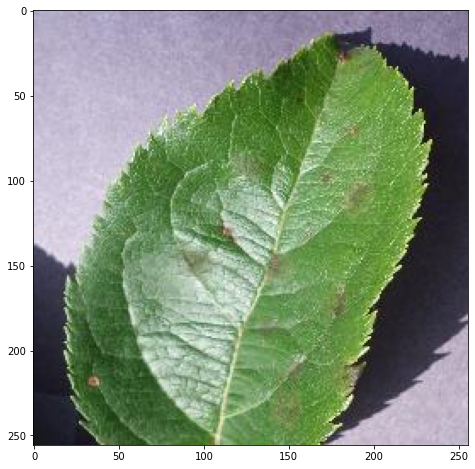

In [171]:
plt.figure(figsize=(12,8))
plt.imshow(imgRGB)
plt.show()

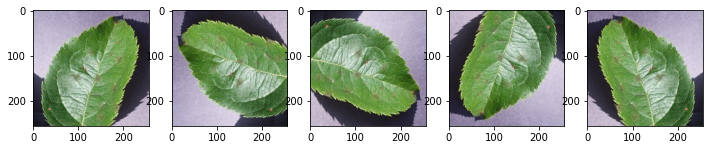

In [114]:
img90 = transform.rotate(imgRGB, angle=90)
imgNeg90 = transform.rotate(imgRGB, angle=-90)
img180 = transform.rotate(imgRGB, angle=180)
imgFlip = imgRGB[:, ::-1]

plt.figure(figsize=(12,8))
plt.subplot(1, 5, 1)
plt.imshow(imgRGB)
plt.subplot(1, 5, 2)
plt.imshow(img90)
plt.subplot(1, 5, 3)
plt.imshow(imgNeg90)
plt.subplot(1, 5, 4)
plt.imshow(img180)
plt.subplot(1, 5, 5)
plt.imshow(imgFlip)
plt.show()

In [115]:
#(img*255).astype(np.uint8)
#cv2.imwrite("outcast/" + str(1) + str(1) + ".jpg", cv2.cvtColor(imgFlip, cv2.COLOR_RGB2BGR))

# Image Segmentation Process Break Down 

In [181]:
img = cv2.imread('No_segment/Grape___Leaf_blight_(Isariopsis_Leaf_Spot)/793613df-550e-4ad9-9389-d9b8b4752703___FAM_L.Blight 4980.JPG') # 0 = grayscale
imgGRAY = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)  
# img.ndim
imgRGB = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)  

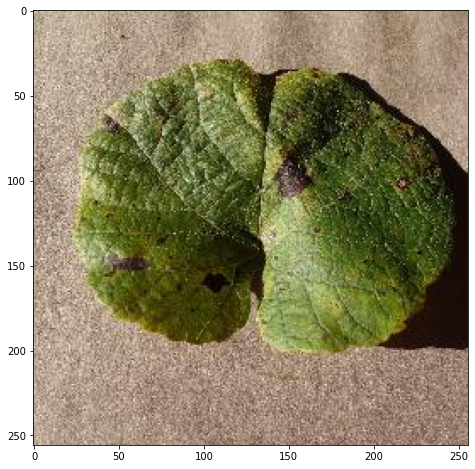

In [182]:
plt.figure(figsize=(12,8))
plt.imshow(imgRGB)
plt.show()

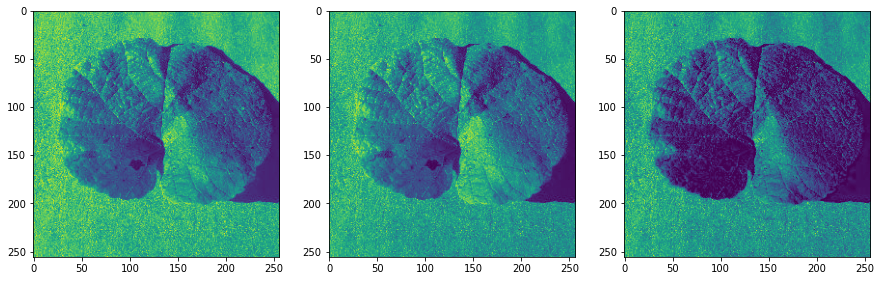

In [183]:
img_rgb = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
img_lab = cv2.cvtColor(img, cv2.COLOR_BGR2LAB)
img_hsv = cv2.cvtColor(img, cv2.COLOR_BGR2HSV)
# RGB Channel
R = img_rgb[:, :, 0]
G = img_rgb[:, :, 1]
B = img_rgb[:, :, 2]
fig, ax = plt.subplots(1,3, figsize=(15,15))
ax[0].imshow(R)
ax[1].imshow(G)
ax[2].imshow(B)

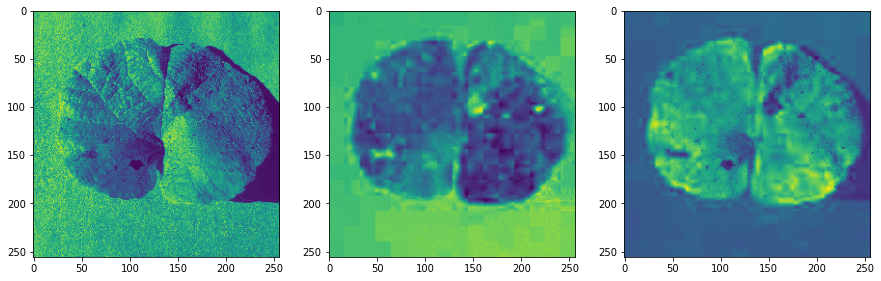

In [184]:
L = img_lab[:, :, 0]
a = img_lab[:, :, 1]
b = img_lab[:, :, 2]
fig, ax = plt.subplots(1,3, figsize=(15,15))
ax[0].imshow(L)
ax[1].imshow(a)
ax[2].imshow(b)

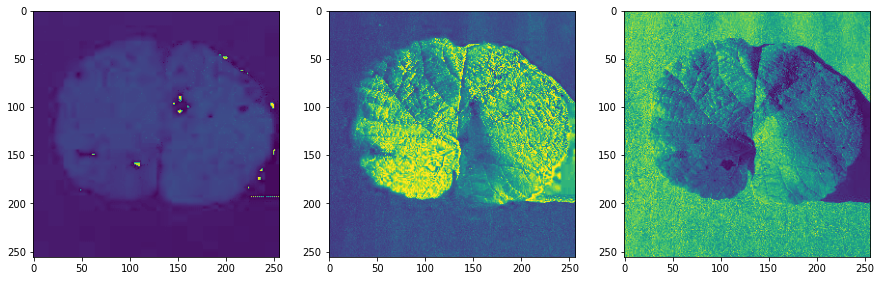

In [185]:
H = img_hsv[:, :, 0]
S = img_hsv[:, :, 1]
V = img_hsv[:, :, 2]
fig, ax = plt.subplots(1,3, figsize=(15,15))
ax[0].imshow(H)
ax[1].imshow(S)
ax[2].imshow(V)

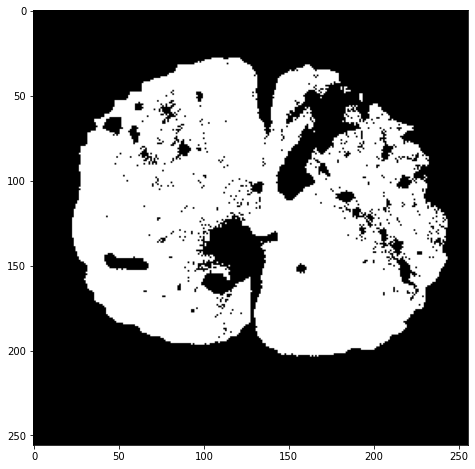

In [191]:
pixel_vals = b.flatten()
pixel_vals = np.float32(pixel_vals)
criteria = (cv2.TERM_CRITERIA_EPS + cv2.TERM_CRITERIA_MAX_ITER, 10, 1.0)
# Since we are interested in only actual leaf pixels, we choose 2 clusters
# one cluster for actual leaf pixels and other for unwanted background pixels.
K = 2
retval, labels, centers = cv2.kmeans(pixel_vals, K, None, criteria, 10, cv2.KMEANS_RANDOM_CENTERS)
centers = np.uint8(centers)
segmented_data = centers[labels.flatten()]
segmented_image = segmented_data.reshape((b.shape))
pixel_labels = labels.reshape(img_lab.shape[0], img_lab.shape[1])
# displaying segmented image
plt.figure(figsize=(12,8))
plt.imshow(segmented_image, cmap='gray')
plt.show()

In [192]:
np.unique(segmented_image)

array([140, 159], dtype=uint8)

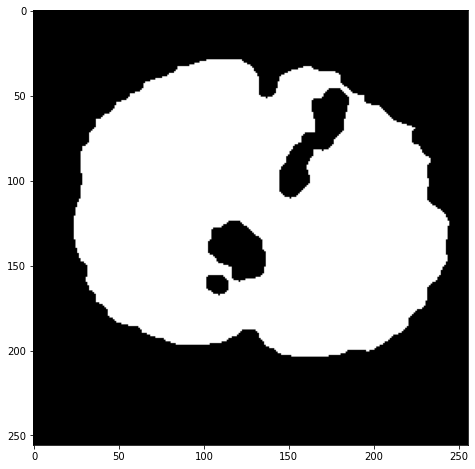

In [193]:
segmented_image[segmented_image == segmented_image.min()] = 0
segmented_image[segmented_image == segmented_image.max()] = 255
kernel = cv2.getStructuringElement(cv2.MORPH_ELLIPSE,(10,10))

res = cv2.morphologyEx(segmented_image,cv2.MORPH_CLOSE,kernel)

plt.figure(figsize=(12,8))
plt.imshow(res, cmap='gray')
plt.show()

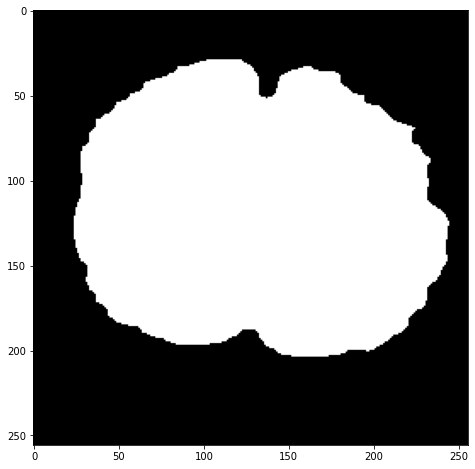

In [194]:
des = res.copy()
contour,hier = cv2.findContours(des,cv2.RETR_CCOMP,cv2.CHAIN_APPROX_SIMPLE)

for cnt in contour:
    cv2.drawContours(des,[cnt],0,255,-1)

gray = des

plt.figure(figsize=(12,8))
plt.imshow(gray, cmap='gray')
plt.show()

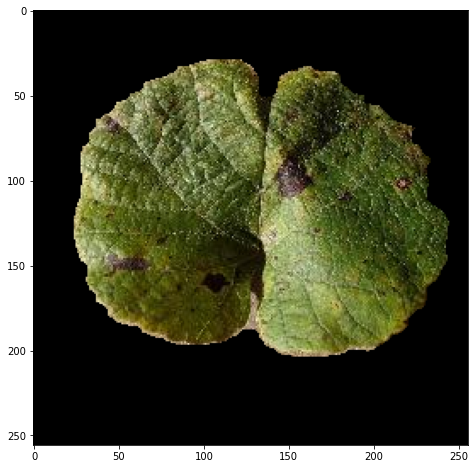

In [195]:
segmented = cv2.bitwise_and(imgRGB, imgRGB, mask=gray)

plt.figure(figsize=(12,8))
plt.imshow(segmented, cmap='gray')
plt.show()

In [128]:
from mpl_toolkits.mplot3d import Axes3D
from matplotlib import cm
from matplotlib import colors

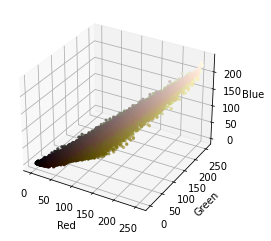

In [175]:
r, g, b = cv2.split(imgRGB)
fig = plt.figure()
axis = fig.add_subplot(1, 1, 1, projection="3d")

pixel_colors = imgRGB.reshape((np.shape(imgRGB)[0]*np.shape(imgRGB)[1], 3))
norm = colors.Normalize(vmin=-1.,vmax=1.)
norm.autoscale(pixel_colors)
pixel_colors = norm(pixel_colors).tolist()

axis.scatter(r.flatten(), g.flatten(), b.flatten(), facecolors=pixel_colors, marker=".")
axis.set_xlabel("Red")
axis.set_ylabel("Green")
axis.set_zlabel("Blue")
plt.show()

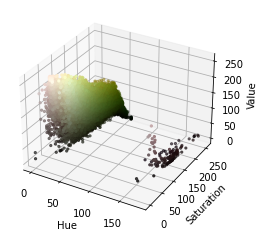

In [176]:
imgHSV = cv2.cvtColor(imgRGB, cv2.COLOR_RGB2HSV)

h, s, v = cv2.split(imgHSV)
fig = plt.figure()
axis = fig.add_subplot(1, 1, 1, projection="3d")

axis.scatter(h.flatten(), s.flatten(), v.flatten(), facecolors=pixel_colors, marker=".")
axis.set_xlabel("Hue")
axis.set_ylabel("Saturation")
axis.set_zlabel("Value")
plt.show()

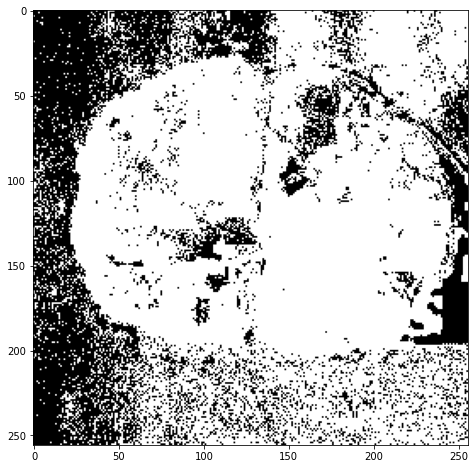

In [177]:
# find the green color 
mask_green = cv2.inRange(imgHSV, (36,15,0), (95,255,255))
# find the brown color
mask_brown = cv2.inRange(imgHSV, (8, 60, 20), (30, 255, 200))
# find the yellow color in the leaf
mask_yellow = cv2.inRange(imgHSV, (21, 39, 64), (40, 255, 255))

# find any of the three colors(green or brown or yellow) in the image
mask = cv2.bitwise_or(mask_green, mask_brown)
mask = cv2.bitwise_or(mask, mask_yellow)

plt.figure(figsize=(12,8))
plt.imshow(mask, cmap='gray')
plt.show()

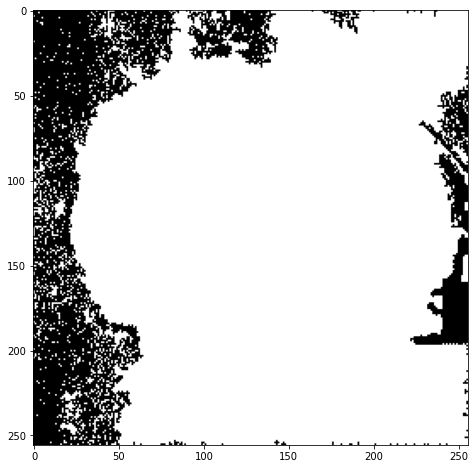

In [178]:
des = mask
contour,hier = cv2.findContours(des,cv2.RETR_CCOMP,cv2.CHAIN_APPROX_SIMPLE)

for cnt in contour:
    cv2.drawContours(des,[cnt],0,255,-1)

gray = des

plt.figure(figsize=(12,8))
plt.imshow(gray, cmap='gray')
plt.show()

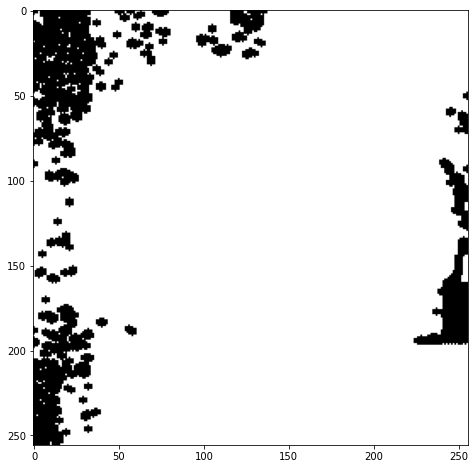

In [179]:
kernel = cv2.getStructuringElement(cv2.MORPH_ELLIPSE,(5,5))

res = cv2.morphologyEx(mask,cv2.MORPH_CLOSE,kernel)

plt.figure(figsize=(12,8))
plt.imshow(res, cmap='gray')
plt.show()

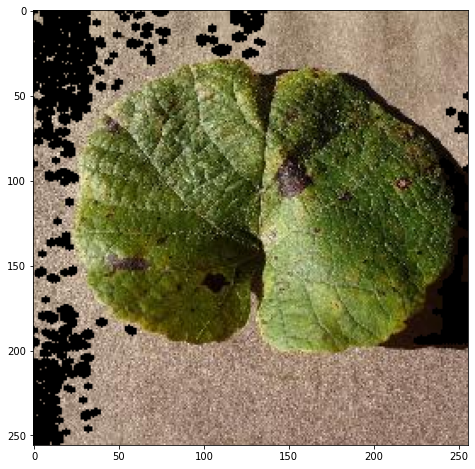

In [180]:
segmented = cv2.bitwise_and(imgRGB, imgRGB, mask=res)

plt.figure(figsize=(12,8))
plt.imshow(segmented, cmap='gray')
plt.show()

# Image Pre-processing Process Break Down 

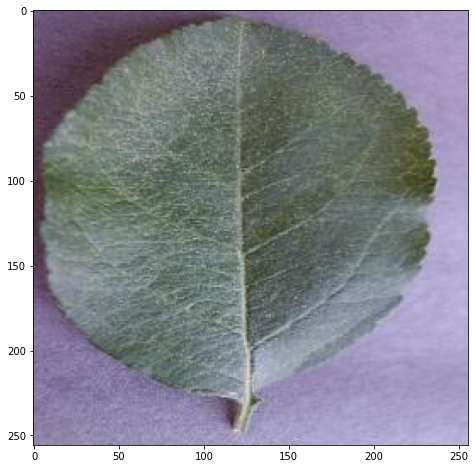

In [35]:
#img = cv2.imread('dataset/Apple___Black_rot/1c31a116-f51d-4f56-9c69-c26c5fe69f57___JR_FrgE.S 2844.JPG') # 0 = grayscale
img = cv2.imread('dataset/Apple___healthy/1ab74120-9cfd-47dd-9a80-ee37f2328be6___RS_HL 7667.JPG') # 0 = grayscale
#img = cv2.imread('dataset/Apple___Apple_scab/0a6812de-7416-4ffe-aba9-307599a02c84___FREC_Scab 2973.JPG') # 0 = grayscale

imgGRAY = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)  
# img.ndim
imgRGB = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)  
plt.figure(figsize=(12,8))
plt.imshow(imgRGB, cmap='gray')
plt.show()

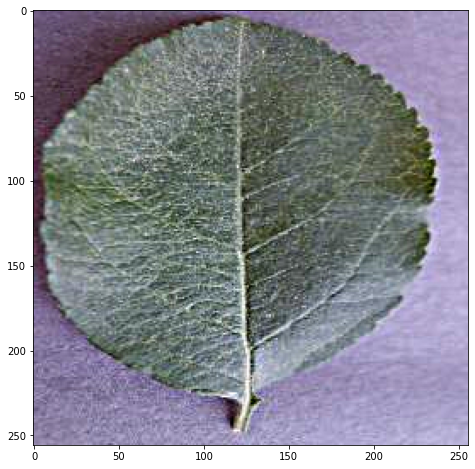

In [36]:
# Image sharpening
img_conv = imgRGB.astype('float32')

sm = cv2.blur(img_conv,(11,11))

details = img_conv - sm;
shp = img_conv + details;
shp = np.clip(np.float32(shp),0,255)
shp = shp.astype('uint8')

plt.figure(figsize=(12,8))
plt.imshow(shp, cmap='gray')
plt.show()

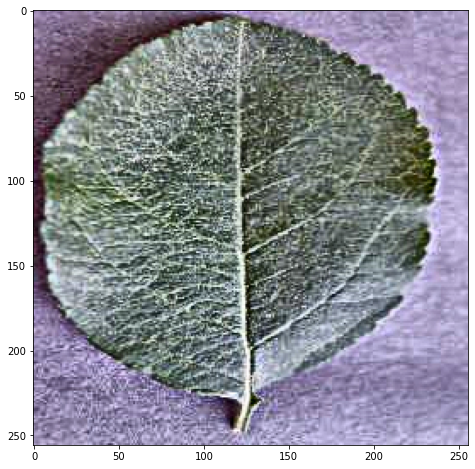

In [37]:
imgg = cv2.cvtColor(shp, cv2.COLOR_RGB2BGR)  
# converting to LAB color space
lab= cv2.cvtColor(imgg, cv2.COLOR_RGB2LAB)
l_channel, a, b = cv2.split(lab)

# Applying CLAHE to L-channel
# feel free to try different values for the limit and grid size:
clahe = cv2.createCLAHE(clipLimit=1.5, tileGridSize=(8,8))
cl = clahe.apply(l_channel)

# merge the CLAHE enhanced L-channel with the a and b channel
limg = cv2.merge((cl,a,b))

# Converting image from LAB Color model to BGR color spcae
img_contrast = cv2.cvtColor(limg, cv2.COLOR_LAB2BGR)

# Stacking the original image with the enhanced image
plt.figure(figsize=(12,8))
plt.imshow(img_contrast)
plt.show()

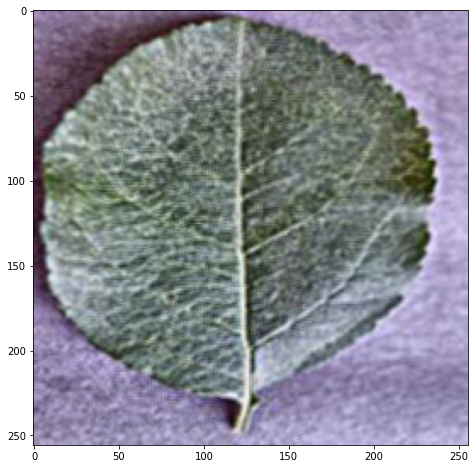

In [38]:
#blur = cv2.GaussianBlur(img_contrast,(5,5),cv2.BORDER_DEFAULT)
blur = cv2.blur(img_contrast,(3,3))
plt.figure(figsize=(12,8))
plt.imshow(blur)
plt.show()

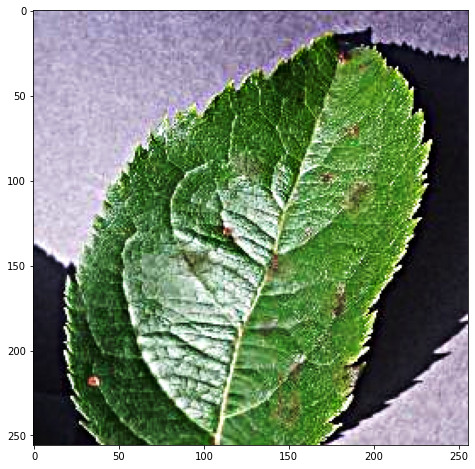

In [29]:
# Contrast Stretching / Enhancing
def stretchContrast(p,a1,a2,b1,b2):
    if (0 <= p and p <= a1): # if pixel less than a1
        return (b1 / a1)*p
    elif (a1 < p and p <= a2): # if pixel more than a1, less than a2
        return ((b2 - b1)/(a2 - a1)) * (p - a1) + b1
    else: # if pixel more than a2, less than 255
        return ((255 - b2)/(255 - a2)) * (p - a2) + b2
    
stretchContrast_vec = np.vectorize(stretchContrast)

a1 = 80 # low: bright
b1 = 50 # low: dark
a2 = 200 # low: bright
b2 = 200 # low: dark

contrast_stretched = stretchContrast_vec(shp, a1, a2, b1, b2)
img_contrast = contrast_stretched.astype('uint8')
plt.figure(figsize=(12,8))
plt.imshow(img_contrast, cmap='gray')
plt.show()

In [9]:
thrshld = 127
is_light = np.mean(shp) > thrshld
if not is_light:
    new_img = np.zeros(shp.shape, shp.dtype)

    contrast = 3
    bright = 2

    for y in range(shp.shape[0]):
        for x in range(shp.shape[1]):
            for c in range(shp.shape[2]):
                new_img[y,x,c]=np.clip(contrast*shp[y,x,c]+bright, 0, 255)

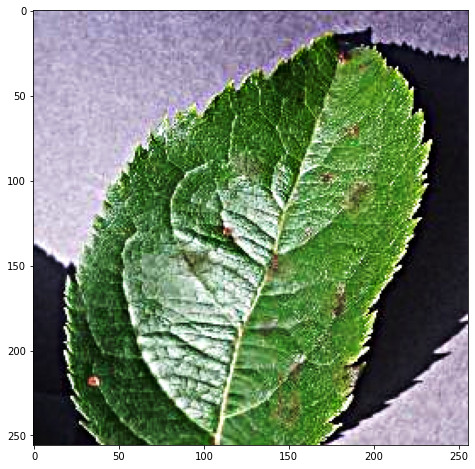

Before:  (256, 256, 3)
After:  (256, 256, 3)


In [10]:
# Resizing
resized = cv2.resize(img_contrast, (256,256), interpolation = cv2.INTER_AREA)

plt.figure(figsize=(12,8))
plt.imshow(resized, cmap='gray')
plt.show()

print("Before: " , resized.shape)
print("After: " , resized.shape)